# Generative Modelling

<p style="font-size:20px">Generative models, or deep generative models, are a class of deep learning models that learn the underlying data distribution from the sample. These models can be used to reduce data into its fundamental properties, or to generate new samples of data with new and varied properties</p>

# Generative Adversarial Networks

<p style="font-size:20px">Generative adversarial networks are implicit likelihood models that generate data samples from the statistical distribution of the data. They’re used to copy variations within the dataset. They use a combination of two networks: generator and discriminator.</p>
<br>
<img src="https://miro.medium.com/v2/resize:fit:720/1*9jwIuW0KPi3THIvoYg9BUQ.png" />



## <u> The Generator: </u>
<p style="font-size:20px">A generator network takes a random normal distribution (z), and outputs a generated sample that’s close to the original distribution.</p>

## <u> The Discriminator: </u>
<p style="font-size:20px">A discriminator tries to evaluate the output generated by the generator with the original sample, and outputs a value between 0 and 1. If the value is close to 0, then the generated sample is fake, and if the value is close to 1 then the generated sample is real.</p>

## <u> What the Entire thing looks like: </u>

<br><img src="https://s3.amazonaws.com/kajabi-storefronts-production/blogs/12746/images/iAOOdduQyCICwiv31aHa_dcgan.png">

## <u> How do GANs work ? </u>

<p style="font-size:20px">A random normal distribution is fed into the generator. The generator then outputs a random distribution, since it doesn’t have a reference point. <br>
Meanwhile, an actual sample, or ground truth, is fed into the discriminator. The discriminator learns the distribution of the actual sample. When the generated sample from the generator is fed into the discriminator, it evaluates the distribution.<br>
If the distribution of the generated sample is close to the original sample, then the discriminator outputs a value close to ‘1’ = real. If both the distribution doesn’t match or they aren’t even close to each other, then the discriminator outputs a value close to ‘0’ = fake.</p>

## <u> The Minimax setting </u>

<br><img src="https://static.packt-cdn.com/products/9781789139907/graphics/bf03e5ab-69ac-424d-84a7-48ea85e616ec.png" style="width:900px; height:150px;">

<p style="font-size:20px">The answer lies in the loss function or the value function; it measures the distance between the distribution of the data generated and the distribution of the real data. Both the generator and the discriminator have their own loss functions. The generator tries to minimize the loss function while the discriminator tries to maximize.</p>

# Setup

**In this project, I have used**
* Numpy and Tensorflow for Mathematical Operations
* Matplotlib and OpenCV for Image data handling and Visualization
* Keras for the Neural Networks

In [17]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers.legacy import Adam
except:
    from keras.optimizers import Adam

In [18]:
NOISE_DIM = 100  
BATCH_SIZE = 4 
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [19]:
MAIN_DIR = "/Users/elizabethnemeti/Desktop/filtered_brightest_slices"

# Loading and Preprocessing the Images

In [20]:
def load_images(folder):
    imgs = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder, i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128, 128))
            imgs.append(img)
        except Exception as e:
            print(f"Failed to process image {img_dir}: {e}")
            continue
    
    imgs = np.array(imgs)
    return imgs

In [21]:
data = load_images(MAIN_DIR)
data.shape

(189, 128, 128)

## Generate 20 random numbers to index images from data

In [22]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)

In [23]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

## Normalize and Reshape the Data

In [24]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images 
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

## Plotting The Real Images

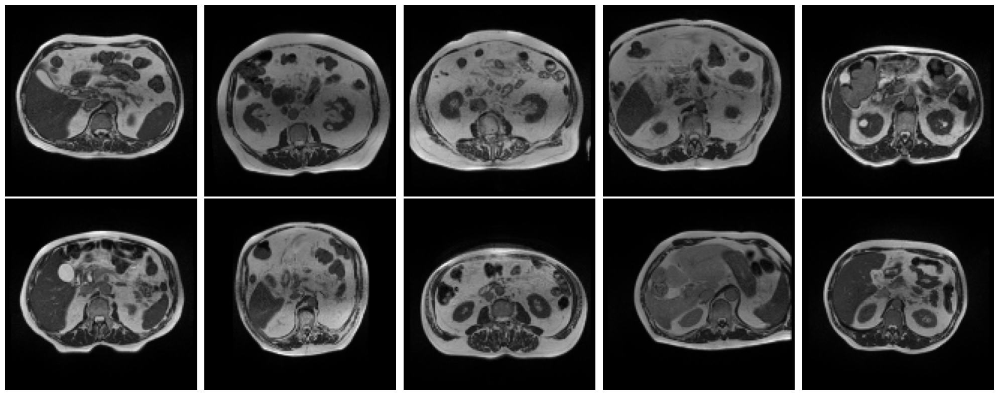

In [25]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

# The Architecture

In [26]:
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model

In [27]:
def build_discriminator():
    
    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

# Putting it together

In [28]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       147584    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 256)   

In [29]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')    
                                                                            
        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## The Training

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 459ms/step


  0%|                                                                                                              | 1/3750 [00:02<2:28:34,  2.38s/it]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                              | 2/3750 [00:02<1:05:31,  1.05s/it]

1/1 [==============================] - 0s 8ms/step


  0%|                                                                                                                | 3/3750 [00:02<38:37,  1.62it/s]

1/1 [==============================] - 0s 8ms/step


  0%|                                                                                                                | 4/3750 [00:02<26:23,  2.37it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▏                                                                                                               | 5/3750 [00:02<19:13,  3.25it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▏                                                                                                               | 6/3750 [00:02<14:55,  4.18it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▏                                                                                                               | 7/3750 [00:03<12:13,  5.10it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 8/3750 [00:03<10:28,  5.96it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                               | 9/3750 [00:03<09:15,  6.73it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 10/3750 [00:03<08:27,  7.37it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 11/3750 [00:03<07:54,  7.88it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▎                                                                                                              | 12/3750 [00:03<08:36,  7.24it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 13/3750 [00:03<08:01,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 14/3750 [00:03<07:37,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 15/3750 [00:03<07:21,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:04<07:12,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 17/3750 [00:04<07:01,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▌                                                                                                              | 18/3750 [00:04<06:53,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▌                                                                                                              | 19/3750 [00:04<06:48,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▌                                                                                                              | 20/3750 [00:04<06:43,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▌                                                                                                              | 21/3750 [00:04<06:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▋                                                                                                              | 22/3750 [00:04<06:38,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▋                                                                                                              | 23/3750 [00:04<06:36,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 24/3750 [00:04<06:34,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▋                                                                                                              | 25/3750 [00:05<06:36,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 26/3750 [00:05<06:36,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 27/3750 [00:05<06:32,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 28/3750 [00:05<06:29,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 29/3750 [00:05<06:26,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 30/3750 [00:05<06:24,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 31/3750 [00:05<06:22,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 32/3750 [00:05<06:21,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  1%|▉                                                                                                              | 33/3750 [00:05<06:20,  9.77it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 34/3750 [00:05<06:26,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 35/3750 [00:06<06:26,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 36/3750 [00:06<06:24,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 37/3750 [00:06<06:22,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 38/3750 [00:06<06:21,  9.72it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▏                                                                                                             | 39/3750 [00:06<06:21,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 40/3750 [00:06<06:20,  9.74it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▏                                                                                                             | 41/3750 [00:06<06:20,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▏                                                                                                             | 42/3750 [00:06<06:19,  9.78it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▎                                                                                                             | 43/3750 [00:06<06:21,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▎                                                                                                             | 44/3750 [00:06<06:20,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▎                                                                                                             | 45/3750 [00:07<06:20,  9.74it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▎                                                                                                             | 46/3750 [00:07<06:19,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 47/3750 [00:07<06:19,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 48/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▍                                                                                                             | 49/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▍                                                                                                             | 50/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▌                                                                                                             | 51/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▌                                                                                                             | 52/3750 [00:07<06:19,  9.74it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▌                                                                                                             | 53/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 54/3750 [00:07<06:18,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  1%|█▋                                                                                                             | 55/3750 [00:08<06:20,  9.71it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 56/3750 [00:08<06:28,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▋                                                                                                             | 57/3750 [00:08<06:26,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▋                                                                                                             | 58/3750 [00:08<06:24,  9.61it/s]

1/1 [==============================] - 0s 7ms/step


  2%|█▋                                                                                                             | 59/3750 [00:08<06:20,  9.69it/s]

1/1 [==============================] - 0s 7ms/step


  2%|█▊                                                                                                             | 60/3750 [00:08<06:19,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 61/3750 [00:08<06:19,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 62/3750 [00:08<06:19,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 63/3750 [00:08<06:18,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 64/3750 [00:09<06:18,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  2%|█▉                                                                                                             | 65/3750 [00:09<06:20,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 66/3750 [00:09<06:20,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 67/3750 [00:09<06:19,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██                                                                                                             | 68/3750 [00:09<06:18,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██                                                                                                             | 69/3750 [00:09<06:17,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██                                                                                                             | 70/3750 [00:09<06:18,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██                                                                                                             | 71/3750 [00:09<06:18,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 72/3750 [00:09<06:17,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 73/3750 [00:09<06:16,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 74/3750 [00:10<06:16,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 75/3750 [00:10<06:18,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 76/3750 [00:10<06:17,  9.73it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 77/3750 [00:10<06:32,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 78/3750 [00:10<06:42,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 79/3750 [00:10<06:52,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 80/3750 [00:10<06:46,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▍                                                                                                            | 81/3750 [00:10<06:40,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▍                                                                                                            | 82/3750 [00:10<06:33,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▍                                                                                                            | 83/3750 [00:11<06:29,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▍                                                                                                            | 84/3750 [00:11<06:28,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▌                                                                                                            | 85/3750 [00:11<07:05,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 86/3750 [00:11<07:01,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▌                                                                                                            | 87/3750 [00:11<06:49,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▌                                                                                                            | 88/3750 [00:11<06:40,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 89/3750 [00:11<06:34,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 90/3750 [00:11<06:29,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 91/3750 [00:11<06:24,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 92/3750 [00:12<06:21,  9.59it/s]

1/1 [==============================] - 0s 7ms/step


  2%|██▊                                                                                                            | 93/3750 [00:12<06:21,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▊                                                                                                            | 94/3750 [00:12<06:19,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▊                                                                                                            | 95/3750 [00:12<06:17,  9.67it/s]

1/1 [==============================] - 0s 7ms/step


  3%|██▊                                                                                                            | 96/3750 [00:12<06:15,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▊                                                                                                            | 97/3750 [00:12<06:30,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 98/3750 [00:12<06:36,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                            | 99/3750 [00:12<06:29,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 100/3750 [00:12<06:25,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 101/3750 [00:12<06:22,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 102/3750 [00:13<06:19,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 103/3750 [00:13<06:21,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 104/3750 [00:13<06:22,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 105/3750 [00:13<06:22,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 106/3750 [00:13<06:23,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▏                                                                                                          | 107/3750 [00:13<06:20,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▏                                                                                                          | 108/3750 [00:13<06:23,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▏                                                                                                          | 109/3750 [00:13<06:20,  9.58it/s]

1/1 [==============================] - 0s 7ms/step


  3%|███▏                                                                                                          | 110/3750 [00:13<06:17,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 111/3750 [00:14<06:15,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 112/3750 [00:14<06:14,  9.71it/s]

1/1 [==============================] - 0s 7ms/step


  3%|███▎                                                                                                          | 113/3750 [00:14<06:12,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  3%|███▎                                                                                                          | 114/3750 [00:14<06:12,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 115/3750 [00:14<06:14,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 116/3750 [00:14<06:13,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 117/3750 [00:14<06:12,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 118/3750 [00:14<06:13,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 119/3750 [00:14<06:13,  9.73it/s]

1/1 [==============================] - 0s 7ms/step


  3%|███▌                                                                                                          | 120/3750 [00:14<06:12,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  3%|███▌                                                                                                          | 121/3750 [00:15<06:11,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 122/3750 [00:15<06:11,  9.78it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 123/3750 [00:15<06:11,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 124/3750 [00:15<06:13,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 125/3750 [00:15<06:13,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 126/3750 [00:15<06:13,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 127/3750 [00:15<06:12,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 128/3750 [00:15<06:12,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 129/3750 [00:15<06:12,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 130/3750 [00:15<06:11,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 131/3750 [00:16<06:11,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▊                                                                                                          | 132/3750 [00:16<06:11,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 133/3750 [00:16<06:13,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 134/3750 [00:16<06:12,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 135/3750 [00:16<06:12,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 136/3750 [00:16<06:11,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 137/3750 [00:16<06:10,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 138/3750 [00:16<06:10,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  4%|████                                                                                                          | 139/3750 [00:16<06:09,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 140/3750 [00:16<06:09,  9.78it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 141/3750 [00:17<06:09,  9.78it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 142/3750 [00:17<06:11,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 143/3750 [00:17<06:10,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 144/3750 [00:17<06:10,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 145/3750 [00:17<06:10,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 146/3750 [00:17<06:09,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 147/3750 [00:17<06:09,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 148/3750 [00:17<06:08,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 149/3750 [00:17<06:08,  9.77it/s]

1/1 [==============================] - 0s 7ms/step


  4%|████▍                                                                                                         | 150/3750 [00:18<06:07,  9.79it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 151/3750 [00:18<06:11,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 152/3750 [00:18<06:11,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 153/3750 [00:18<06:10,  9.71it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▌                                                                                                         | 154/3750 [00:18<06:14,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 155/3750 [00:18<06:12,  9.66it/s]

1/1 [==============================] - 0s 7ms/step


  4%|████▌                                                                                                         | 156/3750 [00:18<06:11,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 157/3750 [00:18<06:10,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 158/3750 [00:18<06:08,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 159/3750 [00:18<06:08,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 160/3750 [00:19<06:15,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 161/3750 [00:19<06:17,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 162/3750 [00:19<06:31,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 163/3750 [00:19<06:39,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▊                                                                                                         | 164/3750 [00:19<06:32,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▊                                                                                                         | 165/3750 [00:19<06:27,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▊                                                                                                         | 166/3750 [00:19<06:21,  9.39it/s]

1/1 [==============================] - 0s 7ms/step


  4%|████▉                                                                                                         | 167/3750 [00:19<06:20,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 168/3750 [00:19<06:28,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:20<06:35,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


  5%|████▉                                                                                                         | 170/3750 [00:20<06:34,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████                                                                                                         | 171/3750 [00:20<06:28,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████                                                                                                         | 172/3750 [00:20<06:22,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████                                                                                                         | 173/3750 [00:20<06:24,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████                                                                                                         | 174/3750 [00:20<06:20,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:20<06:20,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:20<06:20,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:20<06:26,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:21<06:33,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:21<06:36,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:21<06:28,  9.20it/s]

1/1 [==============================] - 0s 7ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:21<06:20,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:21<06:21,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:21<06:29,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:21<06:28,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:21<06:21,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:21<06:16,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:21<06:13,  9.55it/s]

1/1 [==============================] - 0s 7ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:22<06:19,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:22<06:28,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:22<06:35,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:22<06:36,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:22<06:29,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:22<06:21,  9.33it/s]

1/1 [==============================] - 0s 7ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:22<06:16,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:22<06:24,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:22<06:33,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:23<06:32,  9.05it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:23<06:34,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:23<06:33,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:23<06:25,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:23<06:18,  9.38it/s]

1/1 [==============================] - 0s 7ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:23<06:13,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:23<06:10,  9.57it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:23<06:20,  9.31it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██████                                                                                                        | 205/3750 [00:23<06:38,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


  5%|██████                                                                                                        | 206/3750 [00:24<06:31,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████                                                                                                        | 207/3750 [00:24<06:25,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████                                                                                                        | 208/3750 [00:24<06:20,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:24<06:15,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:24<06:12,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:24<06:19,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:24<06:27,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:24<06:21,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:24<06:15,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:25<06:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:25<06:30,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:25<06:25,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:25<06:18,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:25<06:13,  9.46it/s]

1/1 [==============================] - 0s 7ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:25<06:10,  9.53it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:25<06:20,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:25<06:25,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:25<06:21,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:25<06:14,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:26<06:20,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:26<06:37,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:26<06:34,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:26<06:35,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:26<06:34,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:26<06:33,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:26<06:30,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:26<06:24,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:26<06:22,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:27<06:34,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:27<06:43,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:27<06:50,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:27<06:57,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:27<07:02,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 239/3750 [00:27<07:04,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 240/3750 [00:27<07:09,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 241/3750 [00:27<07:09,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 242/3750 [00:28<07:10,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:28<07:16,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:28<07:13,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:28<07:10,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:28<07:02,  8.28it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:28<07:26,  7.84it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:28<07:38,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:28<07:25,  7.86it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:29<07:10,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:29<06:53,  8.46it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:29<06:40,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:29<06:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:29<06:24,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:29<06:17,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:29<06:12,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:29<06:09,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:29<06:07,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:30<06:10,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:30<06:07,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:30<06:05,  9.54it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:30<06:08,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:30<06:10,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:30<06:11,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:30<06:08,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:30<06:05,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:30<06:04,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:30<06:03,  9.59it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:31<06:05,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:31<06:05,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:31<06:04,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:31<06:03,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████                                                                                                      | 273/3750 [00:31<06:01,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████                                                                                                      | 274/3750 [00:31<06:00,  9.63it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 275/3750 [00:31<06:09,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 276/3750 [00:31<06:21,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:31<06:20,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:32<06:15,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:32<06:13,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:32<06:13,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:32<06:08,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:32<06:05,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:32<06:02,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:32<06:00,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:32<06:05,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:32<06:03,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:32<06:01,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:33<05:59,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:33<06:00,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:33<05:58,  9.66it/s]

1/1 [==============================] - 0s 7ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:33<05:56,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:33<05:54,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:33<05:54,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:33<05:54,  9.75it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:33<06:05,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:33<06:03,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:34<06:00,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:34<05:59,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:34<05:57,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:34<05:56,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:34<05:55,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:34<05:54,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:34<05:55,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:34<05:54,  9.72it/s]

1/1 [==============================] - 0s 7ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:34<05:53,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:34<05:57,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 307/3750 [00:35<05:58,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 308/3750 [00:35<05:56,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 309/3750 [00:35<05:55,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 310/3750 [00:35<05:54,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 311/3750 [00:35<05:53,  9.72it/s]

1/1 [==============================] - 0s 7ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:35<05:53,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:35<05:52,  9.74it/s]

1/1 [==============================] - 0s 7ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:35<05:53,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:35<05:52,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:35<05:53,  9.70it/s]

1/1 [==============================] - 0s 7ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:36<05:52,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:36<05:52,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:36<05:51,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:36<05:51,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:36<05:52,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:36<05:51,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:36<05:51,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:36<05:52,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:36<05:54,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:37<05:53,  9.68it/s]

1/1 [==============================] - 0s 7ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:37<05:52,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:37<05:53,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:37<05:52,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:37<05:56,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:37<05:54,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:37<05:53,  9.68it/s]

1/1 [==============================] - 0s 7ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:37<05:53,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:37<05:54,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:37<05:54,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:38<05:53,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:38<05:52,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:38<05:52,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:38<05:52,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:38<05:51,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 341/3750 [00:38<05:50,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 342/3750 [00:38<05:49,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 343/3750 [00:38<05:50,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 344/3750 [00:38<05:50,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 345/3750 [00:38<05:50,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:39<05:50,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:39<05:49,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:39<05:50,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:39<05:52,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:39<05:54,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:39<05:52,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:39<05:55,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:39<05:55,  9.56it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:39<05:57,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:40<06:00,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:40<06:02,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:40<06:01,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:40<05:58,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:40<05:59,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:40<05:57,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:40<05:56,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:40<05:53,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:40<05:52,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:40<05:51,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:41<05:50,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:41<05:48,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:41<05:49,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:41<05:48,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:41<05:53,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:41<05:53,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:41<05:51,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:41<05:49,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:41<05:48,  9.69it/s]

1/1 [==============================] - 0s 7ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:41<05:47,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 375/3750 [00:42<05:46,  9.75it/s]

1/1 [==============================] - 0s 7ms/step


 10%|███████████                                                                                                   | 376/3750 [00:42<05:45,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 377/3750 [00:42<05:45,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 378/3750 [00:42<05:45,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 379/3750 [00:42<05:45,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:42<05:47,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:42<05:46,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:42<05:47,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:42<05:46,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:43<05:46,  9.70it/s]

1/1 [==============================] - 0s 7ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:43<05:44,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:43<05:45,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:43<05:44,  9.75it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:43<05:45,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:43<05:48,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:43<05:46,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:43<05:46,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:43<05:45,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:43<05:45,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:44<05:44,  9.73it/s]

1/1 [==============================] - 0s 7ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:44<05:44,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:44<05:44,  9.73it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:44<05:43,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:44<05:46,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:44<05:44,  9.71it/s]

1/1 [==============================] - 0s 7ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:44<05:43,  9.74it/s]

1/1 [==============================] - 0s 7ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:44<05:43,  9.74it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:44<05:44,  9.73it/s]

1/1 [==============================] - 0s 7ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:44<05:42,  9.77it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:45<05:42,  9.76it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:45<05:42,  9.76it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:45<05:44,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:45<05:44,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:45<05:46,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:45<05:45,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 410/3750 [00:45<05:44,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 411/3750 [00:45<05:44,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 412/3750 [00:45<05:44,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 413/3750 [00:45<05:43,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:46<05:43,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:46<05:44,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:46<05:47,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:46<05:49,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:46<05:51,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:46<05:51,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:46<05:50,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:46<05:51,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:46<05:51,  9.47it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:47<06:09,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:47<06:08,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:47<06:02,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:47<06:02,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:47<05:58,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:47<05:54,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:47<05:50,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:47<05:49,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:47<05:47,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:48<05:45,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:48<05:43,  9.65it/s]

1/1 [==============================] - 0s 7ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:48<05:42,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:48<05:45,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:48<05:47,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:48<05:46,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:48<05:45,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:48<05:43,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:48<05:45,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:48<05:49,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:49<05:46,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:49<05:43,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:49<05:44,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:49<05:43,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:49<05:43,  9.63it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:49<05:47,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:49<05:45,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:49<05:54,  9.31it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:49<06:03,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:50<06:01,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:50<05:56,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:50<05:55,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:50<05:51,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:50<05:52,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:50<05:53,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:50<05:53,  9.32it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:50<06:10,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:50<06:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:51<06:23,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:51<06:14,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:51<06:15,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:51<06:13,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:51<06:04,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:51<06:05,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:51<06:13,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:51<06:22,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:51<06:21,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:52<06:32,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:52<06:29,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:52<06:27,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:52<06:24,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:52<06:20,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:52<06:17,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:52<06:15,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:52<06:17,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:52<06:19,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 478/3750 [00:53<06:23,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 479/3750 [00:53<06:32,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 480/3750 [00:53<06:30,  8.37it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████                                                                                                | 481/3750 [00:53<06:36,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:53<06:38,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:53<06:40,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:53<06:41,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:53<06:40,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:54<06:35,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:54<06:35,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:54<06:35,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:54<06:34,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:54<06:33,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:54<06:21,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:54<06:20,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:54<06:17,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:55<06:08,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:55<06:02,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:55<05:54,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:55<06:03,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:55<06:14,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:55<06:13,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:55<06:19,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:55<06:22,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:55<06:24,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 503/3750 [00:56<06:29,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 504/3750 [00:56<06:37,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 13%|██████████████▊                                                                                               | 505/3750 [00:56<06:46,  7.99it/s]

1/1 [==============================] - 0s 12ms/step


 13%|██████████████▊                                                                                               | 506/3750 [00:56<06:47,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▊                                                                                               | 507/3750 [00:56<06:44,  8.01it/s]

1/1 [==============================] - 0s 12ms/step


 14%|██████████████▉                                                                                               | 508/3750 [00:56<06:43,  8.04it/s]

1/1 [==============================] - 0s 13ms/step


 14%|██████████████▉                                                                                               | 509/3750 [00:56<06:38,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 510/3750 [00:56<06:33,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 511/3750 [00:57<06:28,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 512/3750 [00:57<06:26,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 513/3750 [00:57<06:27,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 514/3750 [00:57<06:32,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 515/3750 [00:57<06:33,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 516/3750 [00:57<06:36,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 517/3750 [00:57<06:40,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 518/3750 [00:57<06:31,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 519/3750 [00:58<06:18,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 520/3750 [00:58<06:09,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 521/3750 [00:58<06:01,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 522/3750 [00:58<05:54,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [00:58<05:49,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 524/3750 [00:58<05:43,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 525/3750 [00:58<05:46,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 526/3750 [00:58<05:47,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 527/3750 [00:58<06:01,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▍                                                                                              | 528/3750 [00:59<06:12,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 529/3750 [00:59<06:18,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 530/3750 [00:59<06:18,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 531/3750 [00:59<06:21,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▌                                                                                              | 532/3750 [00:59<06:27,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 533/3750 [00:59<06:26,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 534/3750 [00:59<06:16,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 535/3750 [00:59<06:05,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 536/3750 [00:59<06:02,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 537/3750 [01:00<05:57,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 538/3750 [01:00<05:56,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:00<05:54,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:00<05:54,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:00<05:51,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:00<05:47,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:00<05:42,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:00<05:38,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:00<05:36,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████                                                                                              | 546/3750 [01:01<05:34,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████                                                                                              | 547/3750 [01:01<05:37,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████                                                                                              | 548/3750 [01:01<05:45,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 549/3750 [01:01<05:55,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:01<06:04,  8.77it/s]

1/1 [==============================] - 0s 19ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:01<06:26,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:01<06:24,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:01<06:24,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:01<06:31,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:02<06:30,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:02<06:30,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:02<06:25,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:02<06:17,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:02<06:10,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:02<06:03,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:02<06:07,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:02<06:12,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:03<06:18,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:03<06:21,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:03<06:21,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:03<06:23,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:03<06:21,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:03<06:24,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:03<06:27,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:03<06:30,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:04<06:32,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:04<06:35,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:04<06:31,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:04<06:29,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:04<06:28,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:04<06:28,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:04<06:26,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:04<06:26,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:04<06:26,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:05<06:28,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:05<06:42,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:05<06:38,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:05<06:35,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:05<06:33,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:05<06:29,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:05<06:26,  8.18it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:05<06:28,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:06<06:27,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:06<06:15,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:06<06:04,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:06<05:53,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:06<05:50,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:06<05:42,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:06<05:36,  9.37it/s]

1/1 [==============================] - 0s 7ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:06<05:33,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:06<05:30,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:07<05:28,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:07<05:29,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:07<05:30,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:07<05:28,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:07<05:27,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:07<05:26,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:07<05:25,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:07<05:25,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:07<05:24,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:07<05:24,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:08<05:26,  9.64it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:08<05:38,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:08<05:37,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:08<05:34,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:08<05:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:08<05:32,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:08<05:31,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:08<05:29,  9.53it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:08<05:36,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:09<05:37,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:09<06:05,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:09<06:01,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:09<06:09,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:09<06:05,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:09<05:54,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:09<05:44,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:09<05:37,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:09<05:33,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:10<05:37,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:10<05:32,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:10<05:31,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:10<05:28,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:10<05:26,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:10<05:24,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:10<05:22,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:10<05:26,  9.55it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:10<05:40,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:11<05:40,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:11<05:37,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:11<05:35,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:11<05:31,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:11<05:28,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:11<05:25,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:11<05:23,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:11<05:22,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:11<05:21,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:11<05:21,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:12<05:21,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:12<05:22,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:12<05:21,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:12<05:21,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:12<05:20,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:12<05:20,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:12<05:19,  9.70it/s]

1/1 [==============================] - 0s 7ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:12<05:18,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:12<05:18,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:12<05:18,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:13<05:22,  9.61it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:13<05:35,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:13<05:37,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:13<05:32,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:13<05:27,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:13<05:29,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:13<05:27,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:13<05:26,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:13<05:24,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:14<05:25,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:14<05:24,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:14<05:22,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:14<05:20,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:14<05:19,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:14<05:18,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:14<05:18,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:14<05:17,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:14<05:16,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:14<05:22,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:15<05:21,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:15<05:19,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:15<05:18,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:15<05:17,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:15<05:18,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:15<05:17,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:15<05:16,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:15<05:18,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:15<05:20,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:16<05:19,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:16<05:18,  9.62it/s]

1/1 [==============================] - 0s 7ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:16<05:17,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:16<05:17,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:16<05:16,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:16<05:15,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:16<05:15,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:16<05:15,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:16<05:16,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:16<05:16,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:17<05:16,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:17<05:16,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:17<05:20,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:17<05:19,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:17<05:17,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:17<05:17,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:17<05:16,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:17<05:15,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:17<05:16,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:17<05:15,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:18<05:15,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:18<05:15,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:18<05:14,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:18<05:15,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:18<05:14,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:18<05:14,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:18<05:13,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:18<05:15,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:18<05:14,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:19<05:15,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:19<05:14,  9.67it/s]

1/1 [==============================] - 0s 7ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:19<05:13,  9.70it/s]

1/1 [==============================] - 0s 7ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:19<05:13,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:19<05:17,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:19<05:15,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:19<05:13,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:19<05:14,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:19<05:14,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:19<05:14,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:20<05:13,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:20<05:12,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:20<05:21,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:20<05:32,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:20<05:38,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:20<05:31,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:20<05:28,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:20<05:23,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:20<05:20,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:21<05:17,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:21<05:15,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:21<05:14,  9.59it/s]

1/1 [==============================] - 0s 7ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:21<05:15,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:21<05:17,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:21<05:15,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:21<05:15,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:21<05:14,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:21<05:13,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:21<05:12,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:22<05:11,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:22<05:11,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:22<05:10,  9.69it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:22<05:11,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:22<05:10,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:22<05:15,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:22<05:13,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:22<05:12,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:22<05:12,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:23<05:17,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:23<05:29,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:23<05:31,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:23<05:25,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:23<05:21,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:23<05:19,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:23<05:17,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:23<05:14,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:23<05:13,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:23<05:11,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:24<05:11,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:24<05:11,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:24<05:13,  9.53it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:24<05:25,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:24<05:35,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:24<05:39,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:24<05:41,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:24<05:43,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:24<05:47,  8.58it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:25<06:48,  7.31it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:25<06:24,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:25<06:07,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:25<06:09,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:25<06:29,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:25<06:09,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:25<06:00,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:26<06:22,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:26<06:17,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:26<06:04,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:26<06:04,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:26<06:03,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:26<05:51,  8.44it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:26<05:40,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:26<05:32,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:26<05:24,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:27<05:19,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:27<05:14,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:27<05:12,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:27<05:10,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:27<05:11,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:27<05:09,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:27<05:08,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:27<05:08,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:27<05:08,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:27<05:07,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:28<05:06,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:28<05:06,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:28<05:06,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:28<05:05,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:28<05:05,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:28<05:05,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:28<05:07,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:28<05:06,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:28<05:06,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:29<05:11,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:29<05:09,  9.52it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:29<05:09,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:29<05:08,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:29<05:07,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:29<05:06,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:29<05:06,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:29<05:07,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:29<05:06,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:29<05:06,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:30<05:05,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:30<05:03,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:30<05:03,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:30<05:03,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:30<05:03,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:30<05:04,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:30<05:04,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:30<05:03,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:30<05:02,  9.68it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:31<05:04,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:31<05:03,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:31<05:02,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:31<05:01,  9.69it/s]

1/1 [==============================] - 0s 7ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:31<05:01,  9.71it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:31<05:03,  9.64it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:31<05:01,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:31<05:01,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:31<05:00,  9.70it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:31<05:00,  9.72it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:32<05:01,  9.67it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:32<05:02,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:32<05:01,  9.66it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:32<05:00,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:32<05:02,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:32<05:03,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:32<05:01,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:32<05:01,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:32<05:00,  9.68it/s]

1/1 [==============================] - 0s 7ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:32<05:00,  9.69it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:33<05:00,  9.68it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:33<04:59,  9.69it/s]

1/1 [==============================] - 0s 7ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:33<05:07,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:33<05:15,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:33<05:14,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:33<05:12,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:33<05:10,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:33<05:09,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:33<05:08,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:34<05:09,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:34<05:07,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:34<05:12,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:34<05:10,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:34<05:08,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:34<05:05,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:34<05:04,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:34<05:02,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:34<05:03,  9.53it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:35<05:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:35<05:23,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:35<05:16,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:35<05:13,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:35<05:14,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:35<05:10,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:35<05:11,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:35<05:14,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:35<05:21,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:35<05:23,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:36<05:17,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:36<05:12,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:36<05:15,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:36<05:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:36<05:21,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:36<05:15,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:36<05:09,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:36<05:07,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:36<05:04,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:37<05:06,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:37<05:05,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:37<05:13,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:37<05:10,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:37<05:09,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:37<05:10,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:37<05:06,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:37<05:04,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:37<05:07,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:38<05:09,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:38<05:08,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:38<05:05,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:38<05:06,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:38<05:03,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:38<05:02,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:38<05:00,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:38<04:58,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:38<04:56,  9.61it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:38<05:05,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:39<05:12,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:39<05:13,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:39<05:13,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:39<05:10,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:39<05:11,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:39<06:42,  7.07it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:39<06:12,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:39<05:56,  7.97it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:40<05:52,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:40<05:43,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:40<05:33,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:40<05:26,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:40<05:29,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:40<05:33,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:40<05:34,  8.48it/s]

1/1 [==============================] - 0s 12ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:40<05:37,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:41<05:35,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:41<05:36,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:41<05:34,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:41<05:34,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:41<05:28,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:41<05:23,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:41<05:21,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:41<05:23,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:41<05:24,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:42<05:21,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:42<05:23,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:42<05:19,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:42<05:21,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:42<05:19,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:42<05:18,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:42<05:19,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:42<05:16,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:42<05:16,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:43<05:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:43<05:13,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:43<05:17,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:43<05:21,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:43<05:17,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:43<05:13,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:43<05:11,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:43<05:09,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:43<05:08,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:44<05:05,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:44<05:04,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:44<05:04,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:44<05:09,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:44<05:10,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:44<05:09,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:44<05:09,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:44<05:09,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:44<05:06,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:45<05:04,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:45<05:01,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:45<05:00,  9.31it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:45<05:06,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:45<05:03,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:45<05:03,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:45<05:03,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:45<05:01,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:45<04:59,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:46<04:58,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:46<04:58,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:46<05:00,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:46<04:57,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:46<04:54,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:46<04:53,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:46<04:53,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:46<04:56,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:46<04:54,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:46<04:53,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:47<04:52,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:47<04:51,  9.54it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:47<05:03,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:47<05:00,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:47<04:57,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:47<04:55,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:47<04:54,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:47<04:53,  9.46it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:47<05:02,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:48<04:59,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:48<04:55,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:48<04:53,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:48<04:51,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:48<04:50,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:48<04:49,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:48<04:50,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:48<04:50,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:48<04:48,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:48<04:49,  9.56it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:49<04:50,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:49<04:49,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:49<04:50,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:49<04:49,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:49<04:48,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:49<04:49,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:49<04:48,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:49<04:47,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:49<04:46,  9.62it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:50<04:45,  9.65it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:50<04:45,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:50<04:47,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:50<04:54,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [01:50<04:59,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [01:50<05:04,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [01:50<05:05,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [01:50<05:00,  9.13it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [01:50<05:02,  9.08it/s]

1/1 [==============================] - 0s 13ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [01:51<05:13,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [01:51<05:09,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [01:51<05:09,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [01:51<05:03,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [01:51<04:57,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [01:51<04:53,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [01:51<04:53,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [01:51<04:52,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [01:51<04:58,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [01:52<04:57,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [01:52<05:02,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [01:52<05:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [01:52<05:00,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [01:52<05:01,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [01:52<04:59,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [01:52<05:00,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [01:52<05:06,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [01:52<05:04,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [01:53<05:12,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [01:53<05:10,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [01:53<05:08,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [01:53<05:08,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [01:53<05:10,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [01:53<05:14,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [01:53<05:12,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [01:53<05:07,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [01:53<05:07,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [01:54<05:05,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [01:54<05:03,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [01:54<05:00,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [01:54<04:57,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [01:54<04:55,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [01:54<04:53,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [01:54<04:53,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [01:54<04:51,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [01:54<04:48,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [01:55<04:50,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [01:55<04:53,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [01:55<04:55,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [01:55<04:57,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [01:55<04:59,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [01:55<04:59,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [01:55<04:58,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [01:55<04:56,  9.12it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [01:55<05:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [01:56<04:59,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [01:56<04:55,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [01:56<04:58,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [01:56<05:12,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [01:56<05:09,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [01:56<05:02,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [01:56<04:57,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [01:56<04:59,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [01:56<04:57,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [01:57<04:56,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [01:57<04:54,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [01:57<04:53,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [01:57<04:53,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [01:57<04:51,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [01:57<06:07,  7.30it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [01:57<05:43,  7.82it/s]

1/1 [==============================] - 0s 8ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [01:57<05:26,  8.22it/s]

1/1 [==============================] - 0s 8ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [01:57<05:17,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [01:58<05:14,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [01:58<05:06,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [01:58<05:03,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [01:58<05:06,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [01:58<05:09,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [01:58<05:04,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [01:58<05:00,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [01:58<04:56,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [01:58<04:50,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [01:59<04:52,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [01:59<04:54,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [01:59<04:53,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [01:59<04:51,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [01:59<04:56,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [01:59<04:52,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [01:59<04:47,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [01:59<04:47,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [01:59<04:44,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:00<04:42,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:00<04:41,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:00<04:40,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:00<04:40,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:00<04:38,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:00<04:39,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:00<04:45,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:00<04:49,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:00<04:47,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:01<04:44,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:01<04:44,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:01<04:42,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:01<04:41,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:01<04:40,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:01<04:39,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:01<04:39,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:01<04:39,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:01<04:40,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:01<04:39,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:02<04:38,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:02<04:37,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:02<04:35,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:02<04:36,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:02<04:36,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:02<04:35,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:02<04:34,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:02<04:36,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:02<04:36,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:03<04:34,  9.58it/s]

1/1 [==============================] - 0s 16ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:03<04:45,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:03<04:43,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:03<04:40,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:03<04:38,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:03<04:36,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:03<04:37,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:03<04:37,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:03<04:39,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:03<04:38,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:04<04:36,  9.48it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:04<04:40,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:04<04:38,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:04<04:37,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:04<04:35,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:04<04:34,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:04<04:35,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:04<04:34,  9.55it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:04<04:35,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:05<04:35,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:05<04:34,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:05<04:33,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:05<04:33,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:05<04:33,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:05<04:32,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:05<04:32,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:05<04:32,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:05<04:52,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:06<04:55,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:06<04:54,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:06<04:53,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:06<04:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:06<04:45,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:06<04:40,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:06<04:38,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:06<04:40,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:06<04:39,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:06<04:39,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:07<04:37,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:07<04:36,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:07<04:36,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:07<04:34,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:07<04:34,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:07<04:34,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:07<04:33,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:07<04:33,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:07<04:32,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:08<04:31,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:08<04:35,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:08<04:35,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:08<04:34,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:08<04:33,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:08<04:32,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:08<04:31,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:08<04:33,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:08<04:32,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:08<04:31,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:09<04:30,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:09<04:30,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:09<04:34,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:09<04:33,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:09<04:33,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:09<04:31,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:09<04:32,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:09<04:30,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:09<04:39,  9.19it/s]

1/1 [==============================] - 0s 11ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:10<05:02,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:10<05:12,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:10<05:21,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:10<05:27,  7.83it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:10<05:28,  7.82it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:10<05:28,  7.81it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:10<05:38,  7.58it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:11<05:33,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:11<05:19,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:11<05:07,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:11<04:55,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:11<04:46,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:11<04:48,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:11<04:47,  8.88it/s]

1/1 [==============================] - 0s 12ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:11<04:57,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:11<05:31,  7.70it/s]

1/1 [==============================] - 0s 29ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:12<06:07,  6.95it/s]

1/1 [==============================] - 0s 25ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:12<06:22,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:12<06:27,  6.58it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:12<06:20,  6.70it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:12<06:12,  6.85it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:12<06:06,  6.95it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:13<06:04,  6.98it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:13<06:02,  7.02it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:13<05:47,  7.33it/s]

1/1 [==============================] - 0s 11ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:13<05:31,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:13<05:16,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:13<05:07,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:13<05:02,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:13<04:58,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:13<04:55,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:14<04:51,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:14<04:48,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:14<04:46,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:14<04:44,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:14<04:47,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:14<04:49,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:14<04:49,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:14<04:42,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:14<04:38,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:15<04:35,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:15<04:31,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:15<04:31,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:15<04:29,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:15<04:28,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:15<04:29,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:15<04:36,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:15<04:35,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:15<04:36,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:16<04:33,  9.22it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:16<04:42,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:16<04:38,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:16<04:39,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:16<05:30,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:16<05:25,  7.73it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:16<05:12,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:16<04:59,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:17<04:50,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:17<04:41,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:17<04:37,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:17<04:33,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:17<04:31,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:17<04:29,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:17<04:29,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:17<04:27,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:17<04:25,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:17<04:23,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:18<04:22,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:18<04:21,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:18<04:23,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:18<04:29,  9.28it/s]

1/1 [==============================] - 0s 12ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:18<04:58,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:18<04:52,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:18<04:45,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:18<04:42,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:18<04:38,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:19<04:36,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:19<04:33,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:19<04:33,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:19<04:30,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:19<04:28,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:19<04:25,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:19<04:25,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:19<04:24,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:19<04:23,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:20<04:29,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:20<04:27,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:20<04:25,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:20<04:22,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:20<04:23,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:20<04:23,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:20<04:21,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:20<04:21,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:20<04:20,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:20<04:20,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:21<04:23,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:21<04:24,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:21<04:24,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:21<04:25,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:21<04:23,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:21<04:25,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:21<04:23,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:21<04:21,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:21<04:19,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:22<04:19,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:22<04:17,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:22<04:17,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:22<04:18,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:22<04:17,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:22<04:17,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:22<04:17,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:22<04:17,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:22<04:20,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:23<04:20,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:23<04:18,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:23<04:17,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:23<04:18,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:23<04:17,  9.53it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:23<04:18,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:23<04:22,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:23<04:20,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:23<04:19,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:23<04:18,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:24<04:16,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:24<04:16,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:24<04:17,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:24<04:16,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:24<04:19,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:24<04:17,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:24<04:17,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:24<04:15,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:24<04:14,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:24<04:14,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:25<04:13,  9.60it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:25<04:12,  9.63it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:25<04:13,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:25<04:13,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:25<04:13,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:25<04:13,  9.61it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:25<04:17,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:25<04:17,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:25<04:15,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:26<04:14,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:26<04:15,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:26<04:15,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:26<04:14,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:26<04:13,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:26<04:16,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:26<04:14,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:26<04:14,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:26<04:13,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:26<04:15,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:27<04:14,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:27<04:19,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:27<04:18,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:27<04:15,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:27<04:14,  9.46it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:27<04:17,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:27<04:18,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:27<04:19,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:27<04:20,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:28<04:17,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:28<04:15,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:28<04:17,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:28<04:16,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:28<04:15,  9.40it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:28<04:24,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:28<04:21,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:28<04:18,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:28<04:16,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:29<04:20,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:29<04:32,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:29<04:29,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:29<04:25,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:29<04:22,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:29<04:18,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:29<04:15,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:29<04:17,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:29<04:15,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:30<04:13,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:30<04:11,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:30<04:12,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:30<04:14,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:30<04:14,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:30<04:12,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:30<04:11,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:30<04:11,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:30<04:10,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:30<04:10,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:31<04:10,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:31<04:11,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:31<04:10,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:31<04:11,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:31<04:10,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:31<04:11,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:31<04:16,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:31<04:17,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:31<04:16,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:32<04:14,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:32<04:15,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:32<04:14,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:32<04:12,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:32<04:10,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:32<04:11,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:32<04:11,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:32<04:09,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:32<04:08,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:32<04:10,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:33<04:10,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:33<04:13,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:33<04:13,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:33<04:16,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:33<04:14,  9.25it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:33<04:22,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:33<04:19,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:33<04:17,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:33<04:16,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:34<04:14,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:34<04:17,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:34<04:15,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:34<04:12,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:34<04:20,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:34<04:17,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:34<04:14,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:34<04:11,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:34<04:09,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:35<04:08,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:35<04:08,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:35<04:09,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:35<04:07,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:35<04:06,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:35<04:06,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:35<04:05,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:35<04:05,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:35<04:05,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:35<04:04,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:36<04:04,  9.56it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:36<04:06,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:36<04:05,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:36<04:05,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:36<04:04,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:36<04:03,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:36<04:10,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:36<04:09,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:36<04:07,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:37<04:06,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:37<04:06,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:37<04:05,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:37<04:04,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:37<04:03,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:37<04:03,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:37<04:02,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:37<04:02,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:37<04:03,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:38<04:02,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:38<04:03,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:38<04:04,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:38<04:04,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:38<04:03,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:38<04:02,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:38<04:06,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:38<04:04,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:38<04:04,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:38<04:02,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:39<04:03,  9.48it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:39<04:07,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:39<04:06,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:39<04:04,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:39<04:03,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:39<04:04,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:39<04:06,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:39<04:05,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:39<04:03,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:40<04:02,  9.47it/s]

1/1 [==============================] - 0s 12ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:40<04:14,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:40<04:11,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:40<04:08,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:40<04:05,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:40<04:04,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:40<04:04,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:40<04:07,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:40<04:04,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:40<04:02,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:41<04:01,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:41<04:01,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:41<04:00,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:41<03:59,  9.52it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:41<04:01,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:41<04:00,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:41<03:59,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:41<04:04,  9.32it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:42<05:45,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:42<05:51,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:42<06:10,  6.15it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:42<05:36,  6.76it/s]

1/1 [==============================] - 0s 25ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:42<05:32,  6.84it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:42<05:11,  7.29it/s]

1/1 [==============================] - 0s 14ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:42<05:05,  7.45it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:43<04:51,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:43<04:42,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:43<04:33,  8.29it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:43<04:24,  8.56it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:43<04:19,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:43<04:19,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:43<04:14,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:43<04:13,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:43<04:11,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:44<04:09,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:44<04:07,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:44<04:07,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:44<04:07,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:44<04:06,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:44<04:08,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:44<04:05,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:44<04:04,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:44<04:04,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:45<04:03,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:45<04:01,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:45<04:00,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:45<03:58,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:45<03:57,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:45<04:15,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:45<04:26,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:45<04:33,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:45<04:42,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [02:46<04:46,  7.82it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [02:46<04:50,  7.73it/s]

1/1 [==============================] - 0s 12ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [02:46<04:40,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [02:46<04:29,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [02:46<04:26,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [02:46<04:33,  8.18it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [02:46<05:08,  7.26it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [02:47<05:38,  6.61it/s]

1/1 [==============================] - 0s 11ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [02:47<05:51,  6.36it/s]

1/1 [==============================] - 0s 11ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [02:47<05:57,  6.25it/s]

1/1 [==============================] - 0s 11ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [02:47<05:49,  6.40it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [02:47<05:36,  6.63it/s]

1/1 [==============================] - 0s 11ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [02:47<05:30,  6.76it/s]

1/1 [==============================] - 0s 12ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [02:47<05:28,  6.80it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [02:48<05:06,  7.28it/s]

1/1 [==============================] - 0s 12ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [02:48<04:54,  7.57it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [02:48<04:39,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [02:48<04:31,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [02:48<04:26,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [02:48<04:23,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [02:48<04:21,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [02:48<04:16,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [02:48<04:10,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [02:49<04:06,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [02:49<04:04,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [02:49<04:01,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [02:49<04:04,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [02:49<04:03,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [02:49<04:01,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [02:49<04:06,  8.99it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [02:49<04:11,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [02:49<04:10,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [02:50<04:24,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [02:50<04:22,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [02:50<04:18,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [02:50<04:15,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [02:50<04:13,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [02:50<04:09,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [02:50<04:06,  8.95it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [02:50<04:41,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [02:51<04:30,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [02:51<04:23,  8.35it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [02:51<04:18,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [02:51<04:16,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [02:51<04:12,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [02:51<04:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [02:51<04:15,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [02:51<04:17,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [02:51<04:20,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [02:52<04:20,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [02:52<04:21,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [02:52<04:32,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [02:52<04:30,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [02:52<04:30,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [02:52<04:30,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [02:52<04:30,  8.08it/s]

1/1 [==============================] - 0s 28ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [02:53<05:46,  6.32it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [02:53<05:23,  6.76it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [02:53<05:00,  7.27it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [02:53<04:42,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [02:53<04:29,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [02:53<04:26,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [02:53<04:20,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [02:53<04:15,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [02:54<04:09,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [02:54<04:09,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [02:54<04:12,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [02:54<04:17,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [02:54<04:13,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [02:54<04:21,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [02:54<04:19,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [02:54<04:15,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [02:54<04:15,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [02:55<04:15,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [02:55<04:13,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [02:55<04:10,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [02:55<04:08,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [02:55<04:05,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [02:55<04:02,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [02:55<04:05,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [02:55<04:01,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [02:55<04:01,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [02:56<04:00,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [02:56<03:57,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [02:56<03:57,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [02:56<04:05,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [02:56<04:00,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [02:56<03:57,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [02:56<03:55,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [02:56<03:56,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [02:56<03:55,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [02:57<03:54,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [02:57<03:55,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [02:57<03:59,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [02:57<03:56,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [02:57<03:53,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [02:57<03:52,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [02:57<03:50,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [02:57<03:50,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [02:57<04:00,  8.92it/s]

1/1 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [02:58<04:00,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [02:58<03:59,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [02:58<03:57,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [02:58<03:54,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [02:58<03:53,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [02:58<03:53,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [02:58<03:55,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [02:58<03:54,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [02:58<03:51,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [02:59<03:49,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [02:59<03:48,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [02:59<03:47,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [02:59<03:51,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [02:59<03:49,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [02:59<03:47,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [02:59<03:45,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [02:59<03:46,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [02:59<03:45,  9.44it/s]

1/1 [==============================] - 0s 25ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:00<03:58,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:00<03:56,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:00<03:53,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:00<03:54,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:00<03:54,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:00<03:51,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:00<03:48,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:00<03:48,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:00<03:47,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:00<03:45,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:01<03:44,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:01<03:46,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:01<03:45,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:01<03:44,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:01<03:48,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:01<03:46,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:01<03:44,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:01<03:45,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:01<03:44,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:02<03:43,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:02<03:42,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:02<03:42,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:02<03:41,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:02<03:40,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:02<03:45,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:02<03:47,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:02<03:47,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:02<03:45,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:03<03:44,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:03<03:44,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:03<03:43,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:03<03:42,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:03<03:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:03<03:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:03<03:40,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:03<03:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:03<03:41,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:03<03:41,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:04<03:40,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:04<03:40,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:04<03:40,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:04<03:39,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:04<03:39,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:04<03:38,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:04<03:39,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:04<03:40,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:04<03:39,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:05<03:39,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:05<03:38,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:05<03:42,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:05<03:43,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:05<03:42,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:05<03:41,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:05<03:43,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:05<03:45,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:05<03:42,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:05<03:42,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:06<03:42,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:06<03:42,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:06<03:40,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:06<03:38,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:06<03:37,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:06<03:38,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:06<03:39,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:06<03:41,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:06<03:39,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:07<03:38,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:07<03:37,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:07<03:37,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:07<03:37,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:07<03:37,  9.47it/s]

1/1 [==============================] - 0s 24ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:07<03:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:07<03:46,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:07<03:44,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:07<03:46,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:08<03:43,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:08<03:51,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:08<03:47,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:08<03:44,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:08<03:41,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:08<03:41,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:08<03:40,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:08<03:40,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:08<03:39,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:09<03:38,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:09<03:37,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:09<03:36,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:09<03:35,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:09<03:34,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:09<03:35,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:09<03:36,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:09<03:39,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:09<03:38,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:09<03:37,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:10<03:35,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:10<03:34,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:10<03:34,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:10<03:33,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:10<03:33,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:10<03:32,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:10<03:32,  9.54it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:10<03:33,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:10<03:36,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:11<03:36,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:11<03:35,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:11<03:37,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:11<03:36,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:11<03:35,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:11<03:33,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:11<03:33,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:11<03:33,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:11<03:33,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:11<03:32,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:12<03:32,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:12<03:36,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:12<03:35,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:12<03:34,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:12<03:33,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:12<03:32,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:12<03:33,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:12<03:32,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:12<03:32,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:13<03:32,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:13<03:32,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:13<03:30,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:13<03:30,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:13<03:30,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:13<03:30,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:13<03:30,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:13<03:30,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:13<03:30,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:13<03:33,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:14<03:33,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:14<03:34,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:14<03:32,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:14<03:33,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:14<03:34,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:14<03:35,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:14<03:33,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:14<03:31,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:14<03:30,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:15<03:31,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:15<03:30,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:15<03:29,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:15<03:28,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:15<03:28,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:15<03:29,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:15<03:30,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:15<03:29,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:15<03:29,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:16<03:31,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:16<03:29,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:16<03:28,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:16<03:27,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:16<03:27,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:16<03:26,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:16<03:33,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:16<03:32,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:16<03:31,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:16<03:29,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:17<03:28,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:17<03:27,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:17<03:26,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:17<03:26,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:17<03:26,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:17<03:29,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:17<03:28,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:17<03:27,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:17<03:26,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:18<03:26,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:18<03:25,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:18<03:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:18<03:24,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:18<03:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:18<03:25,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:18<03:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:18<03:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:18<03:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:18<03:24,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:19<03:24,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:19<03:24,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:19<03:23,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:19<03:23,  9.53it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:19<03:26,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:19<03:25,  9.43it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:19<03:33,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:19<03:30,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:19<03:28,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:20<03:26,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:20<03:25,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:20<03:24,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:20<03:23,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:20<03:24,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:20<03:23,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:20<03:25,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:20<03:28,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:20<03:27,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:20<03:25,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:21<03:24,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:21<03:24,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:21<03:23,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:21<03:22,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:21<03:23,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:21<03:22,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:21<03:22,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:21<03:22,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:21<03:21,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:22<03:21,  9.52it/s]

1/1 [==============================] - 0s 14ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:22<03:49,  8.35it/s]

1/1 [==============================] - 0s 13ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:22<03:54,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:22<04:09,  7.69it/s]

1/1 [==============================] - 0s 29ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:22<04:15,  7.49it/s]

1/1 [==============================] - 0s 47ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:22<04:26,  7.17it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:22<04:11,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:22<04:00,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:23<03:52,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:23<03:45,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:23<03:42,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:23<03:47,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:23<03:42,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:23<03:38,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:23<03:33,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:23<03:29,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:23<03:27,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:24<03:26,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:24<03:25,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:24<03:23,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:24<03:22,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:24<03:21,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:24<03:34,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:24<03:47,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:24<03:52,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:25<03:57,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:25<04:02,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:25<03:58,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:25<03:49,  8.26it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:25<04:09,  7.57it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:25<04:13,  7.46it/s]

1/1 [==============================] - 0s 14ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:25<05:09,  6.09it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:26<05:02,  6.24it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:26<04:54,  6.40it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:26<04:49,  6.51it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:26<04:42,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:26<05:04,  6.19it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:26<04:54,  6.40it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:27<04:43,  6.62it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:27<04:49,  6.50it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:27<04:34,  6.84it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:27<04:17,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:27<04:03,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:27<03:52,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:27<03:46,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:27<03:46,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:27<03:42,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:28<03:37,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:28<03:32,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:28<03:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:28<03:29,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:28<03:31,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:28<03:28,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:28<03:26,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:28<03:23,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:28<03:20,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:29<03:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:29<03:24,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:29<03:22,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:29<03:21,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:29<03:19,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:29<03:18,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:29<03:18,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:29<03:17,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:29<03:16,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:30<03:15,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:30<03:14,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:30<03:15,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:30<03:17,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:30<03:17,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:30<03:18,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:30<03:18,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:30<03:17,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:30<03:16,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:30<03:15,  9.45it/s]

1/1 [==============================] - 0s 12ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:31<03:20,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:31<03:19,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:31<03:18,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:31<03:20,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:31<03:19,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:31<03:18,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:31<03:17,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:31<03:22,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:31<03:21,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:32<03:21,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:32<03:22,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:32<03:20,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:32<03:20,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:32<03:19,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:32<03:16,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:32<03:15,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:32<03:15,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:32<03:15,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:33<03:14,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:33<03:14,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:33<03:14,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:33<03:13,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:33<03:13,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:33<03:12,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:33<03:12,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:33<03:12,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:33<03:13,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:34<03:15,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:34<03:15,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:34<03:14,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:34<03:13,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:34<03:12,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:34<03:14,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:34<03:16,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:34<03:20,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:34<03:20,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:34<03:18,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:35<03:16,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:35<03:15,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:35<03:17,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:35<03:15,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:35<03:15,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:35<03:13,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:35<03:12,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:35<03:11,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:35<03:11,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:36<03:10,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:36<03:10,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:36<03:09,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:36<03:09,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:36<03:10,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:36<03:09,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:36<03:09,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:36<03:10,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:36<03:10,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:37<03:09,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:37<03:10,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:37<03:09,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:37<03:12,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:37<03:12,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:37<03:11,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:37<03:11,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:37<03:11,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:37<03:10,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:37<03:09,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:38<03:09,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:38<03:08,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:38<03:07,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:38<03:07,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:38<03:08,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:38<03:08,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:38<03:08,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:38<03:09,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:38<03:09,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:39<03:08,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:39<03:07,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:39<03:07,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:39<03:06,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:39<03:09,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:39<03:09,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:39<04:30,  6.53it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:39<04:04,  7.21it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:40<03:47,  7.76it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:40<03:34,  8.21it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:40<03:34,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:40<03:26,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:40<03:20,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:40<03:15,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:40<03:13,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:40<03:11,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:40<03:09,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:41<03:07,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:41<03:07,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:41<03:06,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:41<03:06,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:41<03:05,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:41<03:05,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:41<03:05,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:41<03:05,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:41<03:05,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:41<03:04,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:42<03:04,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:42<03:05,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:42<03:05,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:42<03:04,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:42<03:04,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:42<03:04,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [03:42<03:05,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [03:42<03:04,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [03:42<03:05,  9.36it/s]

1/1 [==============================] - 0s 12ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [03:43<03:14,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [03:43<03:12,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [03:43<03:10,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [03:43<03:08,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [03:43<03:08,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [03:43<03:07,  9.20it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [03:43<03:09,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [03:43<03:08,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [03:43<03:06,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [03:44<03:04,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [03:44<03:03,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [03:44<03:03,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [03:44<03:02,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [03:44<03:06,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [03:44<03:05,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [03:44<03:04,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [03:44<03:03,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [03:44<03:02,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [03:44<03:02,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [03:45<03:01,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [03:45<03:01,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [03:45<03:01,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [03:45<03:02,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [03:45<03:02,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [03:45<03:02,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [03:45<03:05,  9.21it/s]

1/1 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [03:45<03:20,  8.52it/s]

1/1 [==============================] - 0s 16ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [03:46<03:52,  7.34it/s]

1/1 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [03:46<03:52,  7.35it/s]

1/1 [==============================] - 0s 13ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [03:46<03:49,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [03:46<03:38,  7.81it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [03:46<03:31,  8.05it/s]

1/1 [==============================] - 0s 37ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [03:46<03:42,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [03:46<03:32,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [03:46<03:27,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [03:47<03:22,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [03:47<03:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [03:47<03:14,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [03:47<03:18,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [03:47<03:14,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [03:47<03:13,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [03:47<03:11,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [03:47<03:09,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [03:47<03:08,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [03:48<03:06,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [03:48<03:04,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [03:48<03:02,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [03:48<03:01,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [03:48<03:13,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [03:48<03:25,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [03:48<03:32,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [03:48<03:39,  7.68it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [03:49<03:37,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [03:49<03:32,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [03:49<03:54,  7.18it/s]

1/1 [==============================] - 0s 27ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [03:49<04:19,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [03:49<04:19,  6.46it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [03:49<04:13,  6.63it/s]

1/1 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [03:50<04:42,  5.94it/s]

1/1 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [03:50<04:31,  6.17it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [03:50<04:21,  6.40it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [03:50<04:11,  6.65it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [03:50<04:02,  6.89it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [03:50<04:01,  6.91it/s]

1/1 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [03:50<03:52,  7.17it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [03:50<03:39,  7.62it/s]

1/1 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [03:51<03:31,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [03:51<03:23,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [03:51<03:20,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [03:51<03:17,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [03:51<03:15,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [03:51<03:14,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [03:51<03:13,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [03:51<03:20,  8.27it/s]

1/1 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [03:52<03:21,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [03:52<03:20,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [03:52<03:20,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [03:52<03:17,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [03:52<03:14,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [03:52<03:11,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [03:52<03:11,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [03:52<03:12,  8.59it/s]

1/1 [==============================] - 0s 41ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [03:52<03:30,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [03:53<03:23,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [03:53<03:17,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [03:53<03:12,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [03:53<03:10,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [03:53<03:06,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [03:53<03:02,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [03:53<02:59,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [03:53<02:59,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [03:53<02:58,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [03:54<02:57,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [03:54<02:56,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [03:54<02:55,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [03:54<02:55,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [03:54<02:54,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [03:54<02:53,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [03:54<02:53,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [03:54<02:53,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [03:54<02:52,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [03:55<02:53,  9.43it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [03:55<02:55,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [03:55<02:56,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [03:55<02:58,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [03:55<02:57,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [03:55<02:55,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [03:55<02:54,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [03:55<02:54,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [03:55<02:54,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [03:56<02:54,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [03:56<02:53,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [03:56<02:54,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [03:56<02:53,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [03:56<02:55,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [03:56<02:54,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [03:56<02:52,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [03:56<02:52,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [03:56<02:52,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [03:56<02:52,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [03:57<02:51,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [03:57<02:51,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [03:57<02:50,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [03:57<02:51,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [03:57<02:50,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [03:57<02:50,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [03:57<02:50,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [03:57<02:50,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [03:57<02:51,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [03:58<02:53,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [03:58<02:54,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [03:58<02:53,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [03:58<02:53,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [03:58<02:53,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [03:58<02:51,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [03:58<02:50,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [03:58<02:50,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [03:58<02:49,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [03:58<02:48,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [03:59<02:48,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [03:59<02:47,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [03:59<02:52,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [03:59<02:53,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [03:59<02:54,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [03:59<02:54,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [03:59<02:52,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [03:59<02:52,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [03:59<02:52,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:00<02:52,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:00<02:51,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:00<02:50,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:00<02:50,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:00<02:51,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:00<02:51,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:00<02:50,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:00<02:53,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:00<02:52,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:01<02:50,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:01<02:49,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:01<02:48,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:01<02:51,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:01<02:50,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:01<02:50,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:01<02:48,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:01<02:47,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:01<02:46,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:02<02:46,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:02<02:45,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:02<02:46,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:02<02:45,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:02<02:45,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:02<02:46,  9.41it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:02<02:55,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:02<02:52,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:02<02:50,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:02<02:48,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:03<02:47,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:03<02:46,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:03<02:44,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:03<02:44,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:03<02:46,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:03<02:48,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:03<02:47,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:03<02:46,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:03<02:45,  9.39it/s]

1/1 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:04<02:52,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:04<02:50,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:04<02:49,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:04<02:47,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:04<02:47,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:04<02:45,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:04<02:46,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:04<02:44,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:04<02:43,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:05<02:43,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:05<02:43,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:05<02:43,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:05<02:43,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:05<02:43,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:05<02:43,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:05<02:42,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:05<02:42,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:05<02:41,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:05<02:41,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:06<02:41,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:06<02:40,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:06<02:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:06<02:41,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:06<02:43,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:06<02:43,  9.32it/s]

1/1 [==============================] - 0s 13ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:06<02:50,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:06<02:48,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:06<02:46,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:07<02:45,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:07<02:44,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:07<02:43,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:07<02:43,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:07<02:43,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:07<02:44,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:07<02:43,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:07<02:42,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:07<02:41,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:08<02:40,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:08<02:40,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:08<02:40,  9.42it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:08<02:40,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:08<02:40,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:08<02:40,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:08<02:40,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:08<02:40,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:08<02:40,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:08<02:40,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:09<02:40,  9.37it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:09<02:47,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:09<02:44,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:09<02:42,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:09<02:43,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:09<02:41,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:09<02:44,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:09<02:42,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:09<02:40,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:10<02:39,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:10<02:38,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:10<02:38,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:10<02:40,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:10<02:41,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:10<02:40,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:10<02:39,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:10<02:37,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:10<02:37,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:11<02:37,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:11<02:36,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:11<02:36,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:11<02:35,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:11<02:37,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:11<02:37,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:11<02:36,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:11<02:40,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:11<02:39,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:11<02:38,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:12<02:37,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:12<02:36,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:12<02:35,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:12<02:35,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:12<02:36,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:12<02:36,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:12<02:35,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:12<02:35,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:12<02:35,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:13<02:39,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:13<02:39,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:13<02:38,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:13<02:37,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:13<02:38,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:13<02:37,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:13<02:36,  9.30it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:13<02:38,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:13<02:38,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:14<02:36,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:14<02:35,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:14<02:36,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:14<02:35,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:14<02:34,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:14<02:34,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:14<02:41,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:14<02:39,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:14<02:37,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:15<02:38,  9.13it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:15<03:00,  8.01it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:15<03:07,  7.69it/s]

1/1 [==============================] - 0s 12ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:15<03:11,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:15<03:13,  7.44it/s]

1/1 [==============================] - 0s 15ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:15<03:19,  7.22it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:15<03:07,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:15<02:58,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:16<02:53,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:16<02:49,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:16<02:46,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:16<02:45,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:16<02:42,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:16<02:40,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:16<02:38,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:16<02:37,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:16<02:36,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:17<02:36,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:17<02:36,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:17<02:39,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:17<02:36,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:17<02:34,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:17<02:33,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:17<02:32,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:17<02:32,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:17<02:31,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:18<02:30,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:18<02:29,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:18<02:30,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:18<02:30,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:18<02:29,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:18<02:29,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:18<02:29,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:18<02:29,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:18<02:29,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:18<02:29,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:19<02:38,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:19<02:46,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:19<02:52,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:19<02:56,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:19<02:58,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:19<03:02,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:19<02:56,  7.96it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:20<02:58,  7.87it/s]

1/1 [==============================] - 0s 14ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:20<03:11,  7.32it/s]

1/1 [==============================] - 0s 53ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:20<04:04,  5.74it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:20<03:58,  5.88it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:20<03:53,  6.00it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:20<03:46,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:21<04:07,  5.65it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:21<03:49,  6.08it/s]

1/1 [==============================] - 0s 12ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:21<03:39,  6.37it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:21<03:32,  6.58it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:21<03:26,  6.74it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:21<03:21,  6.91it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:21<03:07,  7.42it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:22<02:58,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:22<02:50,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:22<02:46,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:22<02:42,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:22<02:41,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:22<02:40,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:22<02:38,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:22<02:39,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:22<02:41,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:23<02:39,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:23<02:37,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:23<02:37,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:23<02:38,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:23<02:36,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:23<02:36,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:23<02:34,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:23<02:34,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:23<02:32,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:24<02:31,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:24<02:32,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:24<02:31,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:24<02:30,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:24<02:30,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:24<02:29,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:24<02:28,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:24<02:26,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:24<02:25,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:25<02:25,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:25<02:24,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:25<02:24,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:25<02:24,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:25<02:24,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:25<02:24,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:25<02:24,  9.42it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:25<02:26,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:25<02:30,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:26<02:30,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:26<02:33,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:26<02:31,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:26<02:30,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:26<02:29,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:26<02:30,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:26<02:29,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:26<02:29,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:26<02:27,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:27<02:28,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:27<02:28,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:27<02:28,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:27<02:27,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:27<02:27,  9.10it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:27<02:32,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:27<02:33,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:27<02:32,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:27<02:32,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:28<02:32,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:28<02:30,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:28<02:29,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:28<02:27,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:28<02:26,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:28<02:25,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:28<02:29,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:28<02:26,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:28<02:25,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:29<02:27,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:29<02:27,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:29<02:27,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:29<02:27,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:29<02:26,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:29<02:28,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:29<02:27,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:29<02:26,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:29<02:25,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:30<02:24,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:30<02:23,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:30<02:23,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:30<02:24,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:30<02:23,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:30<02:22,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:30<02:21,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:30<02:22,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:30<02:21,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:30<02:21,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:31<02:20,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:31<02:19,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:31<02:19,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:31<02:18,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:31<02:20,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:31<02:19,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:31<02:18,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:31<02:19,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:31<02:20,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:32<02:19,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:32<02:19,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:32<02:20,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:32<02:20,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:32<02:20,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:32<02:18,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:32<02:17,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:32<02:18,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:32<02:17,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:33<02:16,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:33<02:16,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:33<02:16,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:33<02:15,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:33<02:15,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:33<02:15,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:33<02:16,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:33<02:17,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:33<02:17,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:33<02:17,  9.34it/s]

1/1 [==============================] - 0s 24ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:34<02:23,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:34<02:22,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:34<02:21,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:34<02:20,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:34<02:19,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:34<02:18,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:34<02:17,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:34<02:17,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:34<02:16,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:35<02:16,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:35<02:16,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:35<02:18,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:35<02:17,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:35<02:20,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:35<02:19,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:35<02:17,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:35<02:18,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:35<02:18,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:36<02:19,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:36<02:19,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:36<02:19,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:36<02:20,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:36<02:26,  8.62it/s]

1/1 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:36<02:26,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:36<02:26,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:36<02:24,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:36<02:21,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:37<02:18,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:37<02:18,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:37<02:17,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:37<02:16,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:37<02:15,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:37<02:14,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:37<02:13,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:37<02:13,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:37<02:13,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:38<02:12,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:38<02:12,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:38<02:11,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:38<02:14,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:38<02:13,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:38<02:13,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:38<02:12,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:38<02:12,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:38<02:13,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:39<02:13,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:39<02:12,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:39<02:12,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [04:39<02:14,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [04:39<02:23,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [04:39<02:21,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [04:39<02:39,  7.72it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [04:39<02:36,  7.84it/s]

1/1 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [04:40<02:39,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [04:40<02:34,  7.93it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [04:40<02:30,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [04:40<02:26,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [04:40<02:22,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [04:40<02:18,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [04:40<02:15,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [04:40<02:13,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [04:40<02:12,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [04:40<02:10,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [04:41<02:10,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [04:41<02:10,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [04:41<02:11,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [04:41<02:11,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [04:41<02:10,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [04:41<02:09,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [04:41<02:08,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [04:41<02:08,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [04:41<02:07,  9.46it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [04:42<02:09,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [04:42<02:09,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [04:42<02:09,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [04:42<02:09,  9.33it/s]

1/1 [==============================] - 0s 14ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [04:42<02:13,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [04:42<02:17,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [04:42<02:21,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [04:42<02:37,  7.63it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [04:43<02:51,  7.01it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [04:43<02:44,  7.30it/s]

1/1 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [04:43<02:39,  7.54it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [04:43<02:53,  6.89it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [04:43<02:44,  7.30it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [04:43<02:33,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [04:43<02:26,  8.16it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [04:43<02:20,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [04:44<02:17,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [04:44<02:18,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [04:44<02:15,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [04:44<02:13,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [04:44<02:11,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [04:44<02:09,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [04:44<02:08,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [04:44<02:08,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [04:44<02:07,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [04:45<02:07,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [04:45<02:06,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [04:45<02:05,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [04:45<02:06,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [04:45<02:06,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [04:45<02:06,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [04:45<02:05,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [04:45<02:05,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [04:45<02:04,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [04:45<02:04,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [04:46<02:03,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [04:46<02:04,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [04:46<02:03,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [04:46<02:04,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [04:46<02:04,  9.37it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [04:46<02:08,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [04:46<02:13,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [04:46<02:11,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [04:46<02:09,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [04:47<02:07,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [04:47<02:06,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [04:47<02:05,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [04:47<02:05,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [04:47<02:04,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [04:47<02:03,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [04:47<02:03,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [04:47<02:02,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [04:47<02:02,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [04:48<02:02,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [04:48<02:02,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [04:48<02:02,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [04:48<02:02,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [04:48<02:02,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [04:48<02:01,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [04:48<02:01,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [04:48<02:01,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [04:48<02:01,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [04:48<02:01,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [04:49<02:00,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [04:49<02:04,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [04:49<02:05,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [04:49<02:04,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [04:49<02:03,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [04:49<02:03,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [04:49<02:02,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [04:49<02:01,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [04:49<02:01,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [04:50<02:04,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [04:50<02:03,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [04:50<02:02,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [04:50<02:02,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [04:50<02:01,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [04:50<02:01,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [04:50<02:04,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [04:50<02:03,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [04:50<02:03,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [04:51<02:02,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [04:51<02:01,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [04:51<02:00,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [04:51<02:00,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [04:51<02:00,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [04:51<01:59,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [04:51<01:59,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [04:51<01:58,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [04:51<02:01,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [04:52<02:00,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [04:52<02:01,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [04:52<02:01,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [04:52<02:01,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [04:52<02:00,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [04:52<01:59,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [04:52<01:58,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [04:52<01:58,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [04:52<01:58,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [04:52<01:57,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [04:53<01:57,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [04:53<01:58,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [04:53<01:58,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [04:53<01:58,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [04:53<01:58,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [04:53<01:58,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [04:53<01:57,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [04:53<01:57,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [04:53<01:57,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [04:54<01:57,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [04:54<01:57,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [04:54<01:57,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [04:54<01:57,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [04:54<01:58,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [04:54<02:01,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [04:54<01:59,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [04:54<01:58,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [04:54<01:57,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [04:55<01:56,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [04:55<01:56,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [04:55<01:55,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [04:55<01:55,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [04:55<01:55,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [04:55<01:55,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [04:55<01:55,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [04:55<01:54,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [04:55<01:54,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [04:55<01:54,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [04:56<01:54,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [04:56<01:54,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [04:56<01:54,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [04:56<01:54,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [04:56<01:54,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [04:56<01:54,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [04:56<01:53,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [04:56<01:53,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [04:56<01:52,  9.51it/s]

1/1 [==============================] - 0s 26ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [04:57<01:58,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [04:57<01:56,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [04:57<01:55,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [04:57<01:55,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [04:57<01:56,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [04:57<01:55,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [04:57<01:54,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [04:57<01:53,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [04:57<01:53,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [04:58<01:53,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [04:58<01:52,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [04:58<01:52,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [04:58<01:52,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [04:58<01:52,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [04:58<01:52,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [04:58<01:52,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [04:58<01:52,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [04:58<01:52,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [04:58<01:52,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [04:59<01:52,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [04:59<01:52,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [04:59<01:51,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [04:59<01:52,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [04:59<01:53,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [04:59<01:53,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [04:59<01:52,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [04:59<01:51,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [04:59<01:50,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:00<01:50,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:00<01:50,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:00<01:50,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:00<01:50,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:00<01:50,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:00<01:50,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:00<01:49,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:00<01:49,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:00<01:49,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:00<01:49,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:01<01:48,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:01<01:48,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:01<01:49,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:01<01:48,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:01<01:48,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:01<01:48,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:01<01:48,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:01<01:48,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:01<01:50,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:02<01:50,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:02<01:49,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:02<01:51,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:02<01:50,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:02<01:50,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:02<01:49,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:02<01:48,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:02<01:48,  9.42it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:02<01:48,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:03<01:49,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:03<01:49,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:03<01:49,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:03<01:48,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:03<01:48,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:03<01:47,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:03<01:47,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:03<01:46,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:03<01:46,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:03<01:46,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:04<01:46,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:04<01:46,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:04<01:46,  9.41it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:04<01:51,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:04<01:50,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:04<01:49,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:04<01:48,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:04<01:47,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:04<01:46,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:05<01:46,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:05<01:45,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:05<01:45,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:05<01:47,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:05<01:46,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:05<01:45,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:05<01:45,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:05<01:44,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:05<01:44,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:06<01:44,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:06<01:44,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:06<01:44,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:06<01:44,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:06<01:44,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:06<01:43,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:06<01:43,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:06<01:45,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:06<01:48,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:06<01:47,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:07<01:45,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:07<01:46,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:07<01:46,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:07<01:45,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:07<01:45,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:07<01:44,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:07<01:44,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:07<01:43,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:07<01:43,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:08<01:42,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:08<01:42,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:08<01:42,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:08<01:42,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:08<01:42,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:08<01:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:08<01:43,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:08<01:42,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:08<01:42,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:09<01:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:09<01:41,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:09<01:41,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:09<01:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:09<01:40,  9.48it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:09<01:48,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:09<01:46,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:09<01:44,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:09<01:43,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:09<01:42,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:10<01:41,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:10<01:45,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:10<01:44,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:10<01:43,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:10<01:41,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:10<01:41,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:10<01:40,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:10<01:40,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:10<01:40,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:11<01:41,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:11<01:40,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:11<01:40,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:11<01:40,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:11<01:39,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:11<01:39,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:11<01:39,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:11<01:38,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:11<01:38,  9.50it/s]

1/1 [==============================] - 0s 26ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:12<01:43,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:12<01:41,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:12<01:41,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:12<01:40,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:12<01:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:12<01:39,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:12<01:38,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:12<01:38,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:12<01:37,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:12<01:37,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:13<01:37,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:13<01:37,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:13<01:37,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:13<01:36,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:13<01:36,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:13<01:36,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:13<01:36,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:13<01:36,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:13<01:35,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:14<01:35,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:14<01:35,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:14<01:36,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:14<01:35,  9.51it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:14<01:41,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:14<01:40,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:14<01:39,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:14<01:38,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:14<01:38,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:15<01:38,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:15<01:38,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:15<01:38,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:15<01:36,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:15<01:36,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:15<01:35,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:15<01:36,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:15<01:35,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:15<01:35,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:15<01:35,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:16<01:35,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:16<01:37,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:16<01:37,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:16<01:38,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:16<01:38,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:16<01:36,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:16<01:36,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:16<01:36,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:16<01:37,  9.12it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:17<01:41,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:17<01:40,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:17<01:38,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:17<01:37,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:17<01:35,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:17<01:35,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:17<01:34,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:17<01:33,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:17<01:33,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:18<01:32,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:18<01:33,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:18<01:32,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:18<01:32,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:18<01:32,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:18<01:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:18<01:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:18<01:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:18<01:31,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:19<01:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:19<01:31,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:19<01:31,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:19<01:31,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:19<01:31,  9.45it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:19<01:35,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:19<01:34,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:19<01:33,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:19<01:32,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:19<01:32,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:20<01:31,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:20<01:31,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:20<01:31,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:20<01:31,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:20<01:31,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:20<01:30,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:20<01:34,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:20<01:34,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:20<01:33,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:21<01:32,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:21<01:34,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:21<01:32,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:21<01:31,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:21<01:30,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:21<01:30,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:21<01:32,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:21<01:31,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:21<01:30,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:22<01:30,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:22<01:29,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:22<01:29,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:22<01:30,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:22<01:29,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:22<01:28,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:22<01:28,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:22<01:28,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:22<01:27,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:22<01:27,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:23<01:27,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:23<01:28,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:23<01:27,  9.44it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:23<01:28,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:23<01:28,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:23<01:28,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:23<01:30,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:23<01:30,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:23<01:29,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:24<01:30,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:24<01:30,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:24<01:33,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:24<01:32,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:24<01:30,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:24<01:29,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:24<01:29,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:24<01:28,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:24<01:28,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:25<01:29,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:25<01:29,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:25<01:28,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:25<01:28,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:25<01:27,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:25<01:27,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:25<01:26,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:25<01:26,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:25<01:26,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:26<01:25,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:26<01:26,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:26<01:26,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:26<01:26,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:26<01:26,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:26<01:25,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:26<01:26,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:26<01:25,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:26<01:26,  9.23it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:27<01:31,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:27<01:31,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:27<01:29,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:27<01:28,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:27<01:26,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:27<01:25,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:27<01:25,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:27<01:26,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:27<01:25,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:28<01:24,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:28<01:23,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:28<01:23,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:28<01:23,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:28<01:24,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:28<01:24,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:28<01:23,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:28<01:22,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:28<01:22,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:28<01:22,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:29<01:21,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:29<01:24,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:29<01:23,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:29<01:23,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:29<01:22,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:29<01:22,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:29<01:22,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:29<01:22,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:29<01:21,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:30<01:21,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:30<01:21,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:30<01:21,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:30<01:20,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:30<01:20,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:30<01:20,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:30<01:20,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:30<01:20,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:30<01:19,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:31<01:19,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:31<01:19,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:31<01:19,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:31<01:19,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:31<01:19,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:31<01:19,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:31<01:19,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:31<01:22,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:31<01:23,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:31<01:23,  8.97it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:32<01:23,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:32<01:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:32<01:23,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:32<01:23,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:32<01:22,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:32<01:20,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:32<01:20,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:32<01:19,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:32<01:18,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:33<01:18,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:33<01:18,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:33<01:19,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:33<01:18,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:33<01:18,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:33<01:18,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:33<01:17,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:33<01:17,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:33<01:17,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [05:34<01:17,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [05:34<01:17,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [05:34<01:17,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [05:34<01:20,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [05:34<01:19,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [05:34<01:18,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [05:34<01:17,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [05:34<01:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [05:34<01:17,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [05:35<01:16,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [05:35<01:16,  9.39it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [05:35<01:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [05:35<01:17,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [05:35<01:16,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [05:35<01:16,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [05:35<01:16,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [05:35<01:15,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [05:35<01:15,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [05:35<01:15,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [05:36<01:15,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [05:36<01:15,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [05:36<01:16,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [05:36<01:16,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [05:36<01:15,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [05:36<01:15,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [05:36<01:15,  9.37it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [05:36<01:18,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [05:36<01:17,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [05:37<01:16,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [05:37<01:15,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [05:37<01:15,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [05:37<01:14,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [05:37<01:14,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [05:37<01:13,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [05:37<01:13,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [05:37<01:13,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [05:37<01:13,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [05:38<01:13,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [05:38<01:13,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [05:38<01:13,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [05:38<01:38,  6.99it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [05:38<01:30,  7.59it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [05:38<01:25,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [05:38<01:21,  8.39it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [05:38<01:18,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [05:38<01:16,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [05:39<01:15,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [05:39<01:14,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [05:39<01:14,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [05:39<01:16,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [05:39<01:15,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [05:39<01:16,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [05:39<01:16,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [05:39<01:15,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [05:39<01:14,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [05:40<01:13,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [05:40<01:12,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [05:40<01:12,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [05:40<01:12,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [05:40<01:12,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [05:40<01:11,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [05:40<01:11,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [05:40<01:11,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [05:40<01:10,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [05:41<01:10,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [05:41<01:10,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [05:41<01:11,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [05:41<01:10,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [05:41<01:10,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [05:41<01:11,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [05:41<01:10,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [05:41<01:10,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [05:41<01:09,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [05:42<01:11,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [05:42<01:11,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [05:42<01:11,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [05:42<01:10,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [05:42<01:10,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [05:42<01:09,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [05:42<01:09,  9.35it/s]

1/1 [==============================] - 0s 69ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [05:42<01:28,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [05:42<01:23,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [05:43<01:19,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [05:43<01:16,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [05:43<01:14,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [05:43<01:12,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [05:43<01:11,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [05:43<01:11,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [05:43<01:10,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [05:43<01:11,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [05:43<01:10,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [05:44<01:09,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [05:44<01:09,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [05:44<01:08,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [05:44<01:07,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [05:44<01:10,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [05:44<01:09,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [05:44<01:08,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [05:44<01:08,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [05:44<01:07,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [05:45<01:07,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [05:45<01:06,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [05:45<01:06,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [05:45<01:06,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [05:45<01:06,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [05:45<01:06,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [05:45<01:06,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [05:45<01:06,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [05:45<01:05,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [05:45<01:05,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [05:46<01:05,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [05:46<01:05,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [05:46<01:05,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [05:46<01:05,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [05:46<01:05,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [05:46<01:05,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [05:46<01:05,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [05:46<01:05,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [05:46<01:05,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [05:47<01:08,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [05:47<01:07,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [05:47<01:07,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [05:47<01:06,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [05:47<01:05,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [05:47<01:05,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [05:47<01:04,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [05:47<01:04,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [05:47<01:04,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [05:48<01:03,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [05:48<01:03,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [05:48<01:03,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [05:48<01:03,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [05:48<01:03,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [05:48<01:04,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [05:48<01:04,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [05:48<01:03,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [05:48<01:03,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [05:49<01:02,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [05:49<01:02,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [05:49<01:02,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [05:49<01:03,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [05:49<01:05,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [05:49<01:04,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [05:49<01:03,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [05:49<01:03,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [05:49<01:02,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [05:49<01:02,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [05:50<01:01,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [05:50<01:01,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [05:50<01:02,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [05:50<01:02,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [05:50<01:02,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [05:50<01:02,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [05:50<01:02,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [05:50<01:02,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [05:50<01:01,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [05:51<01:01,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [05:51<01:01,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [05:51<01:01,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [05:51<01:03,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [05:51<01:05,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [05:51<01:03,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [05:51<01:02,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [05:51<01:01,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [05:51<01:01,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [05:52<01:04,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [05:52<01:03,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [05:52<01:02,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [05:52<01:02,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [05:52<01:02,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [05:52<01:02,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [05:52<01:01,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [05:52<01:00,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [05:52<00:59,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [05:53<00:59,  9.29it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [05:53<01:01,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [05:53<01:01,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [05:53<01:00,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [05:53<01:00,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [05:53<01:00,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [05:53<00:59,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [05:53<00:58,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [05:53<00:58,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [05:54<00:58,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [05:54<00:58,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [05:54<00:57,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [05:54<00:57,  9.41it/s]

1/1 [==============================] - 0s 26ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [05:54<01:00,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [05:54<00:59,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [05:54<00:58,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [05:54<00:58,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [05:54<00:57,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [05:55<00:57,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [05:55<00:56,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [05:55<00:56,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [05:55<00:56,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [05:55<00:57,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [05:55<00:57,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [05:55<00:56,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [05:55<00:56,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [05:55<00:56,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [05:55<00:56,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [05:56<00:55,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [05:56<00:55,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [05:56<00:55,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [05:56<00:55,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [05:56<00:55,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [05:56<00:55,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [05:56<00:55,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [05:56<00:54,  9.45it/s]

1/1 [==============================] - 0s 25ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [05:56<00:57,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [05:57<00:57,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [05:57<00:56,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [05:57<00:55,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [05:57<00:55,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [05:57<00:55,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [05:57<00:54,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [05:57<00:54,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [05:57<00:54,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [05:57<00:59,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [05:58<00:57,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [05:58<00:56,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [05:58<00:55,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [05:58<00:54,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [05:58<00:54,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [05:58<00:53,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [05:58<00:53,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [05:58<00:53,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [05:58<00:53,  9.41it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [05:58<00:53,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [05:59<00:53,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [05:59<00:54,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [05:59<00:54,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [05:59<00:54,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [05:59<00:54,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [05:59<00:54,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [05:59<00:53,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [05:59<00:52,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [05:59<00:52,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:00<00:52,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:00<00:51,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:00<00:51,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:00<00:51,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:00<00:51,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:00<00:51,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:00<00:51,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:00<00:51,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:00<00:51,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:01<00:50,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:01<00:50,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:01<00:50,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:01<00:50,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:01<00:50,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:01<00:50,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:01<00:50,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:01<00:51,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:01<00:51,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:02<00:50,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:02<00:50,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:02<00:50,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:02<00:50,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:02<00:49,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:02<00:49,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:02<00:49,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:02<00:49,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:02<00:49,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:02<00:49,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:03<00:48,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:03<00:48,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:03<00:48,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:03<00:48,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:03<00:48,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:03<00:48,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:03<00:48,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:03<00:48,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:03<00:48,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:04<00:47,  9.45it/s]

1/1 [==============================] - 0s 25ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:04<00:49,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:04<00:49,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:04<00:49,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:04<00:49,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:04<00:48,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:04<00:48,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:04<00:47,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:04<00:48,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:04<00:47,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:05<00:47,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:05<00:46,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:05<00:46,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:05<00:46,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:05<00:46,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:05<00:46,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:05<00:46,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:05<00:46,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:05<00:45,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:06<00:45,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:06<00:45,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:06<00:45,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:06<00:45,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:06<00:47,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:06<00:47,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:06<00:46,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:06<00:46,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:06<00:45,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:07<00:45,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:07<00:45,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:07<00:44,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:07<00:44,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:07<00:44,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:07<00:44,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:07<00:44,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:07<00:44,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:07<00:44,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:07<00:43,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:08<00:43,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:08<00:43,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:08<00:43,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:08<00:43,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:08<00:43,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:08<00:43,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:08<00:43,  9.41it/s]

1/1 [==============================] - 0s 26ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:08<00:45,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:08<00:45,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:09<00:44,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:09<00:44,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:09<00:43,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:09<00:43,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:09<00:43,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:09<00:42,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:09<00:42,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:09<00:42,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:09<00:42,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:10<00:42,  9.40it/s]

1/1 [==============================] - 0s 11ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:10<00:42,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:10<00:42,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:10<00:42,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:10<00:42,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:10<00:42,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:10<00:42,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:10<00:42,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:10<00:41,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:11<00:42,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:11<00:42,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:11<00:41,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:11<00:41,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:11<00:41,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:11<00:41,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:11<00:40,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:11<00:41,  9.25it/s]

1/1 [==============================] - 0s 12ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:11<00:43,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:12<00:42,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:12<00:42,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:12<00:41,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:12<00:41,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:12<00:41,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:12<00:41,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:12<00:41,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:12<00:40,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:12<00:40,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:12<00:39,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:13<00:39,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:13<00:39,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:13<00:39,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:13<00:38,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:13<00:38,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:13<00:40,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:13<00:39,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:13<00:39,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:13<00:38,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:14<00:38,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:14<00:38,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:14<00:38,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:14<00:37,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:14<00:37,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:14<00:37,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:14<00:37,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:14<00:37,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:14<00:37,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:15<00:37,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:15<00:37,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:15<00:36,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:15<00:36,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:15<00:36,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:15<00:36,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:15<00:36,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:15<00:36,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:15<00:36,  9.26it/s]

1/1 [==============================] - 0s 26ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:16<00:38,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:16<00:37,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:16<00:37,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:16<00:36,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:16<00:36,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:16<00:36,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:16<00:36,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:16<00:36,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:16<00:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:16<00:37,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:17<00:36,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:17<00:36,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:17<00:36,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:17<00:35,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:17<00:35,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:17<00:35,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:17<00:34,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:17<00:34,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:17<00:34,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:18<00:34,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:18<00:34,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:18<00:34,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:18<00:34,  9.24it/s]

1/1 [==============================] - 0s 12ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:18<00:36,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:18<00:35,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:18<00:35,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:18<00:34,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:18<00:34,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:19<00:34,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:19<00:33,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:19<00:33,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:19<00:33,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:19<00:33,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:19<00:32,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:19<00:32,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:19<00:32,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:19<00:32,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:20<00:32,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:20<00:32,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:20<00:32,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:20<00:32,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:20<00:32,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:20<00:32,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:20<00:32,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:20<00:31,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:20<00:33,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:21<00:33,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:21<00:32,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:21<00:32,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:21<00:31,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:21<00:31,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:21<00:31,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:21<00:31,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:21<00:31,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:21<00:30,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:21<00:30,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:22<00:30,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:22<00:30,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:22<00:30,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:22<00:30,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:22<00:29,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:22<00:29,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:22<00:29,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:22<00:29,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:22<00:29,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:23<00:29,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:23<00:29,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:23<00:29,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:23<00:30,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:23<00:29,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:23<00:29,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:23<00:29,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:23<00:29,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:23<00:29,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:24<00:29,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:24<00:28,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:24<00:28,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:24<00:28,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:24<00:28,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:24<00:28,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:24<00:28,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:24<00:28,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:24<00:27,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:25<00:27,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:25<00:27,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:25<00:27,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:25<00:27,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:25<00:27,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:25<00:27,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:25<00:27,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:25<00:28,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:25<00:28,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:25<00:27,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:26<00:27,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:26<00:27,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:26<00:27,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:26<00:27,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:26<00:26,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:26<00:26,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:26<00:26,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:26<00:25,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:26<00:25,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:27<00:25,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:27<00:25,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:27<00:25,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:27<00:25,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:27<00:24,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:27<00:24,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:27<00:24,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:27<00:24,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:27<00:24,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:28<00:25,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:28<00:25,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [06:28<00:25,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [06:28<00:24,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [06:28<00:24,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [06:28<00:24,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [06:28<00:24,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [06:28<00:24,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [06:28<00:23,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [06:29<00:23,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [06:29<00:24,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [06:29<00:24,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [06:29<00:23,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [06:29<00:23,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [06:29<00:23,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [06:29<00:23,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [06:29<00:22,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [06:29<00:22,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [06:29<00:22,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [06:30<00:22,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [06:30<00:22,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [06:30<00:22,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [06:30<00:22,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [06:30<00:22,  9.29it/s]

1/1 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [06:30<00:23,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [06:30<00:22,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [06:30<00:22,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [06:30<00:22,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [06:31<00:21,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [06:31<00:21,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [06:31<00:21,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [06:31<00:21,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [06:31<00:21,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [06:31<00:20,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [06:31<00:20,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [06:31<00:20,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [06:31<00:20,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [06:32<00:20,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [06:32<00:20,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [06:32<00:20,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [06:32<00:20,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [06:32<00:20,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [06:32<00:19,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [06:32<00:19,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [06:32<00:19,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [06:32<00:19,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [06:33<00:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [06:33<00:20,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [06:33<00:19,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [06:33<00:19,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [06:33<00:19,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [06:33<00:19,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [06:33<00:19,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [06:33<00:18,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [06:33<00:18,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [06:33<00:18,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [06:34<00:18,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [06:34<00:18,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [06:34<00:18,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [06:34<00:18,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [06:34<00:18,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [06:34<00:18,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [06:34<00:17,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [06:34<00:17,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [06:34<00:17,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [06:35<00:17,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [06:35<00:17,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [06:35<00:17,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [06:35<00:18,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [06:35<00:18,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [06:35<00:17,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [06:35<00:17,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [06:35<00:21,  7.47it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [06:36<00:19,  7.94it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [06:36<00:18,  8.23it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [06:36<00:18,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [06:36<00:17,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [06:36<00:17,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [06:36<00:16,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [06:36<00:16,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [06:36<00:16,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [06:36<00:15,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [06:36<00:15,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [06:37<00:15,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [06:37<00:15,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [06:37<00:15,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [06:37<00:15,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [06:37<00:15,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [06:37<00:15,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [06:37<00:15,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [06:37<00:15,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [06:37<00:15,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [06:38<00:14,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [06:38<00:14,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [06:38<00:14,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [06:38<00:14,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [06:38<00:14,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [06:38<00:14,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [06:38<00:14,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [06:38<00:13,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [06:38<00:13,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [06:39<00:13,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [06:39<00:13,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [06:39<00:13,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [06:39<00:13,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [06:39<00:13,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [06:39<00:13,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [06:39<00:13,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [06:39<00:12,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [06:39<00:12,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [06:39<00:12,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [06:40<00:13,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [06:40<00:13,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [06:40<00:12,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [06:40<00:12,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [06:40<00:12,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [06:40<00:12,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [06:40<00:12,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [06:40<00:12,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [06:40<00:11,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [06:41<00:11,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [06:41<00:11,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [06:41<00:11,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [06:41<00:11,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [06:41<00:11,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [06:41<00:11,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [06:41<00:11,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [06:41<00:10,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [06:41<00:10,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [06:42<00:10,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [06:42<00:10,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [06:42<00:10,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [06:42<00:10,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [06:42<00:10,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [06:42<00:10,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [06:42<00:10,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [06:42<00:10,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [06:42<00:10,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [06:43<00:10,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [06:43<00:09,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [06:43<00:09,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [06:43<00:09,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [06:43<00:09,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [06:43<00:09,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [06:43<00:09,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [06:43<00:09,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [06:43<00:08,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [06:43<00:08,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [06:44<00:08,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [06:44<00:08,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [06:44<00:08,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [06:44<00:08,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [06:44<00:08,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [06:44<00:08,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [06:44<00:08,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [06:44<00:07,  9.41it/s]

1/1 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [06:44<00:08,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [06:45<00:08,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [06:45<00:07,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [06:45<00:07,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [06:45<00:07,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [06:45<00:07,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [06:45<00:07,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [06:45<00:07,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [06:45<00:07,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [06:45<00:06,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [06:46<00:06,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [06:46<00:06,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [06:46<00:06,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [06:46<00:06,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [06:46<00:06,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [06:46<00:06,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [06:46<00:06,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [06:46<00:06,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [06:46<00:05,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [06:46<00:05,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [06:47<00:05,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [06:47<00:05,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [06:47<00:05,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [06:47<00:05,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [06:47<00:05,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [06:47<00:05,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [06:47<00:05,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [06:47<00:05,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [06:47<00:04,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [06:48<00:04,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [06:48<00:04,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [06:48<00:04,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [06:48<00:04,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [06:48<00:04,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [06:48<00:04,  9.38it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [06:48<00:04,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [06:48<00:04,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [06:48<00:03,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [06:49<00:03,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [06:49<00:03,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [06:49<00:03,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [06:49<00:03,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [06:49<00:03,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [06:49<00:03,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [06:49<00:03,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [06:49<00:03,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [06:49<00:03,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [06:50<00:02,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [06:50<00:02,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [06:50<00:02,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [06:50<00:02,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [06:50<00:02,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [06:50<00:02,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [06:50<00:02,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [06:50<00:02,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [06:50<00:02,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [06:50<00:01,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [06:51<00:01,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [06:51<00:01,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [06:51<00:01,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [06:51<00:01,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [06:51<00:01,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [06:51<00:01,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [06:51<00:01,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [06:51<00:01,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [06:51<00:00,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [06:52<00:00,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [06:52<00:00,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [06:52<00:00,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [06:52<00:00,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [06:52<00:00,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [06:52<00:00,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [06:52<00:00,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [06:52<00:00,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [06:52<00:00,  9.08it/s]

EPOCH: 1 Generator Loss: 0.0000 Discriminator Loss: 0.0000


1/1 [==============================] - 0s 102ms/step


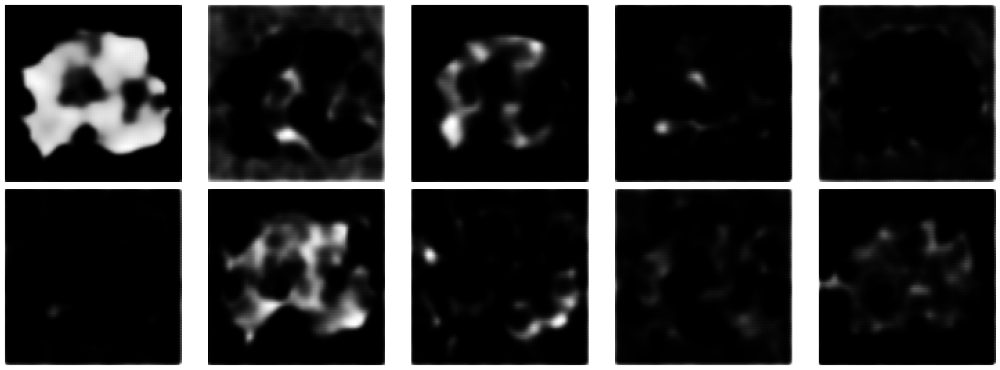

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:53,  7.92it/s]

1/1 [==============================] - 0s 16ms/step


  0%|                                                                                                                | 2/3750 [00:00<07:53,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 3/3750 [00:00<07:24,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 4/3750 [00:00<07:16,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<07:09,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<07:03,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 7/3750 [00:00<07:00,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 8/3750 [00:00<06:54,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<06:50,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<06:50,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<06:51,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<06:51,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<06:52,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<06:49,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 15/3750 [00:01<06:47,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:01<06:48,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▌                                                                                                              | 17/3750 [00:01<06:48,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<06:47,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<06:45,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<06:43,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<06:41,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<06:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<06:40,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 24/3750 [00:02<06:58,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 25/3750 [00:02<06:54,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 26/3750 [00:02<06:49,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 27/3750 [00:02<06:47,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<06:45,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<06:42,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<06:39,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<06:38,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<06:40,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 33/3750 [00:03<06:38,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 34/3750 [00:03<06:36,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 35/3750 [00:03<06:38,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 36/3750 [00:03<06:36,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 37/3750 [00:04<06:35,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 38/3750 [00:04<06:35,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<06:34,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<06:33,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 41/3750 [00:04<06:33,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 42/3750 [00:04<06:36,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 43/3750 [00:04<06:36,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▎                                                                                                             | 44/3750 [00:04<06:35,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▎                                                                                                             | 45/3750 [00:04<06:52,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<06:48,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 47/3750 [00:05<06:43,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 48/3750 [00:05<06:40,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 49/3750 [00:05<06:37,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 50/3750 [00:05<06:36,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 51/3750 [00:05<06:38,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 52/3750 [00:05<06:40,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 53/3750 [00:05<06:40,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 54/3750 [00:05<06:39,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<06:38,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 56/3750 [00:06<06:39,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 57/3750 [00:06<06:39,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 58/3750 [00:06<06:40,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 59/3750 [00:06<06:42,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 60/3750 [00:06<06:41,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 61/3750 [00:06<06:43,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 62/3750 [00:06<06:44,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 63/3750 [00:06<06:41,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 64/3750 [00:06<06:39,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 65/3750 [00:07<06:40,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 66/3750 [00:07<06:47,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 67/3750 [00:07<06:42,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 68/3750 [00:07<06:55,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 69/3750 [00:07<06:50,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 70/3750 [00:07<06:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 71/3750 [00:07<06:44,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 72/3750 [00:07<06:42,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 73/3750 [00:07<06:38,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 74/3750 [00:08<06:36,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 75/3750 [00:08<06:33,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▏                                                                                                            | 76/3750 [00:08<06:32,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▎                                                                                                            | 77/3750 [00:08<06:32,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 78/3750 [00:08<06:30,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▎                                                                                                            | 79/3750 [00:08<06:30,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▎                                                                                                            | 80/3750 [00:08<06:32,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 81/3750 [00:08<06:32,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▍                                                                                                            | 82/3750 [00:08<06:31,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 83/3750 [00:09<06:34,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 84/3750 [00:09<06:36,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 85/3750 [00:09<06:37,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▌                                                                                                            | 86/3750 [00:09<06:35,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 87/3750 [00:09<06:37,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▌                                                                                                            | 88/3750 [00:09<06:35,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 89/3750 [00:09<06:56,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 90/3750 [00:09<06:49,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 91/3750 [00:09<06:45,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 92/3750 [00:10<06:41,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▊                                                                                                            | 93/3750 [00:10<06:36,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 94/3750 [00:10<06:36,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▊                                                                                                            | 95/3750 [00:10<06:34,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 96/3750 [00:10<06:32,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▊                                                                                                            | 97/3750 [00:10<06:38,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 98/3750 [00:10<06:36,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                            | 99/3750 [00:10<06:36,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 100/3750 [00:10<06:34,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                           | 101/3750 [00:11<06:34,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 102/3750 [00:11<06:33,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 103/3750 [00:11<06:30,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 104/3750 [00:11<06:30,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 105/3750 [00:11<06:35,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███                                                                                                           | 106/3750 [00:11<06:33,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 107/3750 [00:11<06:31,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 108/3750 [00:11<06:35,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 109/3750 [00:11<06:37,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 110/3750 [00:11<06:38,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 111/3750 [00:12<06:56,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 112/3750 [00:12<06:48,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 113/3750 [00:12<06:43,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 114/3750 [00:12<06:38,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 115/3750 [00:12<06:37,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 116/3750 [00:12<06:33,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 117/3750 [00:12<06:33,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 118/3750 [00:12<06:37,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 119/3750 [00:12<06:34,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 120/3750 [00:13<06:31,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 121/3750 [00:13<06:30,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 122/3750 [00:13<06:28,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▌                                                                                                          | 123/3750 [00:13<06:27,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 124/3750 [00:13<06:25,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 125/3750 [00:13<06:25,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 126/3750 [00:13<06:25,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 127/3750 [00:13<06:28,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 128/3750 [00:13<06:28,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 129/3750 [00:14<06:27,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 130/3750 [00:14<06:26,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 131/3750 [00:14<06:26,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▊                                                                                                          | 132/3750 [00:14<06:45,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 133/3750 [00:14<06:45,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 134/3750 [00:14<06:39,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 135/3750 [00:14<06:33,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 136/3750 [00:14<06:33,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 137/3750 [00:14<06:30,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 138/3750 [00:15<06:29,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 139/3750 [00:15<06:28,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████                                                                                                          | 140/3750 [00:15<06:28,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 141/3750 [00:15<06:26,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▏                                                                                                         | 142/3750 [00:15<06:26,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 143/3750 [00:15<06:27,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 144/3750 [00:15<06:28,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 145/3750 [00:15<06:26,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 146/3750 [00:15<06:28,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 147/3750 [00:15<06:27,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 148/3750 [00:16<06:26,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 149/3750 [00:16<06:27,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 150/3750 [00:16<06:29,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 151/3750 [00:16<06:30,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 152/3750 [00:16<06:32,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 153/3750 [00:16<06:30,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 154/3750 [00:16<06:48,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▌                                                                                                         | 155/3750 [00:16<06:45,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 156/3750 [00:16<06:43,  8.90it/s]

1/1 [==============================] - 0s 12ms/step


  4%|████▌                                                                                                         | 157/3750 [00:17<06:45,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 158/3750 [00:17<06:41,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 159/3750 [00:17<06:37,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 160/3750 [00:17<06:33,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 161/3750 [00:17<06:29,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▊                                                                                                         | 162/3750 [00:17<06:28,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 163/3750 [00:17<06:27,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 164/3750 [00:17<06:28,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 165/3750 [00:17<06:28,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▊                                                                                                         | 166/3750 [00:18<06:27,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▉                                                                                                         | 167/3750 [00:18<06:25,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▉                                                                                                         | 168/3750 [00:18<06:24,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:18<06:24,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 170/3750 [00:18<06:25,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 171/3750 [00:18<06:26,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 172/3750 [00:18<06:28,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████                                                                                                         | 173/3750 [00:18<06:35,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 174/3750 [00:18<06:35,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:19<06:30,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:19<06:27,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:19<06:39,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:19<06:35,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:19<06:30,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:19<06:27,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:19<06:24,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:19<06:24,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:19<06:23,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:20<06:24,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:20<06:24,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:20<06:23,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:20<06:23,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:20<06:24,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:20<06:27,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:20<06:24,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:20<06:21,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:20<06:20,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:20<06:22,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:21<06:21,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:21<06:21,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:21<06:22,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:21<06:23,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:21<06:22,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:21<06:21,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:21<06:40,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:21<06:37,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:21<06:32,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:22<06:30,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:22<06:32,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 205/3750 [00:22<06:30,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 206/3750 [00:22<06:27,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████                                                                                                        | 207/3750 [00:22<06:24,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████                                                                                                        | 208/3750 [00:22<06:21,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:22<06:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:22<06:20,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:22<06:19,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:23<06:18,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:23<06:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:23<06:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:23<06:22,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:23<06:21,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:23<06:19,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:23<06:18,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:23<06:16,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:23<06:15,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:24<06:38,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:24<06:35,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:24<06:30,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:24<06:29,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:24<06:28,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:24<06:29,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:24<06:27,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:24<06:24,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:24<06:23,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:25<06:23,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:25<06:21,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:25<06:23,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:25<06:36,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:25<06:31,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:25<06:29,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:25<06:26,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:25<06:23,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:25<06:19,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


  6%|███████                                                                                                       | 239/3750 [00:26<06:17,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  6%|███████                                                                                                       | 240/3750 [00:26<06:15,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 241/3750 [00:26<06:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 242/3750 [00:26<06:16,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:26<06:46,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:26<06:40,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:26<06:33,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:26<06:28,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:26<06:29,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:27<06:26,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:27<06:22,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:27<06:19,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:27<06:21,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:27<08:25,  6.92it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:27<07:46,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:27<07:18,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:27<07:00,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:27<06:47,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:28<06:37,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:28<06:33,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:28<06:33,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:28<06:29,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:28<06:24,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:28<06:23,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:28<06:21,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:28<06:20,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:28<06:35,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:29<06:33,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:29<06:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:29<06:28,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:29<06:28,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:29<06:25,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:29<06:26,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:29<06:24,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████                                                                                                      | 273/3750 [00:29<06:21,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 274/3750 [00:29<06:20,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 275/3750 [00:30<06:20,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 276/3750 [00:30<06:18,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:30<06:19,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:30<06:20,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:30<06:20,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:30<06:19,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:30<06:18,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:30<06:17,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:30<06:17,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:31<06:15,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:31<06:16,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:31<06:15,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:31<06:37,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:31<06:30,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:31<06:24,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:31<06:22,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:31<06:18,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:31<06:33,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:32<06:31,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:32<06:29,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:32<06:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:32<06:26,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:32<06:24,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:32<06:21,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:32<06:20,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:32<06:20,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:32<06:18,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:33<06:16,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:33<06:16,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:33<06:13,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:33<06:12,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:33<06:11,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 307/3750 [00:33<06:11,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 308/3750 [00:33<06:29,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 309/3750 [00:33<06:25,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


  8%|█████████                                                                                                     | 310/3750 [00:33<06:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 311/3750 [00:34<06:20,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:34<06:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:34<06:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:34<06:20,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:34<06:19,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:34<06:16,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:34<06:14,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:34<06:14,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:34<06:12,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:35<06:12,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:35<06:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:35<06:12,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:35<06:13,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:35<06:14,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:35<06:12,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:35<06:11,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:35<06:10,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:35<06:09,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:36<06:08,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:36<06:28,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:36<06:24,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:36<06:26,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:36<06:21,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:36<06:17,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:36<06:13,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:36<06:16,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:36<06:15,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:37<06:12,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:37<06:13,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:37<06:10,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 341/3750 [00:37<06:12,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 342/3750 [00:37<06:11,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 343/3750 [00:37<06:14,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████                                                                                                    | 344/3750 [00:37<06:17,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 345/3750 [00:37<06:16,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:37<06:15,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:38<06:13,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:38<06:11,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:38<06:21,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:38<06:21,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:38<06:20,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:38<06:43,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:38<06:37,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:38<06:30,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:38<06:24,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:39<06:18,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:39<06:16,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:39<06:13,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:39<06:12,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:39<06:15,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:39<06:21,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:39<06:16,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:39<06:12,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:39<06:10,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:40<06:10,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:40<06:10,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:40<06:07,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:40<06:05,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:40<06:04,  9.27it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:40<06:12,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:40<06:12,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:40<06:10,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:40<06:22,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:41<06:17,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 375/3750 [00:41<06:12,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 376/3750 [00:41<06:08,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 377/3750 [00:41<06:05,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 378/3750 [00:41<06:04,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████                                                                                                   | 379/3750 [00:41<06:08,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:41<06:07,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:41<06:10,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:41<06:08,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:42<06:06,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:42<06:05,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:42<06:04,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:42<06:06,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:42<06:05,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:42<06:05,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:42<06:07,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:42<06:09,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:42<06:12,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:42<06:13,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:43<06:11,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:43<06:30,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:43<06:25,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:43<06:28,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:43<06:21,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:43<06:18,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:43<06:14,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:43<06:12,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:44<06:08,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:44<06:06,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:44<06:05,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:44<06:06,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:44<06:05,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:44<06:02,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:44<06:02,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:44<06:03,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:44<06:04,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 410/3750 [00:44<06:04,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 411/3750 [00:45<06:02,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 412/3750 [00:45<06:00,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████                                                                                                  | 413/3750 [00:45<05:59,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:45<05:58,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:45<06:17,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:45<06:12,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:45<06:11,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:45<06:09,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:45<06:06,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:46<06:04,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:46<06:01,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:46<06:04,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:46<06:02,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:46<05:59,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:46<05:57,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:46<05:56,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:46<05:57,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:46<05:56,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:47<05:56,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:47<05:56,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:47<05:56,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:47<05:58,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:47<05:57,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:47<05:56,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:47<05:55,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:47<06:00,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:47<06:17,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:48<06:13,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:48<06:14,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:48<06:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:48<06:12,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:48<06:12,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:48<06:09,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:48<06:06,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:48<06:06,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:48<06:02,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:49<05:59,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:49<05:58,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:49<05:56,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:49<05:55,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:49<05:57,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:49<05:56,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:49<05:56,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:49<05:59,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:49<06:01,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:50<06:00,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:50<05:58,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:50<05:57,  9.21it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:50<06:01,  9.10it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:50<06:22,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:50<06:16,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:50<06:11,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:50<06:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:50<06:09,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:51<06:04,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:51<06:00,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:51<05:56,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:51<05:54,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:51<05:53,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:51<05:52,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:51<05:51,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:51<05:51,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:51<05:51,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:51<05:56,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:52<05:54,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:52<05:53,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:52<05:52,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 478/3750 [00:52<05:57,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 479/3750 [00:52<06:20,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 480/3750 [00:52<06:13,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 481/3750 [00:52<06:09,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:52<06:04,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:53<06:05,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:53<06:02,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:53<06:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:53<06:03,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:53<06:02,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:53<06:01,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:53<05:58,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:53<05:59,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:53<05:58,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:53<05:59,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:54<05:55,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:54<05:52,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:54<05:50,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:54<05:50,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:54<05:49,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:54<05:48,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:54<05:48,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:54<05:52,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:54<06:09,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:55<06:08,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▊                                                                                               | 503/3750 [00:55<06:12,  8.71it/s]

1/1 [==============================] - 0s 12ms/step


 13%|██████████████▊                                                                                               | 504/3750 [00:55<06:56,  7.79it/s]

1/1 [==============================] - 0s 13ms/step


 13%|██████████████▊                                                                                               | 505/3750 [00:55<07:40,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 13%|██████████████▊                                                                                               | 506/3750 [00:55<07:44,  6.98it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▊                                                                                               | 507/3750 [00:55<07:24,  7.30it/s]

1/1 [==============================] - 0s 11ms/step


 14%|██████████████▉                                                                                               | 508/3750 [00:55<07:44,  6.98it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 509/3750 [00:56<07:17,  7.40it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 510/3750 [00:56<06:52,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 511/3750 [00:56<06:39,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████                                                                                               | 512/3750 [00:56<06:32,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 513/3750 [00:56<06:21,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 514/3750 [00:56<06:17,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 515/3750 [00:56<06:10,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 516/3750 [00:56<06:06,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 517/3750 [00:56<06:05,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 518/3750 [00:57<06:04,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▏                                                                                              | 519/3750 [00:57<05:58,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 520/3750 [00:57<06:00,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 521/3750 [00:57<05:58,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 522/3750 [00:57<06:12,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [00:57<06:04,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 524/3750 [00:57<05:58,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 525/3750 [00:57<05:56,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 526/3750 [00:57<05:57,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 527/3750 [00:58<05:52,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 528/3750 [00:58<05:49,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▌                                                                                              | 529/3750 [00:58<06:01,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 530/3750 [00:58<06:01,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 14%|███████████████▌                                                                                              | 531/3750 [00:58<06:20,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 532/3750 [00:58<06:13,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 533/3750 [00:58<06:08,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 534/3750 [00:58<06:03,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 535/3750 [00:59<06:00,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 536/3750 [00:59<06:00,  8.92it/s]

1/1 [==============================] - 0s 41ms/step


 14%|███████████████▊                                                                                              | 537/3750 [00:59<07:22,  7.26it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 538/3750 [00:59<06:55,  7.74it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▊                                                                                              | 539/3750 [00:59<06:35,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 540/3750 [00:59<06:32,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 541/3750 [00:59<06:22,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▉                                                                                              | 542/3750 [00:59<06:11,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:00<06:24,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:00<06:38,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:00<06:52,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 546/3750 [01:00<06:56,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 547/3750 [01:00<07:06,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 548/3750 [01:00<07:17,  7.33it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████                                                                                              | 549/3750 [01:00<07:14,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:00<07:02,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:01<06:48,  7.84it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:01<07:27,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:01<08:30,  6.26it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:01<08:40,  6.14it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:01<08:33,  6.23it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:01<08:19,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:02<09:05,  5.85it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:02<08:50,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:02<08:46,  6.06it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:02<09:21,  5.68it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:02<08:26,  6.30it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:02<08:11,  6.49it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:03<07:34,  7.01it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:03<07:14,  7.33it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:03<07:07,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:03<07:44,  6.86it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:03<07:22,  7.19it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:03<07:07,  7.45it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:03<06:50,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:03<06:38,  7.98it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:04<06:34,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:04<06:29,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:04<06:26,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:04<06:17,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:04<06:13,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:04<06:06,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:04<06:01,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:04<06:00,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:04<05:58,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:05<05:58,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:05<06:01,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:05<05:57,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:05<05:55,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:05<05:58,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:05<05:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:05<05:54,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:05<05:52,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:05<05:55,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:06<05:53,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:06<05:50,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:06<05:47,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:06<05:44,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:06<05:44,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:06<05:46,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:06<05:46,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:06<05:49,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:06<05:51,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:07<05:50,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:07<05:47,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:07<05:45,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:07<05:46,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:07<05:45,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:07<05:46,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:07<05:46,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:07<05:47,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:07<05:47,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:08<05:45,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:08<05:42,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:08<05:40,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:08<05:39,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:08<05:39,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:08<05:41,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:08<05:43,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:08<05:44,  9.10it/s]

1/1 [==============================] - 0s 17ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:08<05:52,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:09<05:50,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:09<05:48,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:09<05:47,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:09<05:44,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:09<05:43,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:09<05:46,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:09<05:44,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:09<05:43,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:09<05:46,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:10<05:43,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:10<05:46,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:10<05:49,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:10<05:48,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:10<05:58,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:10<05:58,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:10<05:56,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:10<05:53,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:10<05:52,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:11<05:51,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:11<06:02,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:11<05:55,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:11<05:49,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:11<05:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:11<05:44,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:11<05:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:11<05:42,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:11<05:39,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:12<05:39,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:12<05:39,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:12<05:37,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:12<05:36,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:12<05:34,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:12<05:33,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:12<05:33,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:12<05:34,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:12<05:33,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:13<05:33,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:13<05:32,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:13<05:32,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:13<05:32,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:13<05:31,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:13<05:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:13<05:46,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:13<05:43,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:13<05:39,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:14<05:36,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:14<05:34,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:14<05:33,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:14<05:33,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:14<05:32,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:14<05:31,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:14<05:30,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:14<05:31,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:14<05:34,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:14<05:34,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:15<05:34,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:15<05:35,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:15<05:36,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:15<05:37,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:15<05:37,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:15<05:34,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:15<05:32,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:15<05:34,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:15<05:45,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:16<05:42,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:16<05:39,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:16<05:37,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:16<05:34,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:16<05:32,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:16<05:31,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:16<05:29,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:16<05:30,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:16<05:35,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:17<05:33,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:17<05:32,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:17<05:31,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:17<05:30,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:17<05:30,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:17<05:29,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:17<05:33,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:17<05:30,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:17<05:31,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:18<05:30,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:18<05:45,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:18<05:40,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:18<05:38,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:18<05:35,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:18<05:33,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:18<05:31,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:18<05:35,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:18<05:31,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:19<05:32,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:19<05:30,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:19<05:28,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:19<05:33,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:19<05:31,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:19<05:29,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:19<05:27,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:19<05:26,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:19<05:25,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:20<05:27,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:20<05:26,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:20<05:26,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:20<05:26,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:20<05:26,  9.27it/s]

1/1 [==============================] - 0s 12ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:20<05:52,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:20<05:45,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:20<05:41,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:20<05:35,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:21<05:34,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:21<05:33,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:21<05:31,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:21<05:30,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:21<05:27,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:21<05:28,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:21<05:28,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:21<05:29,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:21<05:30,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:21<05:29,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:22<05:30,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:22<05:28,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:22<05:26,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:22<05:25,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:22<05:25,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:22<05:44,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:22<05:38,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:22<05:34,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:22<05:31,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:23<05:31,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:23<05:33,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:23<05:30,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:23<05:30,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:23<05:32,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:23<05:32,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:23<05:28,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:23<05:26,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:23<05:25,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:24<05:26,  9.17it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:24<05:33,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:24<05:32,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:24<05:30,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:24<05:29,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:24<05:29,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:24<05:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:24<05:48,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:24<05:40,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:25<05:34,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:25<05:31,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:25<05:28,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:25<05:26,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:25<05:24,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:25<05:23,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:25<05:26,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:25<05:25,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:25<05:23,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:26<05:21,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:26<05:22,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:26<05:25,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:26<05:24,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:26<05:23,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:26<05:21,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:26<05:20,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:26<05:20,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:26<05:19,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:27<05:18,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:27<05:18,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:27<05:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:27<05:34,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:27<05:30,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:27<05:27,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:27<05:24,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:27<05:22,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:27<05:19,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:28<05:22,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:28<05:21,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:28<05:21,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:28<05:20,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:28<05:20,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:28<05:19,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:28<05:18,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:28<05:20,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:28<05:21,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:29<05:20,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:29<05:19,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:29<05:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:29<05:36,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:29<05:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:29<05:28,  8.96it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:29<05:29,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:29<05:26,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:29<05:23,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:30<05:23,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:30<05:22,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:30<05:20,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:30<05:23,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:30<05:22,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:30<05:21,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:30<05:20,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:30<05:19,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:30<05:19,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:30<05:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:31<05:18,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:31<05:18,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:31<05:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:31<05:20,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:31<05:18,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:31<05:18,  9.19it/s]

1/1 [==============================] - 0s 25ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:31<05:36,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:31<05:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:31<05:28,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:32<05:25,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:32<05:24,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:32<05:22,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:32<05:22,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:32<05:19,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:32<05:16,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:32<05:15,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:32<05:18,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:32<05:20,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:33<05:19,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:33<05:17,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:33<05:16,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:33<05:20,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:33<05:28,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:33<05:28,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:33<05:29,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:33<05:25,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:33<05:39,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:34<05:31,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:34<05:25,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:34<05:21,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:34<05:16,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:34<05:17,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:34<05:19,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:34<05:20,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:34<05:19,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:34<05:17,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:35<05:15,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:35<05:13,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:35<05:13,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:35<05:14,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:35<05:16,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:35<05:14,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:35<05:15,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:35<05:14,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:35<05:13,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:36<05:13,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:36<05:28,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:36<05:23,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:36<05:18,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:36<05:17,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:36<05:17,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:36<05:16,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:36<05:16,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:36<05:14,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:37<05:17,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:37<05:14,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:37<05:12,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:37<05:10,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:37<05:09,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:37<05:12,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:37<05:11,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:37<05:11,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:37<05:10,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:38<05:10,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:38<05:11,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:38<05:13,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:38<05:27,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:38<05:24,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:38<05:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:38<05:18,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:38<05:16,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:38<05:14,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:39<05:11,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:39<05:10,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:39<05:09,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:39<05:09,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:39<05:10,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:39<05:09,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:39<05:11,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:39<05:12,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:39<05:11,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:40<05:10,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:40<05:11,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:40<05:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:40<05:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:40<05:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:40<07:23,  6.42it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:40<06:52,  6.90it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:40<06:25,  7.38it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:41<06:09,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:41<05:54,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:41<05:40,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:41<05:43,  8.28it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:41<05:32,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:41<05:25,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:41<05:24,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:41<05:22,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:41<05:22,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:42<05:20,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:42<05:19,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:42<05:16,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:42<05:15,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:42<05:13,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:42<05:13,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:42<06:10,  7.64it/s]

1/1 [==============================] - 0s 14ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:42<07:00,  6.72it/s]

1/1 [==============================] - 0s 25ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:43<07:11,  6.56it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:43<06:53,  6.84it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:43<07:10,  6.57it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:43<07:07,  6.60it/s]

1/1 [==============================] - 0s 13ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:43<06:48,  6.91it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:43<06:27,  7.29it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:43<06:23,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:44<06:06,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:44<05:50,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:44<05:40,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:44<05:34,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:44<05:28,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:44<05:23,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:44<05:20,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:44<05:16,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:44<05:11,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:45<05:15,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:45<05:11,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:45<05:07,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:45<05:08,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:45<05:06,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:45<05:06,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:45<05:06,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:45<05:04,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:45<05:03,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:46<05:04,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:46<05:08,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:46<05:11,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:46<05:10,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:46<05:11,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:46<05:13,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:46<05:15,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:46<05:25,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:46<05:20,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:47<05:15,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:47<05:32,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:47<05:25,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:47<05:17,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:47<05:13,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:47<05:10,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:47<05:08,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:47<05:06,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:47<05:04,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:48<05:03,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:48<05:04,  9.13it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:48<05:15,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:48<05:18,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:48<05:21,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:48<05:35,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:48<05:30,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:48<05:26,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:49<05:24,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:49<05:20,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:49<05:17,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:49<05:18,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:49<05:19,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:49<05:20,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:49<05:19,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:49<05:18,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:49<05:18,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:50<05:16,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:50<05:14,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:50<05:17,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:50<05:15,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:50<05:12,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:50<05:15,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:50<05:17,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:50<05:18,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:50<05:18,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:51<05:18,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:51<05:18,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:51<05:18,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:51<05:16,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:51<05:14,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:51<05:22,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:51<05:21,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:51<05:21,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:52<05:21,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [01:52<05:17,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [01:52<05:13,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [01:52<05:11,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [01:52<05:14,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [01:52<05:11,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [01:52<05:15,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [01:52<05:10,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [01:52<05:05,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [01:53<05:01,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [01:53<04:58,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [01:53<05:14,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [01:53<05:31,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [01:53<05:40,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [01:53<05:47,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [01:53<05:53,  7.74it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [01:53<06:02,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [01:54<05:47,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [01:54<05:54,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [01:54<05:52,  7.75it/s]

1/1 [==============================] - 0s 24ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [01:54<07:12,  6.31it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [01:54<07:26,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [01:54<07:17,  6.24it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [01:55<07:08,  6.36it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [01:55<07:37,  5.96it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [01:55<07:29,  6.06it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [01:55<07:10,  6.33it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [01:55<07:00,  6.48it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [01:55<06:36,  6.86it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [01:55<06:24,  7.07it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [01:56<06:01,  7.52it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [01:56<05:45,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [01:56<05:35,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [01:56<05:28,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [01:56<05:25,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [01:56<05:20,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [01:56<05:17,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [01:56<05:16,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [01:56<05:12,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [01:57<05:10,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [01:57<05:05,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [01:57<05:14,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [01:57<05:39,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [01:57<05:29,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [01:57<05:19,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [01:57<05:14,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [01:57<05:10,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [01:58<05:05,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [01:58<05:02,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [01:58<05:01,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [01:58<05:00,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [01:58<04:57,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [01:58<04:55,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [01:58<04:56,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [01:58<04:52,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [01:58<04:52,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [01:58<04:52,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [01:59<04:48,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [01:59<05:04,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [01:59<04:58,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [01:59<04:52,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [01:59<04:48,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [01:59<04:49,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [01:59<04:53,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [01:59<04:59,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [01:59<04:55,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [02:00<04:52,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [02:00<04:54,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [02:00<04:50,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [02:00<04:54,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [02:00<04:54,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [02:00<04:54,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [02:00<04:53,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [02:00<04:53,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [02:00<04:49,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:01<04:45,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:01<04:43,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:01<04:44,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:01<04:59,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:01<04:58,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:01<04:53,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:01<04:53,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:01<04:49,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:01<04:49,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:02<04:46,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:02<04:44,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:02<04:42,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:02<04:41,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:02<04:39,  9.52it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:02<04:41,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:02<04:40,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:02<04:42,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:02<04:44,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:02<04:44,  9.33it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:03<04:47,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:03<04:49,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:03<04:47,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:03<04:49,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:03<04:48,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:03<05:05,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:03<04:59,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:03<04:54,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:03<04:51,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:04<04:48,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:04<04:47,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:04<04:44,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:04<04:44,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:04<04:43,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:04<04:41,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:04<04:43,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:04<04:42,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:04<04:40,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:05<04:38,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:05<04:36,  9.53it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:05<04:38,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:05<04:38,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:05<04:36,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:05<04:34,  9.59it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:05<04:33,  9.62it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:05<04:52,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:05<04:51,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:06<04:48,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:06<04:45,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:06<04:42,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:06<04:43,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:06<04:41,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:06<04:38,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:06<04:36,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:06<04:37,  9.45it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:06<04:41,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:06<04:46,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:07<04:43,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:07<04:42,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:07<04:39,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:07<04:38,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:07<04:37,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:07<04:39,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:07<04:39,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:07<04:41,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:07<04:55,  8.85it/s]

1/1 [==============================] - 0s 12ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:08<04:55,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:08<04:53,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:08<04:49,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:08<04:45,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:08<04:46,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:08<04:45,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:08<04:43,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:08<04:42,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:08<04:41,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:09<04:40,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:09<04:39,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:09<04:38,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:09<04:35,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:09<04:34,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:09<04:34,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:09<04:36,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:09<04:35,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:09<04:36,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:10<04:34,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:10<04:40,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:10<04:40,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:10<04:38,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:10<04:38,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:10<04:38,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:10<04:37,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:10<04:38,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:10<04:38,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:10<04:36,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:11<04:37,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:11<04:35,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:11<04:34,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:11<04:31,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:11<04:29,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:11<04:31,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:11<04:31,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:11<04:34,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:11<04:33,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:12<04:32,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:12<04:31,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:12<04:32,  9.44it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:12<04:45,  9.00it/s]

1/1 [==============================] - 0s 15ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:12<05:02,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:12<04:52,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:12<04:47,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:12<04:46,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:12<04:43,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:13<04:42,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:13<04:39,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:13<04:36,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:13<04:35,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:13<04:35,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:13<04:34,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:13<04:32,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:13<04:31,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:13<04:32,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:14<04:30,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:14<04:31,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:14<04:29,  9.48it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:14<04:30,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:14<04:29,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:14<04:29,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:14<04:50,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:14<04:50,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:14<04:46,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:14<04:42,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:15<04:36,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:15<04:33,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:15<04:32,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:15<04:30,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:15<04:30,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:15<04:31,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:15<04:30,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:15<04:33,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:15<04:37,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:16<04:32,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:16<04:29,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:16<04:28,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:16<04:26,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:16<04:24,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:16<04:23,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:16<04:44,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:16<04:42,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:16<04:43,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:17<04:40,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:17<04:40,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:17<04:38,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:17<04:35,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:17<04:31,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:17<04:29,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:17<04:33,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:17<04:32,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:17<04:29,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:18<04:28,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:18<04:26,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:18<04:24,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:18<04:24,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:18<04:24,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:18<04:25,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:18<04:24,  9.50it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:18<04:26,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:18<05:24,  7.74it/s]

1/1 [==============================] - 0s 16ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:19<05:30,  7.59it/s]

1/1 [==============================] - 0s 14ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:19<05:45,  7.26it/s]

1/1 [==============================] - 0s 16ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:19<05:48,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:19<05:41,  7.33it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:19<05:22,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:19<05:08,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:19<04:59,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:19<04:53,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:20<04:54,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:20<04:46,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:20<04:41,  8.88it/s]

1/1 [==============================] - 0s 13ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:20<04:57,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:20<04:49,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:20<04:42,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:20<04:40,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:20<04:36,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:20<04:36,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:21<04:33,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:21<04:29,  9.23it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:21<04:47,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:21<04:44,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:21<04:38,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:21<04:33,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:21<04:29,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:21<04:26,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:21<04:25,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:22<04:28,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:22<04:27,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:22<04:23,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:22<04:24,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:22<04:21,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:22<04:21,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:22<04:22,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:22<04:20,  9.50it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:22<04:22,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:22<04:24,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:23<04:23,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:23<04:21,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:23<04:22,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:23<04:32,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:23<04:31,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:23<04:29,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:23<04:25,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:23<04:23,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:23<04:22,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:24<04:28,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:24<04:51,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:24<04:58,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:24<05:05,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:24<05:14,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:24<05:18,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:24<05:07,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:24<05:09,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:25<05:13,  7.82it/s]

1/1 [==============================] - 0s 69ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:25<06:49,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:25<06:54,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:25<06:46,  6.04it/s]

1/1 [==============================] - 0s 12ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:25<07:12,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:26<07:01,  5.82it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:26<06:42,  6.09it/s]

1/1 [==============================] - 0s 12ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:26<06:25,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:26<06:38,  6.15it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:26<06:02,  6.74it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:26<05:42,  7.14it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:26<05:22,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:27<05:12,  7.83it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:27<05:01,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:27<04:54,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:27<04:48,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:27<04:43,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:27<04:41,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:27<04:41,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:27<04:41,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:27<04:40,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:28<04:32,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:28<04:35,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:28<04:34,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:28<04:34,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:28<04:36,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:28<04:36,  8.80it/s]

1/1 [==============================] - 0s 32ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:28<04:52,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:28<04:47,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:28<04:42,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:29<04:38,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:29<04:35,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:29<04:31,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:29<04:29,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:29<04:26,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:29<04:23,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:29<04:28,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:29<04:24,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:29<04:22,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:30<04:23,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:30<04:21,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:30<04:20,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:30<04:19,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:30<04:18,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:30<04:18,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:30<04:18,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:30<04:26,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:30<04:24,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:31<04:21,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:31<06:35,  6.09it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:31<05:52,  6.82it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:31<05:22,  7.45it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:31<05:10,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:31<04:57,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:31<04:45,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:31<04:39,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:32<04:31,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:32<04:29,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:32<04:25,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:32<04:21,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:32<04:20,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:32<04:16,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:32<04:13,  9.43it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:32<04:13,  9.44it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:32<04:14,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:33<04:14,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:33<04:16,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:33<04:42,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:33<04:34,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:33<04:29,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:33<04:25,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:33<04:24,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:33<04:24,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:33<04:22,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:34<04:18,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:34<04:18,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:34<04:18,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:34<04:18,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:34<04:19,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:34<04:16,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:34<04:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:34<04:18,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:34<04:18,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:35<04:18,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:35<04:17,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:35<04:28,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:35<04:24,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:35<04:21,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:35<04:18,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:35<04:16,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:35<04:13,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:35<04:26,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:36<04:26,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:36<04:25,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:36<04:23,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:36<04:20,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:36<04:18,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:36<04:17,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:36<04:15,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:36<04:15,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:36<04:13,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:36<04:13,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:37<04:13,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:37<04:12,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:37<04:13,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:37<04:19,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:37<04:17,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:37<04:14,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:37<04:14,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:37<04:14,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:37<04:11,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:38<04:13,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:38<04:18,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:38<04:16,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:38<04:14,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:38<04:13,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:38<04:12,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:38<04:11,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:38<04:09,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:38<04:12,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:39<04:11,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:39<04:14,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:39<04:13,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:39<04:12,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:39<04:13,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:39<04:28,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:39<04:23,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:39<04:18,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:39<04:16,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:40<04:19,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:40<04:19,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:40<04:15,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:40<04:12,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:40<04:12,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:40<04:12,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:40<04:10,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:40<04:11,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:40<04:11,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:41<04:09,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:41<04:09,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:41<04:12,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:41<04:10,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:41<04:10,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:41<04:09,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:41<04:08,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:41<04:11,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:41<04:11,  9.17it/s]

1/1 [==============================] - 0s 15ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:42<04:28,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:42<04:22,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:42<04:21,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:42<04:19,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:42<04:20,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:42<04:16,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:42<04:13,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:42<04:13,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:42<04:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:43<04:10,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:43<04:10,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:43<04:08,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:43<04:08,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:43<04:08,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:43<04:07,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:43<04:08,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:43<04:07,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:43<04:06,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:43<04:05,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:44<04:11,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:44<04:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:44<04:21,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:44<04:18,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:44<04:13,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:44<04:10,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:44<04:08,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:44<04:06,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:44<04:05,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:45<04:06,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:45<04:04,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:45<04:04,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:45<04:05,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:45<04:05,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:45<04:04,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:45<04:05,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:45<04:03,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:45<04:04,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:46<04:06,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:46<04:07,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:46<04:24,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:46<04:19,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:46<04:12,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:46<04:11,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:46<04:09,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:46<04:08,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:46<04:07,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:47<04:05,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:47<04:02,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:47<04:00,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:47<04:01,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:47<04:01,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:47<04:02,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:47<04:01,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:47<04:04,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:47<04:04,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:48<04:01,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:48<04:03,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:48<04:03,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:48<04:02,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:48<04:17,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:48<04:13,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:48<04:07,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:48<04:05,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:48<04:03,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:49<04:03,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [02:49<04:03,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [02:49<04:02,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [02:49<04:02,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [02:49<04:03,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [02:49<04:02,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [02:49<04:02,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [02:49<04:05,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [02:49<04:05,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [02:49<04:03,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [02:50<04:05,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [02:50<04:03,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [02:50<04:01,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [02:50<04:00,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [02:50<04:01,  9.24it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [02:50<04:14,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [02:50<04:11,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [02:50<04:08,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [02:50<04:03,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [02:51<04:01,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [02:51<04:00,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [02:51<03:59,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [02:51<03:57,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [02:51<04:00,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [02:51<03:59,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [02:51<03:59,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [02:51<03:57,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [02:51<03:56,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [02:52<03:57,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [02:52<03:54,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [02:52<03:55,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [02:52<03:54,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [02:52<03:55,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [02:52<03:58,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [02:52<04:11,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [02:52<04:07,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [02:52<04:04,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [02:53<04:02,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [02:53<04:02,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [02:53<03:58,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [02:53<03:59,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [02:53<03:57,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [02:53<04:02,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [02:53<04:05,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [02:53<04:05,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [02:53<04:05,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [02:54<04:02,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [02:54<04:00,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [02:54<03:57,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [02:54<03:57,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [02:54<03:57,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [02:54<03:56,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [02:54<03:57,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [02:54<03:55,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [02:54<04:06,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [02:55<04:02,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [02:55<03:58,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [02:55<03:58,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [02:55<03:56,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [02:55<03:55,  9.29it/s]

1/1 [==============================] - 0s 17ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [02:55<04:39,  7.80it/s]

1/1 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [02:55<04:37,  7.87it/s]

1/1 [==============================] - 0s 15ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [02:55<04:57,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [02:56<04:54,  7.40it/s]

1/1 [==============================] - 0s 15ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [02:56<05:09,  7.04it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [02:56<04:48,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [02:56<04:33,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [02:56<04:22,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [02:56<04:16,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [02:56<04:14,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [02:56<04:11,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [02:56<04:06,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [02:57<04:03,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [02:57<04:02,  8.96it/s]

1/1 [==============================] - 0s 15ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [02:57<04:25,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [02:57<04:18,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [02:57<04:11,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [02:57<04:05,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [02:57<04:02,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [02:57<05:01,  7.18it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [02:58<04:59,  7.23it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [02:58<04:42,  7.66it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [02:58<04:45,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [02:58<04:32,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [02:58<04:23,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [02:58<04:20,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [02:58<04:14,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [02:58<04:10,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [02:59<04:06,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [02:59<04:03,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [02:59<04:00,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [02:59<03:59,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [02:59<03:57,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [02:59<03:55,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [02:59<03:52,  9.26it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [02:59<04:01,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [02:59<04:02,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [03:00<03:59,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [03:00<03:55,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [03:00<03:53,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [03:00<03:52,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [03:00<03:51,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [03:00<03:50,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [03:00<03:49,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [03:00<03:51,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [03:00<03:49,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [03:00<03:49,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [03:01<03:51,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [03:01<03:50,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [03:01<03:50,  9.28it/s]

1/1 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [03:01<04:13,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [03:01<04:21,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [03:01<04:29,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [03:01<04:37,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [03:01<04:27,  7.97it/s]

1/1 [==============================] - 0s 12ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [03:02<04:34,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [03:02<04:57,  7.15it/s]

1/1 [==============================] - 0s 25ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [03:02<05:57,  5.95it/s]

1/1 [==============================] - 0s 12ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [03:02<05:51,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:02<05:54,  5.99it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:02<05:43,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:03<06:07,  5.78it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:03<05:46,  6.12it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:03<05:32,  6.38it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:03<05:26,  6.50it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:03<05:11,  6.81it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:03<04:52,  7.24it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:03<04:36,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:04<04:23,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:04<04:17,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:04<04:10,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:04<04:20,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:04<04:15,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:04<04:13,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:04<04:08,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:04<04:05,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:05<04:00,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:05<04:01,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:05<04:10,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:05<04:03,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:05<03:58,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:05<03:55,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:05<03:53,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:05<03:48,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:05<03:49,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:06<03:47,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:06<03:46,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:06<03:46,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:06<03:48,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:06<03:47,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:06<03:54,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:06<03:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:06<03:51,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:06<03:52,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:07<03:51,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:07<03:49,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:07<03:47,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:07<03:44,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:07<03:44,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:07<03:43,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:07<03:42,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:07<03:41,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:07<03:41,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:07<03:43,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:08<03:43,  9.31it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:08<03:44,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:08<03:45,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:08<03:45,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:08<03:45,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:08<03:44,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:08<03:45,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:08<03:56,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:08<03:51,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:09<03:50,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:09<03:46,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:09<03:45,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:09<03:47,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:09<03:46,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:09<03:45,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:09<03:43,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:09<03:42,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:09<03:42,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:10<03:44,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:10<03:42,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:10<03:42,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:10<03:45,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:10<03:45,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:10<03:44,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:10<03:41,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:10<03:41,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:10<03:40,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:11<03:54,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:11<03:50,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:11<03:46,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:11<03:46,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:11<03:47,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:11<03:46,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:11<03:43,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:11<03:40,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:11<03:39,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:12<03:40,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:12<03:41,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:12<03:39,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:12<03:38,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:12<03:41,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:12<03:39,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:12<03:39,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:12<03:38,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:12<03:38,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:12<03:36,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:13<03:39,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:13<03:52,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:13<03:47,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:13<03:44,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:13<03:43,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:13<03:40,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:13<03:39,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:13<03:37,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:13<03:38,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:14<03:38,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:14<03:41,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:14<03:40,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:14<03:41,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:14<03:40,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:14<03:40,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:14<03:38,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:14<03:36,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:14<03:36,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:15<03:37,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:15<03:37,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:15<03:44,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:15<03:42,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:15<03:40,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:15<03:38,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:15<03:36,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:15<03:40,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:15<03:38,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:16<03:37,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:16<03:36,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:16<03:37,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:16<03:37,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:16<03:36,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:16<03:35,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:16<03:34,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:16<03:33,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:16<03:32,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:16<03:32,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:17<03:33,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:17<03:33,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:17<03:35,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:17<03:47,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:17<03:44,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:17<03:42,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:17<03:39,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:17<03:39,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:17<03:37,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:18<03:37,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:18<03:37,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:18<03:38,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:18<03:37,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:18<03:34,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:18<03:37,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:18<03:35,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:18<03:33,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:18<03:31,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:19<03:31,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:19<03:31,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:19<03:31,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:19<03:31,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:19<03:31,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:19<03:30,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:19<03:42,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:19<03:39,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:19<03:38,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:20<03:35,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:20<03:33,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:20<03:33,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:20<03:37,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:20<03:35,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:20<03:33,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:20<03:31,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:20<03:32,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:20<03:31,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:21<03:31,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:21<03:30,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:21<03:28,  9.41it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:21<03:29,  9.35it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:21<03:31,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:21<03:31,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:21<03:31,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:21<03:30,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:21<03:43,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:22<03:38,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:22<03:34,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:22<03:33,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:22<03:31,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:22<03:34,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:22<03:32,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:22<03:32,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:22<03:29,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:22<03:29,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:22<03:28,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:23<03:28,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:23<03:27,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:23<03:27,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:23<03:27,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:23<03:30,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:23<03:28,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:23<03:29,  9.25it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:23<03:44,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:23<03:41,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:24<03:39,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:24<03:36,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:24<03:31,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:24<03:30,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:24<03:31,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:24<03:30,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:24<03:30,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:24<03:30,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:24<03:28,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:25<03:27,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:25<03:27,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:25<03:30,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:25<03:28,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:25<03:28,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:25<03:27,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:25<03:37,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:25<04:18,  7.42it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:26<04:42,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:26<05:02,  6.34it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:26<04:45,  6.71it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:26<04:35,  6.94it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:26<04:17,  7.43it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:26<04:04,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:26<03:56,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:26<03:52,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:27<03:46,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:27<03:46,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:27<03:41,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:27<03:37,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:27<03:33,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:27<03:31,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:27<03:31,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:27<03:30,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:27<03:29,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:28<03:27,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:28<03:25,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:28<03:25,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:28<03:36,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:28<03:42,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:28<03:48,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:28<03:55,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:28<03:57,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:29<04:02,  7.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:29<04:03,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:29<04:00,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:29<03:53,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:29<04:11,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:29<05:05,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:30<05:04,  6.19it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:30<05:09,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:30<05:28,  5.73it/s]

1/1 [==============================] - 0s 14ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:30<05:19,  5.90it/s]

1/1 [==============================] - 0s 13ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:30<05:01,  6.23it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:30<04:52,  6.43it/s]

1/1 [==============================] - 0s 13ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:30<04:47,  6.53it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:31<04:26,  7.05it/s]

1/1 [==============================] - 0s 13ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:31<04:12,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:31<04:06,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:31<03:56,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:31<03:47,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:31<03:44,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:31<03:40,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:31<03:37,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:31<03:34,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:32<03:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:32<03:29,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:32<03:30,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:32<03:28,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:32<03:23,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:32<03:25,  9.05it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:32<03:27,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:32<03:26,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:32<03:25,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:33<03:25,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:33<03:25,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:33<03:26,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:33<03:26,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:33<03:26,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:33<03:36,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:33<03:33,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:33<03:28,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:34<03:34,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:34<03:31,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:34<03:29,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:34<03:27,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:34<03:25,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:34<03:23,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:34<03:22,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:34<03:22,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:34<03:21,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:34<03:19,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:35<03:20,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:35<03:25,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:35<03:23,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:35<03:22,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:35<03:37,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:35<03:31,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:35<03:30,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:35<03:38,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:36<03:32,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:36<03:30,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:36<03:26,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:36<03:22,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:36<03:20,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:36<03:19,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:36<03:18,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:36<03:20,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:36<03:21,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:37<03:18,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:37<03:17,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:37<03:17,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:37<03:16,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:37<03:19,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:37<03:18,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:37<03:17,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:37<03:16,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:37<03:24,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:38<03:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:38<03:18,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:38<03:16,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:38<03:17,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:38<03:16,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:38<03:16,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:38<03:16,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:38<03:15,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:38<03:16,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:38<03:14,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:39<03:14,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:39<03:14,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:39<03:15,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:39<03:13,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:39<03:13,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:39<03:13,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:39<03:11,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:39<03:12,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:39<03:12,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:40<03:25,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:40<03:20,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:40<03:17,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:40<03:16,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:40<03:14,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:40<03:12,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:40<03:11,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:40<03:11,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:40<03:12,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:41<03:10,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:41<03:14,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:41<03:11,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:41<03:11,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:41<03:10,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:41<03:11,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:41<03:11,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:41<03:12,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:41<03:12,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:41<03:10,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:42<03:21,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:42<03:18,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:42<03:16,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:42<03:14,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:42<03:15,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:42<03:14,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:42<03:13,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:42<03:11,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:42<03:12,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:43<03:11,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:43<03:10,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:43<03:10,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:43<03:10,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:43<03:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:43<03:09,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:43<03:10,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:43<03:10,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:43<03:12,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:44<03:12,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:44<03:12,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:44<03:12,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:44<03:12,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:44<03:11,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:44<03:11,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:44<03:09,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:44<03:12,  9.12it/s]

1/1 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:44<03:19,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:45<03:16,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:45<03:12,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:45<03:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:45<03:13,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:45<03:12,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:45<03:10,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:45<03:09,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:45<03:07,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:45<03:07,  9.28it/s]

1/1 [==============================] - 0s 34ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:46<03:21,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:46<03:17,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:46<03:19,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:46<03:17,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:46<03:14,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:46<03:13,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [03:46<03:11,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [03:46<03:10,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [03:46<03:08,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [03:47<03:07,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [03:47<03:07,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [03:47<03:05,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [03:47<03:06,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [03:47<03:05,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [03:47<03:04,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [03:47<03:06,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [03:47<03:04,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [03:47<03:02,  9.44it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [03:48<03:03,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [03:48<03:11,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [03:48<03:09,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [03:48<03:07,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [03:48<03:07,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [03:48<03:06,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [03:48<03:06,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [03:48<03:04,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [03:48<03:03,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [03:48<03:03,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [03:49<03:03,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [03:49<03:03,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [03:49<03:02,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [03:49<03:03,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [03:49<03:02,  9.39it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [03:49<03:02,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [03:49<03:01,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [03:49<03:02,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [03:49<03:03,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [03:50<03:03,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [03:50<03:04,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [03:50<03:03,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [03:50<03:13,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [03:50<03:09,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [03:50<03:07,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [03:50<03:04,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [03:50<03:03,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [03:50<03:02,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [03:51<03:00,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [03:51<03:01,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [03:51<03:02,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [03:51<03:01,  9.33it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [03:51<03:02,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [03:51<03:00,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [03:51<03:00,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [03:51<02:59,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [03:51<03:00,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [03:51<03:00,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [03:52<03:00,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [03:52<03:13,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [03:52<03:09,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [03:52<03:07,  9.00it/s]

1/1 [==============================] - 0s 33ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [03:52<03:18,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [03:52<03:14,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [03:52<03:11,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [03:52<03:08,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [03:53<03:04,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [03:53<03:03,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [03:53<03:02,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [03:53<03:02,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [03:53<03:01,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [03:53<03:00,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [03:53<02:58,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [03:53<02:59,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [03:53<03:01,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [03:53<03:00,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [03:54<02:59,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [03:54<02:59,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [03:54<02:59,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [03:54<02:57,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [03:54<02:58,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [03:54<03:05,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [03:54<03:03,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [03:54<03:02,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [03:54<03:02,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [03:55<03:01,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [03:55<03:00,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [03:55<03:00,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [03:55<03:00,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [03:55<03:00,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [03:55<02:59,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [03:55<02:58,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [03:55<02:58,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [03:55<02:57,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [03:56<02:56,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [03:56<02:56,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [03:56<02:55,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [03:56<02:58,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [03:56<02:58,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [03:56<02:58,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [03:56<02:57,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [03:56<02:58,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [03:56<03:08,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [03:57<03:04,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [03:57<03:03,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [03:57<03:00,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [03:57<02:59,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [03:57<02:59,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [03:57<02:58,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [03:57<02:57,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [03:57<02:56,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [03:57<02:57,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [03:58<02:54,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [03:58<02:55,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [03:58<02:54,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [03:58<02:54,  9.34it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [03:58<02:58,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [03:58<02:57,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [03:58<02:55,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [03:58<02:56,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [03:58<02:55,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [03:58<02:54,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [03:59<02:55,  9.23it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [03:59<03:07,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [03:59<03:03,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [03:59<03:00,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [03:59<02:59,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [03:59<02:58,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [03:59<03:04,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [03:59<03:01,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:00<02:58,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:00<02:57,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:00<02:57,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:00<02:55,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:00<02:54,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:00<02:54,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:00<02:54,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:00<02:52,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:00<02:52,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:00<02:53,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:01<02:52,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:01<02:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:01<02:57,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:01<02:54,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:01<02:53,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:01<02:53,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:01<02:52,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:01<02:52,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:01<02:51,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:02<02:51,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:02<02:50,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:02<02:49,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:02<02:49,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:02<02:50,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:02<02:50,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:02<02:49,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:02<02:49,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:02<02:51,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:03<02:50,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:03<02:50,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:03<02:49,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:03<02:49,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:03<02:58,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:03<02:55,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:03<02:54,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:03<02:52,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:03<02:54,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:04<02:53,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:04<02:51,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:04<02:49,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:04<02:49,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:04<02:48,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:04<02:46,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:04<02:48,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:04<02:48,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:04<02:46,  9.41it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:04<02:47,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:05<02:46,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:05<02:46,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:05<02:47,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:05<02:49,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:05<02:48,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:05<02:58,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:05<02:56,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:05<02:52,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:05<02:50,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:06<02:49,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:06<02:47,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:06<02:49,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:06<02:48,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:06<02:49,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:06<02:49,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:06<02:50,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:06<02:49,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:06<02:48,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:07<02:47,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:07<02:46,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:07<02:54,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:07<02:53,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:07<02:52,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:07<02:50,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:07<02:58,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:07<02:56,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:07<02:55,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:08<02:52,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:08<02:50,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:08<02:48,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:08<02:46,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:08<02:45,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:08<02:45,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:08<02:43,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:08<02:44,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:08<02:44,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:09<02:44,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:09<02:42,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:09<02:42,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:09<02:42,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:09<02:44,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:09<02:43,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:09<02:44,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:09<02:44,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:09<02:54,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:10<02:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:10<02:48,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:10<02:46,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:10<02:45,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:10<02:44,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:10<02:44,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:10<02:44,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:10<02:44,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:10<02:45,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:10<02:43,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:11<02:43,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:11<02:42,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:11<02:41,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:11<02:43,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:11<02:43,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:11<02:43,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:11<02:42,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:11<02:42,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:11<02:43,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:12<02:55,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:12<02:51,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:12<02:49,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:12<02:48,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:12<02:47,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:12<02:46,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:12<02:45,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:12<02:46,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:12<02:45,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:13<02:42,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:13<02:41,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:13<02:40,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:13<02:40,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:13<02:39,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:13<02:38,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:13<02:37,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:13<02:38,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:13<02:38,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:14<02:40,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:14<03:31,  7.03it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:14<03:27,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:14<03:32,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:14<03:44,  6.60it/s]

1/1 [==============================] - 0s 10ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:14<03:33,  6.94it/s]

1/1 [==============================] - 0s 9ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:14<03:32,  6.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:15<03:15,  7.55it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:15<03:04,  7.99it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:15<03:01,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:15<02:55,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:15<02:49,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:15<02:49,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:15<02:48,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:15<02:45,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:15<02:43,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:16<02:40,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:16<02:41,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:16<02:40,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:16<02:40,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:16<02:39,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:16<02:38,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:16<02:49,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:16<02:45,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:16<02:42,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:17<02:40,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:17<02:37,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:17<02:36,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:17<02:54,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:17<03:00,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:17<03:03,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:17<03:06,  7.82it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:17<03:08,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:18<03:08,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:18<03:03,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:18<03:05,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:18<03:49,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:18<04:37,  5.21it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:19<04:37,  5.21it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:19<04:55,  4.90it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:19<04:28,  5.39it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:19<03:57,  6.08it/s]

1/1 [==============================] - 0s 9ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:19<03:35,  6.70it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:19<03:25,  7.03it/s]

1/1 [==============================] - 0s 16ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:19<03:32,  6.78it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:20<03:37,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:20<03:46,  6.36it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:20<03:32,  6.78it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:20<03:20,  7.17it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:20<03:09,  7.57it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:20<03:01,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:20<02:57,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:20<02:52,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:21<02:50,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:21<02:46,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:21<02:44,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:21<02:42,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:21<02:40,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:21<02:39,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:21<02:39,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:21<02:38,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:21<02:37,  9.06it/s]

1/1 [==============================] - 0s 15ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:22<02:44,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:22<02:43,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:22<02:41,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:22<02:39,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:22<02:37,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:22<02:35,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:22<02:32,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:22<02:32,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:22<02:32,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:23<02:32,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:23<02:32,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:23<02:30,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:23<02:32,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:23<02:32,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:23<02:40,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:23<02:38,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:23<02:36,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:23<02:35,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:24<02:34,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:24<02:33,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:24<02:33,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:24<02:33,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:24<02:33,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:24<02:32,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:24<02:32,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:24<02:32,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:24<02:33,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:25<02:31,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:25<02:30,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:25<02:30,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:25<02:30,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:25<02:30,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:25<02:29,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:25<02:30,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:25<02:31,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:25<02:30,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:26<02:31,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:26<02:32,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:26<02:33,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:26<02:30,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:26<02:29,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:26<02:30,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:26<02:29,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:26<02:29,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:26<02:27,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:26<02:27,  9.37it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:27<02:37,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:27<02:34,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:27<02:31,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:27<02:30,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:27<02:31,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:27<02:30,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:27<02:28,  9.21it/s]

1/1 [==============================] - 0s 14ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:27<02:40,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:28<02:36,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:28<02:33,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:28<02:30,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:28<02:29,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:28<02:29,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:28<02:28,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:28<02:28,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:28<02:27,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:28<02:27,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:28<02:26,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:29<02:26,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:29<02:26,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:29<02:26,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:29<02:27,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:29<02:25,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:29<02:26,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:29<02:25,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:29<02:35,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:29<02:33,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:30<02:31,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:30<02:29,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:30<02:27,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:30<02:27,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:30<02:27,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:30<02:27,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:30<02:27,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:30<02:26,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:30<02:25,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:31<02:23,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:31<02:22,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:31<02:23,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:31<02:22,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:31<02:22,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:31<02:22,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:31<02:23,  9.30it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:31<02:24,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:31<02:24,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:32<02:24,  9.25it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:32<02:34,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:32<02:30,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:32<02:27,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:32<02:26,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:32<02:23,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:32<02:22,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:32<02:23,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:32<02:23,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:33<02:22,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:33<02:22,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:33<02:21,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:33<02:21,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:33<02:20,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:33<02:19,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:33<02:19,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:33<02:20,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:33<02:20,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:33<02:21,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:34<02:21,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:34<02:27,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:34<02:25,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:34<02:23,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:34<02:22,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:34<02:21,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:34<02:20,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:34<02:21,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:34<02:20,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:35<02:20,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:35<02:19,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:35<02:21,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:35<02:20,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:35<02:21,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:35<02:20,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:35<02:20,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:35<02:20,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:36<03:31,  6.14it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:36<03:09,  6.84it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:36<02:54,  7.43it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:36<02:53,  7.46it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:36<02:43,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:36<02:36,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:36<02:31,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:36<02:27,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:36<02:25,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:37<02:23,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:37<02:20,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:37<02:20,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:37<02:20,  9.14it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:37<02:20,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:37<02:19,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:37<02:19,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:37<02:18,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:37<02:20,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:38<02:19,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:38<02:18,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:38<02:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:38<02:18,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:38<02:17,  9.26it/s]

1/1 [==============================] - 0s 35ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:38<02:28,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:38<02:25,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:38<02:23,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:38<02:21,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:39<02:20,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:39<02:18,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:39<02:17,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:39<02:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:39<02:16,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:39<02:16,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:39<02:15,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:39<02:16,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:39<02:15,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:40<02:17,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:40<02:16,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:40<02:16,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:40<02:16,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:40<02:18,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:40<02:16,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:40<02:24,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:40<02:22,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:40<02:20,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:41<02:19,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:41<02:17,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:41<02:16,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:41<02:16,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:41<02:15,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:41<02:15,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:41<02:14,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:41<02:14,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:41<02:15,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:42<02:16,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:42<02:16,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:42<02:15,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:42<02:15,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:42<02:14,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:42<02:13,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:42<02:14,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:42<02:22,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:42<02:21,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:43<02:19,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [04:43<02:18,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [04:43<02:16,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [04:43<02:15,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [04:43<02:16,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [04:43<02:15,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [04:43<02:13,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [04:43<02:14,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [04:43<02:14,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [04:44<02:21,  8.66it/s]

1/1 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [04:44<02:38,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [04:44<02:54,  7.02it/s]

1/1 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [04:44<02:53,  7.02it/s]

1/1 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [04:44<02:46,  7.35it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [04:44<02:41,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [04:44<02:35,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [04:44<02:27,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [04:45<02:32,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [04:45<02:28,  8.17it/s]

1/1 [==============================] - 0s 14ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [04:45<02:32,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [04:45<02:26,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [04:45<02:22,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [04:45<02:17,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [04:45<02:15,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [04:45<02:13,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [04:46<02:13,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [04:46<02:13,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [04:46<02:12,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [04:46<02:10,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [04:46<02:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [04:46<02:09,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [04:46<02:10,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [04:46<02:11,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [04:46<02:13,  9.00it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [04:47<02:23,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [04:47<02:20,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [04:47<02:18,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [04:47<02:16,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [04:47<02:15,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [04:47<02:14,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [04:47<02:14,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [04:47<02:13,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [04:47<02:11,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [04:48<02:11,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [04:48<02:10,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [04:48<02:11,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [04:48<02:10,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [04:48<02:09,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [04:48<02:09,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [04:48<02:09,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [04:48<02:08,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [04:48<02:08,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [04:48<02:10,  9.08it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [04:49<02:46,  7.09it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [04:49<02:34,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [04:49<02:29,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [04:49<02:23,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [04:49<02:18,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [04:49<02:17,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [04:49<02:14,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [04:49<02:11,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [04:50<02:10,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [04:50<02:09,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [04:50<02:07,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [04:50<02:08,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [04:50<02:14,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [04:50<02:12,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [04:50<02:10,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [04:50<02:09,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [04:50<02:10,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [04:51<02:08,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [04:51<02:06,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [04:51<02:05,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [04:51<02:06,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [04:51<02:06,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [04:51<02:05,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [04:51<02:05,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [04:51<02:05,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [04:51<02:04,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [04:52<02:04,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [04:52<02:04,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [04:52<02:04,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [04:52<02:03,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [04:52<02:04,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [04:52<02:04,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [04:52<02:03,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [04:52<02:03,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [04:52<02:03,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [04:53<02:03,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [04:53<02:03,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [04:53<02:03,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [04:53<02:03,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [04:53<02:03,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [04:53<02:04,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [04:53<02:03,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [04:53<02:02,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [04:53<02:06,  9.03it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [04:54<02:08,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [04:54<02:06,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [04:54<02:05,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [04:54<02:04,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [04:54<02:03,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [04:54<02:03,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [04:54<02:03,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [04:54<02:02,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [04:54<02:02,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [04:54<02:01,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [04:55<02:01,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [04:55<02:01,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [04:55<02:00,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [04:55<02:00,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [04:55<02:00,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [04:55<02:00,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [04:55<01:59,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [04:55<01:59,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [04:55<01:59,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [04:56<01:59,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [04:56<01:59,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [04:56<01:58,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [04:56<01:58,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [04:56<01:57,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [04:56<01:58,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [04:56<01:57,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [04:56<01:57,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [04:56<01:57,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [04:57<01:57,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [04:57<01:57,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [04:57<01:56,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [04:57<01:59,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [04:57<02:04,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [04:57<02:03,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [04:57<02:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [04:57<02:00,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [04:57<01:59,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [04:58<01:59,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [04:58<01:58,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [04:58<01:58,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [04:58<01:58,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [04:58<01:58,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [04:58<01:57,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [04:58<01:58,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [04:58<01:58,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [04:58<01:59,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [04:58<01:58,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [04:59<01:58,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [04:59<01:57,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [04:59<01:56,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [04:59<01:55,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [04:59<01:55,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [04:59<01:55,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [04:59<01:55,  9.34it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [04:59<01:57,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [04:59<01:56,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [05:00<01:56,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [05:00<01:56,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [05:00<01:56,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [05:00<01:55,  9.32it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [05:00<01:56,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [05:00<01:55,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [05:00<01:56,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [05:00<01:57,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [05:00<02:02,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [05:01<02:00,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [05:01<01:58,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [05:01<01:56,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [05:01<01:55,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [05:01<01:55,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [05:01<01:55,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [05:01<01:55,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [05:01<01:55,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [05:01<01:54,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [05:02<01:55,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [05:02<01:54,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [05:02<01:53,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [05:02<01:52,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [05:02<01:52,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [05:02<01:51,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [05:02<01:52,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [05:02<01:53,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [05:02<01:53,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [05:02<01:53,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [05:03<01:53,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [05:03<01:52,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [05:03<01:51,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [05:03<01:51,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [05:03<01:50,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [05:03<01:51,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [05:03<01:51,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [05:03<01:51,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [05:03<01:51,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:04<01:51,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:04<01:51,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:04<01:52,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:04<01:57,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:04<01:55,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:04<01:55,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:04<01:53,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:04<01:53,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:04<01:52,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:05<01:52,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:05<01:52,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:05<01:51,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:05<01:50,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:05<01:49,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:05<01:50,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:05<01:49,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:05<01:49,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:05<01:48,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:05<01:48,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:06<01:48,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:06<01:48,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:06<01:48,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:06<01:48,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:06<01:48,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:06<01:48,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:06<01:48,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:06<01:49,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:06<01:48,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:07<01:49,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:07<01:49,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:07<01:48,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:07<01:48,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:07<01:49,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:07<01:49,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:07<01:56,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:07<01:55,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:07<01:52,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:08<01:52,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:08<01:51,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:08<01:50,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:08<01:49,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:08<01:48,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:08<01:47,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:08<01:46,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:08<01:46,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:08<01:46,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:09<01:46,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:09<01:45,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:09<01:45,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:09<01:44,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:09<01:44,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:09<01:44,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:09<01:44,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:09<01:45,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:09<01:46,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:09<01:45,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:10<01:46,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:10<01:46,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:10<01:45,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:10<01:45,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:10<01:45,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:10<01:45,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:10<01:45,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:10<01:46,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:10<01:45,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:11<01:45,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:11<01:45,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:11<01:51,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:11<01:50,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:11<01:48,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:11<01:47,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:11<01:46,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:11<01:46,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:11<01:48,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:12<01:47,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:12<01:46,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:12<01:45,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:12<01:44,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:12<01:43,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:12<01:44,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:12<01:43,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:12<01:43,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:12<01:43,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:13<01:43,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:13<01:42,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:13<01:42,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:13<01:41,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:13<01:41,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:13<01:41,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:13<01:40,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:13<01:40,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:13<01:40,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:13<01:40,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:14<01:40,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:14<01:40,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:14<01:40,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:14<01:40,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:14<01:39,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:14<01:39,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:14<01:39,  9.53it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:14<01:40,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:14<01:45,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:15<01:45,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:15<01:43,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:15<01:42,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:15<01:41,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:15<01:40,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:15<01:39,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:15<01:39,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:15<01:40,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:15<01:40,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:16<01:40,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:16<01:40,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:16<01:40,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:16<01:39,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:16<01:39,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:16<01:39,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:16<01:39,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:16<01:39,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:16<01:39,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:16<01:39,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:17<01:40,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:17<01:39,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:17<01:38,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:17<01:37,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:17<01:37,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:17<01:37,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:17<01:36,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:17<01:36,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:17<01:36,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:18<01:36,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:18<01:36,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:18<01:35,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:18<01:36,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:18<01:37,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:18<01:38,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:18<01:37,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:18<01:37,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:18<01:37,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:18<01:36,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:19<01:36,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:19<01:36,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:19<01:35,  9.41it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:19<01:36,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:19<01:36,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:19<01:36,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:19<01:35,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:19<01:36,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:19<01:36,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:20<01:36,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:20<01:35,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:20<01:34,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:20<01:35,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:20<01:35,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:20<01:35,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:20<01:34,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:20<01:35,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:20<01:34,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:21<01:34,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:21<01:33,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:21<01:33,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:21<01:33,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:21<01:33,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:21<01:33,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:21<01:33,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:21<01:33,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:21<01:33,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:21<01:33,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:22<01:34,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:22<01:35,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:22<01:35,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:22<01:35,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:22<01:34,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:22<01:33,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:22<01:33,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:22<01:33,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:22<01:32,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:23<01:32,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:23<01:32,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:23<01:32,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:23<01:32,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:23<01:32,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:23<01:31,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:23<01:31,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:23<01:31,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:23<01:31,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:24<01:31,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:24<01:31,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:24<01:31,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:24<01:31,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:24<01:31,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:24<01:31,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:24<01:30,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:24<01:30,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:24<01:31,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:24<01:31,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:25<01:31,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:25<01:31,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:25<01:31,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:25<01:31,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:25<01:30,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:25<01:30,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:25<01:36,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:25<01:34,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:25<01:33,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:26<01:31,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:26<01:30,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:26<01:29,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:26<01:28,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:26<01:28,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:26<01:28,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:26<01:28,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:26<01:28,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:26<01:28,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:27<01:28,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:27<01:27,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:27<01:27,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:27<01:27,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:27<01:26,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:27<01:26,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:27<01:26,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:27<01:26,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:27<01:28,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:27<01:27,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:28<01:27,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:28<01:26,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:28<01:26,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:28<01:26,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:28<01:26,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:28<01:25,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:28<01:26,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:28<01:26,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:28<01:27,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:29<01:27,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:29<01:27,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:29<01:26,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:29<01:30,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:29<01:29,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:29<01:27,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:29<01:28,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:29<01:28,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:29<01:28,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:30<01:27,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:30<01:26,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:30<01:26,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:30<01:25,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:30<01:24,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:30<01:25,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:30<01:24,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:30<01:24,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:30<01:23,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:30<01:24,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:31<01:24,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:31<01:23,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:31<01:23,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:31<01:23,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:31<01:23,  9.43it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:31<01:24,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:31<01:23,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:31<01:23,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:31<01:23,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:32<01:23,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:32<01:23,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:32<01:23,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:32<01:23,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:32<01:23,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:32<01:23,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:32<01:22,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:32<01:22,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:32<01:23,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:33<01:24,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:33<01:24,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:33<01:24,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:33<01:23,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:33<01:22,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:33<01:21,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:33<01:22,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:33<01:21,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:33<01:21,  9.45it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:33<01:21,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:34<01:21,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:34<01:21,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:34<01:21,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:34<01:20,  9.43it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:34<01:20,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:34<01:20,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:34<01:20,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:34<01:21,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:34<01:21,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:35<01:21,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:35<01:20,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:35<01:20,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:35<01:19,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:35<01:19,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:35<01:19,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:35<01:19,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:35<01:19,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:35<01:19,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:36<01:19,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:36<01:19,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:36<01:19,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:36<01:19,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:36<01:20,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:36<01:20,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:36<01:19,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:36<01:26,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:36<01:23,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:37<01:21,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:37<01:20,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:37<01:19,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:37<01:18,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:37<01:18,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:37<01:17,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:37<01:17,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:37<01:17,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:37<01:17,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [05:37<01:17,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [05:38<01:18,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [05:38<01:18,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [05:38<01:17,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [05:38<01:17,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [05:38<01:17,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [05:38<01:16,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [05:38<01:16,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [05:38<01:16,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [05:38<01:16,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [05:39<01:16,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [05:39<01:16,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [05:39<01:16,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [05:39<01:15,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [05:39<01:15,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [05:39<01:15,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [05:39<01:15,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [05:39<01:15,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [05:39<01:15,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [05:39<01:15,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [05:40<01:15,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [05:40<01:15,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [05:40<01:15,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [05:40<01:15,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [05:40<01:15,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [05:40<01:15,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [05:40<01:15,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [05:40<01:15,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [05:40<01:14,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [05:41<01:14,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [05:41<01:14,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [05:41<01:14,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [05:41<01:14,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [05:41<01:14,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [05:41<01:14,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [05:41<01:13,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [05:41<01:13,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [05:41<01:13,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [05:42<01:12,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [05:42<01:13,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [05:42<01:13,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [05:42<01:12,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [05:42<01:12,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [05:42<01:12,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [05:42<01:11,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [05:42<01:11,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [05:42<01:11,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [05:42<01:12,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [05:43<01:12,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [05:43<01:12,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [05:43<01:12,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [05:43<01:12,  9.32it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [05:43<01:12,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [05:43<01:12,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [05:43<01:11,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [05:43<01:12,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [05:43<01:15,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [05:44<01:15,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [05:44<01:14,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [05:44<01:13,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [05:44<01:13,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [05:44<01:12,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [05:44<01:13,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [05:44<01:12,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [05:44<01:11,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [05:44<01:11,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [05:45<01:11,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [05:45<01:11,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [05:45<01:11,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [05:45<01:11,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [05:45<01:10,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [05:45<01:10,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [05:45<01:10,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [05:45<01:09,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [05:45<01:11,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [05:46<01:10,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [05:46<01:10,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [05:46<01:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [05:46<01:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [05:46<01:09,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [05:46<01:09,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [05:46<01:09,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [05:46<01:08,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [05:46<01:08,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [05:46<01:07,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [05:47<01:07,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [05:47<01:07,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [05:47<01:07,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [05:47<01:10,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [05:47<01:09,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [05:47<01:09,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [05:47<01:08,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [05:47<01:08,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [05:47<01:08,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [05:48<01:07,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [05:48<01:07,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [05:48<01:07,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [05:48<01:06,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [05:48<01:06,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [05:48<01:06,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [05:48<01:06,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [05:48<01:06,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [05:48<01:05,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [05:48<01:05,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [05:49<01:05,  9.53it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [05:49<01:05,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [05:49<01:05,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [05:49<01:05,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [05:49<01:05,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [05:49<01:05,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [05:49<01:06,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [05:49<01:05,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [05:49<01:05,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [05:50<01:05,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [05:50<01:04,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [05:50<01:04,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [05:50<01:04,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [05:50<01:04,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [05:50<01:04,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [05:50<01:03,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [05:50<01:03,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [05:50<01:03,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [05:51<01:07,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [05:51<01:07,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [05:51<01:06,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [05:51<01:05,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [05:51<01:05,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [05:51<01:04,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [05:51<01:04,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [05:51<01:04,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [05:51<01:04,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [05:51<01:03,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [05:52<01:04,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [05:52<01:04,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [05:52<01:04,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [05:52<01:03,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [05:52<01:03,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [05:52<01:03,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [05:52<01:02,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [05:52<01:02,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [05:52<01:02,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [05:53<01:01,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [05:53<01:01,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [05:53<01:01,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [05:53<01:01,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [05:53<01:01,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [05:53<01:01,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [05:53<01:01,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [05:53<01:01,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [05:53<01:01,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [05:54<01:02,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [05:54<01:01,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [05:54<01:01,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [05:54<01:01,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [05:54<01:00,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [05:54<01:00,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [05:54<01:00,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [05:54<01:05,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [05:54<01:04,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [05:54<01:03,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [05:55<01:02,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [05:55<01:02,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [05:55<01:01,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [05:55<01:00,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [05:55<01:00,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [05:55<01:00,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [05:55<00:59,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [05:55<00:59,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [05:55<00:59,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [05:56<01:00,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [05:56<01:00,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [05:56<00:59,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [05:56<00:59,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [05:56<00:59,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [05:56<00:59,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [05:56<00:59,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [05:56<00:58,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [05:56<00:58,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [05:57<00:57,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [05:57<00:57,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [05:57<00:58,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [05:57<00:58,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [05:57<00:57,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [05:57<00:57,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [05:57<00:57,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [05:57<00:57,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [05:57<00:57,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [05:57<00:56,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [05:58<00:56,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [05:58<00:57,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [05:58<00:57,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [05:58<00:57,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [05:58<01:01,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [05:58<00:59,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [05:58<00:58,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [05:58<00:58,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [05:58<00:57,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [05:59<00:57,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [05:59<00:56,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [05:59<00:56,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [05:59<00:56,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [05:59<00:56,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [05:59<00:56,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [05:59<00:55,  9.41it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [05:59<00:56,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [05:59<00:56,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [06:00<00:56,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [06:00<00:55,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [06:00<00:55,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [06:00<00:55,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [06:00<00:55,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [06:00<00:55,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [06:00<00:55,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [06:00<00:55,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [06:00<00:55,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [06:00<00:54,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [06:01<00:54,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [06:01<00:54,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [06:01<00:55,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [06:01<00:55,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [06:01<00:54,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [06:01<00:54,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [06:01<00:53,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [06:01<00:53,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [06:01<00:53,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [06:02<00:53,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [06:02<00:53,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [06:02<00:53,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [06:02<00:54,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [06:02<00:53,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [06:02<00:53,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [06:02<00:52,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [06:02<00:53,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [06:02<00:52,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [06:03<00:52,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [06:03<00:52,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [06:03<00:51,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [06:03<00:51,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [06:03<00:52,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:03<00:52,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:03<00:52,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:03<00:51,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:03<00:51,  9.38it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:03<00:52,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:04<00:52,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:04<00:51,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:04<00:51,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:04<00:51,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:04<00:50,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:04<00:50,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:04<00:50,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:04<00:50,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:04<00:49,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:05<00:49,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:05<00:49,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:05<00:49,  9.49it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:05<00:50,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:05<00:50,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:05<00:50,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:05<00:50,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:05<00:50,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:05<00:50,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:05<00:49,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:06<00:49,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:06<00:49,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:06<00:50,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:06<00:49,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:06<00:49,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:06<00:48,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:06<00:48,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:06<00:48,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:06<00:47,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:07<00:47,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:07<00:47,  9.56it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:07<00:48,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:07<00:48,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:07<00:48,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:07<00:48,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:07<00:47,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:07<00:47,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:07<00:47,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:08<00:46,  9.52it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:08<00:46,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:08<00:47,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:08<00:47,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:08<00:46,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:08<00:46,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:08<00:47,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:08<00:47,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:08<00:46,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:08<00:46,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:09<00:46,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:09<00:46,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:09<00:46,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:09<00:46,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:09<00:46,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:09<00:45,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:09<00:45,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:09<00:45,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:09<00:47,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:10<00:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:10<00:47,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:10<00:46,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:10<00:46,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:10<00:46,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:10<00:45,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:10<00:45,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:10<00:44,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:10<00:45,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:11<00:45,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:11<00:44,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:11<00:44,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:11<00:44,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:11<00:44,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:11<00:44,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:11<00:44,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:11<00:43,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:11<00:43,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:11<00:43,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:12<00:43,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:12<00:43,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:12<00:43,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:12<00:43,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:12<00:43,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:12<00:44,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:12<00:44,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:12<00:43,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:12<00:43,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:13<00:42,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:13<00:42,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:13<00:41,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:13<00:41,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:13<00:41,  9.51it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:13<00:41,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:13<00:41,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:13<00:42,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:13<00:43,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:14<00:42,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:14<00:42,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:14<00:41,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:14<00:41,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:14<00:41,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:14<00:41,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:14<00:40,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:14<00:40,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:14<00:41,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:14<00:41,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:15<00:40,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:15<00:40,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:15<00:40,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:15<00:40,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:15<00:40,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:15<00:40,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:15<00:40,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:15<00:40,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:15<00:40,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:16<00:40,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:16<00:39,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:16<00:39,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:16<00:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:16<00:39,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:16<00:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:16<00:39,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:16<00:38,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:16<00:38,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:17<00:38,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:17<00:38,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:17<00:38,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:17<00:38,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:17<00:38,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:17<00:38,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:17<00:38,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:17<00:41,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:17<00:40,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:18<00:39,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:18<00:38,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:18<00:38,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:18<00:37,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:18<00:37,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:18<00:37,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:18<00:37,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:18<00:37,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:18<00:37,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:18<00:37,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:19<00:37,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:19<00:37,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:19<00:37,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:19<00:36,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:19<00:36,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:19<00:36,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:19<00:35,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:19<00:35,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:19<00:35,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:20<00:35,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:20<00:35,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:20<00:35,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:20<00:34,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:20<00:34,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:20<00:34,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:20<00:35,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:20<00:35,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:20<00:35,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:21<00:34,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:21<00:34,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:21<00:34,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:21<00:34,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:21<00:34,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:21<00:34,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:21<00:36,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:21<00:36,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:21<00:35,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:22<00:35,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:22<00:34,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:22<00:34,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:22<00:34,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:22<00:33,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:22<00:33,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:22<00:33,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:22<00:33,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:22<00:33,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:22<00:33,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:23<00:32,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:23<00:32,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:23<00:32,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:23<00:32,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:23<00:32,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:23<00:32,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:23<00:32,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:23<00:32,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:23<00:32,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:24<00:32,  9.21it/s]

1/1 [==============================] - 0s 24ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:24<00:46,  6.38it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:24<00:43,  6.87it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:24<00:39,  7.41it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:24<00:37,  7.81it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:24<00:35,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:24<00:34,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:24<00:33,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:25<00:32,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:25<00:31,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:25<00:31,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:25<00:31,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:25<00:30,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:25<00:30,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:25<00:32,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:25<00:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:25<00:31,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:26<00:30,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:26<00:30,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:26<00:30,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:26<00:30,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:26<00:29,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:26<00:29,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:26<00:29,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:26<00:29,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:26<00:29,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:27<00:29,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:27<00:29,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:27<00:28,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:27<00:28,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:27<00:28,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:27<00:28,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:27<00:28,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:27<00:28,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:27<00:28,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:27<00:27,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:28<00:27,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:28<00:27,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:28<00:27,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:28<00:27,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:28<00:27,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:28<00:27,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:28<00:26,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:28<00:27,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:28<00:26,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:29<00:26,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:29<00:26,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:29<00:26,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:29<00:26,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:29<00:26,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:29<00:26,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:29<00:26,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:29<00:26,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:29<00:26,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:30<00:26,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:30<00:26,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:30<00:26,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:30<00:25,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:30<00:25,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:30<00:25,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:30<00:25,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:30<00:24,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:30<00:24,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:30<00:24,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:31<00:24,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:31<00:24,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:31<00:24,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:31<00:24,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:31<00:24,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:31<00:24,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [06:31<00:24,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [06:31<00:24,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [06:31<00:24,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [06:32<00:24,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [06:32<00:23,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [06:32<00:23,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [06:32<00:23,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [06:32<00:23,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [06:32<00:23,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [06:32<00:23,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [06:32<00:23,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [06:32<00:23,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [06:32<00:23,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [06:33<00:23,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [06:33<00:22,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [06:33<00:22,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [06:33<00:23,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [06:33<00:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [06:33<00:23,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [06:33<00:22,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [06:33<00:22,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [06:33<00:22,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [06:34<00:22,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [06:34<00:21,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [06:34<00:21,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [06:34<00:21,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [06:34<00:21,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [06:34<00:20,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [06:34<00:20,  9.58it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [06:34<00:20,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [06:34<00:20,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [06:35<00:20,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [06:35<00:20,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [06:35<00:20,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [06:35<00:20,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [06:35<00:20,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [06:35<00:20,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [06:35<00:20,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [06:35<00:20,  9.34it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [06:36<00:27,  6.90it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [06:36<00:25,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [06:36<00:23,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [06:36<00:22,  8.33it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [06:36<00:21,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [06:36<00:20,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [06:36<00:20,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [06:36<00:19,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [06:36<00:19,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [06:36<00:19,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [06:37<00:19,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [06:37<00:19,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [06:37<00:18,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [06:37<00:18,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [06:37<00:20,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [06:37<00:19,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [06:37<00:19,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [06:37<00:18,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [06:37<00:18,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [06:38<00:18,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [06:38<00:18,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [06:38<00:18,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [06:38<00:18,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [06:38<00:17,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [06:38<00:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [06:38<00:17,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [06:38<00:17,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [06:38<00:17,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [06:39<00:17,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [06:39<00:17,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [06:39<00:16,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [06:39<00:16,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [06:39<00:16,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [06:39<00:16,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [06:39<00:16,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [06:39<00:16,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [06:39<00:16,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [06:39<00:16,  9.44it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [06:40<00:15,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [06:40<00:15,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [06:40<00:15,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [06:40<00:15,  9.46it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [06:40<00:15,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [06:40<00:15,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [06:40<00:15,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [06:40<00:15,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [06:40<00:15,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [06:41<00:15,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [06:41<00:15,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [06:41<00:14,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [06:41<00:15,  8.83it/s]

1/1 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [06:41<00:15,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [06:41<00:15,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [06:41<00:14,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [06:41<00:14,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [06:41<00:14,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [06:42<00:14,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [06:42<00:14,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [06:42<00:14,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [06:42<00:13,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [06:42<00:13,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [06:42<00:13,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [06:42<00:13,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [06:42<00:13,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [06:42<00:13,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [06:42<00:13,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [06:43<00:13,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [06:43<00:13,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [06:43<00:12,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [06:43<00:12,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [06:43<00:12,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [06:43<00:12,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [06:43<00:12,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [06:43<00:12,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [06:43<00:12,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [06:44<00:12,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [06:44<00:12,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [06:44<00:12,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [06:44<00:11,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [06:44<00:11,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [06:44<00:11,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [06:44<00:11,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [06:44<00:11,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [06:44<00:11,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [06:45<00:11,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [06:45<00:11,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [06:45<00:10,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [06:45<00:11,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [06:45<00:11,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [06:45<00:10,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [06:45<00:10,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [06:45<00:10,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [06:45<00:10,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [06:46<00:10,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [06:46<00:10,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [06:46<00:10,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [06:46<00:09,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [06:46<00:09,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [06:46<00:09,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [06:46<00:09,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [06:46<00:09,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [06:46<00:09,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [06:46<00:09,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [06:47<00:09,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [06:47<00:09,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [06:47<00:08,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [06:47<00:08,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [06:47<00:08,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [06:47<00:08,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [06:47<00:08,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [06:47<00:08,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [06:47<00:08,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [06:48<00:08,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [06:48<00:08,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [06:48<00:08,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [06:48<00:07,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [06:48<00:07,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [06:48<00:07,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [06:48<00:07,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [06:48<00:07,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [06:48<00:07,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [06:49<00:07,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [06:49<00:07,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [06:49<00:07,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [06:49<00:06,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [06:49<00:06,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [06:49<00:07,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [06:49<00:06,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [06:49<00:06,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [06:49<00:06,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [06:49<00:06,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [06:50<00:06,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [06:50<00:06,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [06:50<00:05,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [06:50<00:05,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [06:50<00:05,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [06:50<00:05,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [06:50<00:05,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [06:50<00:05,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [06:50<00:05,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [06:51<00:05,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [06:51<00:05,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [06:51<00:05,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [06:51<00:04,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [06:51<00:04,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [06:51<00:04,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [06:51<00:04,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [06:51<00:04,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [06:51<00:04,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [06:52<00:04,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [06:52<00:04,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [06:52<00:04,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [06:52<00:03,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [06:52<00:03,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [06:52<00:03,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [06:52<00:03,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [06:52<00:03,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [06:52<00:03,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [06:52<00:03,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [06:53<00:03,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [06:53<00:03,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [06:53<00:02,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [06:53<00:02,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [06:53<00:02,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [06:53<00:02,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [06:53<00:02,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [06:53<00:02,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [06:53<00:02,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [06:54<00:02,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [06:54<00:02,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [06:54<00:02,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [06:54<00:01,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [06:54<00:01,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [06:54<00:01,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [06:54<00:01,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [06:54<00:01,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [06:54<00:01,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [06:55<00:01,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [06:55<00:01,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [06:55<00:01,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [06:55<00:00,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [06:55<00:00,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [06:55<00:00,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [06:55<00:00,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [06:55<00:00,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [06:55<00:00,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [06:55<00:00,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [06:56<00:00,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [06:56<00:00,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [06:56<00:00,  9.01it/s]

EPOCH: 2 Generator Loss: 0.0000 Discriminator Loss: 0.0000
1/1 [==============================] - 0s 11ms/step


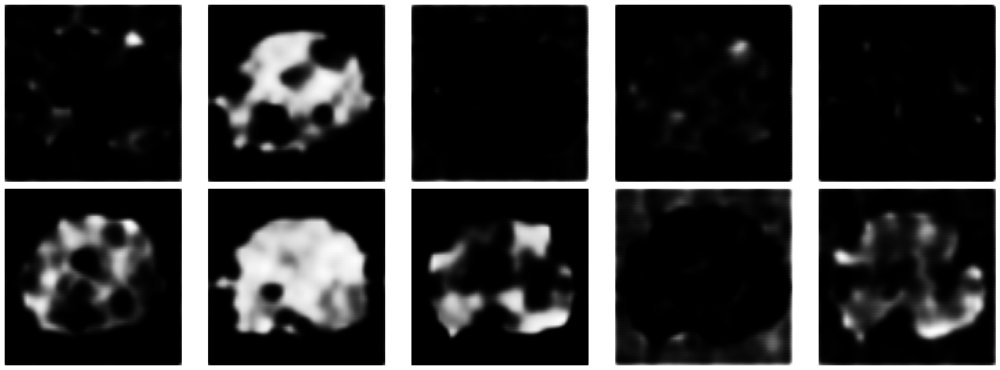

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:23,  8.46it/s]

1/1 [==============================] - 0s 8ms/step


  0%|                                                                                                                | 2/3750 [00:00<06:55,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  0%|                                                                                                                | 3/3750 [00:00<06:54,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


  0%|                                                                                                                | 4/3750 [00:00<06:46,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<06:43,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<06:39,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 7/3750 [00:00<06:47,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 8/3750 [00:00<06:53,  9.06it/s]

1/1 [==============================] - 0s 11ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<07:18,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<07:12,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<07:07,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<07:02,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<07:01,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<07:02,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 15/3750 [00:01<07:04,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:01<07:01,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▌                                                                                                              | 17/3750 [00:01<06:59,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<06:57,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<06:57,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<06:58,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<06:56,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<06:56,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<06:59,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 24/3750 [00:02<06:57,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 25/3750 [00:02<06:56,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 26/3750 [00:02<06:53,  9.00it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▊                                                                                                              | 27/3750 [00:03<06:56,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<06:50,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<06:45,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<06:39,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<06:35,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<06:36,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  1%|▉                                                                                                              | 33/3750 [00:03<06:33,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 34/3750 [00:03<06:37,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 35/3750 [00:03<06:36,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 36/3750 [00:03<06:34,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 37/3750 [00:04<06:32,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 38/3750 [00:04<06:32,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<06:33,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<06:30,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 41/3750 [00:04<06:32,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▏                                                                                                             | 42/3750 [00:04<06:31,  9.47it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 43/3750 [00:04<06:39,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 44/3750 [00:04<06:45,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 45/3750 [00:04<06:48,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<07:11,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 47/3750 [00:05<07:06,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 48/3750 [00:05<07:05,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 49/3750 [00:05<06:53,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▍                                                                                                             | 50/3750 [00:05<06:45,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 51/3750 [00:05<06:42,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 52/3750 [00:05<06:37,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 53/3750 [00:05<06:33,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 54/3750 [00:05<06:31,  9.43it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<06:32,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 56/3750 [00:06<06:36,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 57/3750 [00:06<06:40,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 58/3750 [00:06<06:44,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 59/3750 [00:06<06:46,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 60/3750 [00:06<06:50,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 61/3750 [00:06<06:48,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 62/3750 [00:06<06:48,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 63/3750 [00:06<06:42,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 64/3750 [00:07<06:38,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 65/3750 [00:07<06:37,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 66/3750 [00:07<06:40,  9.20it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 67/3750 [00:07<06:42,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 68/3750 [00:07<06:45,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 69/3750 [00:07<06:48,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 70/3750 [00:07<06:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 71/3750 [00:07<06:49,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 72/3750 [00:07<06:49,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 73/3750 [00:08<06:48,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 74/3750 [00:08<06:49,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 75/3750 [00:08<06:50,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 76/3750 [00:08<06:49,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▎                                                                                                            | 77/3750 [00:08<06:49,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▎                                                                                                            | 78/3750 [00:08<06:52,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 79/3750 [00:08<06:51,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▎                                                                                                            | 80/3750 [00:08<06:51,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 81/3750 [00:08<06:50,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 82/3750 [00:09<06:51,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 83/3750 [00:09<06:51,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 84/3750 [00:09<06:52,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 85/3750 [00:09<06:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 86/3750 [00:09<07:13,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▌                                                                                                            | 87/3750 [00:09<07:10,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 88/3750 [00:09<07:03,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 89/3750 [00:09<07:00,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▋                                                                                                            | 90/3750 [00:09<06:58,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 91/3750 [00:10<06:50,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 92/3750 [00:10<06:50,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▊                                                                                                            | 93/3750 [00:10<06:48,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 94/3750 [00:10<06:49,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 95/3750 [00:10<06:43,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 96/3750 [00:10<06:46,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 97/3750 [00:10<06:49,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                            | 98/3750 [00:10<06:48,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 99/3750 [00:10<06:47,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 100/3750 [00:11<06:46,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 101/3750 [00:11<06:47,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 102/3750 [00:11<06:47,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 103/3750 [00:11<06:53,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███                                                                                                           | 104/3750 [00:11<06:50,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 105/3750 [00:11<06:48,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 106/3750 [00:11<06:50,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 107/3750 [00:11<06:48,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 108/3750 [00:11<06:47,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 109/3750 [00:12<06:46,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 110/3750 [00:12<06:44,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 111/3750 [00:12<06:45,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 112/3750 [00:12<06:44,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 113/3750 [00:12<06:46,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 114/3750 [00:12<06:44,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 115/3750 [00:12<06:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 116/3750 [00:12<06:46,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 117/3750 [00:12<06:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 118/3750 [00:13<06:44,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 119/3750 [00:13<06:46,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 120/3750 [00:13<06:46,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 121/3750 [00:13<06:45,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 122/3750 [00:13<06:46,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 123/3750 [00:13<06:46,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


  3%|███▋                                                                                                          | 124/3750 [00:13<07:06,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▋                                                                                                          | 125/3750 [00:13<07:00,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▋                                                                                                          | 126/3750 [00:14<06:58,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 127/3750 [00:14<06:53,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 128/3750 [00:14<06:49,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 129/3750 [00:14<06:47,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▊                                                                                                          | 130/3750 [00:14<06:46,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▊                                                                                                          | 131/3750 [00:14<06:45,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▊                                                                                                          | 132/3750 [00:14<06:44,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 133/3750 [00:14<06:47,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 134/3750 [00:14<06:46,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 135/3750 [00:15<06:45,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 136/3750 [00:15<06:46,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 137/3750 [00:15<06:45,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 138/3750 [00:15<06:44,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 139/3750 [00:15<06:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 140/3750 [00:15<06:42,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 141/3750 [00:15<06:40,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 142/3750 [00:15<06:41,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▏                                                                                                         | 143/3750 [00:15<06:41,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▏                                                                                                         | 144/3750 [00:16<06:42,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 145/3750 [00:16<06:46,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 146/3750 [00:16<06:45,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 147/3750 [00:16<06:45,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▎                                                                                                         | 148/3750 [00:16<06:46,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 149/3750 [00:16<06:42,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 150/3750 [00:16<06:43,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 151/3750 [00:16<06:47,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 152/3750 [00:16<06:46,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 153/3750 [00:17<06:43,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 154/3750 [00:17<06:36,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 155/3750 [00:17<06:38,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 156/3750 [00:17<06:32,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 157/3750 [00:17<06:28,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 158/3750 [00:17<06:24,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 159/3750 [00:17<06:27,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 160/3750 [00:17<06:34,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 161/3750 [00:17<06:36,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 162/3750 [00:18<06:38,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 163/3750 [00:18<06:40,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 164/3750 [00:18<06:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 165/3750 [00:18<06:40,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 166/3750 [00:18<06:40,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▉                                                                                                         | 167/3750 [00:18<06:41,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 168/3750 [00:18<06:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:18<06:40,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 170/3750 [00:18<06:40,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 171/3750 [00:19<06:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 172/3750 [00:19<06:39,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 173/3750 [00:19<06:39,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 174/3750 [00:19<06:38,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:19<06:38,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:19<06:38,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:19<06:37,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:19<06:41,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:19<06:40,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:20<06:40,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:20<06:37,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:20<06:38,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:20<06:31,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:20<06:31,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:20<06:35,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:20<06:36,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:20<06:36,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:20<06:37,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:21<06:36,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:21<06:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:21<06:39,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:21<06:37,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:21<06:38,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:21<06:37,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:21<06:36,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:21<06:41,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:21<06:41,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:22<06:40,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:22<06:44,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:22<06:43,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:22<06:40,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:22<07:06,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:22<06:59,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:22<06:52,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


  5%|██████                                                                                                        | 205/3750 [00:22<06:50,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


  5%|██████                                                                                                        | 206/3750 [00:22<06:45,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████                                                                                                        | 207/3750 [00:23<06:43,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████                                                                                                        | 208/3750 [00:23<06:40,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:23<06:37,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:23<06:35,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:23<06:35,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:23<06:34,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:23<06:36,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:23<06:37,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:23<06:36,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:24<06:36,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:24<06:37,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:24<06:35,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:24<06:35,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:24<06:35,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:24<06:35,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:24<06:34,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:24<06:36,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:24<06:36,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:25<06:33,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:25<06:33,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:25<06:34,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:25<06:36,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:25<06:28,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:25<06:23,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:25<06:19,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:25<06:17,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:25<06:15,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:26<06:20,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:26<06:22,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:26<06:23,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:26<06:24,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:26<06:27,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 239/3750 [00:26<06:29,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 240/3750 [00:26<06:29,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 241/3750 [00:26<06:53,  8.49it/s]

1/1 [==============================] - 0s 12ms/step


  6%|███████                                                                                                       | 242/3750 [00:26<06:49,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:27<06:45,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:27<06:40,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:27<06:38,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:27<06:37,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:27<06:35,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:27<06:32,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:27<06:31,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:27<06:33,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:27<06:31,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:28<06:31,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:28<06:30,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:28<06:30,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:28<06:31,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:28<06:30,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:28<06:29,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:28<06:30,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:28<06:34,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:28<06:30,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:29<06:30,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:29<06:29,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:29<06:29,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:29<06:29,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:29<06:28,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:29<06:27,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:29<06:26,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:29<06:31,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:30<06:29,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:30<06:30,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:30<06:30,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:30<06:27,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 273/3750 [00:30<06:27,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 274/3750 [00:30<06:27,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 275/3750 [00:30<06:28,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████                                                                                                      | 276/3750 [00:30<06:22,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:30<06:18,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:30<06:15,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:31<06:11,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:31<06:09,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:31<06:33,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:31<06:31,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:31<06:25,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:31<06:20,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:31<06:14,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:31<06:13,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:31<06:10,  9.36it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:32<06:07,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:32<06:06,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:32<06:04,  9.48it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:32<06:09,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:32<06:13,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:32<06:16,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:32<06:17,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:32<06:19,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:32<06:23,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:33<06:23,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:33<06:22,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:33<06:24,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:33<06:23,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:33<06:23,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:33<06:23,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:33<06:22,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:33<06:24,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:33<06:27,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:34<06:26,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████                                                                                                     | 307/3750 [00:34<06:25,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████                                                                                                     | 308/3750 [00:34<06:25,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 309/3750 [00:34<06:24,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 310/3750 [00:34<06:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 311/3750 [00:34<06:23,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:34<06:22,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:34<06:22,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:34<06:27,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:35<06:25,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:35<06:23,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:35<06:23,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:35<06:22,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:35<06:22,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:35<06:23,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:35<06:44,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:35<06:38,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:35<06:36,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:36<06:32,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:36<06:28,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:36<06:27,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:36<06:25,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:36<06:24,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:36<06:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:36<06:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:36<06:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:36<06:24,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:37<06:20,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:37<06:18,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:37<06:12,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:37<06:07,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:37<06:04,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:37<06:01,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:37<05:59,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:37<05:57,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 341/3750 [00:37<05:58,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 342/3750 [00:38<05:59,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 343/3750 [00:38<05:59,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 344/3750 [00:38<05:58,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████                                                                                                    | 345/3750 [00:38<05:57,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:38<05:57,  9.52it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:38<05:55,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:38<05:58,  9.50it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:38<06:04,  9.34it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:38<06:09,  9.20it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:39<06:13,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:39<06:14,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:39<06:15,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:39<06:17,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:39<06:17,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:39<06:16,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:39<06:15,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:39<06:16,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:39<06:19,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:40<06:21,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:40<06:20,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:40<06:41,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:40<06:34,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:40<06:28,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:40<06:24,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:40<06:22,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:40<06:18,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:40<06:21,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:41<06:19,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:41<06:11,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:41<06:06,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:41<06:09,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:41<06:11,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:41<06:12,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 375/3750 [00:41<06:12,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 376/3750 [00:41<06:13,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 377/3750 [00:41<06:12,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 378/3750 [00:42<06:16,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 379/3750 [00:42<06:17,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:42<06:17,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:42<06:16,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:42<06:16,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:42<06:15,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:42<06:15,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:42<06:19,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:42<06:19,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:43<06:20,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:43<06:18,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:43<06:16,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:43<06:14,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:43<06:15,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:43<06:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:43<06:13,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:43<06:13,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:43<06:13,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:44<06:15,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:44<06:16,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:44<06:15,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:44<06:15,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:44<06:19,  8.83it/s]

1/1 [==============================] - 0s 12ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:44<06:27,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:44<06:23,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:44<06:20,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:44<06:18,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:45<06:19,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:45<06:17,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:45<06:16,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:45<06:17,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:45<06:16,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 410/3750 [00:45<06:15,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████                                                                                                  | 411/3750 [00:45<06:14,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 412/3750 [00:45<06:13,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 413/3750 [00:45<06:12,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:46<06:13,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:46<06:12,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:46<06:06,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:46<06:01,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:46<06:04,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:46<06:08,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:46<06:08,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:46<06:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:46<06:09,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:47<06:12,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:47<06:12,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:47<06:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:47<06:12,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:47<06:12,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:47<06:12,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:47<06:12,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:47<06:11,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:47<06:09,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:48<06:12,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:48<06:11,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:48<06:11,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:48<06:16,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:48<06:15,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:48<06:13,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:48<06:11,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:48<06:09,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:49<06:25,  8.59it/s]

1/1 [==============================] - 0s 12ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:49<06:33,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:49<06:27,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:49<06:22,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:49<06:17,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:49<06:14,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:49<06:12,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:49<06:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:49<06:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:50<06:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:50<06:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:50<06:12,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:50<06:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:50<06:09,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:50<06:08,  8.95it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:50<06:20,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:50<06:15,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:50<06:15,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:51<06:06,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:51<06:00,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:51<05:56,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:51<05:53,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:51<05:50,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:51<05:49,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:51<05:49,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:51<05:48,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:51<05:47,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:51<05:46,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:52<05:44,  9.54it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:52<05:47,  9.45it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:52<05:51,  9.33it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:52<05:54,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:52<05:58,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:52<05:59,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:52<06:00,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:52<06:01,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:52<06:01,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:53<06:03,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 478/3750 [00:53<06:05,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 479/3750 [00:53<06:04,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 480/3750 [00:53<06:05,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 481/3750 [00:53<06:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:53<06:05,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:53<06:04,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:53<06:05,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:53<06:06,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:54<06:05,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:54<06:08,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:54<06:07,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:54<06:06,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:54<06:04,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:54<06:05,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:54<06:04,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:54<06:05,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:54<06:03,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:55<06:28,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:55<06:25,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:55<06:18,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:55<06:12,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:55<06:09,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:55<06:05,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:55<06:05,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:55<05:59,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▊                                                                                               | 503/3750 [00:56<05:54,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 504/3750 [00:56<05:57,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 505/3750 [00:56<06:01,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 506/3750 [00:56<06:01,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▊                                                                                               | 507/3750 [00:56<06:00,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 508/3750 [00:56<06:00,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 509/3750 [00:56<06:01,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 510/3750 [00:56<06:00,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 511/3750 [00:56<05:59,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 512/3750 [00:57<05:59,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 513/3750 [00:57<05:57,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 514/3750 [00:57<06:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 515/3750 [00:57<05:58,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 516/3750 [00:57<05:58,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 517/3750 [00:57<05:59,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 518/3750 [00:57<05:59,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 519/3750 [00:57<06:00,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 520/3750 [00:57<06:04,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 521/3750 [00:58<05:57,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 522/3750 [00:58<05:55,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [00:58<05:56,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 524/3750 [00:58<06:02,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 525/3750 [00:58<06:01,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▍                                                                                              | 526/3750 [00:58<06:02,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▍                                                                                              | 527/3750 [00:58<06:02,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 528/3750 [00:58<06:00,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 529/3750 [00:58<05:59,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 530/3750 [00:59<05:56,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 531/3750 [00:59<05:55,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 532/3750 [00:59<05:56,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 533/3750 [00:59<06:00,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 534/3750 [00:59<06:00,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 535/3750 [00:59<05:59,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 536/3750 [00:59<05:58,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 537/3750 [00:59<05:59,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 538/3750 [00:59<05:59,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:00<05:57,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:00<05:57,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:00<05:55,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:00<05:58,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:00<05:58,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:00<05:56,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:00<05:56,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 546/3750 [01:00<05:56,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 547/3750 [01:00<05:56,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 548/3750 [01:01<05:57,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 549/3750 [01:01<05:56,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:01<05:54,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:01<05:49,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:01<05:45,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:01<05:47,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:01<05:43,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:01<05:41,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:01<05:40,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:01<05:39,  9.41it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:02<05:37,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:02<05:36,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:02<05:36,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:02<05:36,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:02<05:36,  9.47it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:02<05:41,  9.35it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:02<05:43,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:02<05:47,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:02<05:50,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:03<05:48,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:03<05:50,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:03<05:48,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:03<05:43,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:03<05:48,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:03<05:43,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:03<05:39,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:03<05:38,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:03<05:37,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:04<05:41,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:04<05:45,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:04<05:49,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:04<05:52,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:04<05:53,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:04<05:54,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:04<05:54,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:04<05:53,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:04<05:52,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:05<05:53,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:05<05:53,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:05<05:54,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:05<05:53,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:05<05:49,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:05<05:43,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:05<05:41,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:05<05:45,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:05<05:53,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:06<05:52,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:06<05:51,  8.96it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:06<05:56,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:06<05:53,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:06<05:46,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:06<05:40,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:06<05:38,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:06<05:43,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:06<05:43,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:07<05:45,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:07<05:47,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:07<05:47,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:07<05:51,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:07<05:51,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:07<05:52,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:07<05:51,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:07<05:51,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:07<05:51,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:08<05:50,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:08<05:49,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:08<05:49,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:08<05:50,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:08<05:55,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:08<05:53,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:08<05:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:08<05:50,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:08<05:49,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:09<05:48,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:09<05:48,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:09<05:48,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:09<05:49,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:09<05:49,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:09<05:47,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:09<05:46,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:09<05:46,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:09<05:45,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:10<05:45,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:10<05:46,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:10<05:47,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:10<05:50,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:10<05:48,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:10<05:47,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:10<05:48,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:10<05:47,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:10<05:47,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:11<05:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:11<05:45,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:11<05:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:11<05:47,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:11<05:46,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:11<05:46,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:11<05:41,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:11<05:43,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:11<05:43,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:12<05:43,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:12<05:44,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:12<05:44,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:12<05:48,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:12<05:49,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:12<05:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:12<05:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:12<05:46,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:12<05:44,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:13<05:44,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:13<05:43,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:13<05:43,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:13<05:46,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:13<05:46,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:13<05:45,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:13<05:45,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:13<05:44,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:13<05:43,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:14<05:43,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:14<05:42,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:14<05:43,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:14<05:46,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:14<05:52,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:14<05:50,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:14<05:47,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:14<05:45,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:14<05:44,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:15<05:44,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:15<05:43,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:15<05:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:15<05:44,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:15<05:41,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:15<05:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:15<05:42,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:15<05:42,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:15<05:43,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:16<05:42,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:16<05:42,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:16<05:42,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:16<05:43,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:16<05:43,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:16<05:45,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:16<05:38,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:16<05:41,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:16<05:42,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:17<05:41,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:17<05:40,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:17<05:40,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:17<05:37,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:17<05:34,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:17<05:29,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:17<05:29,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:17<05:34,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:17<05:34,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:18<05:37,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:18<05:37,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:18<05:37,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:18<05:40,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:18<05:40,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:18<05:40,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:18<05:40,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:18<05:39,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:18<05:40,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:19<05:40,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:19<05:38,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:19<05:37,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:19<05:39,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:19<05:38,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:19<05:37,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:19<05:37,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:19<05:37,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:19<05:37,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:20<05:36,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:20<05:38,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:20<05:38,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:20<05:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:20<05:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:20<05:38,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:20<05:38,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:20<05:37,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:20<05:37,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:21<05:36,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:21<05:36,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:21<05:35,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:21<05:34,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:21<08:53,  5.66it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:21<07:57,  6.32it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:21<07:15,  6.92it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:22<06:50,  7.35it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:22<06:28,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:22<06:13,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:22<06:01,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:22<05:55,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:22<05:51,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:22<05:48,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:22<05:46,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:22<05:42,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:23<05:40,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:23<05:40,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:23<05:39,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:23<05:38,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:23<05:38,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:23<05:41,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:23<05:40,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:23<05:39,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:24<05:38,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:24<05:37,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:24<05:36,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:24<05:35,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:24<05:35,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:24<05:35,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:24<05:37,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:24<05:37,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:24<05:38,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:25<05:36,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:25<05:35,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:25<05:36,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:25<05:48,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:25<05:45,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:25<05:43,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:25<05:42,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:25<05:40,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:25<05:39,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:26<05:34,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:26<05:28,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:26<05:23,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:26<05:19,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:26<05:17,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:26<05:21,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:26<05:34,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:26<05:35,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:26<05:34,  8.89it/s]

1/1 [==============================] - 0s 12ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:27<05:35,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:27<05:35,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:27<05:34,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:27<05:33,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:27<05:32,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:27<05:33,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:27<05:37,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:27<05:37,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:27<05:35,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:28<05:35,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:28<05:38,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:28<05:35,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:28<05:34,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:28<05:33,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:28<05:31,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:28<05:31,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:28<05:33,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:28<05:33,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:29<05:33,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:29<05:34,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:29<05:32,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:29<05:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:29<05:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:29<05:30,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:29<05:32,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:29<05:34,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:29<05:38,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:30<05:35,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:30<05:35,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:30<05:32,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:30<05:31,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:30<05:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:30<05:28,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:30<05:30,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:30<05:30,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:31<05:31,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:31<05:31,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:31<05:29,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:31<05:23,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:31<05:18,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:31<05:20,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:31<05:16,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:31<05:21,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:31<05:23,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:31<05:25,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:32<05:26,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:32<05:26,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:32<05:26,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:32<05:26,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:32<05:25,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:32<05:26,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:32<05:29,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:32<05:41,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:33<05:41,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:33<05:35,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:33<05:31,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:33<05:29,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:33<05:26,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:33<05:25,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:33<05:25,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:33<05:31,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:33<05:30,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:34<05:29,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:34<05:27,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:34<05:25,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:34<05:34,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:34<05:49,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:34<05:42,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:34<05:37,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:34<05:35,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:34<05:31,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:35<05:30,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:35<05:26,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:35<05:25,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:35<05:25,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:35<05:24,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:35<05:24,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:35<05:24,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:35<05:26,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:35<05:26,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:36<05:24,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:36<05:24,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:36<05:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:36<05:22,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:36<05:21,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:36<05:22,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:36<05:21,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:36<05:23,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:36<05:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:37<05:21,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:37<05:22,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:37<05:21,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:37<05:20,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:37<05:21,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:37<05:20,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:37<05:19,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:37<05:23,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:37<05:22,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:38<05:21,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:38<05:22,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:38<05:20,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:38<05:20,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:38<05:20,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:38<05:19,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:38<05:19,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:38<05:22,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:38<05:21,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:39<05:21,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:39<05:20,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:39<05:19,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:39<05:19,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:39<05:18,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:39<05:16,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:39<05:18,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:39<05:20,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:39<05:19,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:40<05:20,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:40<05:19,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:40<05:20,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:40<05:20,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:40<05:19,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:40<05:19,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:40<05:17,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:40<05:19,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:40<05:17,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:41<05:11,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:41<05:13,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:41<05:14,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:41<05:14,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:41<05:16,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:41<05:16,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:41<05:14,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:41<05:14,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:42<05:43,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:42<05:35,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:42<05:30,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:42<05:27,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:42<05:23,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:42<05:20,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:42<05:18,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:42<05:16,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:42<05:15,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:43<05:17,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:43<05:16,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:43<05:16,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:43<05:16,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:43<05:16,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:43<05:15,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:43<05:14,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:43<05:14,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:43<05:14,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:44<05:16,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:44<05:16,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:44<05:17,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:44<05:17,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:44<05:17,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:44<05:17,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:44<05:15,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:44<05:15,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:44<05:13,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:45<05:16,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:45<05:16,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:45<05:15,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:45<05:20,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:45<05:12,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:45<05:06,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:45<05:02,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:45<04:59,  9.37it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:45<04:58,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:46<04:58,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:46<04:57,  9.43it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:46<04:59,  9.36it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:46<05:03,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:46<05:06,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:46<05:09,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:46<05:10,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:46<05:08,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:46<05:09,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:47<05:10,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:47<05:11,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:47<05:10,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:47<05:11,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:47<05:12,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:47<05:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:47<05:10,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:47<05:10,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:47<05:05,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:48<05:02,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:48<05:00,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:48<04:58,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:48<04:56,  9.37it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:48<05:00,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:48<05:07,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:48<05:07,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:48<05:08,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:48<05:09,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:49<05:12,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:49<05:11,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:49<05:10,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:49<05:10,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:49<05:11,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:49<05:10,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:49<05:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:49<05:11,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:49<05:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:50<05:11,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:50<05:11,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:50<05:09,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:50<05:09,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:50<05:08,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:50<05:08,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:50<05:08,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:50<05:07,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:50<05:07,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:51<05:03,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:51<04:58,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:51<05:01,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:51<05:04,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:51<05:06,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:51<05:07,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:51<05:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [01:51<05:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [01:51<05:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [01:52<05:05,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [01:52<05:06,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [01:52<05:06,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [01:52<05:05,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [01:52<05:05,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [01:52<05:05,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [01:52<05:05,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [01:52<05:05,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [01:52<05:04,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [01:53<05:03,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [01:53<05:07,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [01:53<05:07,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [01:53<05:06,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [01:53<05:05,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [01:53<05:05,  8.96it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [01:53<05:05,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [01:53<05:05,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [01:53<05:04,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [01:54<05:03,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [01:54<05:06,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [01:54<05:06,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [01:54<05:06,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [01:54<05:04,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [01:54<05:04,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [01:54<05:04,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [01:54<05:02,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [01:54<04:57,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [01:55<04:53,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [01:55<04:52,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [01:55<04:49,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [01:55<04:48,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [01:55<04:47,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [01:55<04:46,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [01:55<04:51,  9.31it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [01:55<04:53,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [01:55<05:10,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [01:56<05:09,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [01:56<05:08,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [01:56<05:07,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [01:56<05:06,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [01:56<05:03,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [01:56<05:01,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [01:56<04:55,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [01:56<05:02,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [01:56<04:56,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [01:57<05:05,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [01:57<05:02,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [01:57<05:02,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [01:57<05:01,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [01:57<05:00,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [01:57<05:00,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [01:57<04:59,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [01:57<05:00,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [01:57<04:59,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [01:58<04:59,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [01:58<05:01,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [01:58<05:01,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [01:58<05:00,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [01:58<05:01,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [01:58<05:00,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [01:58<04:59,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [01:58<04:59,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [01:58<04:59,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [01:59<04:59,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [01:59<05:00,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [01:59<04:58,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [01:59<04:59,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [01:59<04:58,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [01:59<04:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [01:59<04:59,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [01:59<04:57,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [01:59<04:58,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:00<04:57,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:00<04:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:00<04:59,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:00<04:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:00<04:58,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:00<04:59,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:00<05:03,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:00<05:01,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:00<04:59,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:01<04:59,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:01<05:01,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:01<04:59,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:01<04:59,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:01<05:02,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:01<05:00,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:01<04:58,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:01<04:55,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:01<04:50,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:02<04:46,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:02<04:47,  9.24it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:02<04:50,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:02<04:52,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:02<04:53,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:02<04:54,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:02<04:54,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:02<04:53,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:02<04:53,  9.02it/s]

1/1 [==============================] - 0s 12ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:03<05:05,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:03<04:59,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:03<04:53,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:03<04:54,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:03<04:50,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:03<04:50,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:03<04:52,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:03<04:53,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:03<04:54,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:04<04:54,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:04<04:55,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:04<04:55,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:04<04:55,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:04<04:54,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:04<04:54,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:04<04:54,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:04<04:52,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:04<04:52,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:05<04:51,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:05<04:58,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:05<04:56,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:05<04:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:05<04:53,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:05<04:53,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:05<04:52,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:05<04:52,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:05<04:52,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:06<04:51,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:06<04:53,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:06<04:52,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:06<04:51,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:06<04:52,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:06<04:51,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:06<04:51,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:06<04:50,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:06<04:51,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:07<04:46,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:07<04:41,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:07<04:41,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:07<04:38,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:07<04:36,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:07<04:34,  9.50it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:07<04:34,  9.51it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:07<04:37,  9.38it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:07<04:40,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:08<04:43,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:08<04:44,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:08<04:47,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:08<04:48,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:08<04:48,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:08<04:49,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:08<04:48,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:08<04:49,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:08<04:56,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:09<04:52,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:09<04:52,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:09<04:53,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:09<04:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:09<04:50,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:09<04:49,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:09<04:48,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:09<04:48,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:09<04:47,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:10<04:45,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:10<04:40,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:10<04:38,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:10<04:36,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:10<04:34,  9.40it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:10<04:33,  9.44it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:10<04:32,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:10<04:30,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:10<04:30,  9.54it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:10<04:33,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:11<04:36,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:11<04:40,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:11<04:41,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:11<04:43,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:11<04:44,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:11<04:44,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:11<04:45,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:11<04:53,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:11<04:52,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:12<04:51,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:12<04:49,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:12<04:43,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:12<04:38,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:12<04:35,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:12<04:32,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:12<04:36,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:12<04:34,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:12<04:32,  9.40it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:13<04:35,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:13<04:37,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:13<04:41,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:13<04:43,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:13<04:42,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:13<04:43,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:13<04:43,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:13<04:43,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:13<04:43,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:14<04:43,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:14<04:44,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:14<04:46,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:14<04:45,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:14<04:44,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:14<04:43,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:14<04:43,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:14<04:44,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:14<04:42,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:15<04:43,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:15<04:43,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:15<04:45,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:15<04:44,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:15<04:44,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:15<04:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:15<04:39,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:15<04:38,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:15<04:34,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:16<04:31,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:16<04:28,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:16<04:29,  9.37it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:16<04:28,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:16<04:27,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:16<04:26,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:16<04:24,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:16<04:24,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:16<04:23,  9.55it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:17<04:24,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:17<04:23,  9.55it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:17<04:30,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:17<04:33,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:17<04:31,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:17<04:30,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:17<04:30,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:17<04:27,  9.39it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:17<04:26,  9.42it/s]

1/1 [==============================] - 0s 8ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:17<04:25,  9.45it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:18<04:26,  9.43it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:18<04:30,  9.29it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:18<04:34,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:18<04:35,  9.10it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:18<04:39,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:18<04:39,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:18<04:39,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:18<04:45,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:18<04:46,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:19<04:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:19<04:43,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:19<04:44,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:19<04:41,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:19<04:40,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:19<04:41,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:19<04:40,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:19<04:39,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:19<04:34,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:20<04:32,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:20<04:31,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:20<04:35,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:20<04:37,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:20<04:38,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:20<04:37,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:20<04:37,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:20<04:37,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:20<04:38,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:21<04:38,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:21<04:38,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:21<04:39,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:21<04:43,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:21<04:42,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:21<04:41,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:21<04:45,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:21<04:44,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:22<04:41,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:22<04:39,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:22<04:38,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:22<04:41,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:22<04:38,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:22<04:40,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:22<04:40,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:22<04:34,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:22<04:31,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:23<04:28,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:23<04:25,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:23<04:25,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:23<04:23,  9.35it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:23<04:29,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:23<04:30,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:23<04:32,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:23<04:34,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:23<04:35,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:24<04:39,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:24<04:40,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:24<04:42,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:24<04:44,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:24<04:45,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:24<04:43,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:24<04:41,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:24<04:39,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:24<04:38,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:25<04:36,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:25<04:35,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:25<04:40,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:25<04:38,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:25<04:39,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:25<04:36,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:25<04:35,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:25<04:35,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:25<04:34,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:26<04:32,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:26<04:32,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:26<04:32,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:26<04:32,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:26<04:35,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:26<04:48,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:26<04:45,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:26<04:39,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:26<04:39,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:27<04:40,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:27<04:35,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:27<04:30,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:27<04:27,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:27<04:53,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:27<04:50,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:27<04:45,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:27<04:42,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:28<04:38,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:28<04:37,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:28<04:36,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:28<04:34,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:28<04:32,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:28<04:34,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:28<04:31,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:28<04:31,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:28<04:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:29<04:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:29<04:29,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:29<04:29,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:29<04:28,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:29<04:27,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:29<04:29,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:29<04:32,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:29<04:30,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:29<04:30,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:30<04:29,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:30<04:29,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:30<04:28,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:30<04:28,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:30<04:27,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:30<04:28,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:30<04:28,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:30<04:28,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:30<04:28,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:31<04:24,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:31<04:20,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:31<04:22,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:31<04:18,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:31<04:15,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:31<04:16,  9.34it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:31<04:43,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:31<04:59,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:32<05:09,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:32<05:13,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:32<05:18,  7.49it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:32<05:26,  7.31it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:32<05:30,  7.22it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:32<05:19,  7.45it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:32<05:28,  7.25it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:33<06:53,  5.76it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:33<07:07,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:33<06:53,  5.76it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:33<06:53,  5.76it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:33<07:49,  5.06it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:34<07:28,  5.29it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:34<07:01,  5.64it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:34<06:17,  6.29it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:34<05:50,  6.77it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:34<05:27,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:34<05:09,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:34<04:57,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:34<04:49,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:35<04:47,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:35<04:43,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:35<05:24,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:35<05:08,  7.68it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:35<04:59,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:35<04:49,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:35<04:43,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:35<04:37,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:35<04:32,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:36<04:29,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:36<04:28,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:36<04:26,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:36<04:25,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:36<04:22,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:36<04:18,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:36<04:17,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:36<04:13,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:36<04:11,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:37<04:13,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:37<04:14,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:37<04:15,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:37<04:16,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:37<04:18,  9.06it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:37<04:22,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:37<04:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:37<04:22,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:37<04:21,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:38<04:16,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:38<04:14,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:38<04:10,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:38<04:12,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:38<04:15,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:38<04:20,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:38<04:36,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:38<04:32,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:38<04:29,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:39<04:24,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:39<04:23,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:39<04:44,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:39<04:34,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:39<04:27,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:39<04:20,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:39<04:18,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:39<04:17,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:39<04:20,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:40<04:17,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:40<04:13,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:40<04:11,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:40<04:11,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:40<04:13,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:40<04:15,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:40<04:19,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:40<04:20,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:40<04:19,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:41<04:18,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:41<04:17,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:41<04:33,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:41<04:25,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:41<04:21,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:41<04:23,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:41<04:24,  8.72it/s]

1/1 [==============================] - 0s 12ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:41<04:26,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:42<04:22,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:42<04:20,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:42<04:18,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:42<04:19,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:42<04:34,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:42<04:28,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:42<04:24,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:42<04:25,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:42<04:24,  8.68it/s]

1/1 [==============================] - 0s 12ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:43<04:24,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:43<04:21,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:43<04:18,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:43<04:17,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:43<04:23,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:43<04:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:43<04:17,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:43<04:16,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:43<04:15,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:44<04:20,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:44<04:38,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:44<04:30,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:44<04:25,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:44<04:20,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:44<04:19,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:44<04:23,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:44<04:22,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:44<04:18,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:45<04:15,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:45<04:18,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:45<04:20,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:45<04:18,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:45<04:16,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:45<04:14,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:45<04:13,  8.96it/s]

1/1 [==============================] - 0s 13ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:45<04:38,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:46<04:30,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:46<04:24,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:46<04:18,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:46<04:15,  8.88it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:46<04:36,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:46<04:29,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:46<04:23,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:46<04:19,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:46<04:18,  8.75it/s]

1/1 [==============================] - 0s 12ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:47<04:36,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:47<04:28,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:47<04:23,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:47<04:20,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:47<04:17,  8.76it/s]

1/1 [==============================] - 0s 12ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:47<04:39,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:47<04:29,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:47<04:25,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:48<04:22,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:48<04:23,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:48<04:31,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:48<04:25,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:48<04:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:48<04:16,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:48<04:15,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:48<04:14,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:48<04:11,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:49<04:12,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [02:49<04:10,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [02:49<04:17,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [02:49<04:23,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [02:49<04:19,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [02:49<04:15,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [02:49<04:12,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [02:49<04:13,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [02:49<04:15,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [02:50<04:14,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [02:50<04:13,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [02:50<04:07,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [02:50<04:07,  9.03it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [02:50<04:30,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [02:50<04:22,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [02:50<04:17,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [02:50<04:13,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [02:51<04:23,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [02:51<04:24,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [02:51<04:24,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [02:51<04:15,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [02:51<04:07,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [02:51<04:18,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [02:51<04:15,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [02:51<04:11,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [02:51<04:07,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [02:52<04:06,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [02:52<04:22,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [02:52<04:21,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [02:52<04:15,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [02:52<04:11,  8.80it/s]

1/1 [==============================] - 0s 12ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [02:52<04:14,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [02:52<04:11,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [02:52<04:10,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [02:52<04:08,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [02:53<04:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [02:53<04:05,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [02:53<04:08,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [02:53<04:24,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [02:53<04:18,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [02:53<04:13,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [02:53<04:10,  8.81it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [02:53<04:28,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [02:54<04:36,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [02:54<04:27,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [02:54<04:19,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [02:54<04:13,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [02:54<04:28,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [02:54<04:21,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [02:54<04:16,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [02:54<04:12,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [02:54<04:10,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [02:55<04:20,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [02:55<04:15,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [02:55<04:10,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [02:55<04:09,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [02:55<04:08,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [02:55<04:22,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [02:55<04:17,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [02:55<04:13,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [02:55<04:09,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [02:56<04:06,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [02:56<04:15,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [02:56<04:12,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [02:56<04:10,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [02:56<04:07,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [02:56<04:05,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [02:56<04:07,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [02:56<04:10,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [02:57<04:07,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [02:57<04:05,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [02:57<04:04,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [02:57<04:03,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [02:57<04:31,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [02:57<04:22,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [02:57<04:16,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [02:57<04:13,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [02:57<04:10,  8.66it/s]

1/1 [==============================] - 0s 12ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [02:58<04:26,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [02:58<04:18,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [02:58<04:14,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [02:58<04:09,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [02:58<04:06,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [02:58<04:15,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [02:58<04:13,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [02:58<04:10,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [02:59<04:07,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [02:59<04:04,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [02:59<04:21,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [02:59<04:15,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [02:59<04:10,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [02:59<04:08,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [02:59<04:05,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [02:59<04:17,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [02:59<04:12,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [03:00<04:07,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [03:00<04:03,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [03:00<04:01,  8.90it/s]

1/1 [==============================] - 0s 36ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [03:00<04:18,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [03:00<04:13,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [03:00<04:11,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [03:00<04:07,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [03:00<04:03,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [03:01<04:15,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [03:01<04:11,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [03:01<04:07,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [03:01<04:08,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [03:01<04:05,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [03:01<04:04,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [03:01<04:05,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [03:01<04:03,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [03:01<04:00,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [03:02<03:58,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [03:02<04:01,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [03:02<04:17,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [03:02<04:10,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [03:02<04:05,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [03:02<04:03,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [03:02<04:01,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:02<04:19,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:02<04:13,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:03<04:09,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:03<04:06,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:03<04:00,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:03<04:11,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:03<04:05,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:03<04:03,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:03<04:03,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:03<04:04,  8.67it/s]

1/1 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:04<04:18,  8.19it/s]

1/1 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:04<04:09,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:04<04:05,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:04<04:01,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:04<04:07,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:04<04:12,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:04<04:06,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:04<04:04,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:04<04:01,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:05<04:05,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:05<04:06,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:05<04:02,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:05<03:58,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:05<03:56,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:05<03:56,  8.90it/s]

1/1 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:05<04:15,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:05<04:11,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:05<04:06,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:06<04:02,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:06<03:59,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:06<04:14,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:06<04:05,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:06<04:00,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:06<03:58,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:06<03:55,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:06<04:19,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:07<04:11,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:07<04:04,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:07<04:00,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:07<03:56,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:07<03:55,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:07<03:54,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:07<03:54,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:07<03:52,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:07<03:52,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:08<03:51,  8.98it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:08<04:13,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:08<04:06,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:08<04:01,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:08<03:58,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:08<03:57,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:08<04:13,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:08<04:05,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:09<04:03,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:09<03:58,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:09<03:51,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:09<04:12,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:09<04:05,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:09<04:00,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:09<03:56,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:09<03:53,  8.84it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:09<04:12,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:10<04:04,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:10<04:00,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:10<03:56,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:10<03:55,  8.77it/s]

1/1 [==============================] - 0s 38ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:10<04:11,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:10<04:06,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:10<04:01,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:10<03:57,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:10<03:54,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:11<04:03,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:11<04:01,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:11<03:57,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:11<03:55,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:11<03:52,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:11<04:04,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:11<04:00,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:11<03:56,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:12<03:53,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:12<03:50,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:12<03:51,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:12<03:55,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:12<03:53,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:12<03:50,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:12<03:49,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:12<03:50,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:12<03:53,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:13<03:51,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:13<03:47,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:13<03:44,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:13<03:44,  9.05it/s]

1/1 [==============================] - 0s 11ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:13<04:02,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:13<03:57,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:13<03:54,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:13<03:50,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:13<03:49,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:14<03:48,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:14<03:49,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:14<03:49,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:14<03:48,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:14<03:45,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:14<03:47,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:14<04:02,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:14<03:59,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:15<03:55,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:15<03:52,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:15<03:50,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:15<04:05,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:15<04:03,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:15<03:59,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:15<03:54,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:15<03:50,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:15<04:05,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:16<04:00,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:16<03:55,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:16<03:51,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:16<03:48,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:16<03:54,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:16<04:00,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:16<03:53,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:16<03:51,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:16<03:49,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:17<03:48,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:17<03:56,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:17<03:53,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:17<03:49,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:17<03:48,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:17<03:45,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:17<03:51,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:17<03:52,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:18<03:47,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:18<03:44,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:18<03:43,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:18<03:41,  9.00it/s]

1/1 [==============================] - 0s 36ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:18<04:03,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:18<03:58,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:18<03:55,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:18<03:53,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:18<03:50,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:19<04:05,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:19<03:57,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:19<03:52,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:19<03:48,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:19<03:46,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:19<03:57,  8.34it/s]

1/1 [==============================] - 0s 12ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:20<06:08,  5.37it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:20<05:27,  6.05it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:20<05:00,  6.59it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:20<04:45,  6.92it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:20<04:26,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:20<04:13,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:20<04:04,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:20<03:56,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:21<04:26,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:21<04:13,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:21<04:03,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:21<03:55,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:21<03:51,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:21<04:01,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:21<03:54,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:21<03:49,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:21<03:45,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:22<03:50,  8.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:22<05:17,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:22<05:28,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:22<05:29,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:22<05:07,  6.38it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:22<04:41,  6.97it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:23<04:45,  6.85it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:23<04:25,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:23<04:11,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:23<04:01,  8.09it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:23<03:57,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:23<04:06,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:23<03:57,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:23<03:53,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:23<03:48,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:24<03:45,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:24<03:44,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:24<03:44,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:24<03:43,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:24<03:41,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:24<03:41,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:24<03:39,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:24<03:50,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:25<03:46,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:25<03:43,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:25<03:42,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:25<03:40,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:25<03:57,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:25<03:52,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:25<03:47,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:25<03:43,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:25<03:41,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:26<03:42,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:26<03:44,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:26<03:41,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:26<03:39,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:26<03:39,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:26<03:38,  8.83it/s]

1/1 [==============================] - 0s 38ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:26<03:51,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:26<03:46,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:26<03:43,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:27<03:40,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:27<03:39,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:27<03:38,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:27<03:37,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:27<03:38,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:27<03:36,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:27<03:34,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:27<03:33,  8.96it/s]

1/1 [==============================] - 0s 42ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:28<03:52,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:28<03:47,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:28<03:42,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:28<03:38,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:28<03:32,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:28<03:49,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:28<03:45,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:28<03:41,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:28<03:38,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:29<03:36,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:29<03:45,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:29<03:42,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:29<03:38,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:29<03:36,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:29<03:35,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:29<03:40,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:29<03:46,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:30<03:41,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:30<03:38,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:30<03:35,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:30<03:33,  8.85it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:30<03:48,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:30<03:41,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:30<03:38,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:30<03:35,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:30<03:33,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:31<03:46,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:31<03:41,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:31<03:37,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:31<03:34,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:31<03:32,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:31<03:45,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:31<03:42,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:31<03:38,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:31<03:35,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:32<03:29,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:32<03:27,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:32<03:30,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:32<03:29,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:32<03:29,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:32<03:27,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:32<03:29,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:32<03:39,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:32<03:36,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:33<03:33,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:33<03:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:33<03:30,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:33<03:30,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:33<03:29,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:33<03:29,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:33<03:29,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:33<03:28,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:33<03:28,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:34<03:39,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:34<03:36,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:34<03:33,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:34<03:31,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:34<03:29,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:34<03:42,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:34<03:39,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:34<03:34,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:35<03:32,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:35<03:29,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:35<03:58,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:35<03:47,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:35<03:40,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:35<03:35,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:35<03:31,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:35<03:37,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:35<03:38,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:36<03:34,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:36<03:31,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:36<03:29,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:36<03:27,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:36<03:36,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:36<03:33,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:36<03:29,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:36<03:29,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:37<03:27,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:37<03:27,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:37<03:27,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:37<03:25,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:37<03:24,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:37<03:22,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:37<03:23,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:37<03:33,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:37<03:30,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:38<03:29,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:38<03:27,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:38<03:25,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:38<03:34,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:38<03:31,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:38<03:28,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:38<03:26,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:38<03:24,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:38<03:26,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:39<03:30,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:39<03:27,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:39<03:25,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:39<03:23,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:39<03:29,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:39<03:38,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:39<03:34,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:39<03:29,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:39<03:26,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:40<03:26,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:40<03:24,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:40<03:25,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:40<03:24,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:40<03:22,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:40<03:21,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:40<03:20,  8.99it/s]

1/1 [==============================] - 0s 37ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:40<03:34,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:41<03:30,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:41<03:28,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:41<03:25,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:41<03:23,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:41<03:36,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:41<03:31,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:41<03:27,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:41<03:24,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:41<03:22,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:42<03:31,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:42<03:30,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:42<03:26,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:42<03:23,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:42<03:21,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:42<03:25,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:42<03:36,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:42<03:30,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:42<03:26,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:43<03:23,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:43<03:22,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:43<03:35,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:43<03:30,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:43<03:26,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:43<03:30,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:43<03:38,  8.12it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:43<03:32,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:44<03:27,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:44<03:24,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:44<03:23,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:44<03:20,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:44<03:19,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:44<03:28,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:44<03:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:44<03:22,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:44<03:20,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:45<03:18,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:45<03:30,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:45<03:28,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:45<03:23,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:45<03:20,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:45<03:18,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:45<03:22,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:45<03:24,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:46<03:21,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:46<03:18,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:46<03:17,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:46<03:17,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:46<03:26,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:46<03:23,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:46<03:21,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:46<03:19,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:46<03:17,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:47<03:21,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:47<03:21,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:47<03:19,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:47<03:18,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:47<03:16,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:47<03:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:47<03:24,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:47<03:22,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:47<03:18,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:48<03:15,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:48<03:14,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:48<03:15,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [03:48<03:17,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [03:48<03:16,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [03:48<03:14,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [03:48<03:11,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [03:48<03:11,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [03:48<03:27,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [03:49<03:24,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [03:49<03:22,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [03:49<03:20,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [03:49<03:20,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [03:49<03:20,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [03:49<03:20,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [03:49<03:19,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [03:49<03:18,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [03:50<03:18,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [03:50<03:18,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [03:50<03:28,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [03:50<03:24,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [03:50<03:25,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [03:50<03:20,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [03:50<03:17,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [03:50<03:16,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [03:50<03:16,  8.72it/s]

1/1 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [03:51<03:30,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [03:51<03:22,  8.47it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [03:51<03:16,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [03:51<03:18,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [03:51<03:20,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [03:51<03:18,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [03:51<03:16,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [03:51<03:18,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [03:52<03:23,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [03:52<03:29,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [03:52<03:23,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [03:52<03:20,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [03:52<03:16,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [03:52<03:16,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [03:52<03:15,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [03:52<03:13,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [03:52<03:14,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [03:53<03:13,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [03:53<03:12,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [03:53<03:17,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [03:53<03:19,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [03:53<03:16,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [03:53<03:16,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [03:53<03:14,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [03:53<03:12,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [03:53<03:12,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [03:54<03:11,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [03:54<03:10,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [03:54<03:09,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [03:54<03:08,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [03:54<03:07,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [03:54<03:09,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [03:54<03:08,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [03:54<03:07,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [03:54<03:03,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [03:55<03:01,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [03:55<03:01,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [03:55<03:01,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [03:55<03:03,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [03:55<03:03,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [03:55<03:04,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [03:55<03:06,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [03:55<03:06,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [03:55<03:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [03:56<03:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [03:56<03:06,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [03:56<03:06,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [03:56<03:05,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [03:56<03:04,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [03:56<03:05,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [03:56<03:06,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [03:56<03:06,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [03:56<03:06,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [03:57<03:08,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [03:57<03:05,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [03:57<03:02,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [03:57<02:59,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [03:57<02:58,  9.31it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [03:57<03:00,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [03:57<03:02,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [03:57<03:02,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [03:57<03:07,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [03:58<03:08,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [03:58<03:08,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [03:58<03:04,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [03:58<03:01,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [03:58<03:03,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [03:58<03:04,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [03:58<03:07,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [03:58<03:10,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [03:58<03:12,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [03:59<03:09,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [03:59<03:08,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [03:59<03:06,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [03:59<03:05,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [03:59<03:04,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [03:59<03:04,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [03:59<03:04,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [03:59<03:02,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [03:59<03:02,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [04:00<03:01,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [04:00<03:02,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [04:00<03:07,  8.71it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [04:00<03:16,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [04:00<03:12,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [04:00<03:12,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [04:00<03:07,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [04:00<03:05,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [04:01<03:06,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [04:01<03:05,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [04:01<03:04,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [04:01<03:02,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [04:01<03:02,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [04:01<03:01,  8.92it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [04:01<03:06,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [04:01<03:09,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [04:01<03:05,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [04:02<03:04,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [04:02<03:06,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:02<03:03,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:02<02:59,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:02<02:56,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:02<02:58,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:02<02:59,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:02<02:57,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:02<02:57,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:03<03:04,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:03<03:01,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:03<02:57,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:03<02:54,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:03<02:53,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:03<03:06,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:03<03:19,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:03<03:23,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:04<03:24,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:04<03:27,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:04<03:19,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:04<03:17,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:04<03:22,  7.86it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:04<05:05,  5.21it/s]

1/1 [==============================] - 0s 15ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:05<04:54,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:05<04:41,  5.66it/s]

1/1 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:05<04:32,  5.85it/s]

1/1 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:05<04:21,  6.09it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:05<04:11,  6.32it/s]

1/1 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:05<04:04,  6.50it/s]

1/1 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:05<04:04,  6.50it/s]

1/1 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:06<04:03,  6.52it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:06<03:49,  6.90it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:06<03:38,  7.24it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:06<03:26,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:06<03:19,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:06<03:13,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:06<03:09,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:06<03:08,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:07<03:05,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:07<03:00,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:07<02:56,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:07<02:54,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:07<02:55,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:07<02:55,  8.97it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:07<02:56,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:07<02:59,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:07<02:59,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:08<02:58,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:08<02:57,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:08<02:57,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:08<02:56,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:08<02:56,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:08<02:55,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:08<02:55,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:08<02:53,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:08<03:07,  8.35it/s]

1/1 [==============================] - 0s 80ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:09<03:58,  6.55it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:09<03:38,  7.15it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:09<03:23,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:09<03:12,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:09<03:06,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:09<03:00,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:09<02:58,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:09<02:57,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:10<02:55,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:10<02:51,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:10<02:53,  8.95it/s]

1/1 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:10<03:04,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:10<03:08,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:10<03:05,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:10<03:01,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:10<02:58,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:11<02:57,  8.72it/s]

1/1 [==============================] - 0s 37ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:11<03:03,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:11<03:01,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:11<02:58,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:11<02:55,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:11<02:53,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:11<02:56,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:11<03:03,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:11<02:59,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:12<02:57,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:12<02:53,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:12<02:50,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:12<02:51,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:12<02:51,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:12<02:51,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:12<02:50,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:12<02:53,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:12<02:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:13<03:02,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:13<02:59,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:13<02:55,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:13<02:53,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:13<02:51,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:13<02:54,  8.70it/s]

1/1 [==============================] - 0s 12ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:13<03:00,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:13<02:56,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:14<02:53,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:14<02:53,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:14<02:51,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:14<03:01,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:14<02:58,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:14<02:54,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:14<02:52,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:14<02:51,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:14<02:50,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:15<03:03,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:15<03:06,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:15<03:01,  8.29it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:15<02:55,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:15<02:54,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:15<02:55,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:15<02:54,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:15<02:52,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:15<02:50,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:16<02:49,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:16<02:49,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:16<02:56,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:16<02:59,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:16<02:55,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:16<02:53,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:16<02:58,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:16<02:59,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:17<03:07,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:17<03:00,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:17<02:55,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:17<02:54,  8.55it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:17<02:55,  8.46it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:17<02:59,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:17<03:28,  7.12it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:17<03:17,  7.53it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:18<03:05,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:18<03:07,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:18<03:01,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:18<02:59,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:18<02:58,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:18<02:55,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:18<02:51,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:18<02:49,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:18<02:47,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:19<02:50,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:19<02:48,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:19<02:48,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:19<02:47,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:19<02:47,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:19<02:44,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:19<02:46,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:19<02:46,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:20<02:45,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:20<02:45,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:20<02:45,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:20<02:44,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:20<02:43,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:20<02:45,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:20<02:44,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:20<02:43,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:20<02:42,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:21<02:42,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:21<02:43,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:21<02:45,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:21<02:44,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:21<02:43,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:21<02:43,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:21<02:43,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:21<02:52,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:21<02:49,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:22<02:46,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:22<02:44,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:22<02:44,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:22<02:42,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:22<02:53,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:22<02:50,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:22<02:47,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:22<02:44,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:22<02:43,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:23<02:46,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:23<02:45,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:23<02:44,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:23<02:42,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:23<02:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:23<02:41,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:23<02:49,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:23<03:04,  7.78it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:24<02:54,  8.21it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:24<02:48,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:24<02:45,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:24<02:42,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:24<02:56,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:24<02:50,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:24<02:47,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:24<02:44,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:24<02:44,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:25<02:45,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:25<02:44,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:25<02:41,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:25<02:40,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:25<02:38,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:25<02:38,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:25<02:49,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:25<02:46,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:25<02:43,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:26<02:41,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:26<02:39,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:26<02:38,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:26<02:50,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:26<02:45,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:26<02:43,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:26<02:42,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:26<02:40,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:27<02:41,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:27<02:44,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:27<02:42,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:27<02:39,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:27<02:38,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:27<02:36,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:27<02:38,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:27<02:38,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:27<02:38,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:28<02:37,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:28<02:36,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:28<02:35,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:28<02:45,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:28<02:42,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:28<02:39,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:28<02:38,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:28<02:36,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:28<02:37,  8.85it/s]

1/1 [==============================] - 0s 13ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:29<02:51,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:29<02:46,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:29<02:42,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:29<02:39,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:29<02:37,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:29<02:37,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:29<02:37,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:29<02:35,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:30<02:36,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:30<02:34,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:30<02:34,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:30<02:41,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:30<02:38,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:30<02:36,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:30<02:32,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:30<02:32,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:30<02:31,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:31<02:43,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:31<02:40,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:31<02:38,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:31<02:35,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:31<02:34,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:31<02:33,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:31<02:40,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:31<02:37,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:31<02:35,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:32<02:34,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:32<02:33,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:32<02:32,  8.95it/s]

1/1 [==============================] - 0s 12ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:32<02:44,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:32<02:40,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:32<02:37,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:32<02:35,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:32<02:34,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:32<02:34,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:33<02:37,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:33<02:35,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:33<02:33,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:33<02:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:33<02:33,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:33<02:31,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:33<02:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:33<02:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:34<02:30,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:34<02:30,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:34<02:31,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:34<02:36,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:34<02:35,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:34<02:33,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:34<02:31,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:34<02:30,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:34<02:28,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:35<02:30,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:35<02:30,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:35<02:31,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:35<02:31,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:35<02:31,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:35<02:31,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:35<02:31,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:35<02:31,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:35<02:30,  8.84it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:36<02:30,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:36<02:28,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:36<02:28,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:36<02:32,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:36<02:34,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:36<02:32,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:36<02:30,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:36<02:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:36<02:27,  8.92it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:37<02:32,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:37<02:31,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:37<02:31,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:37<02:30,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:37<02:28,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:37<02:27,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:37<02:30,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:37<02:38,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:38<02:34,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:38<02:29,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:38<02:28,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:38<02:28,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:38<02:36,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:38<02:33,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:38<02:30,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:38<02:28,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:38<02:26,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:39<02:26,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:39<02:26,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:39<02:27,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:39<02:26,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:39<02:25,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:39<02:26,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:39<02:25,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:39<02:28,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:39<02:30,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:40<02:28,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:40<02:26,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:40<02:26,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:40<02:26,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:40<02:29,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:40<02:30,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:40<02:32,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:40<02:30,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:40<02:28,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:41<02:26,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:41<02:25,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:41<02:25,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:41<02:25,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:41<02:25,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:41<02:24,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:41<02:23,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:41<02:25,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:42<02:34,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:42<02:31,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:42<02:28,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:42<02:26,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:42<02:24,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:42<02:26,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:42<02:28,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:42<02:25,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:42<02:23,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:43<02:22,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:43<02:21,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:43<02:23,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:43<02:30,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:43<02:27,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:43<02:26,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:43<02:24,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:43<02:23,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:43<02:24,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:44<02:27,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:44<02:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:44<02:24,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:44<02:21,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:44<02:20,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:44<02:20,  8.89it/s]

1/1 [==============================] - 0s 12ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:44<02:33,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:44<02:28,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:45<02:25,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:45<02:24,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:45<02:23,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:45<02:21,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:45<02:35,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:45<02:31,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:45<02:28,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:45<02:25,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:45<02:22,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:46<02:22,  8.72it/s]

1/1 [==============================] - 0s 14ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:46<02:35,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:46<02:30,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:46<02:26,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:46<02:23,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:46<02:20,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:46<02:24,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:46<02:27,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [04:47<02:24,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [04:47<02:22,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [04:47<02:20,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [04:47<02:19,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [04:47<02:18,  8.86it/s]

1/1 [==============================] - 0s 43ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [04:47<02:30,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [04:47<02:26,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [04:47<02:23,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [04:47<02:21,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [04:48<02:19,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [04:48<02:18,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [04:48<02:31,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [04:48<02:27,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [04:48<02:23,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [04:48<02:21,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [04:48<02:19,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [04:48<02:20,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [04:49<02:29,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [04:49<02:25,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [04:49<02:21,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [04:49<02:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [04:49<02:18,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [04:49<02:21,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [04:49<02:22,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [04:49<02:19,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [04:49<02:18,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [04:50<02:16,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [04:50<02:15,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [04:50<02:14,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [04:50<02:26,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [04:50<02:22,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [04:50<02:19,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [04:50<02:16,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [04:50<02:14,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [04:50<02:14,  8.88it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [04:51<02:27,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [04:51<02:23,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [04:51<02:21,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [04:51<02:18,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [04:51<02:17,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [04:51<02:18,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [04:51<02:25,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [04:51<02:21,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [04:52<02:18,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [04:52<02:16,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [04:52<02:15,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [04:52<02:18,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [04:52<02:22,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [04:52<02:19,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [04:52<02:16,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [04:52<02:15,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [04:52<02:20,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [04:53<02:19,  8.48it/s]

1/1 [==============================] - 0s 12ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [04:53<02:28,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [04:53<02:22,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [04:53<02:18,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [04:53<02:15,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [04:53<02:16,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [04:53<02:17,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [04:53<02:17,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [04:54<02:14,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [04:54<02:16,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [04:54<02:13,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [04:54<02:12,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [04:54<02:26,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [04:54<03:00,  6.46it/s]

1/1 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [04:54<03:06,  6.25it/s]

1/1 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [04:55<03:02,  6.40it/s]

1/1 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [04:55<03:07,  6.22it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [04:55<03:00,  6.46it/s]

1/1 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [04:55<02:52,  6.74it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [04:55<02:40,  7.23it/s]

1/1 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [04:55<02:34,  7.53it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [04:55<02:25,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [04:55<02:20,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [04:56<02:18,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [04:56<02:17,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [04:56<02:15,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [04:56<02:13,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [04:56<02:12,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [04:56<02:10,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [04:56<02:14,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [04:56<02:14,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [04:57<02:19,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [04:57<02:15,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [04:57<02:10,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [04:57<02:07,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [04:57<02:12,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [04:57<02:17,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [04:57<02:15,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [04:57<02:12,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [04:57<02:10,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [04:58<02:17,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [04:58<02:29,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [04:58<02:35,  7.31it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [04:58<02:34,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [04:58<02:37,  7.20it/s]

1/1 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [04:58<02:30,  7.53it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [04:58<02:24,  7.84it/s]

1/1 [==============================] - 0s 22ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [04:59<02:27,  7.68it/s]

1/1 [==============================] - 0s 72ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [04:59<03:03,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [04:59<03:25,  5.52it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [04:59<03:36,  5.23it/s]

1/1 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [04:59<03:33,  5.28it/s]

1/1 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [05:00<03:16,  5.74it/s]

1/1 [==============================] - 0s 68ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [05:00<03:19,  5.66it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [05:00<03:00,  6.26it/s]

1/1 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [05:00<02:51,  6.57it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [05:00<02:44,  6.86it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [05:00<02:34,  7.27it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [05:00<02:25,  7.72it/s]

1/1 [==============================] - 0s 34ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [05:01<02:52,  6.51it/s]

1/1 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [05:01<02:47,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [05:01<02:43,  6.85it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [05:01<02:33,  7.27it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [05:01<02:27,  7.59it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [05:01<02:24,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [05:01<02:28,  7.50it/s]

1/1 [==============================] - 0s 12ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [05:01<02:24,  7.69it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [05:02<02:19,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [05:02<02:15,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [05:02<02:11,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [05:02<02:10,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [05:02<02:12,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [05:02<02:15,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [05:02<02:14,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [05:02<02:12,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [05:02<02:12,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [05:03<02:08,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [05:03<02:07,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [05:03<02:17,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [05:03<02:18,  7.96it/s]

1/1 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [05:03<02:14,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [05:03<02:11,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [05:03<02:10,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [05:03<02:08,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [05:04<02:08,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [05:04<02:08,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [05:04<02:06,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [05:04<02:05,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [05:04<02:04,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [05:04<02:06,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [05:04<02:08,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [05:04<02:10,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [05:05<02:09,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [05:05<02:10,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [05:05<02:11,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [05:05<02:11,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [05:05<02:08,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [05:05<02:04,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [05:05<02:01,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [05:05<02:00,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [05:05<02:01,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [05:06<02:00,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [05:06<02:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [05:06<01:59,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [05:06<02:00,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [05:06<02:00,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [05:06<02:00,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [05:06<02:00,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [05:06<01:59,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [05:06<02:00,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [05:07<02:00,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [05:07<02:00,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [05:07<02:00,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [05:07<01:59,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [05:07<01:59,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [05:07<01:59,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [05:07<01:59,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [05:07<01:58,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [05:07<01:59,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [05:08<01:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [05:08<01:58,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [05:08<01:58,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [05:08<01:57,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [05:08<02:00,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [05:08<02:01,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [05:08<02:01,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [05:08<02:22,  7.43it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [05:09<02:17,  7.68it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [05:09<02:12,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [05:09<02:09,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [05:09<02:07,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [05:09<02:06,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [05:09<02:04,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [05:09<02:01,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [05:09<01:57,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [05:09<01:58,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [05:10<01:58,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:10<01:58,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:10<01:57,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:10<01:57,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:10<01:57,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:10<01:56,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:10<01:56,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:10<01:56,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:10<01:56,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:11<01:57,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:11<01:57,  8.79it/s]

1/1 [==============================] - 0s 13ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:11<02:03,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:11<02:02,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:11<02:00,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:11<01:59,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:11<01:57,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:11<02:01,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:11<01:57,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:12<01:56,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:12<01:56,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:12<01:56,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:12<01:55,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:12<01:55,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:12<01:54,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:12<01:54,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:12<01:55,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:13<01:55,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:13<01:54,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:13<01:54,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:13<01:54,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:13<01:55,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:13<01:55,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:13<01:54,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:13<01:51,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:13<01:49,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:14<01:50,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:14<01:50,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:14<01:51,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:14<01:51,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:14<01:51,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:14<01:51,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:14<01:52,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:14<01:53,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:14<01:53,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:15<01:52,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:15<01:52,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:15<01:52,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:15<01:51,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:15<01:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:15<01:52,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:15<01:51,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:15<01:55,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:15<01:54,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:16<01:52,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:16<01:50,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:16<01:50,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:16<01:50,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:16<01:49,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:16<01:48,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:16<01:48,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:16<01:48,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:16<01:48,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:17<01:48,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:17<01:48,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:17<01:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:17<01:48,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:17<01:48,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:17<01:47,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:17<01:47,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:17<01:47,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:17<01:47,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:18<01:47,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:18<01:47,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:18<01:46,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:18<01:45,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:18<01:46,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:18<01:46,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:18<01:45,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:18<01:45,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:18<01:46,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:19<01:45,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:19<01:46,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:19<01:46,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:19<01:47,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:19<01:46,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:19<01:46,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:19<01:46,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:19<01:47,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:19<01:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:20<01:46,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:20<01:46,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:20<01:45,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:20<01:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:20<01:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:20<01:45,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:20<01:44,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:20<01:43,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:20<01:42,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:20<01:43,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:21<01:44,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:21<01:44,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:21<01:44,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:21<02:54,  5.41it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:21<02:36,  6.02it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:21<02:20,  6.69it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:22<02:09,  7.27it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:22<02:01,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:22<01:56,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:22<01:52,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:22<01:49,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:22<01:48,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:22<01:46,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:22<01:45,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:22<01:45,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:23<01:44,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:23<01:43,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:23<01:43,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:23<01:43,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:23<01:41,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:23<01:42,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:23<01:42,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:23<01:42,  9.03it/s]

1/1 [==============================] - 0s 12ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:23<01:44,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:24<01:52,  8.20it/s]

1/1 [==============================] - 0s 11ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:24<01:50,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:24<01:49,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:24<01:47,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:24<01:46,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:24<01:45,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:24<01:46,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:24<01:47,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:24<01:46,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:25<01:45,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:25<01:44,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:25<01:43,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:25<01:42,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:25<01:50,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:25<01:48,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:25<01:45,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:25<01:43,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:26<01:43,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:26<01:42,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:26<01:49,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:26<01:47,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:26<01:44,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:26<01:43,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:26<01:42,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:26<01:42,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:26<01:43,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:27<01:45,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:27<01:43,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:27<01:42,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:27<01:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:27<01:40,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:27<01:40,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:27<01:47,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:27<01:45,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:28<01:43,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:28<01:41,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:28<01:40,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:28<01:42,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:28<01:49,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:28<01:45,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:28<01:43,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:28<01:42,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:28<01:41,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:29<01:40,  8.77it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:29<01:49,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:29<01:45,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:29<01:42,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:29<01:41,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:29<01:39,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:29<01:38,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:29<01:43,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:29<01:42,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:30<01:41,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:30<01:40,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:30<01:39,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:30<01:39,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:30<01:46,  8.12it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:30<01:44,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:30<01:41,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:30<01:40,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:31<01:39,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:31<01:40,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:31<01:41,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:31<01:44,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:31<01:41,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:31<01:39,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:31<01:37,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:31<01:36,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:31<01:37,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:32<01:43,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:32<01:41,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:32<01:38,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:32<01:37,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:32<01:36,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:32<01:35,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:32<01:42,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:32<01:39,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:33<01:38,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:33<01:37,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:33<01:35,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:33<01:34,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:33<01:35,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:33<01:37,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:33<01:35,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:33<01:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:33<01:34,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:34<01:34,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:34<01:33,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:34<01:40,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:34<01:38,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:34<01:36,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:34<01:34,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:34<01:33,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:34<01:32,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:34<01:37,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:35<01:37,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:35<01:35,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:35<01:33,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:35<01:32,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:35<01:35,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:35<01:35,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:35<01:40,  8.20it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:35<01:38,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:36<01:37,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:36<01:36,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:36<01:34,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:36<01:33,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:36<01:38,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:36<01:36,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:36<01:35,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:36<01:33,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:36<01:34,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:37<01:33,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:37<01:33,  8.63it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:37<01:42,  7.86it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:37<01:39,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:37<01:36,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:37<01:34,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:37<01:32,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:37<01:31,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:38<01:37,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:38<01:35,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:38<01:34,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:38<01:33,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:38<01:31,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:38<01:30,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:38<01:30,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:38<01:31,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:38<01:30,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:39<01:29,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:39<01:29,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:39<01:28,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:39<01:28,  8.96it/s]

1/1 [==============================] - 0s 39ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:39<01:35,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:39<01:33,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:39<01:31,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:39<01:30,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:39<01:29,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:40<01:28,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:40<01:34,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:40<01:33,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:40<01:35,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:40<01:33,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:40<01:31,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:40<01:29,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:40<01:30,  8.61it/s]

1/1 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:41<01:34,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:41<01:32,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:41<01:31,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:41<01:29,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:41<01:29,  8.64it/s]

1/1 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:41<01:27,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:41<01:35,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:41<01:32,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:42<01:30,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:42<01:28,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:42<01:26,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:42<01:25,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:42<01:25,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:42<01:26,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:42<01:25,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:42<01:25,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:42<01:24,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:43<01:24,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:43<01:24,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:43<01:27,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:43<01:27,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:43<01:26,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:43<01:36,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:43<01:37,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:43<01:42,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:44<01:54,  6.55it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:44<01:49,  6.87it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:44<01:44,  7.20it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:44<01:37,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:44<01:33,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:44<01:30,  8.28it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:44<01:29,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:44<01:37,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:45<01:35,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:45<01:32,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:45<01:29,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:45<01:26,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:45<01:24,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:45<01:29,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:45<01:28,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:45<01:26,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:46<01:25,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:46<01:23,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:46<01:20,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:46<01:21,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:46<01:25,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:46<01:24,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:46<01:23,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [05:46<01:21,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [05:46<01:21,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [05:47<01:21,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [05:47<01:26,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [05:47<01:24,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [05:47<01:22,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [05:47<01:21,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [05:47<01:21,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [05:47<01:20,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [05:47<01:22,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [05:47<01:24,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [05:48<01:23,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [05:48<01:21,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [05:48<01:21,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [05:48<01:20,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [05:48<01:19,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [05:48<01:22,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [05:48<01:21,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [05:48<01:20,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [05:48<01:19,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [05:49<01:19,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [05:49<01:19,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [05:49<01:25,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [05:49<01:22,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [05:49<01:21,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [05:49<01:25,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [05:49<01:28,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [05:49<01:31,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [05:50<01:32,  7.56it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [05:50<01:44,  6.69it/s]

1/1 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [05:50<01:38,  7.10it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [05:50<01:32,  7.57it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [05:50<01:31,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [05:50<01:35,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [05:51<01:50,  6.26it/s]

1/1 [==============================] - 0s 67ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [05:51<02:05,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [05:51<01:59,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [05:51<01:55,  5.98it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [05:51<02:05,  5.51it/s]

1/1 [==============================] - 0s 12ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [05:51<02:00,  5.74it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [05:52<01:53,  6.05it/s]

1/1 [==============================] - 0s 39ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [05:52<01:56,  5.92it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [05:52<01:44,  6.54it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [05:52<01:39,  6.91it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [05:52<01:32,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [05:52<01:28,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [05:52<01:25,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [05:52<01:24,  8.05it/s]

1/1 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [05:53<01:31,  7.43it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [05:53<01:28,  7.71it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [05:53<01:24,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [05:53<01:21,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [05:53<01:19,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [05:53<01:18,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [05:53<01:22,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [05:53<01:20,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [05:54<01:19,  8.43it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [05:54<01:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [05:54<01:17,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [05:54<01:14,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [05:54<01:16,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [05:54<01:18,  8.52it/s]

1/1 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [05:54<01:19,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [05:54<01:17,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [05:54<01:17,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [05:55<01:15,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [05:55<01:14,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [05:55<01:20,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [05:55<01:19,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [05:55<01:17,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [05:55<01:16,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [05:55<01:15,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [05:55<01:14,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [05:56<01:15,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [05:56<01:17,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [05:56<01:15,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [05:56<01:15,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [05:56<01:14,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [05:56<01:13,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [05:56<01:13,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [05:56<01:16,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [05:56<01:15,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [05:57<01:13,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [05:57<01:13,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [05:57<01:11,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [05:57<01:11,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [05:57<01:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [05:57<01:15,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [05:57<01:13,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [05:57<01:12,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [05:57<01:12,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [05:58<01:11,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [05:58<01:12,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [05:58<01:12,  8.71it/s]

1/1 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [05:58<01:13,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [05:58<01:12,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [05:58<01:11,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [05:58<01:11,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [05:58<01:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [05:58<01:09,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [05:59<01:16,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [05:59<01:14,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [05:59<01:13,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [05:59<01:11,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [05:59<01:11,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [05:59<01:10,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [05:59<01:10,  8.77it/s]

1/1 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [05:59<01:16,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [06:00<01:13,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [06:00<01:11,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [06:00<01:11,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [06:00<01:09,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [06:00<01:09,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [06:00<01:13,  8.33it/s]

1/1 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [06:00<01:12,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [06:00<01:10,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [06:00<01:09,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [06:01<01:08,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [06:01<01:08,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [06:01<01:08,  8.85it/s]

1/1 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [06:01<01:13,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [06:01<01:11,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [06:01<01:10,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [06:01<01:09,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [06:01<01:08,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [06:02<01:07,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [06:02<01:11,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [06:02<01:09,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [06:02<01:09,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [06:02<01:08,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [06:02<01:07,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [06:02<01:07,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [06:02<01:07,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [06:02<01:08,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [06:03<01:09,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [06:03<01:08,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [06:03<01:07,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [06:03<01:07,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [06:03<01:06,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [06:03<01:07,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [06:03<01:08,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [06:03<01:07,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [06:03<01:06,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [06:04<01:05,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [06:04<01:05,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [06:04<01:04,  8.98it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [06:04<01:08,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [06:04<01:07,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [06:04<01:06,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [06:04<01:05,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [06:04<01:04,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [06:04<01:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [06:05<01:05,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [06:05<01:09,  8.24it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [06:05<01:06,  8.58it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [06:05<01:05,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [06:05<01:04,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [06:05<01:02,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [06:05<01:02,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [06:05<01:06,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [06:06<01:05,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [06:06<01:04,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [06:06<01:03,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [06:06<01:03,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [06:06<01:03,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [06:06<01:04,  8.78it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [06:06<01:04,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [06:06<01:03,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [06:06<01:03,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [06:07<01:03,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [06:07<01:02,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [06:07<01:02,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [06:07<01:05,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [06:07<01:04,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [06:07<01:03,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [06:07<01:02,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [06:07<01:02,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [06:07<01:04,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [06:08<01:04,  8.55it/s]

1/1 [==============================] - 0s 15ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [06:08<01:07,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [06:08<01:05,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [06:08<01:04,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [06:08<01:02,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [06:08<01:02,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [06:08<01:01,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [06:08<01:06,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [06:09<01:04,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [06:09<01:03,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [06:09<01:02,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [06:09<01:00,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [06:09<00:58,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [06:09<01:01,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [06:09<01:01,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [06:09<01:01,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [06:09<01:01,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [06:10<01:00,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [06:10<00:59,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [06:10<00:59,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [06:10<01:03,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [06:10<01:02,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [06:10<01:00,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [06:10<01:00,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [06:10<00:59,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [06:10<00:58,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [06:11<00:58,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [06:11<01:02,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [06:11<01:01,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [06:11<00:59,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [06:11<00:58,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [06:11<00:58,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [06:11<00:58,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [06:11<00:58,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [06:11<00:58,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [06:12<00:58,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [06:12<00:57,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [06:12<01:07,  7.58it/s]

1/1 [==============================] - 0s 29ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [06:12<01:12,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [06:12<01:16,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [06:12<01:31,  5.60it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [06:13<01:23,  6.13it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [06:13<01:15,  6.74it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [06:13<01:08,  7.36it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [06:13<01:05,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [06:13<01:02,  8.03it/s]

1/1 [==============================] - 0s 14ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [06:13<01:07,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [06:13<01:04,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [06:13<01:02,  8.07it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [06:14<01:00,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [06:14<00:59,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [06:14<00:58,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [06:14<00:58,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [06:14<00:58,  8.47it/s]

1/1 [==============================] - 0s 16ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [06:14<01:02,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [06:14<00:59,  8.33it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [06:14<00:57,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [06:14<00:56,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [06:15<00:55,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [06:15<01:00,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [06:15<00:58,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:15<00:57,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:15<00:56,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:15<00:55,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:15<00:54,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:15<00:55,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:16<00:59,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:16<01:01,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:16<01:02,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:16<01:04,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:16<01:04,  7.39it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:16<01:05,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:16<01:05,  7.24it/s]

1/1 [==============================] - 0s 13ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:17<01:04,  7.40it/s]

1/1 [==============================] - 0s 8ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:17<01:00,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:17<00:59,  8.00it/s]

1/1 [==============================] - 0s 13ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:17<01:00,  7.83it/s]

1/1 [==============================] - 0s 16ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:17<01:04,  7.28it/s]

1/1 [==============================] - 0s 33ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:17<01:26,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:18<01:30,  5.18it/s]

1/1 [==============================] - 0s 15ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:18<01:27,  5.39it/s]

1/1 [==============================] - 0s 53ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:18<01:30,  5.17it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:18<01:24,  5.54it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:18<01:19,  5.86it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:18<01:16,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:19<01:14,  6.28it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:19<01:10,  6.55it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:19<01:08,  6.75it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:19<01:06,  6.92it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:19<01:06,  6.88it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:19<01:06,  6.96it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:19<01:07,  6.83it/s]

1/1 [==============================] - 0s 13ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:19<01:04,  7.12it/s]

1/1 [==============================] - 0s 12ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:20<01:01,  7.45it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:20<00:58,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:20<00:56,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:20<00:55,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:20<00:55,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:20<00:54,  8.34it/s]

1/1 [==============================] - 0s 15ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:20<00:59,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:20<00:56,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:21<00:55,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:21<00:53,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:21<00:53,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:21<00:51,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:21<00:51,  8.60it/s]

1/1 [==============================] - 0s 12ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:21<00:52,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:21<00:50,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:21<00:50,  8.76it/s]

1/1 [==============================] - 0s 12ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:21<00:50,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:22<00:50,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:22<00:49,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:22<00:53,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:22<00:52,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:22<00:52,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:22<00:50,  8.60it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:22<00:48,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:22<00:47,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:23<00:47,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:23<00:47,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:23<00:47,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:23<00:47,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:23<00:47,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:23<00:47,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:23<00:47,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:23<00:47,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:23<00:46,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:24<00:46,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:24<00:46,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:24<00:46,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:24<00:46,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:24<00:47,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:24<00:49,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:24<00:49,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:24<00:48,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:24<00:47,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:25<00:47,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:25<00:46,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:25<00:48,  8.58it/s]

1/1 [==============================] - 0s 13ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:25<00:49,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:25<00:48,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:25<00:47,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:25<00:46,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:25<00:46,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:25<00:45,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:26<00:48,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:26<00:47,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:26<00:47,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:26<00:46,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:26<00:45,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:26<00:45,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:26<00:46,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:26<00:47,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:27<00:46,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:27<00:45,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:27<00:45,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:27<00:44,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:27<00:44,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:27<00:44,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:27<00:48,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:27<00:47,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:27<00:46,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:28<00:45,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:28<00:44,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:28<00:43,  8.79it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:28<00:47,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:28<00:45,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:28<00:44,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:28<00:43,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:28<00:43,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:29<00:42,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:29<00:42,  8.84it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:29<00:46,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:29<00:45,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:29<00:43,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:29<00:43,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:29<00:42,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:29<00:41,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:29<00:42,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:30<00:42,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:30<00:42,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:30<00:41,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:30<00:41,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:30<00:40,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:30<00:40,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:30<00:44,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:30<00:43,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:30<00:41,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:31<00:41,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:31<00:41,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:31<00:40,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:31<00:41,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:31<00:42,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:31<00:41,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:31<00:40,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:31<00:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:31<00:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:32<00:39,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:32<00:39,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:32<00:42,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:32<00:41,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:32<00:40,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:32<00:39,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:32<00:39,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:32<00:38,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:33<00:38,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:33<00:39,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:33<00:38,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:33<00:38,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:33<00:40,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:33<00:38,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:33<00:38,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:33<00:41,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:33<00:39,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:34<00:38,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:34<00:38,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:34<00:37,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:34<00:37,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:34<00:37,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:34<00:39,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:34<00:38,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:34<00:37,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:34<00:37,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:35<00:36,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:35<00:35,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:35<00:36,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:35<00:36,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:35<00:36,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:35<00:36,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:35<00:35,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:35<00:35,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:35<00:34,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:36<00:35,  9.02it/s]

1/1 [==============================] - 0s 12ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:36<00:36,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:36<00:36,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:36<00:35,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:36<00:35,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:36<00:35,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:36<00:34,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:36<00:35,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:37<00:35,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:37<00:35,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:37<00:34,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:37<00:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:37<00:34,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:37<00:34,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:37<00:36,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:37<00:35,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:37<00:34,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:38<00:34,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:38<00:33,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:38<00:33,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:38<00:33,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:38<00:35,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:38<00:34,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:38<00:34,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:38<00:33,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:38<00:33,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:39<00:32,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:39<00:32,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:39<00:35,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:39<00:34,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:39<00:33,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:39<00:32,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:39<00:32,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:39<00:31,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:39<00:31,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:40<00:32,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:40<00:31,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:40<00:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:40<00:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:40<00:31,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:40<00:30,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:40<00:33,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:40<00:32,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:41<00:31,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:41<00:31,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:41<00:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:41<00:30,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:41<00:31,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:41<00:32,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:41<00:31,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:41<00:31,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:41<00:30,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:42<00:30,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:42<00:29,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:42<00:30,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:42<00:30,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:42<00:30,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:42<00:29,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:42<00:29,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:42<00:29,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:42<00:28,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:43<00:30,  8.43it/s]

1/1 [==============================] - 0s 13ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:43<00:30,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:43<00:29,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:43<00:29,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:43<00:28,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:43<00:28,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:43<00:28,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:43<00:29,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:44<00:29,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:44<00:28,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:44<00:28,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:44<00:27,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:44<00:27,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:44<00:27,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:44<00:28,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:44<00:28,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:44<00:27,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:45<00:27,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:45<00:26,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:45<00:27,  8.54it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:45<00:27,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:45<00:28,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:45<00:27,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:45<00:27,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:45<00:26,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:45<00:26,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:46<00:25,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:46<00:25,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:46<00:35,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [06:46<00:37,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [06:46<00:36,  6.27it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [06:46<00:34,  6.57it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [06:47<00:34,  6.49it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [06:47<00:31,  7.00it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [06:47<00:30,  7.34it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [06:47<00:28,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [06:47<00:27,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [06:47<00:26,  8.24it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [06:47<00:25,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [06:47<00:25,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [06:47<00:25,  8.64it/s]

1/1 [==============================] - 0s 47ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [06:48<00:27,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [06:48<00:26,  8.07it/s]

1/1 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [06:48<00:26,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [06:48<00:25,  8.44it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [06:48<00:24,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [06:48<00:24,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [06:48<00:24,  8.71it/s]

1/1 [==============================] - 0s 16ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [06:48<00:26,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [06:49<00:25,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [06:49<00:24,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [06:49<00:24,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [06:49<00:23,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [06:49<00:23,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [06:49<00:22,  8.85it/s]

1/1 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [06:49<00:25,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [06:49<00:24,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [06:50<00:23,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [06:50<00:22,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [06:50<00:22,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [06:50<00:22,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [06:50<00:22,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [06:50<00:23,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [06:50<00:22,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [06:50<00:22,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [06:50<00:23,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [06:51<00:24,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [06:51<00:24,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [06:51<00:25,  7.44it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [06:51<00:25,  7.24it/s]

1/1 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [06:51<00:24,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [06:51<00:23,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [06:51<00:24,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [06:52<00:27,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [06:52<00:27,  6.55it/s]

1/1 [==============================] - 0s 35ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [06:52<00:31,  5.83it/s]

1/1 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [06:52<00:30,  5.88it/s]

1/1 [==============================] - 0s 39ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [06:52<00:35,  5.10it/s]

1/1 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [06:53<00:32,  5.47it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [06:53<00:31,  5.70it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [06:53<00:28,  6.14it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [06:53<00:27,  6.34it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [06:53<00:27,  6.31it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [06:53<00:26,  6.56it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [06:53<00:25,  6.77it/s]

1/1 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [06:54<00:25,  6.85it/s]

1/1 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [06:54<00:24,  6.96it/s]

1/1 [==============================] - 0s 11ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [06:54<00:24,  6.98it/s]

1/1 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [06:54<00:23,  7.09it/s]

1/1 [==============================] - 0s 48ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [06:54<00:25,  6.56it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [06:54<00:24,  6.73it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [06:54<00:24,  6.86it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [06:55<00:23,  6.89it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [06:55<00:23,  6.91it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [06:55<00:22,  7.32it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [06:55<00:21,  7.66it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [06:55<00:20,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [06:55<00:20,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [06:55<00:19,  8.03it/s]

1/1 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [06:55<00:19,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [06:56<00:18,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [06:56<00:18,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [06:56<00:18,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [06:56<00:18,  8.39it/s]

1/1 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [06:56<00:19,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [06:56<00:18,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [06:56<00:18,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [06:56<00:17,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [06:57<00:17,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [06:57<00:17,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [06:57<00:16,  8.89it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [06:57<00:17,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [06:57<00:17,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [06:57<00:16,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [06:57<00:16,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [06:57<00:16,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [06:57<00:16,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [06:58<00:16,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [06:58<00:17,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [06:58<00:16,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [06:58<00:16,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [06:58<00:15,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [06:58<00:15,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [06:58<00:14,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [06:58<00:15,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [06:58<00:15,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [06:59<00:15,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [06:59<00:14,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [06:59<00:14,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [06:59<00:14,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [06:59<00:14,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [06:59<00:14,  8.74it/s]

1/1 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [06:59<00:14,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [06:59<00:14,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [07:00<00:14,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [07:00<00:13,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [07:00<00:13,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [07:00<00:13,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [07:00<00:13,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [07:00<00:14,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [07:00<00:13,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [07:00<00:13,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [07:00<00:13,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [07:01<00:13,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [07:01<00:12,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [07:01<00:12,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [07:01<00:13,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [07:01<00:12,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [07:01<00:12,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [07:01<00:12,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [07:01<00:12,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [07:01<00:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [07:02<00:11,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [07:02<00:12,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [07:02<00:11,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [07:02<00:11,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [07:02<00:11,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [07:02<00:11,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [07:02<00:11,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [07:02<00:11,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [07:03<00:11,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [07:03<00:11,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [07:03<00:10,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [07:03<00:10,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [07:03<00:10,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [07:03<00:10,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [07:03<00:11,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [07:03<00:10,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [07:03<00:10,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [07:04<00:10,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [07:04<00:10,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [07:04<00:10,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [07:04<00:09,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [07:04<00:10,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [07:04<00:09,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [07:04<00:09,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [07:04<00:09,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [07:04<00:09,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [07:05<00:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [07:05<00:08,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [07:05<00:09,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [07:05<00:09,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [07:05<00:08,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [07:05<00:08,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [07:05<00:08,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [07:05<00:08,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [07:06<00:08,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [07:06<00:08,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [07:06<00:08,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [07:06<00:07,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [07:06<00:07,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [07:06<00:07,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [07:06<00:07,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [07:06<00:07,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [07:06<00:07,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [07:07<00:07,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [07:07<00:07,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [07:07<00:06,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [07:07<00:06,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [07:07<00:06,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [07:07<00:06,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [07:07<00:06,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [07:07<00:06,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [07:07<00:06,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [07:08<00:06,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [07:08<00:05,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [07:08<00:05,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [07:08<00:05,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [07:08<00:05,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [07:08<00:05,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [07:08<00:05,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [07:08<00:05,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [07:09<00:05,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [07:09<00:04,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [07:09<00:04,  8.93it/s]

1/1 [==============================] - 0s 42ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [07:09<00:05,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [07:09<00:04,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [07:09<00:04,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [07:09<00:04,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [07:09<00:04,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [07:09<00:04,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [07:10<00:04,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [07:10<00:04,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [07:10<00:04,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [07:10<00:03,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [07:10<00:03,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [07:10<00:03,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [07:10<00:03,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [07:10<00:03,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [07:10<00:03,  8.43it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [07:11<00:03,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [07:11<00:02,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [07:11<00:02,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [07:11<00:02,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [07:11<00:02,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [07:11<00:02,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [07:11<00:02,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [07:11<00:02,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [07:12<00:02,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [07:12<00:02,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [07:12<00:01,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [07:12<00:01,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [07:12<00:01,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [07:12<00:01,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [07:12<00:01,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [07:12<00:01,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [07:12<00:01,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [07:13<00:01,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [07:13<00:01,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [07:13<00:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [07:13<00:00,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [07:13<00:00,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [07:13<00:00,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [07:13<00:00,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [07:13<00:00,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [07:13<00:00,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [07:14<00:00,  8.95it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [07:14<00:00,  8.64it/s]

EPOCH: 3 Generator Loss: 0.0000 Discriminator Loss: 0.0000
1/1 [==============================] - 0s 13ms/step


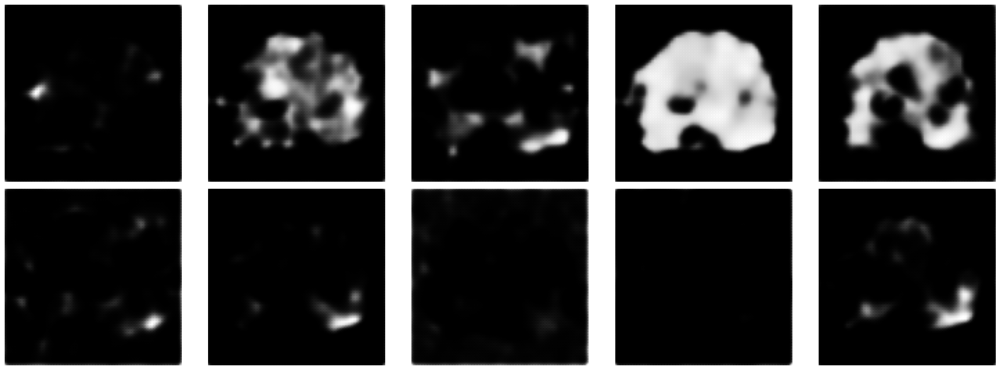

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 12ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:41,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 2/3750 [00:00<08:20,  7.49it/s]

1/1 [==============================] - 0s 12ms/step


  0%|                                                                                                                | 3/3750 [00:00<14:18,  4.37it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 4/3750 [00:00<11:28,  5.44it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<09:52,  6.32it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<09:07,  6.84it/s]

1/1 [==============================] - 0s 11ms/step


  0%|▏                                                                                                               | 7/3750 [00:01<08:51,  7.04it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 8/3750 [00:01<08:13,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<07:50,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<07:33,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<07:23,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<07:14,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<07:08,  8.71it/s]

1/1 [==============================] - 0s 44ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<07:36,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 15/3750 [00:02<07:25,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:02<07:15,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 17/3750 [00:02<07:09,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<07:05,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<07:02,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<07:03,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<07:32,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<07:31,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<07:20,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 24/3750 [00:03<07:13,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 25/3750 [00:03<07:10,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 26/3750 [00:03<07:07,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 27/3750 [00:03<07:05,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<07:16,  8.53it/s]

1/1 [==============================] - 0s 12ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<07:39,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<07:26,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<07:16,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<07:12,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 33/3750 [00:04<07:09,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 34/3750 [00:04<07:04,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 35/3750 [00:04<06:59,  8.86it/s]

1/1 [==============================] - 0s 42ms/step


  1%|█                                                                                                              | 36/3750 [00:04<07:22,  8.39it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█                                                                                                              | 37/3750 [00:04<07:06,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 38/3750 [00:04<07:03,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<07:00,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<06:56,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 41/3750 [00:05<06:54,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 42/3750 [00:05<06:52,  8.98it/s]

1/1 [==============================] - 0s 69ms/step


  1%|█▎                                                                                                             | 43/3750 [00:05<09:05,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  1%|█▎                                                                                                             | 44/3750 [00:05<09:02,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  1%|█▎                                                                                                             | 45/3750 [00:05<09:47,  6.30it/s]

1/1 [==============================] - 0s 12ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<09:45,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


  1%|█▍                                                                                                             | 47/3750 [00:06<09:51,  6.26it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▍                                                                                                             | 48/3750 [00:06<08:59,  6.87it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▍                                                                                                             | 49/3750 [00:06<08:55,  6.91it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▍                                                                                                             | 50/3750 [00:06<08:31,  7.23it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▌                                                                                                             | 51/3750 [00:06<08:12,  7.52it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 52/3750 [00:06<07:43,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 53/3750 [00:06<07:21,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 54/3750 [00:06<07:09,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<07:01,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▋                                                                                                             | 56/3750 [00:07<07:05,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


  2%|█▋                                                                                                             | 57/3750 [00:07<07:35,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 58/3750 [00:07<07:24,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 59/3750 [00:07<07:09,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 60/3750 [00:07<07:00,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 61/3750 [00:07<07:00,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 62/3750 [00:07<06:56,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 63/3750 [00:07<06:54,  8.89it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▉                                                                                                             | 64/3750 [00:07<07:24,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 65/3750 [00:08<07:17,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 66/3750 [00:08<07:29,  8.20it/s]

1/1 [==============================] - 0s 12ms/step


  2%|█▉                                                                                                             | 67/3750 [00:08<07:47,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 68/3750 [00:08<08:00,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██                                                                                                             | 69/3750 [00:08<08:11,  7.50it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██                                                                                                             | 70/3750 [00:08<08:14,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 71/3750 [00:08<08:25,  7.28it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 72/3750 [00:09<08:11,  7.49it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▏                                                                                                            | 73/3750 [00:09<07:54,  7.74it/s]

1/1 [==============================] - 0s 13ms/step


  2%|██▏                                                                                                            | 74/3750 [00:09<08:54,  6.88it/s]

1/1 [==============================] - 0s 16ms/step


  2%|██▏                                                                                                            | 75/3750 [00:09<10:03,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                            | 76/3750 [00:09<10:22,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


  2%|██▎                                                                                                            | 77/3750 [00:09<11:20,  5.40it/s]

1/1 [==============================] - 0s 55ms/step


  2%|██▎                                                                                                            | 78/3750 [00:10<12:34,  4.87it/s]

1/1 [==============================] - 0s 13ms/step


  2%|██▎                                                                                                            | 79/3750 [00:10<11:35,  5.28it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▎                                                                                                            | 80/3750 [00:10<10:49,  5.65it/s]

1/1 [==============================] - 0s 13ms/step


  2%|██▍                                                                                                            | 81/3750 [00:10<10:24,  5.88it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▍                                                                                                            | 82/3750 [00:10<09:39,  6.33it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 83/3750 [00:10<08:55,  6.84it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 84/3750 [00:11<08:30,  7.18it/s]

1/1 [==============================] - 0s 12ms/step


  2%|██▌                                                                                                            | 85/3750 [00:11<08:23,  7.28it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 86/3750 [00:11<08:00,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 87/3750 [00:11<07:44,  7.89it/s]

1/1 [==============================] - 0s 12ms/step


  2%|██▌                                                                                                            | 88/3750 [00:11<07:35,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 89/3750 [00:11<07:25,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 90/3750 [00:11<07:08,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██▋                                                                                                            | 91/3750 [00:11<06:53,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 92/3750 [00:12<07:22,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▊                                                                                                            | 93/3750 [00:12<07:14,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 94/3750 [00:12<07:07,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 95/3750 [00:12<07:01,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 96/3750 [00:12<06:58,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 97/3750 [00:12<06:55,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                            | 98/3750 [00:12<06:52,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                            | 99/3750 [00:12<07:11,  8.47it/s]

1/1 [==============================] - 0s 12ms/step


  3%|██▉                                                                                                           | 100/3750 [00:12<07:33,  8.05it/s]

1/1 [==============================] - 0s 12ms/step


  3%|██▉                                                                                                           | 101/3750 [00:13<07:34,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 102/3750 [00:13<07:22,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 103/3750 [00:13<07:12,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 104/3750 [00:13<07:05,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███                                                                                                           | 105/3750 [00:13<07:06,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███                                                                                                           | 106/3750 [00:13<06:59,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 107/3750 [00:13<07:26,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 108/3750 [00:13<07:12,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▏                                                                                                          | 109/3750 [00:13<07:01,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 110/3750 [00:14<06:52,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 111/3750 [00:14<06:51,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 112/3750 [00:14<06:40,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 113/3750 [00:14<06:33,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 114/3750 [00:14<06:44,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▎                                                                                                          | 115/3750 [00:14<07:00,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 116/3750 [00:14<06:55,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 117/3750 [00:14<06:51,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 118/3750 [00:15<06:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 119/3750 [00:15<06:44,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 120/3750 [00:15<06:47,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 121/3750 [00:15<06:44,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 122/3750 [00:15<07:07,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 123/3750 [00:15<06:58,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 124/3750 [00:15<06:59,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 125/3750 [00:15<06:54,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 126/3750 [00:15<06:50,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 127/3750 [00:16<06:47,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 128/3750 [00:16<06:44,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 129/3750 [00:16<07:19,  8.23it/s]

1/1 [==============================] - 0s 12ms/step


  3%|███▊                                                                                                          | 130/3750 [00:16<07:11,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▊                                                                                                          | 131/3750 [00:16<07:03,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▊                                                                                                          | 132/3750 [00:16<06:56,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 133/3750 [00:16<06:45,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 134/3750 [00:16<06:40,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 135/3750 [00:16<06:33,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▉                                                                                                          | 136/3750 [00:17<06:34,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 137/3750 [00:17<06:44,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 138/3750 [00:17<06:46,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 139/3750 [00:17<06:45,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 140/3750 [00:17<06:42,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 141/3750 [00:17<06:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 142/3750 [00:17<06:40,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 143/3750 [00:17<06:39,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 144/3750 [00:17<07:05,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 145/3750 [00:18<06:58,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 146/3750 [00:18<06:53,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 147/3750 [00:18<06:51,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 148/3750 [00:18<06:48,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 149/3750 [00:18<06:44,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 150/3750 [00:18<06:42,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 151/3750 [00:18<06:37,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 152/3750 [00:18<07:14,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 153/3750 [00:18<07:03,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 154/3750 [00:19<06:55,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 155/3750 [00:19<06:49,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▌                                                                                                         | 156/3750 [00:19<06:48,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 157/3750 [00:19<06:45,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 158/3750 [00:19<06:38,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 159/3750 [00:19<07:03,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 160/3750 [00:19<06:56,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▋                                                                                                         | 161/3750 [00:19<06:51,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 162/3750 [00:20<06:49,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 163/3750 [00:20<06:45,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 164/3750 [00:20<06:43,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 165/3750 [00:20<06:44,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 166/3750 [00:20<06:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 167/3750 [00:20<06:47,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▉                                                                                                         | 168/3750 [00:20<06:56,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:20<06:50,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 170/3750 [00:20<06:45,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 171/3750 [00:21<06:42,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 172/3750 [00:21<06:40,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 173/3750 [00:21<06:39,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 174/3750 [00:21<06:41,  8.91it/s]

1/1 [==============================] - 0s 40ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:21<07:07,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:21<06:59,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:21<06:53,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:21<06:47,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:21<06:43,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:22<06:42,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:22<06:41,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:22<07:05,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:22<07:00,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:22<06:53,  8.63it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:22<06:49,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:22<06:43,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:22<06:40,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:22<06:38,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:23<06:40,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:23<06:45,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:23<06:40,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:23<06:42,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:23<06:41,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:23<06:43,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:23<06:39,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:23<06:36,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:24<07:09,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:24<07:01,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:24<06:52,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:24<06:53,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:24<06:50,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:24<06:44,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:24<06:41,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:24<06:52,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  5%|██████                                                                                                        | 205/3750 [00:24<07:05,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 206/3750 [00:25<06:56,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████                                                                                                        | 207/3750 [00:25<06:49,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████                                                                                                        | 208/3750 [00:25<06:43,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:25<06:38,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:25<06:37,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:25<06:35,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:25<06:35,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:25<06:33,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:25<06:34,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:26<06:34,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:26<06:33,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:26<06:33,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:26<06:32,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:26<07:01,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:26<06:52,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:26<06:46,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:26<06:41,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:26<06:42,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:27<06:40,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:27<06:38,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:27<06:52,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:27<06:46,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:27<06:45,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:27<06:38,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:27<06:37,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:27<06:38,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:28<06:38,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:28<06:35,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:28<07:01,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:28<06:57,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:28<06:49,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:28<06:45,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:28<06:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 239/3750 [00:28<06:39,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 240/3750 [00:28<06:39,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 241/3750 [00:29<06:42,  8.71it/s]

1/1 [==============================] - 0s 12ms/step


  6%|███████                                                                                                       | 242/3750 [00:29<07:08,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:29<06:57,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:29<06:48,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:29<06:42,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:29<06:42,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:29<06:37,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:29<06:33,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:29<07:03,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:30<06:58,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:30<06:49,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:30<06:43,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:30<06:38,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:30<06:35,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:30<06:38,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:30<06:34,  8.86it/s]

1/1 [==============================] - 0s 56ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:30<07:25,  7.85it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:31<07:04,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:31<06:55,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:31<06:56,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:31<06:47,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:31<06:40,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:31<06:34,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:31<07:11,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:31<07:05,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:31<06:53,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:32<06:46,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:32<06:40,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:32<06:36,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:32<06:32,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:32<06:29,  8.94it/s]

1/1 [==============================] - 0s 12ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:32<07:08,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 273/3750 [00:32<06:59,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 274/3750 [00:32<06:49,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 275/3750 [00:33<06:42,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 276/3750 [00:33<06:37,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:33<06:34,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:33<06:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:33<06:56,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:33<06:48,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:33<06:41,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:33<06:38,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:33<06:33,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:34<06:31,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:34<06:32,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:34<06:30,  8.86it/s]

1/1 [==============================] - 0s 48ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:34<07:14,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:34<07:01,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:34<06:49,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:34<06:41,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:34<06:38,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:34<06:27,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:35<06:19,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:35<06:29,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:35<06:36,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:35<06:30,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:35<06:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:35<06:28,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:35<06:37,  8.69it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:35<06:41,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:36<06:34,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:36<06:56,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:36<06:48,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:36<06:41,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:36<06:35,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:36<06:32,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████                                                                                                     | 307/3750 [00:36<06:29,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 308/3750 [00:36<06:26,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 309/3750 [00:36<06:28,  8.86it/s]

1/1 [==============================] - 0s 15ms/step


  8%|█████████                                                                                                     | 310/3750 [00:37<07:02,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████                                                                                                     | 311/3750 [00:37<06:50,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:37<06:41,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:37<06:34,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:37<06:32,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:37<06:30,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:37<06:26,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:37<06:50,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:38<06:45,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:38<06:38,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:38<06:33,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:38<06:29,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:38<06:26,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:38<06:23,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:38<06:29,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:38<06:54,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:38<06:44,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:39<06:38,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:39<06:32,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:39<06:28,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:39<06:26,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:39<06:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:39<07:09,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:39<06:53,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:39<06:37,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:39<06:25,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:40<06:23,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:40<06:17,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:40<06:17,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:40<06:23,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:40<06:27,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 341/3750 [00:40<06:25,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 342/3750 [00:40<06:21,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████                                                                                                    | 343/3750 [00:40<06:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 344/3750 [00:40<06:19,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 345/3750 [00:41<06:17,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:41<06:18,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:41<06:46,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:41<06:38,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:41<06:31,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:41<06:25,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:41<06:21,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:41<06:18,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:41<06:17,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:42<06:14,  9.06it/s]

1/1 [==============================] - 0s 18ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:42<06:54,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:42<06:41,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:42<06:34,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:42<06:28,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:42<06:28,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:42<06:24,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:42<06:21,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:43<06:49,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:43<06:42,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:43<06:37,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:43<06:29,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:43<06:24,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:43<06:21,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:43<06:24,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:43<06:19,  8.92it/s]

1/1 [==============================] - 0s 18ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:43<06:53,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:44<06:42,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:44<06:34,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:44<06:34,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:44<06:28,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 375/3750 [00:44<06:24,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 376/3750 [00:44<06:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 377/3750 [00:44<06:19,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████                                                                                                   | 378/3750 [00:44<06:22,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████                                                                                                   | 379/3750 [00:44<06:22,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:45<06:19,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:45<06:17,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:45<06:17,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:45<06:15,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:45<06:13,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:45<06:45,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:45<06:41,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:45<06:33,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:46<06:25,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:46<06:19,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:46<06:16,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:46<06:16,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:46<06:14,  8.97it/s]

1/1 [==============================] - 0s 41ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:46<06:44,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:46<06:36,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:46<06:27,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:46<06:22,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:47<06:17,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:47<06:16,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:47<06:14,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:47<06:28,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:47<06:25,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:47<06:20,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:47<06:28,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:47<06:19,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:47<06:16,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:48<06:13,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:48<06:11,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:48<06:48,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:48<07:02,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████                                                                                                  | 410/3750 [00:48<06:52,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 411/3750 [00:48<06:39,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 412/3750 [00:48<06:30,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████                                                                                                  | 413/3750 [00:48<06:23,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:49<06:18,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:49<06:23,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:49<06:32,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:49<06:24,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:49<06:22,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:49<06:17,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:49<06:13,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:49<06:13,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:49<06:12,  8.94it/s]

1/1 [==============================] - 0s 35ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:50<06:31,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:50<06:26,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:50<06:21,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:50<06:19,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:50<06:18,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:50<06:14,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:50<06:13,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:50<06:16,  8.82it/s]

1/1 [==============================] - 0s 12ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:50<06:37,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:51<06:30,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:51<06:22,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:51<06:16,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:51<06:13,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:51<06:14,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:51<06:11,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:51<06:42,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:51<06:34,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:52<06:48,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:52<06:35,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:52<06:26,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:52<06:20,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:52<06:19,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:52<06:17,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:52<06:43,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:52<06:35,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:52<06:28,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:53<06:22,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:53<06:17,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:53<06:13,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:53<06:16,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:53<06:18,  8.71it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:53<06:54,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:53<06:42,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:53<06:34,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:54<06:27,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:54<06:22,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:54<06:16,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:54<06:14,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:54<06:18,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:54<06:32,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:54<06:27,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:54<06:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:54<06:13,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:55<06:10,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:55<06:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:55<06:07,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:55<08:01,  6.81it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:55<08:06,  6.74it/s]

1/1 [==============================] - 0s 8ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:55<07:27,  7.33it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:55<07:02,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:55<06:44,  8.11it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:56<06:49,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:56<06:36,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:56<06:53,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:56<06:42,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 478/3750 [00:56<06:31,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 479/3750 [00:56<06:23,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 480/3750 [00:56<06:19,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 481/3750 [00:56<06:26,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:57<06:18,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:57<06:13,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:57<06:43,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:57<06:32,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:57<06:24,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:57<06:16,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:57<06:12,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:57<06:06,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:57<06:06,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:58<06:03,  8.95it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:58<06:39,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:58<06:28,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:58<06:20,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:58<06:15,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:58<07:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:58<07:40,  7.06it/s]

1/1 [==============================] - 0s 22ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:59<08:07,  6.67it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:59<08:35,  6.30it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:59<09:08,  5.93it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:59<08:29,  6.38it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:59<07:45,  6.98it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 503/3750 [00:59<07:16,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 504/3750 [00:59<06:51,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 505/3750 [01:00<06:36,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 506/3750 [01:00<07:31,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▊                                                                                               | 507/3750 [01:00<07:05,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 508/3750 [01:00<06:45,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 509/3750 [01:00<06:37,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 510/3750 [01:00<06:26,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 511/3750 [01:00<06:25,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 512/3750 [01:00<06:24,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 513/3750 [01:01<06:29,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 514/3750 [01:01<06:43,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 515/3750 [01:01<06:29,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 516/3750 [01:01<06:24,  8.40it/s]

1/1 [==============================] - 0s 13ms/step


 14%|███████████████▏                                                                                              | 517/3750 [01:01<06:30,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 518/3750 [01:01<06:32,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 519/3750 [01:01<06:23,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 520/3750 [01:01<06:17,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 521/3750 [01:01<06:28,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 522/3750 [01:02<06:23,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [01:02<06:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 524/3750 [01:02<06:13,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▍                                                                                              | 525/3750 [01:02<06:12,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 526/3750 [01:02<06:02,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 527/3750 [01:02<05:57,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 528/3750 [01:02<05:51,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 529/3750 [01:02<06:27,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▌                                                                                              | 530/3750 [01:03<06:22,  8.42it/s]

1/1 [==============================] - 0s 13ms/step


 14%|███████████████▌                                                                                              | 531/3750 [01:03<06:48,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 532/3750 [01:03<06:57,  7.70it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▋                                                                                              | 533/3750 [01:03<07:14,  7.40it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▋                                                                                              | 534/3750 [01:03<07:15,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 535/3750 [01:03<07:24,  7.24it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▋                                                                                              | 536/3750 [01:03<07:51,  6.82it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 537/3750 [01:04<07:35,  7.06it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 538/3750 [01:04<07:09,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:04<06:53,  7.76it/s]

1/1 [==============================] - 0s 14ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:04<06:51,  7.81it/s]

1/1 [==============================] - 0s 12ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:04<06:44,  7.93it/s]

1/1 [==============================] - 0s 12ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:04<07:38,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:04<07:33,  7.07it/s]

1/1 [==============================] - 0s 69ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:04<08:09,  6.55it/s]

1/1 [==============================] - 0s 11ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:05<07:51,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 15%|████████████████                                                                                              | 546/3750 [01:05<07:43,  6.91it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████                                                                                              | 547/3750 [01:05<07:46,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 15%|████████████████                                                                                              | 548/3750 [01:05<07:52,  6.78it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 549/3750 [01:05<07:27,  7.15it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:05<07:51,  6.79it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:06<07:54,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:06<08:17,  6.42it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:06<08:09,  6.53it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:06<09:16,  5.74it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:06<09:12,  5.78it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:06<08:59,  5.92it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:07<08:15,  6.44it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:07<08:14,  6.45it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:07<07:39,  6.94it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:07<07:12,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:07<06:54,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:07<06:41,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:07<06:32,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:07<06:22,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:07<06:18,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:08<06:22,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:08<06:26,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:08<06:20,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:08<06:19,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:08<06:14,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:08<06:12,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:08<06:15,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:08<06:12,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:09<06:07,  8.65it/s]

1/1 [==============================] - 0s 14ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:09<06:48,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:09<06:35,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:09<06:26,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:09<06:16,  8.42it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:09<06:09,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:09<06:06,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:09<06:08,  8.59it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:09<06:11,  8.54it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:10<06:34,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:10<06:24,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:10<06:21,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:10<06:13,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:10<06:11,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:10<06:09,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:10<06:09,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:10<06:08,  8.57it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:11<06:51,  7.69it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:11<06:35,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:11<06:23,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:11<06:12,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:11<06:08,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:11<06:01,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:11<06:00,  8.75it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:11<06:31,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:12<06:34,  7.99it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:12<06:17,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:12<06:06,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:12<05:55,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:12<05:52,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:12<05:54,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:12<05:53,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:12<05:57,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:12<06:28,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:13<06:24,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:13<06:14,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:13<06:04,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:13<06:11,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:13<06:03,  8.63it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:13<05:59,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:13<05:54,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:13<06:00,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:14<05:57,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:14<05:56,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:14<05:55,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:14<05:56,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:14<06:02,  8.63it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:14<06:36,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:14<06:30,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:14<06:23,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:14<06:15,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:15<06:08,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:15<06:04,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:15<05:58,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:15<05:59,  8.67it/s]

1/1 [==============================] - 0s 42ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:15<06:27,  8.05it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:15<06:30,  8.00it/s]

1/1 [==============================] - 0s 8ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:15<06:12,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:15<06:05,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:16<06:02,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:16<05:57,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:16<05:56,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:16<05:56,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:16<05:59,  8.65it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:16<06:02,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:16<06:02,  8.58it/s]

1/1 [==============================] - 0s 13ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:16<06:10,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:16<06:00,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:17<05:53,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:17<05:51,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:17<05:52,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:17<05:53,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:17<05:59,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:17<05:52,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:17<05:51,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:17<05:51,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:17<05:49,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:18<06:04,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:18<06:49,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:18<06:34,  7.86it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:18<06:20,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:18<06:12,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:18<06:03,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:18<05:56,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:18<05:52,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:19<05:48,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:19<05:45,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:19<05:44,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:19<05:46,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:19<05:45,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:19<05:38,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:19<05:36,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:19<05:41,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:19<05:43,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:20<05:43,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:20<05:42,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:20<05:41,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:20<05:41,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:20<05:44,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:20<05:45,  8.92it/s]

1/1 [==============================] - 0s 14ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:20<06:21,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:20<06:10,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:20<06:01,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:21<05:54,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:21<05:47,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:21<05:45,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:21<05:41,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:21<05:38,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:21<06:02,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:21<05:58,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:21<05:52,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:21<05:48,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:22<05:45,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:22<05:44,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:22<05:41,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:22<05:38,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:22<06:02,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:22<05:59,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:22<05:53,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:22<05:48,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:23<05:43,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:23<05:40,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:23<05:39,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:23<05:38,  9.03it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:23<06:01,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:23<06:00,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:23<05:53,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:23<05:47,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:23<05:43,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:24<05:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:24<05:38,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:24<05:44,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:24<06:05,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:24<05:56,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:24<05:52,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:24<05:46,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:24<05:42,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:24<05:40,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:25<05:40,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:25<06:07,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:25<05:59,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:25<06:07,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:25<06:00,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:25<05:59,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:25<06:04,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:25<05:58,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:26<06:05,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:26<06:02,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:26<05:55,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:26<05:49,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:26<05:49,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:26<05:45,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:26<05:46,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:26<05:41,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:26<05:42,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:27<05:43,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:27<05:41,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:27<05:40,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:27<05:39,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:27<05:40,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:27<05:34,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:27<05:33,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:27<05:31,  9.08it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:27<05:36,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:28<05:35,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:28<05:35,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:28<05:34,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:28<05:35,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:28<05:34,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:28<05:37,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:28<05:41,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:28<05:41,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:28<05:40,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:29<05:39,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:29<05:39,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:29<05:38,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:29<05:36,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:29<05:39,  8.83it/s]

1/1 [==============================] - 0s 12ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:29<06:10,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:29<06:02,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:29<05:56,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:30<05:50,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:30<05:44,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:30<05:40,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:30<05:37,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:30<05:34,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:30<06:07,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:30<05:59,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:30<05:54,  8.43it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:30<05:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:31<05:38,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:31<05:36,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:31<05:33,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:31<05:30,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:31<05:48,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:31<05:42,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:31<05:35,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:31<05:30,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:31<05:31,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:32<05:30,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:32<05:30,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:32<05:29,  9.04it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:32<06:02,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:32<05:51,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:32<05:44,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:32<05:40,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:32<05:35,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:32<05:36,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:33<05:34,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:33<05:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:33<05:57,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:33<05:50,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:33<05:43,  8.64it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:33<05:35,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:33<05:32,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:33<05:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:34<05:32,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:34<05:37,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:34<05:56,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:34<05:48,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:34<05:41,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:34<05:37,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:34<05:35,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:34<05:32,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:34<05:30,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:35<05:32,  8.88it/s]

1/1 [==============================] - 0s 12ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:35<06:03,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:35<05:53,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:35<05:42,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:35<05:33,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:35<05:30,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:35<05:24,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:35<05:18,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:35<05:25,  9.05it/s]

1/1 [==============================] - 0s 12ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:36<05:40,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:36<05:40,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:36<05:36,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:36<05:28,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:36<05:20,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:36<05:20,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:36<05:22,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:36<05:30,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:37<05:53,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:37<05:44,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:37<05:40,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:37<05:34,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:37<05:32,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:37<05:29,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:37<05:27,  8.93it/s]

1/1 [==============================] - 0s 13ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:37<05:32,  8.80it/s]

1/1 [==============================] - 0s 13ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:37<06:03,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:38<05:54,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:38<05:47,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:38<05:44,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:38<05:38,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:38<05:34,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:38<05:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:38<05:27,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:38<05:59,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:38<05:50,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:39<05:44,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:39<05:37,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:39<05:35,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:39<05:31,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:39<05:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:39<05:25,  8.94it/s]

1/1 [==============================] - 0s 40ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:39<05:59,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:39<05:48,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:40<05:40,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:40<05:34,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:40<05:29,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:40<05:33,  8.72it/s]

1/1 [==============================] - 0s 13ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:40<06:28,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:40<07:13,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:40<07:52,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:41<08:13,  5.88it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:41<07:20,  6.59it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:41<06:43,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:41<06:18,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:41<06:03,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:41<05:55,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:41<06:12,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:41<05:57,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:42<05:44,  8.40it/s]

1/1 [==============================] - 0s 14ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:42<05:58,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:42<05:45,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:42<05:37,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:42<05:31,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:42<05:28,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:42<05:26,  8.84it/s]

1/1 [==============================] - 0s 13ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:42<05:30,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:42<05:25,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:43<05:20,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:43<05:19,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:43<05:18,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:43<05:17,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:43<05:17,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:43<05:17,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:43<06:10,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:43<06:17,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:44<06:21,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:44<06:36,  7.24it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:44<06:38,  7.21it/s]

1/1 [==============================] - 0s 15ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:44<06:40,  7.17it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:44<06:14,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:44<05:59,  7.99it/s]

1/1 [==============================] - 0s 67ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:44<07:03,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:45<08:00,  5.97it/s]

1/1 [==============================] - 0s 50ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:45<08:31,  5.60it/s]

1/1 [==============================] - 0s 12ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:45<08:17,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:45<08:14,  5.79it/s]

1/1 [==============================] - 0s 30ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:45<09:00,  5.30it/s]

1/1 [==============================] - 0s 11ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:46<08:22,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:46<08:29,  5.62it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:46<07:54,  6.04it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:46<07:10,  6.64it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:46<06:42,  7.11it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:46<06:22,  7.48it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:46<06:05,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:46<05:55,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:47<05:48,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:47<06:12,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:47<06:01,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:47<05:48,  8.19it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:47<05:33,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:47<05:29,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:47<05:29,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:47<05:28,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:47<05:23,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:48<05:44,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:48<05:36,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:48<05:32,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:48<05:25,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:48<05:17,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:48<05:11,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:48<05:13,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:48<05:15,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:49<05:36,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:49<05:30,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:49<05:24,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:49<05:20,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:49<05:18,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:49<05:16,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:49<05:15,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:49<05:16,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:49<05:42,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:50<05:35,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:50<05:28,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:50<05:23,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:50<05:20,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:50<05:19,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:50<05:17,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:50<05:18,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:50<05:44,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:50<05:35,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:51<05:29,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:51<05:23,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:51<05:19,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:51<05:18,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:51<05:18,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:51<05:17,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:51<05:25,  8.64it/s]

1/1 [==============================] - 0s 14ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:51<05:37,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:52<05:29,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:52<05:22,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:52<05:14,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:52<05:36,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:52<05:28,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:52<05:22,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:52<05:30,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:52<05:32,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:52<05:32,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:53<05:27,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:53<05:22,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:53<05:20,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:53<05:19,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:53<05:34,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:53<05:25,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:53<05:50,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:53<05:38,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:54<05:30,  8.46it/s]

1/1 [==============================] - 0s 8ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:54<05:19,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:54<05:12,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:54<05:11,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:54<05:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:54<05:08,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:54<05:30,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:54<05:24,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:54<05:19,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:55<05:21,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:55<05:18,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:55<05:14,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:55<05:06,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:55<05:09,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:55<05:10,  8.97it/s]

1/1 [==============================] - 0s 13ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:55<05:45,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:55<05:33,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:55<05:24,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:56<05:21,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:56<05:19,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:56<05:15,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:56<05:14,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:56<05:12,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:56<05:27,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:56<05:21,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:56<05:16,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:56<05:12,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:57<05:12,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:57<05:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:57<05:09,  8.93it/s]

1/1 [==============================] - 0s 12ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:57<05:13,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:57<05:39,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:57<05:32,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:57<05:24,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:57<05:17,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:58<05:16,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:58<05:15,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:58<05:19,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:58<05:14,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:58<05:40,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:58<05:30,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:58<05:23,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:58<05:17,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:58<05:13,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:59<05:10,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:59<05:12,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:59<05:13,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [01:59<05:32,  8.27it/s]

1/1 [==============================] - 0s 15ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [01:59<05:41,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [01:59<05:31,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [01:59<05:25,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [01:59<05:21,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [02:00<05:21,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [02:00<05:13,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [02:00<05:07,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [02:00<05:07,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [02:00<05:10,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [02:00<05:20,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [02:00<05:17,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [02:00<05:12,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [02:00<05:10,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [02:01<05:04,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [02:01<04:59,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [02:01<04:59,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [02:01<05:01,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [02:01<05:26,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [02:01<05:20,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [02:01<05:15,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [02:01<05:10,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [02:01<05:07,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [02:02<05:04,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [02:02<05:02,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [02:02<05:01,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [02:02<05:25,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [02:02<05:19,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [02:02<05:13,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [02:02<05:15,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [02:02<05:11,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [02:02<05:06,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [02:03<05:04,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [02:03<05:03,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [02:03<05:07,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [02:03<05:12,  8.70it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [02:03<08:35,  5.26it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [02:03<07:32,  6.00it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [02:04<06:41,  6.75it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [02:04<06:12,  7.27it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [02:04<05:50,  7.74it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [02:04<06:08,  7.35it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [02:04<05:48,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [02:04<05:33,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [02:04<05:24,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [02:04<05:31,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [02:04<05:23,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [02:05<05:18,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [02:05<05:12,  8.63it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [02:05<05:42,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [02:05<05:31,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [02:05<05:21,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [02:05<05:14,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [02:05<05:10,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [02:05<05:06,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [02:05<05:04,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [02:06<05:02,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [02:06<05:23,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [02:06<05:18,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [02:06<05:12,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [02:06<05:08,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [02:06<05:05,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [02:06<05:05,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [02:06<05:03,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [02:07<05:02,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [02:07<05:09,  8.67it/s]

1/1 [==============================] - 0s 14ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [02:07<05:21,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [02:07<05:14,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [02:07<05:09,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [02:07<05:06,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [02:07<05:07,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [02:07<05:07,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [02:07<05:04,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [02:08<05:24,  8.25it/s]

1/1 [==============================] - 0s 13ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:08<05:39,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:08<05:28,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:08<05:20,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:08<05:14,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:08<05:09,  8.62it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:08<05:03,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:08<05:04,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:09<05:02,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:09<05:23,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:09<05:18,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:09<05:12,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:09<05:13,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:09<05:09,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:09<05:07,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:09<05:00,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:09<05:01,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:10<05:10,  8.58it/s]

1/1 [==============================] - 0s 14ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:10<05:16,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:10<05:11,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:10<05:07,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:10<05:03,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:10<05:01,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:10<04:58,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:10<04:56,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:10<04:58,  8.89it/s]

1/1 [==============================] - 0s 49ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:11<05:30,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:11<05:20,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:11<05:12,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:11<05:11,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:11<05:04,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:11<05:01,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:11<04:58,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:11<04:55,  8.93it/s]

1/1 [==============================] - 0s 15ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:12<05:16,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:12<05:12,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:12<05:07,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:12<05:03,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:12<05:00,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:12<04:58,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:12<04:58,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:12<04:56,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:12<05:14,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:13<05:10,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:13<05:06,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:13<05:00,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:13<04:59,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:13<05:13,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:13<05:05,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:13<05:02,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:13<05:32,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:14<05:22,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:14<05:14,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:14<05:06,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:14<05:01,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:14<04:57,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:14<04:58,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:14<04:57,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:14<04:57,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:14<04:57,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:15<04:55,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:15<04:56,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:15<04:53,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:15<04:52,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:15<04:51,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:15<04:52,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:15<04:52,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:15<05:15,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:15<05:09,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:16<05:02,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:16<05:04,  8.56it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:16<04:55,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:16<04:51,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:16<04:47,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:16<04:46,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:16<04:47,  9.04it/s]

1/1 [==============================] - 0s 44ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:16<05:18,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:17<05:10,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:17<05:03,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:17<05:02,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:17<04:57,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:17<04:54,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:17<04:52,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:17<04:50,  8.92it/s]

1/1 [==============================] - 0s 17ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:17<05:10,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:17<05:02,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:18<04:57,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:18<04:54,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:18<04:55,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:18<04:51,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:18<04:50,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:18<04:48,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:18<05:01,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:18<04:59,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:18<04:55,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:19<04:52,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:19<04:51,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:19<04:59,  8.61it/s]

1/1 [==============================] - 0s 14ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:19<05:31,  7.78it/s]

1/1 [==============================] - 0s 12ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:19<05:21,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:19<05:12,  8.25it/s]

1/1 [==============================] - 0s 12ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:19<05:09,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:19<05:03,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:20<04:59,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:20<04:55,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:20<05:08,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:20<05:09,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:20<05:03,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:20<04:58,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:20<04:50,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:20<04:44,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:20<04:44,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:21<04:45,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:21<04:44,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:21<04:51,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:21<04:56,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:21<04:54,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:21<04:50,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:21<04:46,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:21<04:44,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:21<04:45,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:22<04:42,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:22<04:41,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:22<05:10,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:22<05:03,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:22<04:58,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:22<04:52,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:22<04:50,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:22<04:47,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:22<04:45,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:23<04:44,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:23<04:47,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:23<05:13,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:23<05:05,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:23<05:03,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:23<04:56,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:23<04:51,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:23<04:51,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:24<04:49,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:24<04:47,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:24<04:48,  8.80it/s]

1/1 [==============================] - 0s 12ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:24<05:30,  7.68it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:24<05:14,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:24<05:05,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:24<04:56,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:24<04:52,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:24<04:49,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:25<04:46,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:25<04:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:25<05:01,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:25<04:58,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:25<04:52,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:25<04:50,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:25<04:45,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:25<04:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:26<04:41,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:26<04:39,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:26<04:44,  8.86it/s]

1/1 [==============================] - 0s 12ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:26<05:03,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:26<05:00,  8.37it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:26<05:38,  7.43it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:26<06:05,  6.88it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:26<06:10,  6.79it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:27<05:56,  7.05it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:27<06:29,  6.45it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:27<06:03,  6.92it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:27<06:01,  6.94it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:27<05:43,  7.31it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:27<05:26,  7.68it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:27<05:14,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:28<05:08,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:28<05:03,  8.25it/s]

1/1 [==============================] - 0s 12ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:28<04:58,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:28<04:54,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:28<05:04,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:28<04:59,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:28<04:52,  8.56it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:28<04:47,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:28<04:40,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:29<04:34,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:29<04:33,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:29<04:33,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:29<04:33,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:29<04:53,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:29<04:51,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:29<04:50,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:29<04:49,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:29<04:46,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:30<04:43,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:30<04:42,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:30<04:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:30<04:39,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:30<05:01,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:30<04:54,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:30<04:48,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:30<04:43,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:31<04:39,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:31<04:37,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:31<04:38,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:31<04:56,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:31<05:21,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:31<05:31,  7.47it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:31<05:35,  7.38it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:31<05:35,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:32<05:41,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:32<05:24,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:32<05:09,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:32<05:00,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:32<04:52,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:32<04:49,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:32<04:46,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:32<04:40,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:32<04:37,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:33<04:35,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:33<04:34,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:33<04:34,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:33<04:40,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:33<04:56,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:33<06:14,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:34<07:25,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:34<07:20,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:34<07:10,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:34<07:46,  5.26it/s]

1/1 [==============================] - 0s 15ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:34<08:04,  5.06it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:34<07:20,  5.56it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:35<07:26,  5.49it/s]

1/1 [==============================] - 0s 12ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:35<07:18,  5.58it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:35<06:50,  5.97it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:35<06:27,  6.32it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:35<05:55,  6.89it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:35<05:35,  7.30it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:35<05:21,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:36<05:11,  7.85it/s]

1/1 [==============================] - 0s 12ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:36<05:10,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:36<05:12,  7.82it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:36<05:15,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:36<05:04,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:36<04:56,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:36<04:50,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:36<04:45,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:37<04:46,  8.49it/s]

1/1 [==============================] - 0s 12ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:37<04:47,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:37<04:44,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:37<04:50,  8.37it/s]

1/1 [==============================] - 0s 13ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:37<04:55,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:37<04:48,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:37<04:44,  8.54it/s]

1/1 [==============================] - 0s 12ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:37<04:42,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:37<04:42,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:38<04:44,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:38<04:42,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:38<04:40,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:38<05:04,  7.97it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:38<05:01,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:38<04:55,  8.20it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:38<04:49,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:38<04:44,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:39<04:42,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:39<04:40,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:39<04:38,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:39<04:38,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:39<04:49,  8.36it/s]

1/1 [==============================] - 0s 15ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:39<05:03,  7.96it/s]

1/1 [==============================] - 0s 13ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:39<04:54,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:39<04:46,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:40<04:42,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:40<04:39,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:40<04:35,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:40<04:32,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:40<04:32,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:40<04:58,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:40<04:50,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:40<04:44,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:40<04:36,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:41<04:29,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:41<04:23,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:41<04:24,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:41<04:24,  9.06it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:41<04:26,  8.99it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:41<04:54,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:41<04:45,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:41<04:40,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:41<04:37,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:42<04:30,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:42<04:30,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:42<04:30,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:42<04:32,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:42<04:32,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:42<04:56,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:42<04:47,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:42<04:39,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:43<04:34,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:43<04:31,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:43<04:28,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:43<04:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:43<04:27,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:43<04:49,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:43<04:43,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:43<04:34,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:43<04:31,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:44<04:30,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:44<04:28,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:44<04:28,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:44<04:27,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:44<04:25,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:44<04:31,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:44<04:37,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:44<04:35,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:44<04:31,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:45<04:28,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:45<04:25,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:45<04:23,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:45<04:24,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:45<04:23,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:45<04:30,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:45<04:45,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:45<04:40,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:45<04:35,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:46<04:31,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:46<04:27,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:46<04:28,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:46<04:28,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:46<04:27,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:46<04:34,  8.59it/s]

1/1 [==============================] - 0s 12ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:46<04:51,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:46<04:42,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:47<04:37,  8.47it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:47<04:28,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:47<04:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:47<04:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:47<04:21,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:47<04:23,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:47<04:28,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:47<04:33,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:47<04:29,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:48<04:25,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:48<04:24,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:48<04:23,  8.89it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:48<04:35,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:48<04:30,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:48<04:25,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:48<04:25,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:48<04:46,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:49<04:37,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:49<04:33,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:49<04:27,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:49<04:24,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:49<04:21,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:49<04:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:49<04:18,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:49<04:41,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:49<04:38,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:50<04:34,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:50<04:29,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:50<04:27,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:50<04:33,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:50<04:25,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:50<04:23,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:50<04:21,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:50<04:37,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:50<04:32,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:51<04:29,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:51<04:24,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:51<04:21,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:51<04:19,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:51<04:17,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:51<04:14,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:51<04:14,  9.06it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:51<04:20,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:51<04:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:52<04:20,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:52<04:19,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:52<04:17,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:52<04:16,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:52<04:15,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:52<04:15,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:52<04:13,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:52<04:33,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:52<04:27,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:53<04:25,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:53<04:21,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:53<04:19,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:53<04:16,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:53<04:15,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:53<04:15,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:53<04:15,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:53<04:35,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:54<04:29,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:54<04:26,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:54<04:20,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:54<04:18,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:54<04:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:54<04:14,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:54<04:13,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:54<04:18,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:54<04:35,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:55<04:28,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:55<04:25,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:55<04:22,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:55<04:20,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:55<04:22,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:55<04:20,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:55<04:17,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:55<04:38,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:55<04:34,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:56<04:27,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:56<04:24,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:56<04:21,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:56<04:19,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:56<04:12,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:56<04:12,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:56<04:09,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:56<04:34,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:57<04:28,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:57<04:23,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:57<04:22,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:57<04:18,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:57<04:17,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:57<04:15,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:57<04:13,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:57<04:18,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:57<04:31,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:58<04:24,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:58<04:20,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:58<04:18,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:58<04:15,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:58<04:12,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:58<04:11,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:58<04:11,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:58<04:33,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:58<04:29,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:59<04:23,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [02:59<04:20,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [02:59<04:17,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [02:59<04:15,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [02:59<04:13,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [02:59<04:16,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [02:59<04:14,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [02:59<04:29,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [03:00<04:27,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [03:00<04:20,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [03:00<04:15,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [03:00<04:13,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [03:00<04:12,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [03:00<04:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [03:00<04:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [03:00<04:09,  8.94it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [03:00<04:37,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [03:01<04:29,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [03:01<04:22,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [03:01<04:17,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [03:01<04:13,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [03:01<04:09,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [03:01<04:07,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [03:01<04:06,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [03:01<04:27,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [03:01<04:23,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [03:02<04:18,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [03:02<04:14,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [03:02<04:11,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [03:02<04:09,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [03:02<04:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [03:02<04:06,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [03:02<04:06,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [03:02<04:24,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [03:03<04:21,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [03:03<04:17,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [03:03<04:13,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [03:03<04:09,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [03:03<04:06,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [03:03<04:09,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [03:03<04:07,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [03:03<04:07,  8.90it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [03:03<04:37,  7.93it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [03:04<04:34,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [03:04<04:25,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [03:04<04:21,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [03:04<04:16,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [03:04<04:14,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [03:04<04:13,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [03:04<04:09,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [03:04<04:06,  8.89it/s]

1/1 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [03:05<04:36,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [03:05<04:26,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [03:05<04:18,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [03:05<04:13,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [03:05<04:09,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [03:05<04:09,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [03:05<04:09,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [03:05<04:12,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [03:05<04:32,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [03:06<04:24,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [03:06<04:18,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [03:06<04:14,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [03:06<04:10,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [03:06<04:07,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [03:06<04:06,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [03:06<04:06,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [03:06<04:06,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [03:07<04:34,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [03:07<04:43,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [03:07<04:30,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [03:07<04:20,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [03:07<04:14,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [03:07<04:10,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [03:07<04:07,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [03:07<04:05,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [03:07<04:21,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [03:08<04:15,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [03:08<04:10,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [03:08<04:06,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [03:08<04:08,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [03:08<04:06,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [03:08<04:03,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [03:08<04:01,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [03:08<04:02,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [03:08<04:20,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [03:09<04:14,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [03:09<04:10,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [03:09<04:05,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [03:09<04:03,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [03:09<04:01,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [03:09<04:00,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [03:09<03:59,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [03:09<04:06,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [03:10<04:15,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [03:10<04:09,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [03:10<04:06,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [03:10<04:08,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [03:10<04:09,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [03:10<04:05,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [03:10<04:03,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [03:10<04:01,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [03:10<04:09,  8.60it/s]

1/1 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [03:11<04:17,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [03:11<04:11,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [03:11<04:07,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [03:11<04:03,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [03:11<04:01,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [03:11<03:59,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [03:11<03:59,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [03:11<03:58,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [03:11<04:14,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [03:12<04:10,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [03:12<04:07,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [03:12<04:03,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [03:12<04:00,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [03:12<03:59,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [03:12<03:59,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [03:12<04:00,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:12<03:59,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:12<04:00,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:13<04:09,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:13<04:04,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:13<04:01,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:13<03:58,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:13<03:57,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:13<03:55,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:13<03:54,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:13<03:54,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:14<04:22,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:14<04:16,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:14<04:09,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:14<04:06,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:14<04:05,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:14<04:03,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:14<04:00,  8.78it/s]

1/1 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:14<04:12,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:14<04:14,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:15<04:24,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:15<04:17,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:15<04:10,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:15<04:05,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:15<04:02,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:15<03:57,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:15<03:54,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:15<03:53,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:15<03:54,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:16<04:10,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:16<04:06,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:16<04:04,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:16<04:00,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:16<04:10,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:16<04:06,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:16<04:01,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:16<03:59,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:17<04:03,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:17<04:17,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:17<04:10,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:17<04:07,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:17<04:03,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:17<03:56,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:17<03:52,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:17<03:50,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:17<03:49,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:18<04:07,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:18<04:02,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:18<03:58,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:18<03:57,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:18<03:54,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:18<03:52,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:18<03:50,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:18<03:48,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:18<03:48,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:19<04:07,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:19<04:04,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:19<04:00,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:19<03:56,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:19<03:55,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:19<03:55,  8.76it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:19<04:34,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:20<05:41,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:20<06:00,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:20<05:50,  5.89it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:20<05:14,  6.56it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:20<05:01,  6.84it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:20<04:41,  7.31it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:20<04:28,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:21<04:16,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:21<04:16,  8.03it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:21<04:24,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:21<04:16,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:21<04:08,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:21<04:03,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:21<04:03,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:21<04:02,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:21<04:00,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:22<03:57,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:22<03:55,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:22<04:13,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:22<04:07,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:22<04:02,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:22<03:58,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:22<03:57,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:22<03:55,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:23<03:52,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:23<03:52,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:23<03:50,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:23<04:06,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:23<04:02,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:23<03:57,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:23<03:52,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:23<03:50,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:23<03:47,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:24<03:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:24<03:46,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:24<04:08,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:24<04:41,  7.21it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:24<04:41,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:24<04:40,  7.22it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:24<04:43,  7.15it/s]

1/1 [==============================] - 0s 12ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:25<04:43,  7.16it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:25<04:24,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:25<04:22,  7.70it/s]

1/1 [==============================] - 0s 14ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:25<04:29,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:25<05:39,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:26<07:24,  4.55it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:26<06:39,  5.05it/s]

1/1 [==============================] - 0s 12ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:26<06:09,  5.46it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:26<05:46,  5.82it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:26<05:27,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:26<06:29,  5.18it/s]

1/1 [==============================] - 0s 12ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:27<06:18,  5.33it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:27<05:52,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:27<05:20,  6.28it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:27<04:51,  6.91it/s]

1/1 [==============================] - 0s 22ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:27<04:35,  7.29it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:27<04:20,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:27<04:10,  8.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:27<04:09,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:28<04:03,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:28<03:56,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:28<04:15,  7.85it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:28<04:05,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:28<03:58,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:28<03:54,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:28<03:51,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:28<03:48,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:28<03:46,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:29<03:44,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:29<03:49,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:29<03:57,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:29<03:51,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:29<03:49,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:29<03:46,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:29<03:44,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:29<03:43,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:29<03:43,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:30<03:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:30<03:48,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:30<04:03,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:30<03:55,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:30<03:51,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:30<03:47,  8.72it/s]

1/1 [==============================] - 0s 16ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:30<03:49,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:30<03:45,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:31<03:42,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:31<03:38,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:31<03:39,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:31<04:01,  8.20it/s]

1/1 [==============================] - 0s 12ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:31<03:56,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:31<03:58,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:31<03:56,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:31<03:52,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:31<03:49,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:32<03:46,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:32<03:44,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:32<03:43,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:32<03:48,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:32<04:04,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:32<04:00,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:32<03:54,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:32<03:50,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:33<03:45,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:33<03:43,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:33<03:42,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:33<03:46,  8.65it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:33<03:53,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:33<03:57,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:33<03:54,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:33<03:54,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:33<03:51,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:34<03:47,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:34<03:43,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:34<03:41,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:34<03:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:34<03:41,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:34<03:41,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:34<03:40,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:34<03:38,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:34<03:45,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:35<03:44,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:35<03:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:35<03:40,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:35<03:38,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:35<03:39,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:35<03:39,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:35<03:38,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:35<03:36,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:36<03:41,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:36<03:40,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:36<03:40,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:36<03:36,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:36<03:35,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:36<03:36,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:36<03:52,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:36<03:46,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:36<03:42,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:37<03:39,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:37<03:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:37<03:35,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:37<03:34,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:37<03:34,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:37<03:35,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:37<03:35,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:37<03:34,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:37<03:33,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:38<03:33,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:38<03:33,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:38<03:29,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:38<03:28,  9.19it/s]

1/1 [==============================] - 0s 12ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:38<03:45,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:38<03:43,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:38<03:48,  8.37it/s]

1/1 [==============================] - 0s 13ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:38<03:45,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:38<03:40,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:39<03:38,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:39<03:37,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:39<03:57,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:39<03:50,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:39<03:42,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:39<03:35,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:39<03:36,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:39<03:32,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:39<03:32,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:40<03:29,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:40<03:26,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:40<03:26,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:40<03:27,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:40<03:29,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:40<03:42,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:40<03:38,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:40<03:35,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:41<03:34,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:41<03:33,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:41<03:32,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:41<03:32,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:41<03:34,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:41<03:31,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:41<03:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:41<03:31,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:41<03:32,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:42<03:31,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:42<03:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:42<03:30,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:42<03:32,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:42<03:32,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:42<03:28,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:42<03:24,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:42<03:23,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:42<03:20,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:42<03:19,  9.38it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:43<03:24,  9.18it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:43<03:26,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:43<03:26,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:43<03:27,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:43<03:27,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:43<03:28,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:43<03:29,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:43<03:29,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:44<03:28,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:44<03:30,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:44<03:30,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:44<03:29,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:44<03:25,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:44<03:22,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:44<03:19,  9.33it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:44<03:20,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:44<03:24,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:44<03:24,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:45<03:35,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:45<03:29,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:45<03:25,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:45<03:24,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:45<03:23,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:45<03:20,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:45<03:18,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:45<03:20,  9.24it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:45<03:18,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:46<03:21,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:46<03:22,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:46<03:24,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:46<03:25,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:46<03:25,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:46<03:22,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:46<03:19,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:46<03:22,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:46<03:23,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:47<03:24,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:47<03:24,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:47<03:24,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:47<03:23,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:47<03:25,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:47<03:25,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:47<03:26,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:47<03:24,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:47<03:20,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:48<03:22,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:48<03:22,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:48<03:24,  8.91it/s]

1/1 [==============================] - 0s 14ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:48<03:46,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:48<03:38,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:48<03:36,  8.42it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:48<03:30,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:48<03:31,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:49<03:35,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:49<03:28,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:49<03:25,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:49<03:24,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:49<03:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:49<03:21,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:49<03:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:49<03:20,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:49<03:21,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:50<03:21,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:50<03:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:50<03:20,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:50<03:20,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:50<03:20,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:50<03:19,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:50<03:21,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:50<03:21,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:50<03:22,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:51<03:21,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:51<03:21,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:51<03:21,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:51<03:21,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:51<03:21,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:51<03:20,  8.97it/s]

1/1 [==============================] - 0s 12ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:51<03:30,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:51<03:27,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:51<03:27,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:52<03:27,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:52<03:24,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:52<03:23,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:52<03:20,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:52<03:16,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:52<03:16,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:52<03:16,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:52<03:16,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:52<03:17,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:53<03:17,  9.06it/s]

1/1 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:53<03:18,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:53<03:18,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:53<03:19,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:53<03:19,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:53<03:17,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:53<03:13,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:53<03:14,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:53<03:18,  8.93it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:54<03:30,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:54<03:30,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:54<03:28,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:54<03:24,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:54<03:21,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:54<03:21,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:54<03:20,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:54<03:19,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:54<03:18,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:55<03:45,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:55<03:37,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:55<03:31,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:55<03:27,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:55<03:23,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:55<03:20,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:55<03:18,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:55<03:16,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:56<03:19,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:56<03:33,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:56<03:29,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:56<03:26,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:56<03:23,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:56<03:20,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:56<03:19,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:56<03:17,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:56<03:16,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:57<03:13,  9.06it/s]

1/1 [==============================] - 0s 46ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:57<03:31,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:57<03:27,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:57<03:25,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:57<03:21,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:57<03:19,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:57<03:17,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:57<03:15,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:58<03:16,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:58<03:15,  8.92it/s]

1/1 [==============================] - 0s 12ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:58<03:32,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:58<03:28,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:58<03:24,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [03:58<03:21,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [03:58<03:17,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [03:58<03:16,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [03:58<03:14,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [03:59<03:15,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [03:59<03:15,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [03:59<03:27,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [03:59<03:27,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [03:59<03:23,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [03:59<03:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [03:59<03:16,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [03:59<03:13,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [03:59<03:12,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [04:00<03:11,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [04:00<03:10,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [04:00<03:31,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [04:00<03:25,  8.37it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [04:00<03:17,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [04:00<03:12,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [04:00<03:11,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [04:00<03:10,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [04:00<03:09,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [04:01<03:10,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [04:01<03:07,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [04:01<03:21,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [04:01<03:20,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [04:01<03:16,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [04:01<03:13,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [04:01<03:11,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [04:01<03:11,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [04:02<03:10,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [04:02<03:09,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [04:02<03:09,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [04:02<03:12,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [04:02<03:13,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [04:02<03:12,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [04:02<03:10,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [04:02<03:09,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [04:02<03:08,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [04:03<03:07,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [04:03<03:08,  9.00it/s]

1/1 [==============================] - 0s 40ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [04:03<04:25,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [04:03<05:07,  5.52it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [04:03<04:32,  6.22it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [04:03<04:05,  6.90it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [04:03<03:50,  7.34it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [04:04<03:37,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [04:04<03:35,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [04:04<03:27,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [04:04<03:21,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [04:04<03:36,  7.79it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [04:04<03:28,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [04:04<03:22,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [04:04<03:17,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [04:05<03:14,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [04:05<03:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [04:05<03:10,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [04:05<03:09,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [04:05<03:07,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [04:05<03:26,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [04:05<03:22,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [04:05<03:19,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [04:05<03:15,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [04:06<03:11,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [04:06<03:12,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [04:06<03:09,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [04:06<03:07,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [04:06<03:05,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [04:06<03:28,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [04:06<03:23,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [04:06<03:17,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [04:07<03:15,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [04:07<05:23,  5.14it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [04:07<04:40,  5.92it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [04:07<04:11,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [04:07<04:14,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [04:07<04:25,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [04:08<04:14,  6.53it/s]

1/1 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [04:08<04:13,  6.55it/s]

1/1 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [04:08<04:25,  6.25it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [04:08<04:25,  6.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [04:08<04:01,  6.87it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [04:08<04:00,  6.89it/s]

1/1 [==============================] - 0s 44ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [04:08<04:10,  6.59it/s]

1/1 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [04:09<03:54,  7.06it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [04:09<03:40,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [04:09<03:32,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [04:09<03:30,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [04:09<03:21,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [04:09<03:17,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [04:09<03:12,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [04:09<03:10,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [04:10<03:09,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [04:10<03:22,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [04:10<03:18,  8.29it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [04:10<03:11,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [04:10<03:06,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [04:10<03:03,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [04:10<03:01,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [04:10<03:00,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [04:10<03:00,  9.09it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [04:11<03:00,  9.04it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [04:11<03:22,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [04:11<03:18,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [04:11<03:14,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [04:11<03:10,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [04:11<03:07,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [04:11<03:06,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [04:11<03:04,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [04:11<03:04,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [04:12<03:03,  8.87it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [04:12<03:20,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [04:12<03:15,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [04:12<03:11,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [04:12<03:07,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [04:12<03:04,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [04:12<03:04,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [04:12<03:02,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [04:13<03:01,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [04:13<03:01,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [04:13<03:14,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [04:13<03:10,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:13<03:07,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:13<03:04,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:13<03:03,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:13<03:08,  8.57it/s]

1/1 [==============================] - 0s 13ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:13<03:20,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:14<03:27,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:14<03:31,  7.60it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:14<03:56,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:14<04:00,  6.67it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:14<03:42,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:14<03:33,  7.51it/s]

1/1 [==============================] - 0s 13ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:14<03:38,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:15<03:50,  6.96it/s]

1/1 [==============================] - 0s 64ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:15<04:50,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:15<04:46,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:15<05:18,  5.02it/s]

1/1 [==============================] - 0s 13ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:15<04:58,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:16<05:13,  5.10it/s]

1/1 [==============================] - 0s 12ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:16<04:56,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:16<04:41,  5.68it/s]

1/1 [==============================] - 0s 13ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:16<04:14,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:16<04:01,  6.61it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:16<03:44,  7.10it/s]

1/1 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:17<03:35,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:17<03:42,  7.16it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:17<03:32,  7.48it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:17<03:24,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:17<03:18,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:17<03:15,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:17<03:15,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:17<03:08,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:17<03:09,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:18<03:04,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:18<03:21,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:18<03:15,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:18<03:09,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:18<03:05,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:18<03:01,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:18<03:00,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:18<03:00,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:19<02:57,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:19<02:57,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:19<03:01,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:19<03:02,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:19<03:00,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:19<02:57,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:19<02:55,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:19<02:53,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:19<02:56,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:20<02:57,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:20<02:57,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:20<03:00,  8.65it/s]

1/1 [==============================] - 0s 12ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:20<03:12,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:20<03:08,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:20<03:05,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:20<03:02,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:20<03:00,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:20<02:59,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:21<02:57,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:21<02:55,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:21<02:54,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:21<03:13,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:21<03:08,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:21<03:05,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:21<03:02,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:21<02:56,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:22<02:54,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:22<02:55,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:22<02:53,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:22<02:52,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:22<02:58,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:22<02:58,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:22<02:56,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:22<02:54,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:22<02:53,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:23<02:53,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:23<02:53,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:23<02:52,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:23<02:50,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:23<02:50,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:23<03:03,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:23<03:00,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:23<02:57,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:23<02:54,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:24<02:52,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:24<02:52,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:24<02:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:24<02:50,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:24<02:49,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:24<02:53,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:24<03:00,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:24<02:56,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:24<02:54,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:25<02:52,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:25<02:55,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:25<02:52,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:25<02:51,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:25<02:50,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:25<02:49,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:25<03:06,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:25<03:01,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:26<02:57,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:26<02:51,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:26<02:48,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:26<02:47,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:26<02:48,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:26<02:48,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:26<02:47,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:26<02:50,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:26<02:50,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:27<02:48,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:27<02:47,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:27<02:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:27<02:47,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:27<02:46,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:27<02:46,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:27<02:46,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:27<02:45,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:27<02:56,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:28<02:53,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:28<02:50,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:28<02:49,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:28<02:48,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:28<02:47,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:28<02:46,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:28<02:45,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:28<02:46,  8.97it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:28<03:03,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:29<02:58,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:29<02:53,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:29<02:51,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:29<02:50,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:29<02:49,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:29<02:48,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:29<02:46,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:29<02:45,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:30<02:54,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:30<02:51,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:30<02:48,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:30<02:48,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:30<02:45,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:30<02:44,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:30<02:44,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:30<02:43,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:30<02:43,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:31<02:42,  9.03it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:31<03:01,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:31<02:55,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:31<02:52,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:31<02:49,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:31<02:47,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:31<02:45,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:31<02:44,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:31<02:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:32<02:42,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:32<02:55,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:32<02:51,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:32<02:50,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:32<02:48,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:32<02:46,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:32<02:45,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:32<02:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:32<02:42,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:33<02:42,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:33<02:42,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:33<03:03,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:33<03:01,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:33<02:55,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:33<02:51,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:33<02:47,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:33<02:44,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:34<02:47,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:34<02:45,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:34<02:44,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:34<03:04,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:34<02:59,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:34<02:53,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:34<02:49,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:34<02:47,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:34<02:44,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:35<02:42,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:35<02:40,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:35<02:40,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:35<02:51,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:35<02:48,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:35<02:44,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:35<02:42,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:35<02:41,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:36<02:40,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:36<02:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:36<02:38,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:36<02:38,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:36<02:44,  8.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:36<02:45,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:36<02:44,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:36<02:41,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:36<02:40,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:37<02:38,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:37<02:38,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:37<02:37,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:37<02:36,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:37<02:35,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:37<02:48,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:37<02:48,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:37<02:45,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:37<02:43,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:38<02:41,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:38<02:39,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:38<02:38,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:38<02:36,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:38<02:35,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:38<02:35,  9.02it/s]

1/1 [==============================] - 0s 48ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:38<02:49,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:38<02:46,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:38<02:43,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:39<02:42,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:39<02:40,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:39<02:38,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:39<02:36,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:39<02:35,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:39<02:34,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:39<02:51,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:39<02:47,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:40<02:43,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:40<02:40,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:40<02:37,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:40<02:36,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:40<02:35,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:40<02:34,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:40<02:33,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:40<02:33,  9.00it/s]

1/1 [==============================] - 0s 12ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:40<02:52,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:41<02:47,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:41<02:43,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:41<02:40,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:41<02:37,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:41<02:36,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:41<02:34,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:41<02:33,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:41<02:33,  8.96it/s]

1/1 [==============================] - 0s 34ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:41<02:48,  8.18it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:42<02:42,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:42<02:41,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:42<02:38,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:42<02:35,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:42<02:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:42<02:32,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:42<02:31,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:42<02:32,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:43<02:42,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:43<02:40,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:43<02:37,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:43<02:35,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:43<02:33,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:43<02:32,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:43<02:31,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:43<02:29,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:43<02:32,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:44<02:39,  8.53it/s]

1/1 [==============================] - 0s 12ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:44<02:46,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:44<02:43,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:44<02:39,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:44<02:37,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:44<02:34,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:44<02:36,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:44<02:41,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:45<02:51,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:45<02:46,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:45<02:57,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:45<02:50,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:45<02:44,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:45<02:40,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:45<02:38,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:45<02:34,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:45<02:32,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:46<02:30,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:46<02:30,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:46<02:29,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:46<02:48,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:46<02:42,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:46<02:38,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:46<02:34,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:46<02:32,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:46<02:31,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:47<02:30,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:47<02:30,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:47<02:28,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:47<02:39,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:47<02:37,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:47<02:35,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:47<02:33,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:47<02:32,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:48<02:30,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:48<02:28,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:48<02:27,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:48<02:32,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:48<02:36,  8.41it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:48<02:49,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:48<02:42,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:48<02:37,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:48<02:34,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:49<02:31,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:49<02:28,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:49<02:27,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:49<02:26,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:49<02:25,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:49<02:38,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:49<02:35,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:49<02:33,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:50<02:35,  8.37it/s]

1/1 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:50<03:01,  7.19it/s]

1/1 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:50<03:07,  6.96it/s]

1/1 [==============================] - 0s 31ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:50<03:13,  6.73it/s]

1/1 [==============================] - 0s 37ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:50<03:19,  6.52it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:50<03:03,  7.10it/s]

1/1 [==============================] - 0s 49ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:50<03:16,  6.63it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:51<03:01,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:51<02:58,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:51<02:48,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:51<02:40,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:51<02:35,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:51<02:30,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:51<02:29,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:51<02:26,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:52<02:38,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:52<02:36,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:52<02:45,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:52<02:49,  7.60it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:52<02:48,  7.65it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:52<02:54,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:52<02:45,  7.78it/s]

1/1 [==============================] - 0s 22ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:52<02:49,  7.55it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:53<02:51,  7.46it/s]

1/1 [==============================] - 0s 13ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:53<04:26,  4.82it/s]

1/1 [==============================] - 0s 46ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:53<04:24,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:53<04:22,  4.88it/s]

1/1 [==============================] - 0s 17ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:54<04:07,  5.18it/s]

1/1 [==============================] - 0s 13ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:54<03:48,  5.59it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:54<03:34,  5.94it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:54<03:24,  6.23it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:54<03:19,  6.40it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:54<03:36,  5.88it/s]

1/1 [==============================] - 0s 12ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:54<03:31,  6.03it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:55<03:24,  6.22it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:55<03:09,  6.71it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:55<02:55,  7.22it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:55<02:49,  7.47it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:55<02:52,  7.36it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:55<02:48,  7.53it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:55<02:42,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:56<02:40,  7.86it/s]

1/1 [==============================] - 0s 42ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:56<02:54,  7.25it/s]

1/1 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:56<03:15,  6.47it/s]

1/1 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:56<03:07,  6.74it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:56<02:59,  7.04it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:56<02:50,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:56<03:01,  6.93it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:57<02:52,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:57<02:46,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:57<02:42,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:57<02:53,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:57<02:42,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:57<02:37,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:57<02:34,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:57<02:31,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:58<02:27,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:58<02:23,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:58<02:23,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:58<02:23,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:58<02:36,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:58<02:33,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:58<02:30,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:58<02:28,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:58<02:26,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:59<02:23,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:59<02:21,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:59<02:22,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:59<02:21,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:59<02:20,  8.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:59<02:30,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:59<02:27,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:59<02:25,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [05:00<02:23,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [05:00<02:21,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [05:00<02:20,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [05:00<02:19,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [05:00<02:26,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [05:00<02:27,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [05:00<02:27,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [05:00<02:27,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [05:00<02:24,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [05:01<02:22,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [05:01<02:21,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [05:01<02:19,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [05:01<02:17,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [05:01<02:16,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [05:01<02:15,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [05:01<02:13,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [05:01<02:26,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [05:01<02:24,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [05:02<02:21,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [05:02<02:18,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [05:02<02:18,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [05:02<02:17,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [05:02<02:18,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [05:02<02:15,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [05:02<02:15,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [05:02<02:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [05:03<02:23,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [05:03<02:21,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [05:03<02:18,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [05:03<02:16,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [05:03<02:15,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [05:03<02:15,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [05:03<02:14,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [05:03<02:11,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [05:03<02:11,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [05:04<02:13,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [05:04<02:16,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [05:04<02:15,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [05:04<02:14,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [05:04<02:13,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [05:04<02:13,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [05:04<02:11,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [05:04<02:11,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [05:04<02:11,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [05:05<02:11,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [05:05<02:21,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [05:05<02:20,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [05:05<02:17,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [05:05<02:15,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [05:05<02:14,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [05:05<02:13,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [05:05<02:12,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [05:05<02:12,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [05:06<02:11,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [05:06<02:13,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [05:06<02:21,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [05:06<02:18,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [05:06<02:16,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [05:06<02:14,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [05:06<02:14,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [05:06<02:13,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [05:06<02:12,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [05:07<02:11,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [05:07<02:22,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [05:07<02:18,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [05:07<02:16,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [05:07<02:14,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [05:07<02:12,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [05:07<02:12,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [05:07<02:11,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [05:08<02:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [05:08<02:10,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [05:08<02:09,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [05:08<02:09,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [05:08<02:09,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [05:08<02:10,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [05:08<02:09,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [05:08<02:08,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [05:08<02:08,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [05:09<02:07,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [05:09<02:07,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [05:09<02:05,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [05:09<02:03,  9.32it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [05:09<02:04,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [05:09<02:04,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [05:09<02:05,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [05:09<02:06,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [05:09<02:06,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [05:09<02:05,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [05:10<02:05,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [05:10<02:05,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [05:10<02:05,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [05:10<02:06,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [05:10<02:06,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [05:10<02:06,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [05:10<02:08,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [05:10<02:07,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [05:11<02:16,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [05:11<02:14,  8.41it/s]

1/1 [==============================] - 0s 215ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [05:11<03:41,  5.11it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [05:11<03:17,  5.73it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [05:11<02:56,  6.43it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [05:11<02:41,  7.00it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [05:11<02:30,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [05:12<02:23,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [05:12<02:19,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [05:12<02:13,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [05:12<02:11,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [05:12<02:09,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [05:12<02:07,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [05:12<02:06,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [05:12<02:06,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [05:12<02:05,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [05:13<02:06,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [05:13<02:06,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [05:13<02:05,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [05:13<02:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [05:13<02:04,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [05:13<02:03,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [05:13<02:03,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [05:13<02:03,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [05:13<02:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [05:14<02:11,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [05:14<02:09,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [05:14<02:07,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [05:14<02:05,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [05:14<02:04,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [05:14<02:03,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [05:14<02:02,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [05:14<02:02,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [05:14<02:01,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [05:15<02:01,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [05:15<02:01,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [05:15<02:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [05:15<02:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [05:15<02:02,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [05:15<02:02,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [05:15<02:02,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [05:15<02:02,  8.96it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [05:15<02:02,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [05:16<02:02,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [05:16<02:17,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [05:16<02:12,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [05:16<02:11,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [05:16<02:08,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [05:16<02:04,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [05:16<02:00,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [05:16<01:59,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [05:17<02:00,  9.02it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [05:17<02:01,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [05:17<02:01,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [05:17<02:01,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [05:17<02:01,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [05:17<02:05,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [05:17<02:03,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [05:17<02:01,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [05:17<02:00,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [05:18<01:59,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [05:18<01:59,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [05:18<01:58,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [05:18<01:59,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [05:18<01:59,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [05:18<01:58,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [05:18<01:59,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [05:18<01:58,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [05:18<01:58,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [05:19<01:57,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [05:19<01:57,  9.07it/s]

1/1 [==============================] - 0s 12ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [05:19<01:58,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [05:19<01:58,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [05:19<01:58,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [05:19<01:57,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [05:19<01:57,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [05:19<01:57,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [05:19<01:56,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [05:20<01:56,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [05:20<01:56,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [05:20<01:56,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [05:20<01:56,  9.04it/s]

1/1 [==============================] - 0s 58ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [05:20<02:13,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [05:20<02:09,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [05:20<02:05,  8.37it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [05:20<02:02,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [05:20<02:00,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [05:21<01:59,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [05:21<01:58,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [05:21<01:56,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [05:21<01:54,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [05:21<01:55,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:21<02:08,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:21<02:04,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:21<02:01,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:22<01:59,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:22<01:58,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:22<01:57,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:22<01:55,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:22<01:55,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:22<01:55,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:22<01:57,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:22<01:58,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:22<01:58,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:23<01:58,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:23<01:57,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:23<01:56,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:23<01:55,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:23<01:56,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:23<01:55,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:23<01:55,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:23<01:57,  8.74it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:23<02:04,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:24<02:01,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:24<02:02,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:24<01:59,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:24<01:56,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:24<01:52,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:24<01:53,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:24<01:53,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:24<01:53,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:25<02:02,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:25<02:00,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:25<01:58,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:25<01:55,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:25<01:52,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:25<01:50,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:25<01:50,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:25<01:50,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:25<01:56,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:26<01:54,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:26<02:03,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:26<01:59,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:26<01:56,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:26<01:54,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:26<01:52,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:26<01:52,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:26<01:52,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:26<01:51,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:27<01:49,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:27<01:49,  9.09it/s]

1/1 [==============================] - 0s 20ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:27<02:01,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:27<01:58,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:27<01:55,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:27<01:53,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:27<01:53,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:27<01:52,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:27<01:52,  8.77it/s]

1/1 [==============================] - 0s 14ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:28<01:52,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:28<01:50,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:28<01:58,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:28<01:56,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:28<01:53,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:28<01:52,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:28<01:51,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:28<01:50,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:28<01:49,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:29<01:50,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:29<01:49,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:29<01:49,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:29<01:57,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:29<01:55,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:29<01:53,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:29<01:52,  8.68it/s]

1/1 [==============================] - 0s 13ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:29<01:56,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:30<01:52,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:30<01:50,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:30<01:47,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:30<01:46,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:30<01:45,  9.19it/s]

1/1 [==============================] - 0s 16ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:30<01:57,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:30<01:53,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:30<01:51,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:30<01:51,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:31<01:49,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:31<01:49,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:31<01:48,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:31<01:47,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:31<01:46,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:31<01:57,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:31<01:55,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:31<01:52,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:32<01:51,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:32<01:50,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:32<01:48,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:32<01:47,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:32<01:46,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:32<01:46,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:32<01:45,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:32<01:55,  8.21it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:32<01:54,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:33<01:51,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:33<01:49,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:33<01:46,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:33<01:45,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:33<01:45,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:33<01:45,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:33<01:45,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:33<01:45,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:33<01:45,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:34<01:46,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:34<01:48,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:34<01:53,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:34<01:50,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:34<01:48,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:34<01:47,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:34<01:46,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:34<01:45,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:34<01:44,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:35<01:44,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:35<01:43,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:35<01:46,  8.70it/s]

1/1 [==============================] - 0s 12ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:35<01:49,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:35<01:47,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:35<01:45,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:35<01:44,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:35<01:42,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:36<01:42,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:36<01:43,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:36<01:42,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:36<01:42,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:36<01:42,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:36<01:45,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:36<01:44,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:36<01:43,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:36<01:42,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:37<01:41,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:37<01:41,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:37<01:41,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:37<01:41,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:37<01:40,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:37<01:50,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:37<01:48,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:37<01:46,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:37<01:44,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:38<01:41,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:38<01:39,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:38<01:38,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:38<01:36,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:38<01:36,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:38<01:37,  9.21it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:38<01:45,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:38<01:43,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:38<01:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:39<01:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:39<01:39,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:39<01:40,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:39<01:39,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:39<01:38,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:39<01:38,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:39<01:37,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:39<01:48,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:39<01:45,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:40<01:42,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:40<01:40,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:40<01:40,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:40<01:39,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:40<01:38,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:40<01:38,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:40<01:38,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:40<01:37,  8.94it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:41<01:48,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:41<01:45,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:41<01:42,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:41<01:41,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:41<01:39,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:41<01:38,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:41<01:41,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:41<01:39,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:41<01:38,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:42<01:38,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:42<01:47,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:42<01:44,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:42<01:42,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:42<01:39,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:42<01:39,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:42<01:37,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:42<01:36,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:42<01:36,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:43<01:35,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:43<01:37,  8.76it/s]

1/1 [==============================] - 0s 12ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:43<01:41,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:43<01:40,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:43<01:38,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:43<01:37,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:43<01:36,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:43<01:35,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:44<01:34,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:44<01:34,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:44<01:34,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:44<01:33,  9.01it/s]

1/1 [==============================] - 0s 11ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:44<01:46,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:44<01:42,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:44<01:39,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:44<01:37,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:44<01:36,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:45<01:35,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:45<01:34,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:45<01:34,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:45<01:34,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:45<01:36,  8.69it/s]

1/1 [==============================] - 0s 12ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:45<01:43,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:45<01:40,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:45<01:37,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:45<01:35,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:46<01:35,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:46<01:34,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:46<01:33,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:46<01:33,  8.90it/s]

1/1 [==============================] - 0s 14ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:46<01:34,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:46<01:41,  8.14it/s]

1/1 [==============================] - 0s 13ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:46<01:39,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:46<01:36,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:47<01:34,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:47<01:33,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:47<01:32,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:47<01:31,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:47<01:31,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:47<01:32,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:47<01:31,  8.92it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:47<01:42,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:47<01:39,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:48<01:36,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:48<01:35,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:48<01:34,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:48<01:35,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:48<01:33,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:48<01:33,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:48<01:31,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:48<01:29,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:48<01:31,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:49<01:31,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:49<01:31,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:49<01:30,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:49<01:29,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:49<01:29,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:49<01:29,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:49<01:28,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:49<01:28,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:49<01:29,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:50<01:32,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:50<01:31,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:50<01:30,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:50<01:29,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:50<01:28,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:50<01:28,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:50<01:28,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:50<01:28,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:51<01:28,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:51<01:28,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:51<01:30,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:51<01:36,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:51<01:34,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:51<01:31,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:51<01:30,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:51<01:28,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:51<01:27,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:52<01:27,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:52<01:26,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:52<01:26,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:52<01:26,  8.95it/s]

1/1 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:52<01:34,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:52<01:32,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:52<01:30,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:52<01:29,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:52<01:27,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:53<01:27,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:53<01:28,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:53<01:26,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:53<01:25,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:53<02:31,  5.07it/s]

1/1 [==============================] - 0s 39ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:53<02:25,  5.25it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:54<02:10,  5.83it/s]

1/1 [==============================] - 0s 12ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:54<02:15,  5.64it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:54<02:01,  6.29it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:54<01:53,  6.73it/s]

1/1 [==============================] - 0s 11ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:54<01:47,  7.05it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:54<01:40,  7.52it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:54<01:38,  7.71it/s]

1/1 [==============================] - 0s 12ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:55<01:40,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:55<01:36,  7.86it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:55<01:34,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:55<01:32,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:55<01:30,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:55<01:28,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:55<01:26,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:55<01:26,  8.71it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:55<01:26,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:56<01:25,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:56<01:34,  7.93it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:56<01:31,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:56<01:30,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:56<01:27,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:56<01:26,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:56<01:25,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:56<01:24,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:57<01:23,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:57<01:23,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:57<01:22,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:57<01:22,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:57<01:28,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:57<01:26,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:57<01:24,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:57<01:23,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:57<01:22,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:58<01:21,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:58<01:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:58<01:20,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [05:58<01:20,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [05:58<01:20,  8.98it/s]

1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [05:58<01:26,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [05:58<01:24,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [05:58<01:23,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [05:58<01:22,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [05:59<01:21,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [05:59<01:20,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [05:59<01:20,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [05:59<01:19,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [05:59<01:19,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [05:59<01:19,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [05:59<01:28,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [05:59<01:25,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [06:00<01:23,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [06:00<01:22,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [06:00<01:21,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [06:00<01:20,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [06:00<01:19,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [06:00<01:19,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [06:00<01:19,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [06:00<01:20,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [06:00<01:31,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [06:01<01:34,  7.44it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [06:01<01:36,  7.31it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [06:01<01:37,  7.18it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [06:01<01:37,  7.23it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [06:01<01:36,  7.23it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [06:01<01:36,  7.27it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [06:01<01:31,  7.68it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [06:02<01:27,  7.97it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [06:02<01:30,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [06:02<01:39,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [06:02<02:00,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [06:02<02:00,  5.74it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [06:02<02:04,  5.57it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [06:03<02:09,  5.32it/s]

1/1 [==============================] - 0s 11ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [06:03<02:04,  5.53it/s]

1/1 [==============================] - 0s 11ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [06:03<01:59,  5.75it/s]

1/1 [==============================] - 0s 11ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [06:03<01:57,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [06:03<01:57,  5.86it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [06:03<01:51,  6.17it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [06:04<01:47,  6.40it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [06:04<01:43,  6.62it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [06:04<01:41,  6.74it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [06:04<01:39,  6.87it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [06:04<01:37,  6.97it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [06:04<01:36,  7.06it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [06:04<01:34,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [06:05<01:34,  7.19it/s]

1/1 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [06:05<01:44,  6.51it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [06:05<01:41,  6.66it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [06:05<01:40,  6.70it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [06:05<01:40,  6.70it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [06:05<01:34,  7.12it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [06:05<01:30,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [06:06<01:26,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [06:06<01:24,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [06:06<01:21,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [06:06<01:20,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [06:06<01:26,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [06:06<01:23,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [06:06<01:21,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [06:06<01:20,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [06:07<01:17,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [06:07<01:15,  8.76it/s]

1/1 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [06:07<01:15,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [06:07<01:15,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [06:07<01:15,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [06:07<01:17,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [06:07<01:24,  7.80it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [06:07<01:23,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [06:07<01:21,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [06:08<01:19,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [06:08<01:16,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [06:08<01:15,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [06:08<01:20,  8.08it/s]

1/1 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [06:08<01:19,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [06:08<01:16,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [06:08<01:16,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [06:08<01:15,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [06:09<01:13,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [06:09<01:12,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [06:09<01:11,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [06:09<01:11,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [06:09<01:11,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [06:09<01:11,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [06:09<01:12,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [06:09<01:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [06:09<01:11,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [06:10<01:10,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [06:10<01:09,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [06:10<01:08,  9.26it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [06:10<01:08,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [06:10<01:09,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [06:10<01:09,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [06:10<01:09,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [06:10<01:16,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [06:10<01:13,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [06:11<01:11,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [06:11<01:10,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [06:11<01:10,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [06:11<01:10,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [06:11<01:09,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [06:11<01:09,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [06:11<01:13,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [06:11<01:12,  8.60it/s]

1/1 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [06:11<01:19,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [06:12<01:16,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [06:12<01:13,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [06:12<01:14,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [06:12<01:12,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [06:12<01:10,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [06:12<01:10,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [06:12<01:10,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [06:12<01:09,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [06:12<01:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [06:13<01:15,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [06:13<01:13,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [06:13<01:11,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [06:13<01:10,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [06:13<02:00,  5.02it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [06:13<01:45,  5.77it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [06:14<01:33,  6.45it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [06:14<01:25,  7.06it/s]

1/1 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [06:14<01:28,  6.82it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [06:14<01:22,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [06:14<01:17,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [06:14<01:14,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [06:14<01:12,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [06:14<01:10,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [06:15<01:09,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [06:15<01:08,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [06:15<01:07,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [06:15<01:06,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [06:15<01:12,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [06:15<01:10,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [06:15<01:09,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [06:15<01:08,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [06:15<01:07,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [06:16<01:07,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [06:16<01:06,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [06:16<01:05,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [06:16<01:07,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [06:16<01:06,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [06:16<01:11,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [06:16<01:10,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [06:16<01:11,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [06:17<01:09,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [06:17<01:08,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [06:17<01:07,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [06:17<01:07,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [06:17<01:06,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [06:17<01:05,  8.82it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [06:17<01:06,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [06:17<01:07,  8.51it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [06:17<01:08,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [06:18<01:06,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [06:18<01:05,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [06:18<01:05,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [06:18<01:04,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [06:18<01:04,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [06:18<01:03,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [06:18<01:03,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [06:18<01:03,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [06:18<01:03,  8.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [06:19<01:10,  7.93it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [06:19<01:08,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [06:19<01:06,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [06:19<01:05,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [06:19<01:04,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [06:19<01:03,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [06:19<01:02,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [06:19<01:02,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [06:20<01:02,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [06:20<01:01,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [06:20<01:08,  8.03it/s]

1/1 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [06:20<01:07,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [06:20<01:05,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [06:20<01:03,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [06:20<01:02,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [06:20<01:02,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [06:20<01:01,  8.91it/s]

1/1 [==============================] - 0s 12ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [06:21<01:01,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [06:21<01:01,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [06:21<01:01,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [06:21<01:09,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [06:21<01:07,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [06:21<01:04,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [06:21<01:03,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [06:21<01:01,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [06:22<01:01,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [06:22<01:00,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [06:22<01:00,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [06:22<00:59,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [06:22<00:59,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [06:22<01:00,  8.79it/s]

1/1 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [06:22<01:03,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [06:22<01:02,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [06:22<01:00,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [06:23<01:00,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [06:23<01:00,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [06:23<00:59,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [06:23<00:59,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [06:23<00:59,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [06:23<00:59,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [06:23<00:58,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [06:23<01:05,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [06:24<01:03,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [06:24<01:04,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [06:24<01:03,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [06:24<01:01,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [06:24<01:00,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [06:24<01:00,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [06:24<00:59,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [06:24<00:58,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [06:24<00:58,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [06:25<01:01,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [06:25<01:00,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [06:25<00:59,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [06:25<00:58,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [06:25<00:57,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [06:25<00:57,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [06:25<00:56,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [06:25<00:56,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [06:25<00:55,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [06:26<00:54,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [06:26<00:56,  8.88it/s]

1/1 [==============================] - 0s 15ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [06:26<00:59,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [06:26<00:58,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [06:26<00:56,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [06:26<00:56,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [06:26<00:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [06:26<00:55,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [06:26<00:54,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [06:27<00:54,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [06:27<00:54,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [06:27<00:56,  8.70it/s]

1/1 [==============================] - 0s 13ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [06:27<00:57,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:27<00:56,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:27<00:55,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:27<00:55,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:27<00:54,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:27<00:54,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:28<00:53,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:28<00:53,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:28<00:54,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:28<00:53,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:28<00:58,  8.21it/s]

1/1 [==============================] - 0s 12ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:28<00:57,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:28<00:56,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:28<00:55,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:29<00:54,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:29<00:53,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:29<00:53,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:29<00:53,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:29<00:53,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:29<00:52,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:29<00:52,  8.97it/s]

1/1 [==============================] - 0s 43ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:29<00:56,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:29<00:55,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:30<00:53,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:30<00:51,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:30<00:50,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:30<00:50,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:30<00:55,  8.38it/s]

1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:30<00:59,  7.74it/s]

1/1 [==============================] - 0s 29ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:30<01:03,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:30<01:06,  6.94it/s]

1/1 [==============================] - 0s 73ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:31<01:16,  6.01it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:31<01:08,  6.65it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:31<01:04,  7.12it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:31<01:00,  7.52it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:31<00:58,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:31<00:55,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:31<00:54,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:32<00:52,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:32<00:52,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:32<00:52,  8.58it/s]

1/1 [==============================] - 0s 14ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:32<00:54,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:32<00:53,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:32<00:54,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:32<00:52,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:32<00:50,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:32<00:49,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:33<00:49,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:33<00:49,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:33<00:49,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:33<00:50,  8.72it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:33<00:56,  7.79it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:33<00:54,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:33<00:52,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:33<00:52,  8.37it/s]

1/1 [==============================] - 0s 11ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:34<00:51,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:34<00:50,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:34<00:49,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:34<00:50,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:34<00:49,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:34<00:53,  8.01it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:34<00:53,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:34<00:52,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:34<00:51,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:35<00:50,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:35<00:49,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:35<00:53,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:35<00:51,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:35<00:49,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:35<00:48,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:35<00:49,  8.48it/s]

1/1 [==============================] - 0s 12ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:35<00:50,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:36<00:49,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:36<00:48,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:36<00:47,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:36<00:46,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:36<00:46,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:36<00:46,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:36<00:46,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:36<00:45,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:36<00:45,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:37<00:49,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:37<00:49,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:37<00:48,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:37<00:47,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:37<00:47,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:37<00:46,  8.68it/s]

1/1 [==============================] - 0s 12ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:37<00:46,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:37<00:46,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:37<00:45,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:38<00:45,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:38<00:46,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:38<00:46,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:38<00:45,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:38<00:45,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:38<00:45,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:38<00:44,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:38<00:43,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:38<00:42,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:39<00:42,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:39<00:42,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:39<00:42,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:39<00:47,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:39<00:46,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:39<00:45,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:39<00:44,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:39<00:44,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:40<00:43,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:40<00:43,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:40<00:42,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:40<00:42,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:40<00:42,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:40<00:45,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:40<00:44,  8.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:40<00:49,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:41<00:49,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:41<00:49,  7.59it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:41<00:50,  7.32it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:41<00:48,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:41<00:46,  8.00it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:41<00:47,  7.86it/s]

1/1 [==============================] - 0s 13ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:41<00:49,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:42<01:08,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:42<01:11,  5.15it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:42<01:12,  5.02it/s]

1/1 [==============================] - 0s 15ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:42<01:09,  5.27it/s]

1/1 [==============================] - 0s 13ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:42<01:05,  5.59it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:43<01:01,  5.93it/s]

1/1 [==============================] - 0s 13ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:43<00:58,  6.15it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:43<00:58,  6.12it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:43<00:55,  6.51it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:43<00:54,  6.60it/s]

1/1 [==============================] - 0s 13ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:43<00:53,  6.72it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:43<00:50,  7.13it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:43<00:47,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:44<00:45,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:44<00:44,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:44<00:42,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:44<00:41,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:44<00:41,  8.38it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:44<00:40,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:44<00:40,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:44<00:41,  8.45it/s]

1/1 [==============================] - 0s 14ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:45<00:41,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:45<00:40,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:45<00:40,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:45<00:40,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:45<00:39,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:45<00:39,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:45<00:39,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:45<00:39,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:45<00:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:46<00:42,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:46<00:45,  7.46it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:46<00:43,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:46<00:42,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:46<00:40,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:46<00:39,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:46<00:38,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:46<00:38,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:47<00:38,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:47<00:37,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:47<00:36,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:47<00:36,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:47<00:36,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:47<00:36,  8.89it/s]

1/1 [==============================] - 0s 12ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:47<00:36,  8.79it/s]

1/1 [==============================] - 0s 13ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:47<00:37,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:47<00:36,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:48<00:36,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:48<00:41,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:48<00:39,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:48<00:39,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:48<00:38,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:48<00:37,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:48<00:36,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:48<00:36,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:49<00:35,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:49<00:34,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:49<00:34,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:49<00:36,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:49<00:37,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:49<00:36,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:49<00:36,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:49<00:36,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:49<00:36,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:50<00:35,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:50<00:35,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:50<00:34,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:50<00:33,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:50<00:34,  8.82it/s]

1/1 [==============================] - 0s 13ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:50<00:34,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:50<00:34,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:50<00:33,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:51<00:33,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:51<00:33,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:51<00:33,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:51<00:33,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:51<00:33,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:51<00:32,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:51<00:32,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:51<00:32,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:51<00:33,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:52<00:33,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:52<00:32,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:52<00:32,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:52<00:32,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:52<00:32,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:52<00:31,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:52<00:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:52<00:31,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:52<00:31,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:53<00:31,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:53<00:30,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:53<00:30,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:53<00:30,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:53<00:30,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:53<00:30,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:53<00:30,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:53<00:33,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:53<00:32,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:54<00:31,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:54<00:30,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:54<00:30,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:54<00:29,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:54<00:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:54<00:29,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:54<00:29,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:54<00:29,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:54<00:29,  8.85it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:55<00:31,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:55<00:31,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:55<00:30,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:55<00:29,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:55<00:29,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:55<00:28,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:55<00:28,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:55<00:28,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:56<00:28,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:56<00:27,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:56<00:29,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:56<00:29,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:56<00:28,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:56<00:28,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:56<00:27,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:56<00:27,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:56<00:29,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:57<00:28,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:57<00:27,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:57<00:27,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:57<00:29,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:57<00:28,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:57<00:27,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:57<00:26,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:57<00:26,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:57<00:26,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:58<00:26,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:58<00:25,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:58<00:25,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:58<00:25,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:58<00:25,  8.87it/s]

1/1 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:58<00:27,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [06:58<00:26,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [06:58<00:26,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [06:58<00:25,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [06:59<00:25,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [06:59<00:25,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [06:59<00:24,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [06:59<00:24,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [06:59<00:24,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [06:59<00:24,  9.01it/s]

1/1 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [06:59<00:26,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [06:59<00:26,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [07:00<00:25,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [07:00<00:24,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [07:00<00:24,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [07:00<00:24,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [07:00<00:23,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [07:00<00:23,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [07:00<00:23,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [07:00<00:23,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [07:00<00:23,  8.86it/s]

1/1 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [07:01<00:23,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [07:01<00:23,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [07:01<00:23,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [07:01<00:23,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [07:01<00:22,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [07:01<00:22,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [07:01<00:22,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [07:01<00:22,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [07:01<00:22,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [07:02<00:22,  8.97it/s]

1/1 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [07:02<00:24,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [07:02<00:23,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [07:02<00:22,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [07:02<00:22,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [07:02<00:22,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [07:02<00:21,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [07:02<00:21,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [07:02<00:21,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [07:03<00:21,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [07:03<00:23,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [07:03<00:22,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [07:03<00:22,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [07:03<00:21,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [07:03<00:21,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [07:03<00:20,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [07:03<00:20,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [07:04<00:20,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [07:04<00:20,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [07:04<00:20,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [07:04<00:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [07:04<00:20,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [07:04<00:19,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [07:04<00:19,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [07:04<00:19,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [07:04<00:18,  9.19it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [07:05<00:18,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [07:05<00:18,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [07:05<00:18,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [07:05<00:18,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [07:05<00:18,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [07:05<00:18,  9.08it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [07:05<00:18,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [07:05<00:18,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [07:05<00:18,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [07:06<00:18,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [07:06<00:18,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [07:06<00:17,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [07:06<00:18,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [07:06<00:17,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [07:06<00:17,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [07:06<00:17,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [07:06<00:17,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [07:06<00:19,  8.12it/s]

1/1 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [07:07<00:18,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [07:07<00:18,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [07:07<00:17,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [07:07<00:17,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [07:07<00:17,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [07:07<00:16,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [07:07<00:16,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [07:07<00:16,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [07:07<00:16,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [07:08<00:16,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [07:08<00:15,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [07:08<00:15,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [07:08<00:15,  9.28it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [07:08<00:15,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [07:08<00:15,  9.25it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [07:08<00:14,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [07:08<00:14,  9.38it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [07:08<00:14,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [07:09<00:14,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [07:09<00:14,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [07:09<00:14,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [07:09<00:14,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [07:09<00:14,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [07:09<00:14,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [07:09<00:14,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [07:09<00:14,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [07:09<00:14,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [07:10<00:14,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [07:10<00:14,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [07:10<00:14,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [07:10<00:13,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [07:10<00:14,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [07:10<00:14,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [07:10<00:14,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [07:10<00:13,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [07:10<00:13,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [07:11<00:13,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [07:11<00:13,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [07:11<00:13,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [07:11<00:12,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [07:11<00:12,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [07:11<00:12,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [07:11<00:13,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [07:11<00:13,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [07:11<00:12,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [07:12<00:12,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [07:12<00:12,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [07:12<00:11,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [07:12<00:11,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [07:12<00:11,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [07:12<00:11,  9.32it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [07:12<00:11,  9.40it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [07:12<00:10,  9.46it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [07:12<00:10,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [07:13<00:10,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [07:13<00:10,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [07:13<00:10,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [07:13<00:10,  9.47it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [07:13<00:10,  9.28it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [07:13<00:10,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [07:13<00:10,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [07:13<00:10,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [07:13<00:10,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [07:14<00:10,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [07:14<00:10,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [07:14<00:10,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [07:14<00:11,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [07:14<00:10,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [07:14<00:10,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [07:14<00:10,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [07:14<00:10,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [07:14<00:09,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [07:15<00:09,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [07:15<00:09,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [07:15<00:09,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [07:15<00:09,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [07:15<00:08,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [07:15<00:08,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [07:15<00:08,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [07:15<00:08,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [07:16<00:08,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [07:16<00:08,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [07:16<00:08,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [07:16<00:08,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [07:16<00:07,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [07:16<00:07,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [07:16<00:07,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [07:16<00:07,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [07:16<00:07,  9.23it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [07:16<00:07,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [07:17<00:06,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [07:17<00:06,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [07:17<00:06,  9.48it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [07:17<00:06,  9.52it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [07:17<00:06,  9.42it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [07:17<00:06,  9.33it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [07:17<00:06,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [07:17<00:06,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [07:17<00:06,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [07:18<00:06,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [07:18<00:06,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [07:18<00:06,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [07:18<00:05,  8.86it/s]

1/1 [==============================] - 0s 12ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [07:18<00:05,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [07:18<00:05,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [07:18<00:05,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [07:18<00:05,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [07:18<00:05,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [07:19<00:05,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [07:19<00:05,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [07:19<00:05,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [07:19<00:04,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [07:19<00:04,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [07:19<00:04,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [07:19<00:04,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [07:19<00:04,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [07:19<00:04,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [07:20<00:04,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [07:20<00:04,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [07:20<00:03,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [07:20<00:03,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [07:20<00:03,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [07:20<00:03,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [07:20<00:03,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [07:20<00:03,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [07:20<00:03,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [07:21<00:03,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [07:21<00:03,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [07:21<00:02,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [07:21<00:02,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [07:21<00:02,  9.28it/s]

1/1 [==============================] - 0s 12ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [07:21<00:02,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [07:21<00:02,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [07:21<00:02,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [07:21<00:02,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [07:22<00:02,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [07:22<00:02,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [07:22<00:01,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [07:22<00:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [07:22<00:01,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [07:22<00:01,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [07:22<00:01,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [07:22<00:01,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [07:22<00:01,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [07:23<00:01,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [07:23<00:01,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [07:23<00:01,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [07:23<00:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [07:23<00:00,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [07:23<00:00,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [07:23<00:00,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [07:23<00:00,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [07:23<00:00,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [07:24<00:00,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [07:24<00:00,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [07:24<00:00,  8.44it/s]

EPOCH: 4 Generator Loss: 0.0000 Discriminator Loss: 0.0000
1/1 [==============================] - 0s 13ms/step


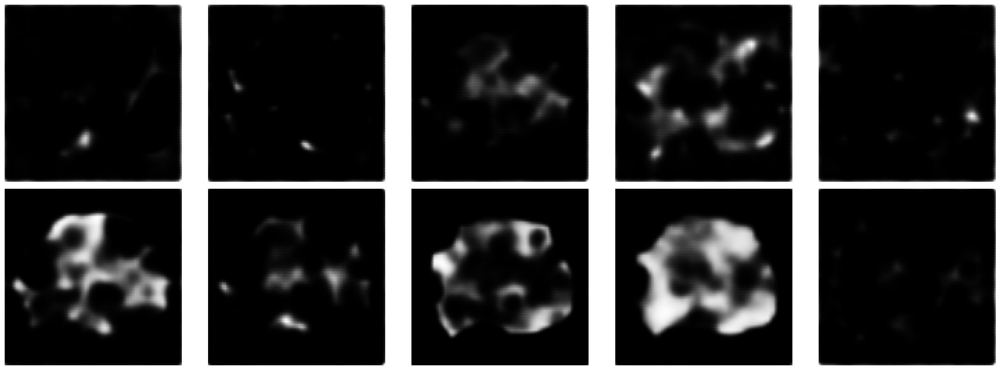

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:30,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 2/3750 [00:00<07:13,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 3/3750 [00:00<07:06,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 4/3750 [00:00<07:03,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<07:17,  8.57it/s]

1/1 [==============================] - 0s 12ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<07:38,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 7/3750 [00:00<07:27,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 8/3750 [00:00<07:19,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<07:11,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<07:04,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<06:56,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<06:47,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<06:43,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<06:46,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▍                                                                                                              | 15/3750 [00:01<06:43,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:01<06:46,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 17/3750 [00:01<06:49,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<06:48,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<06:50,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<06:52,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<06:54,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<06:52,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<06:53,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 24/3750 [00:02<06:52,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 25/3750 [00:02<06:52,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 26/3750 [00:02<06:51,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 27/3750 [00:03<06:52,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<06:51,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<06:53,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<06:52,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<06:53,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<06:52,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 33/3750 [00:03<06:50,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 34/3750 [00:03<06:48,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 35/3750 [00:03<06:52,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 36/3750 [00:04<06:54,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 37/3750 [00:04<06:53,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 38/3750 [00:04<06:56,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<07:36,  8.14it/s]

1/1 [==============================] - 0s 12ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<07:29,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▏                                                                                                             | 41/3750 [00:04<07:20,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 42/3750 [00:04<07:11,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 43/3750 [00:04<07:04,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 44/3750 [00:04<07:01,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 45/3750 [00:05<06:56,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<06:52,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 47/3750 [00:05<06:53,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 48/3750 [00:05<06:52,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 49/3750 [00:05<06:51,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 50/3750 [00:05<06:51,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 51/3750 [00:05<06:49,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▌                                                                                                             | 52/3750 [00:05<06:50,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 53/3750 [00:05<06:49,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▌                                                                                                             | 54/3750 [00:06<06:55,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<06:53,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▋                                                                                                             | 56/3750 [00:06<06:57,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 57/3750 [00:06<06:49,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▋                                                                                                             | 58/3750 [00:06<06:43,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▋                                                                                                             | 59/3750 [00:06<06:37,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 60/3750 [00:06<06:43,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 61/3750 [00:06<06:37,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 62/3750 [00:06<06:32,  9.39it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▊                                                                                                             | 63/3750 [00:07<06:29,  9.47it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 64/3750 [00:07<06:27,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 65/3750 [00:07<06:27,  9.51it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 66/3750 [00:07<06:26,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  2%|█▉                                                                                                             | 67/3750 [00:07<06:26,  9.54it/s]

1/1 [==============================] - 0s 8ms/step


  2%|██                                                                                                             | 68/3750 [00:07<06:25,  9.56it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 69/3750 [00:07<06:30,  9.42it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 70/3750 [00:07<06:37,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 71/3750 [00:07<06:41,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 72/3750 [00:08<06:42,  9.13it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 73/3750 [00:08<07:18,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 74/3750 [00:08<07:11,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 75/3750 [00:08<07:06,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 76/3750 [00:08<07:01,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 77/3750 [00:08<06:58,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 78/3750 [00:08<06:54,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 79/3750 [00:08<06:52,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 80/3750 [00:08<06:49,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 81/3750 [00:09<06:50,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 82/3750 [00:09<06:48,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 83/3750 [00:09<06:53,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 84/3750 [00:09<06:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 85/3750 [00:09<06:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 86/3750 [00:09<06:48,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 87/3750 [00:09<06:48,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 88/3750 [00:09<06:45,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 89/3750 [00:09<06:45,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 90/3750 [00:10<06:44,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 91/3750 [00:10<06:44,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 92/3750 [00:10<06:46,  9.01it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▊                                                                                                            | 93/3750 [00:10<06:46,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 94/3750 [00:10<06:46,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▊                                                                                                            | 95/3750 [00:10<06:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 96/3750 [00:10<06:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▊                                                                                                            | 97/3750 [00:10<06:47,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 98/3750 [00:10<06:45,  9.01it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▉                                                                                                            | 99/3750 [00:11<06:46,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 100/3750 [00:11<06:45,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 101/3750 [00:11<06:48,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 102/3750 [00:11<06:47,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 103/3750 [00:11<06:47,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 104/3750 [00:11<06:42,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 105/3750 [00:11<06:38,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███                                                                                                           | 106/3750 [00:11<06:33,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 107/3750 [00:11<07:22,  8.24it/s]

1/1 [==============================] - 0s 12ms/step


  3%|███▏                                                                                                          | 108/3750 [00:12<07:19,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 109/3750 [00:12<07:10,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 110/3750 [00:12<07:05,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 111/3750 [00:12<06:59,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 112/3750 [00:12<06:55,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 113/3750 [00:12<06:53,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 114/3750 [00:12<06:51,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 115/3750 [00:12<06:49,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 116/3750 [00:12<06:46,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 117/3750 [00:13<06:45,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 118/3750 [00:13<06:44,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 119/3750 [00:13<06:46,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 120/3750 [00:13<06:44,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 121/3750 [00:13<06:44,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 122/3750 [00:13<06:43,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 123/3750 [00:13<06:43,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 124/3750 [00:13<06:42,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▋                                                                                                          | 125/3750 [00:13<06:42,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 126/3750 [00:14<06:42,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▋                                                                                                          | 127/3750 [00:14<06:43,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 128/3750 [00:14<06:45,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 129/3750 [00:14<06:42,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▊                                                                                                          | 130/3750 [00:14<06:42,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▊                                                                                                          | 131/3750 [00:14<06:35,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


  4%|███▊                                                                                                          | 132/3750 [00:14<06:31,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 133/3750 [00:14<06:33,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▉                                                                                                          | 134/3750 [00:14<06:34,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▉                                                                                                          | 135/3750 [00:15<06:34,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▉                                                                                                          | 136/3750 [00:15<06:35,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 137/3750 [00:15<06:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 138/3750 [00:15<06:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 139/3750 [00:15<06:42,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 140/3750 [00:15<06:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 141/3750 [00:15<07:10,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▏                                                                                                         | 142/3750 [00:15<07:02,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 143/3750 [00:15<06:57,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 144/3750 [00:16<06:52,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 145/3750 [00:16<06:44,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 146/3750 [00:16<06:35,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 147/3750 [00:16<06:31,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 148/3750 [00:16<06:27,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▎                                                                                                         | 149/3750 [00:16<06:23,  9.38it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 150/3750 [00:16<06:20,  9.46it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 151/3750 [00:16<06:19,  9.49it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 152/3750 [00:16<06:17,  9.53it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 153/3750 [00:17<06:16,  9.56it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 154/3750 [00:17<06:15,  9.57it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▌                                                                                                         | 155/3750 [00:17<06:59,  8.57it/s]

1/1 [==============================] - 0s 12ms/step


  4%|████▌                                                                                                         | 156/3750 [00:17<07:04,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▌                                                                                                         | 157/3750 [00:17<06:57,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 158/3750 [00:17<06:51,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 159/3750 [00:17<06:49,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 160/3750 [00:17<06:45,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 161/3750 [00:17<06:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 162/3750 [00:18<06:41,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 163/3750 [00:18<06:40,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 164/3750 [00:18<06:38,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 165/3750 [00:18<06:42,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 166/3750 [00:18<06:42,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▉                                                                                                         | 167/3750 [00:18<06:42,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 168/3750 [00:18<06:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:18<06:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 170/3750 [00:18<06:37,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 171/3750 [00:19<06:37,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 172/3750 [00:19<06:35,  9.05it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████                                                                                                         | 173/3750 [00:19<06:37,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 174/3750 [00:19<06:38,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:19<06:37,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:19<07:02,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:19<06:56,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:19<06:51,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:20<06:46,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:20<06:43,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:20<06:40,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:20<06:38,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:20<06:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:20<06:40,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:20<06:39,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:20<06:39,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:20<06:38,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:21<06:37,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:21<06:36,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:21<06:36,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:21<06:36,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:21<06:32,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:21<06:33,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:21<06:35,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:21<06:34,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:21<06:33,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:22<06:33,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:22<06:33,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:22<06:33,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:22<06:32,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:22<06:34,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:22<06:33,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:22<06:31,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:22<06:31,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 205/3750 [00:22<06:30,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 206/3750 [00:22<06:30,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████                                                                                                        | 207/3750 [00:23<06:29,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████                                                                                                        | 208/3750 [00:23<06:31,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:23<06:58,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:23<06:56,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:23<06:53,  8.56it/s]

1/1 [==============================] - 0s 12ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:23<07:05,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:23<06:50,  8.62it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:23<06:40,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:24<06:32,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:24<06:25,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:24<06:23,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:24<06:20,  9.29it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:24<06:22,  9.23it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:24<06:29,  9.05it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:24<06:47,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:24<06:54,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:24<06:42,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:25<06:36,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:25<06:36,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:25<06:36,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:25<06:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:25<06:36,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:25<06:32,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:25<06:28,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:25<06:26,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:25<06:23,  9.17it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:26<06:26,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:26<06:21,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:26<06:24,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:26<06:20,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:26<06:25,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:26<06:26,  9.08it/s]

1/1 [==============================] - 0s 11ms/step


  6%|███████                                                                                                       | 239/3750 [00:26<06:31,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 240/3750 [00:26<06:47,  8.60it/s]

1/1 [==============================] - 0s 14ms/step


  6%|███████                                                                                                       | 241/3750 [00:26<06:53,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 242/3750 [00:27<06:47,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:27<06:42,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:27<06:40,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:27<06:38,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:27<06:36,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:27<06:38,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:27<06:37,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:27<06:38,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:27<06:36,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:28<06:33,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:28<06:41,  8.72it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:28<06:59,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:28<06:49,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:28<06:47,  8.58it/s]

1/1 [==============================] - 0s 12ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:28<07:01,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:28<06:51,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:28<07:19,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:29<07:08,  8.14it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:29<07:12,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:29<07:00,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:29<07:01,  8.27it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:29<07:10,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:29<07:08,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:29<07:11,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:29<07:13,  8.05it/s]

1/1 [==============================] - 0s 22ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:30<07:30,  7.74it/s]

1/1 [==============================] - 0s 13ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:30<07:31,  7.71it/s]

1/1 [==============================] - 0s 12ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:30<07:31,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:30<07:58,  7.28it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:30<07:36,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:30<07:17,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 273/3750 [00:30<07:05,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


  7%|████████                                                                                                      | 274/3750 [00:30<07:10,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 275/3750 [00:31<06:55,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████                                                                                                      | 276/3750 [00:31<06:46,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:31<06:35,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:31<06:27,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:31<06:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:31<06:46,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:31<06:46,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:31<06:44,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:31<06:52,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:32<07:13,  7.99it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:32<06:57,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:32<06:48,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:32<07:12,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:32<07:19,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:32<07:50,  7.35it/s]

1/1 [==============================] - 0s 45ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:32<09:23,  6.14it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:33<08:48,  6.54it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:33<08:27,  6.82it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:33<14:04,  4.10it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:33<12:29,  4.61it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:34<10:58,  5.25it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:34<10:50,  5.31it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:34<10:13,  5.63it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:34<09:22,  6.13it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:34<08:54,  6.46it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:34<08:48,  6.53it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:34<08:35,  6.69it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:35<08:20,  6.90it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:35<08:09,  7.04it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:35<07:57,  7.21it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:35<07:49,  7.34it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:35<07:40,  7.48it/s]

1/1 [==============================] - 0s 14ms/step


  8%|█████████                                                                                                     | 307/3750 [00:35<07:41,  7.46it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████                                                                                                     | 308/3750 [00:35<07:31,  7.62it/s]

1/1 [==============================] - 0s 12ms/step


  8%|█████████                                                                                                     | 309/3750 [00:35<07:24,  7.74it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████                                                                                                     | 310/3750 [00:36<07:15,  7.90it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████                                                                                                     | 311/3750 [00:36<07:01,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:36<06:54,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:36<06:52,  8.33it/s]

1/1 [==============================] - 0s 12ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:36<06:51,  8.35it/s]

1/1 [==============================] - 0s 12ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:36<06:49,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:36<06:46,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:36<06:45,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:36<06:42,  8.53it/s]

1/1 [==============================] - 0s 12ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:37<06:46,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:37<06:42,  8.51it/s]

1/1 [==============================] - 0s 12ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:37<06:42,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:37<06:41,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:37<06:40,  8.56it/s]

1/1 [==============================] - 0s 14ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:37<07:46,  7.35it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:37<07:24,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:37<07:12,  7.92it/s]

1/1 [==============================] - 0s 13ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:38<07:04,  8.06it/s]

1/1 [==============================] - 0s 12ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:38<07:01,  8.11it/s]

1/1 [==============================] - 0s 12ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:38<06:55,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:38<06:48,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:38<06:44,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:38<06:38,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:38<06:30,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:38<06:24,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:39<06:19,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:39<06:15,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:39<06:42,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:39<06:35,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:39<06:37,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:39<06:37,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████                                                                                                    | 341/3750 [00:39<06:39,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████                                                                                                    | 342/3750 [00:39<06:37,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████                                                                                                    | 343/3750 [00:39<06:34,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████                                                                                                    | 344/3750 [00:40<06:35,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████                                                                                                    | 345/3750 [00:40<06:34,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:40<06:35,  8.60it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:40<06:26,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:40<06:31,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:40<06:25,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:40<06:20,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:40<06:18,  8.97it/s]

1/1 [==============================] - 0s 12ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:41<07:05,  7.99it/s]

1/1 [==============================] - 0s 12ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:41<07:01,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:41<06:51,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:41<06:45,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:41<06:42,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:41<06:39,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:41<06:36,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:41<06:34,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:41<06:32,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:42<06:33,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:42<06:32,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:42<06:29,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:42<06:32,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:42<06:33,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:42<06:34,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:42<06:33,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:42<06:26,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:42<06:23,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:43<06:36,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:43<06:27,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:43<06:26,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:43<06:29,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:43<06:30,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████                                                                                                   | 375/3750 [00:43<06:30,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 376/3750 [00:43<06:30,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 377/3750 [00:43<06:29,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 378/3750 [00:44<06:29,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 379/3750 [00:44<06:30,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:44<06:55,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:44<06:51,  8.19it/s]

1/1 [==============================] - 0s 12ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:44<06:49,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:44<06:44,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:44<06:38,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:44<06:35,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:44<06:31,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:45<06:28,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:45<06:30,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:45<06:28,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:45<07:04,  7.92it/s]

1/1 [==============================] - 0s 12ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:45<07:11,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:45<07:06,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:45<07:01,  7.97it/s]

1/1 [==============================] - 0s 12ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:45<07:00,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:46<07:00,  7.98it/s]

1/1 [==============================] - 0s 12ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:46<06:58,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:46<06:56,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:46<06:54,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:46<06:56,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:46<06:57,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:46<06:59,  7.99it/s]

1/1 [==============================] - 0s 13ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:46<06:58,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:47<06:55,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:47<06:53,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:47<06:50,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:47<06:52,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:47<06:51,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:47<06:49,  8.16it/s]

1/1 [==============================] - 0s 12ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:47<07:46,  7.17it/s]

1/1 [==============================] - 0s 14ms/step


 11%|████████████                                                                                                  | 410/3750 [00:48<07:31,  7.39it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████                                                                                                  | 411/3750 [00:48<08:16,  6.72it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████                                                                                                  | 412/3750 [00:48<07:52,  7.06it/s]

1/1 [==============================] - 0s 13ms/step


 11%|████████████                                                                                                  | 413/3750 [00:48<07:37,  7.30it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:48<07:25,  7.48it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:48<07:13,  7.69it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:48<07:09,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:48<07:04,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:49<07:01,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:49<06:48,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:49<06:40,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:49<06:31,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:49<06:25,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:49<06:23,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:49<06:16,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:49<06:15,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:49<06:10,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:50<06:08,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:50<06:08,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:50<06:10,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:50<06:10,  8.97it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:50<06:13,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:50<06:14,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:50<06:16,  8.80it/s]

1/1 [==============================] - 0s 12ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:50<06:26,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:50<06:28,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:51<06:29,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:51<06:30,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:51<06:21,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:51<06:55,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:51<06:47,  8.12it/s]

1/1 [==============================] - 0s 12ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:51<06:42,  8.22it/s]

1/1 [==============================] - 0s 12ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:51<06:43,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:51<06:28,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:52<06:17,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:52<06:10,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:52<06:12,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:52<06:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:52<06:07,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:52<06:07,  8.99it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:52<06:53,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:52<06:40,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:53<06:30,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:53<06:29,  8.47it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:53<06:34,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:53<06:31,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:53<06:24,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:53<06:24,  8.58it/s]

1/1 [==============================] - 0s 8ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:53<06:13,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:53<06:15,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:53<06:20,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:54<06:23,  8.59it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:54<06:27,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:54<06:18,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:54<06:16,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:54<06:13,  8.80it/s]

1/1 [==============================] - 0s 12ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:54<06:14,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:54<06:11,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:54<06:10,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:54<06:11,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:55<06:22,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:55<06:25,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:55<06:39,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:55<06:33,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:55<06:26,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:55<06:21,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:55<06:16,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:55<06:23,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████                                                                                                | 478/3750 [00:56<06:19,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 479/3750 [00:56<06:19,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 480/3750 [00:56<06:17,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████                                                                                                | 481/3750 [00:56<06:23,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:56<07:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:56<08:03,  6.76it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:56<07:59,  6.81it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:57<08:23,  6.49it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:57<07:54,  6.88it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:57<07:22,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:57<07:01,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:57<06:43,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:57<06:30,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:57<06:24,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:57<06:33,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:57<06:27,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:58<06:21,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:58<06:15,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:58<06:05,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:58<06:08,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:58<06:03,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:58<06:02,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:58<06:03,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:58<06:04,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:58<06:05,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 503/3750 [00:59<06:12,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 504/3750 [00:59<06:25,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 505/3750 [00:59<06:19,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▊                                                                                               | 506/3750 [00:59<06:13,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▊                                                                                               | 507/3750 [00:59<06:08,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 508/3750 [00:59<06:06,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 509/3750 [00:59<06:03,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 510/3750 [00:59<06:02,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 511/3750 [00:59<05:58,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████                                                                                               | 512/3750 [01:00<05:54,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████                                                                                               | 513/3750 [01:00<05:54,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 514/3750 [01:00<06:32,  8.24it/s]

1/1 [==============================] - 0s 14ms/step


 14%|███████████████                                                                                               | 515/3750 [01:00<06:35,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▏                                                                                              | 516/3750 [01:00<06:28,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▏                                                                                              | 517/3750 [01:00<06:21,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 518/3750 [01:00<06:27,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 519/3750 [01:00<06:31,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 520/3750 [01:01<06:33,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▎                                                                                              | 521/3750 [01:01<06:28,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 522/3750 [01:01<06:36,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [01:01<06:29,  8.28it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▎                                                                                              | 524/3750 [01:01<06:24,  8.39it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████████▍                                                                                              | 525/3750 [01:01<06:52,  7.83it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 526/3750 [01:01<06:30,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 527/3750 [01:01<06:20,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 528/3750 [01:02<06:15,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 529/3750 [01:02<06:09,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 530/3750 [01:02<06:05,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 531/3750 [01:02<06:02,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 532/3750 [01:02<05:58,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 533/3750 [01:02<05:57,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 534/3750 [01:02<05:58,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 535/3750 [01:02<06:04,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 536/3750 [01:02<06:31,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▊                                                                                              | 537/3750 [01:03<06:31,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▊                                                                                              | 538/3750 [01:03<06:23,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:03<06:15,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:03<06:12,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:03<06:09,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:03<06:06,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:03<06:03,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:03<06:00,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:03<05:58,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 546/3750 [01:04<06:25,  8.30it/s]

1/1 [==============================] - 0s 15ms/step


 15%|████████████████                                                                                              | 547/3750 [01:04<06:28,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 548/3750 [01:04<06:26,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████                                                                                              | 549/3750 [01:04<06:23,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:04<06:29,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:04<06:21,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:04<06:14,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:04<06:07,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:05<06:13,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:05<06:05,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:05<05:56,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:05<06:02,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:05<06:10,  8.62it/s]

1/1 [==============================] - 0s 19ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:05<06:33,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:05<06:40,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:05<06:36,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:06<06:30,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:06<06:29,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:06<06:24,  8.29it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:06<06:29,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:06<06:35,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:06<06:35,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:06<06:32,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:06<06:29,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:07<06:27,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:07<06:24,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:07<06:27,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:07<06:29,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:07<06:44,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:07<06:58,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:07<06:51,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:07<06:47,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:08<07:22,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:08<07:11,  7.34it/s]

1/1 [==============================] - 0s 11ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:08<07:01,  7.52it/s]

1/1 [==============================] - 0s 11ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:08<06:49,  7.74it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:08<06:36,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:08<06:24,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:08<06:17,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:08<06:11,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:09<06:06,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:09<06:02,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:09<05:58,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:09<05:50,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:09<05:45,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:09<06:00,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:09<06:01,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:09<05:58,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:09<05:58,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:10<05:57,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:10<05:58,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:10<05:50,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:10<05:44,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:10<05:38,  9.31it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:10<05:37,  9.34it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:10<05:43,  9.16it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:10<05:49,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:10<05:50,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:11<05:51,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:11<05:53,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:11<05:52,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:11<05:50,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:11<05:54,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:11<06:26,  8.12it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:11<06:21,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:11<06:11,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:11<06:07,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:12<06:01,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:12<05:55,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:12<05:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:12<05:49,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:12<05:51,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:12<05:49,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:12<05:54,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:12<06:31,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:12<06:18,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:13<06:10,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:13<06:05,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:13<06:01,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:13<05:56,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:13<05:53,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:13<05:52,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:13<05:47,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:13<05:50,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:14<05:51,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:14<06:33,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:14<06:20,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:14<06:12,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:14<06:03,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:14<05:57,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:14<05:53,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:14<05:51,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:14<05:53,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:15<05:51,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:15<05:52,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:15<05:57,  8.69it/s]

1/1 [==============================] - 0s 14ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:15<06:24,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:15<06:14,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:15<06:07,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:15<06:01,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:15<05:55,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:15<05:55,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:16<05:53,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:16<05:49,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:16<05:46,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:16<05:46,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:16<05:46,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:16<06:14,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:16<06:08,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:16<06:00,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:17<05:59,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:17<05:55,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:17<05:50,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:17<05:46,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:17<05:43,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:17<05:45,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:17<05:45,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:17<05:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:17<06:16,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:18<06:12,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:18<06:06,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:18<06:00,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:18<05:57,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:18<05:53,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:18<05:54,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:18<05:49,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:18<05:49,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:18<05:46,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:19<05:49,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:19<06:22,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:19<06:12,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:19<06:03,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:19<05:59,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:19<05:56,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:19<05:53,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:19<05:49,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:20<05:47,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:20<05:48,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:20<05:46,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:20<05:43,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:20<06:20,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:20<06:09,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:20<06:00,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:20<05:54,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:20<05:49,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:21<05:45,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:21<05:48,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:21<05:45,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:21<05:40,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:21<05:38,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:21<05:39,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:21<06:20,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:21<06:10,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:22<06:01,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:22<06:00,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:22<05:54,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:22<05:51,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:22<05:44,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:22<05:38,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:22<05:38,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:22<05:40,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:22<05:39,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:23<06:08,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:23<05:58,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:23<05:54,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:23<05:54,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:23<05:51,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:23<05:55,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:23<05:53,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:23<05:52,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:23<05:56,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:24<05:53,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:24<05:48,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:24<06:17,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:24<06:10,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:24<06:01,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:24<05:53,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:24<05:42,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:24<05:36,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:25<05:33,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:25<05:35,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:25<05:35,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:25<05:34,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:25<05:43,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:25<06:11,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:25<06:04,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:25<05:57,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:25<05:53,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:26<05:48,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:26<05:44,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:26<05:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:26<05:38,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:26<05:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:26<05:46,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:26<05:46,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:26<06:16,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:27<06:06,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:27<05:58,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:27<05:50,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:27<05:47,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:27<05:43,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:27<05:44,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:27<05:41,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:27<05:43,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:27<05:42,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:28<05:49,  8.58it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:28<06:14,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:28<06:05,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:28<05:56,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:28<05:48,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:28<05:47,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:28<05:42,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:28<05:40,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:28<05:39,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:29<05:38,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:29<05:37,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:29<05:44,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:29<05:57,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:29<05:52,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:29<05:48,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:29<05:44,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:29<05:41,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:30<05:40,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:30<05:39,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:30<05:37,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:30<05:38,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:30<05:32,  8.96it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:30<05:32,  8.96it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:30<06:02,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:30<05:54,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:30<05:47,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:31<05:44,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:31<05:39,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:31<05:35,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:31<05:40,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:31<05:38,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:31<05:36,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:31<05:37,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:31<05:35,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:31<05:54,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:32<05:49,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:32<05:42,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:32<05:37,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:32<05:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:32<05:31,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:32<05:32,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:32<05:32,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:32<05:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:32<05:29,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:33<05:29,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:33<06:01,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:33<06:09,  8.00it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:33<06:01,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:33<05:52,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:33<05:44,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:33<05:42,  8.61it/s]

1/1 [==============================] - 0s 12ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:33<05:43,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:34<05:38,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:34<05:34,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:34<05:33,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:34<05:30,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:34<05:58,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:34<05:49,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:34<05:41,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:34<05:38,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:34<05:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:35<05:28,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:35<05:29,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:35<05:29,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:35<05:28,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:35<05:26,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:35<05:26,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:35<05:52,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:35<05:47,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:35<05:43,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:36<05:37,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:36<05:35,  8.72it/s]

1/1 [==============================] - 0s 12ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:36<05:33,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:36<05:28,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:36<05:28,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:36<05:27,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:36<05:27,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:36<05:27,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:37<06:04,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:37<05:59,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:37<05:49,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:37<05:43,  8.49it/s]

1/1 [==============================] - 0s 16ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:37<05:44,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:37<05:38,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:37<05:42,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:37<05:39,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:37<05:34,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:38<05:33,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:38<05:32,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:38<05:54,  8.20it/s]

1/1 [==============================] - 0s 13ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:38<05:48,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:38<05:40,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:38<05:36,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:38<05:30,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:38<05:21,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:38<05:16,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:39<05:21,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:39<05:24,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:39<05:24,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:39<05:26,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:39<05:33,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:39<05:40,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:39<05:36,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:39<05:38,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:40<05:32,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:40<05:30,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:40<05:27,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:40<05:26,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:40<05:24,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:40<05:22,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:40<05:20,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:40<05:17,  9.09it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:40<05:55,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:41<05:45,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:41<05:40,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:41<05:34,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:41<05:31,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:41<05:28,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:41<05:25,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:41<05:23,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:41<05:21,  8.97it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:41<05:22,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:42<05:22,  8.92it/s]

1/1 [==============================] - 0s 50ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:42<05:59,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:42<05:48,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:42<05:40,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:42<05:33,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:42<05:28,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:42<05:24,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:42<05:23,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:43<05:21,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:43<05:20,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:43<05:21,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:43<05:22,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:43<05:47,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:43<05:46,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:43<05:37,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:43<05:33,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:43<05:31,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:44<05:26,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:44<05:22,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:44<05:25,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:44<05:23,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:44<05:23,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:44<05:23,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:44<05:53,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:44<05:43,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:44<05:35,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:45<05:28,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:45<05:24,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:45<05:22,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:45<05:22,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:45<05:23,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:45<05:19,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:45<05:15,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:45<05:18,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:46<05:25,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:46<05:40,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:46<05:33,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:46<05:33,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:46<05:30,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:46<05:27,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:46<05:23,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:46<05:21,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:46<05:22,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:47<05:21,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:47<05:23,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:47<05:22,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:47<05:59,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:47<05:49,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:47<05:37,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:47<05:27,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:47<05:25,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:47<05:19,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:48<05:15,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:48<05:10,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:48<05:09,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:48<05:09,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:48<05:23,  8.72it/s]

1/1 [==============================] - 0s 13ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:48<05:59,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:48<05:47,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:48<05:36,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:49<05:28,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:49<05:25,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:49<05:22,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:49<05:19,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:49<05:18,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:49<05:18,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:49<05:13,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:49<05:14,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:49<05:31,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:50<05:28,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:50<05:22,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:50<05:18,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:50<05:11,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:50<05:11,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:50<05:13,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:50<05:12,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:50<05:12,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:50<05:12,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:51<05:13,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:51<05:45,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:51<05:35,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:51<05:27,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:51<05:21,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:51<05:18,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:51<05:15,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:51<05:13,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:52<05:19,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:52<05:23,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:52<05:21,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:52<05:20,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:52<05:24,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:52<05:25,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:52<05:24,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:52<05:20,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:52<05:18,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:53<05:17,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:53<05:17,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:53<05:14,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:53<05:13,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:53<05:13,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:53<05:12,  8.88it/s]

1/1 [==============================] - 0s 14ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:53<05:18,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:53<05:55,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:53<05:44,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:54<05:34,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:54<05:26,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:54<05:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:54<05:17,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:54<05:13,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:54<05:13,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:54<05:14,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:54<05:12,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:55<05:10,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:55<05:42,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:55<05:35,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:55<05:31,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:55<05:26,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:55<05:20,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:55<05:15,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:55<05:13,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:55<05:10,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:56<05:12,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:56<05:12,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:56<05:11,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:56<05:41,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:56<05:32,  8.27it/s]

1/1 [==============================] - 0s 13ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:56<05:26,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:56<05:20,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [01:56<05:22,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [01:57<05:18,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [01:57<05:15,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [01:57<05:08,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [01:57<05:05,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [01:57<05:06,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [01:57<05:03,  9.05it/s]

1/1 [==============================] - 0s 51ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [01:57<05:38,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [01:57<05:29,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [01:57<05:25,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [01:58<05:15,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [01:58<05:11,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [01:58<05:08,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [01:58<05:06,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [01:58<05:07,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [01:58<05:05,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [01:58<05:03,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [01:58<05:02,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [01:58<05:34,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [01:59<05:28,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [01:59<05:27,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [01:59<05:22,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [01:59<05:16,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [01:59<05:13,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [01:59<05:09,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [01:59<05:09,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [01:59<05:06,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [01:59<05:02,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [02:00<05:08,  8.83it/s]

1/1 [==============================] - 0s 19ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [02:00<05:34,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [02:00<05:29,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [02:00<05:21,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [02:00<05:16,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [02:00<05:12,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [02:00<05:09,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [02:00<05:06,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [02:01<05:05,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [02:01<05:06,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [02:01<05:02,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [02:01<05:00,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [02:01<05:29,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [02:01<05:22,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [02:01<05:17,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [02:01<05:12,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [02:01<05:11,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [02:02<05:08,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [02:02<05:08,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [02:02<05:03,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [02:02<04:58,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [02:02<04:58,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [02:02<04:59,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [02:02<05:22,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [02:02<05:17,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [02:02<05:12,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [02:03<05:09,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [02:03<05:06,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [02:03<05:06,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [02:03<05:04,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [02:03<05:07,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [02:03<05:06,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [02:03<05:00,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [02:03<05:00,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [02:03<04:59,  8.97it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [02:04<05:35,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [02:04<05:41,  7.86it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [02:04<06:35,  6.79it/s]

1/1 [==============================] - 0s 9ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [02:04<06:05,  7.33it/s]

1/1 [==============================] - 0s 9ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [02:04<05:42,  7.82it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [02:04<05:24,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [02:04<05:15,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [02:05<05:09,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [02:05<05:06,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [02:05<05:05,  8.75it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [02:05<05:07,  8.70it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:05<05:37,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:05<05:30,  8.10it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:05<05:23,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:05<05:17,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:05<05:12,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:06<05:09,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:06<05:07,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:06<05:01,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:06<05:00,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:06<04:59,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:06<04:59,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:06<06:27,  6.87it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:07<06:18,  7.03it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:07<05:53,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:07<05:34,  7.96it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:07<05:18,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:07<05:07,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:07<05:04,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:07<05:00,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:07<04:56,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:07<04:58,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:08<05:06,  8.67it/s]

1/1 [==============================] - 0s 13ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:08<05:28,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:08<05:22,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:08<05:13,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:08<05:08,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:08<05:05,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:08<05:09,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:08<05:06,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:08<05:05,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:09<05:11,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:09<05:06,  8.62it/s]

1/1 [==============================] - 0s 16ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:09<05:09,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:09<05:35,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:09<05:30,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:09<05:21,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:09<05:13,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:09<05:09,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:10<05:05,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:10<05:02,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:10<05:00,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:10<04:57,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:10<05:00,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:10<04:57,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:10<05:16,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:10<05:12,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:10<05:08,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:11<05:04,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:11<05:01,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:11<04:59,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:11<04:58,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:11<04:56,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:11<04:56,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:11<04:56,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:11<05:02,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:11<05:06,  8.56it/s]

1/1 [==============================] - 0s 14ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:12<05:32,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:12<05:25,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:12<05:15,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:12<05:08,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:12<05:04,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:12<05:01,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:12<05:01,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:12<05:00,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:13<05:03,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:13<05:02,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:13<04:59,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:13<05:23,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:13<05:14,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:13<05:07,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:13<05:04,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:13<05:00,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:13<04:56,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:14<04:54,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:14<04:51,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:14<04:50,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:14<04:50,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:14<04:48,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:14<04:49,  8.96it/s]

1/1 [==============================] - 0s 36ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:14<05:25,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:14<05:16,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:15<05:08,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:15<05:03,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:15<04:58,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:15<04:55,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:15<04:53,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:15<04:51,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:15<04:50,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:15<04:47,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:15<04:46,  9.02it/s]

1/1 [==============================] - 0s 43ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:16<05:17,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:16<05:10,  8.33it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:16<04:57,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:16<04:49,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:16<05:20,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:16<05:12,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:16<05:03,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:16<04:59,  8.62it/s]

1/1 [==============================] - 0s 13ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:16<04:58,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:17<04:51,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:17<04:50,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:17<05:22,  7.99it/s]

1/1 [==============================] - 0s 12ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:17<05:15,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:17<05:05,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:17<05:04,  8.45it/s]

1/1 [==============================] - 0s 14ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:17<05:02,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:17<04:58,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:18<04:54,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:18<04:52,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:18<04:50,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:18<04:56,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:18<04:53,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:18<04:58,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:18<04:56,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:18<04:54,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:18<04:51,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:19<04:49,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:19<04:49,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:19<04:47,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:19<04:48,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:19<04:53,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:19<04:50,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:19<04:46,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:19<04:42,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:20<05:18,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:20<05:10,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:20<05:01,  8.46it/s]

1/1 [==============================] - 0s 8ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:20<04:54,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:20<04:55,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:20<04:54,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:20<04:52,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:20<04:51,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:20<04:49,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:21<04:49,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:21<04:45,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:21<05:20,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:21<05:11,  8.15it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:21<05:06,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:21<04:57,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:21<04:54,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:21<04:49,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:21<04:46,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:22<04:48,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:22<04:47,  8.82it/s]

1/1 [==============================] - 0s 12ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:22<04:46,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:22<04:45,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:22<04:46,  8.82it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:22<05:15,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:22<05:06,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:22<04:59,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:23<04:53,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:23<04:50,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:23<04:52,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:23<04:49,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:23<04:46,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:23<04:57,  8.46it/s]

1/1 [==============================] - 0s 12ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:23<04:59,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:23<04:55,  8.52it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:24<05:22,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:24<05:13,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:24<05:03,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:24<04:56,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:24<04:50,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:24<04:46,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:24<04:46,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:24<04:44,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:24<04:42,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:25<04:39,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:25<04:38,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:25<04:45,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:25<05:00,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:25<04:54,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:25<04:49,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:25<04:50,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:25<04:47,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:25<04:40,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:26<04:39,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:26<04:40,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:26<04:39,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:26<04:39,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:26<04:38,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:26<05:01,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:26<04:57,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:26<04:54,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:26<04:52,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:27<04:48,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:27<04:46,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:27<04:46,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:27<04:41,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:27<04:39,  8.90it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:27<04:41,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:27<04:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:27<04:51,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:28<04:55,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:28<04:51,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:28<04:54,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:28<04:44,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:28<04:41,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:28<04:39,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:28<04:38,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:28<04:36,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:28<04:35,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:29<04:30,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:29<04:26,  9.27it/s]

1/1 [==============================] - 0s 18ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:29<04:59,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:29<04:55,  8.37it/s]

1/1 [==============================] - 0s 18ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:29<05:08,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:29<04:59,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:29<04:54,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:29<04:50,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:29<04:49,  8.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:30<05:07,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:30<05:05,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:30<05:03,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:30<04:50,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:30<05:07,  8.01it/s]

1/1 [==============================] - 0s 14ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:30<05:00,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:30<05:03,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:30<04:53,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:31<04:48,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:31<04:43,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:31<04:43,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:31<04:39,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:31<04:37,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:31<04:39,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:31<04:38,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:31<04:37,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:32<05:22,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:32<05:09,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:32<04:59,  8.18it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:32<04:46,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:32<04:48,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:32<04:47,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:32<04:47,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:32<04:53,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:32<04:53,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:33<04:53,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:33<04:50,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:33<05:08,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:33<04:58,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:33<04:51,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:33<04:46,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:33<04:42,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:33<04:37,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:34<04:33,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:34<04:29,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:34<04:29,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:34<04:54,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:34<05:05,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:34<05:35,  7.23it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:34<05:18,  7.62it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:34<05:05,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:35<04:56,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:35<04:52,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:35<04:55,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:35<04:55,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:35<09:10,  4.39it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:36<07:51,  5.13it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:36<06:59,  5.76it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:36<06:16,  6.42it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:36<05:40,  7.08it/s]

1/1 [==============================] - 0s 8ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:36<05:16,  7.64it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:36<05:00,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:36<04:51,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:36<04:46,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:36<04:42,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:37<04:45,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:37<05:07,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:37<04:57,  8.10it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:37<05:30,  7.27it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:37<05:11,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:37<04:57,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:37<04:47,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:37<04:42,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:38<04:38,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:38<04:35,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:38<04:34,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:38<04:33,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:38<04:32,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:38<04:34,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:38<04:58,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:38<04:49,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:38<04:45,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:39<04:39,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:39<04:35,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:39<04:33,  8.75it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:39<04:45,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:39<04:48,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:39<04:49,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:39<04:48,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:39<04:42,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:40<05:00,  7.92it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:40<05:02,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:40<04:59,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:40<04:49,  8.22it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:40<04:46,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:40<04:41,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:40<04:37,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:40<04:37,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:40<04:35,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:41<04:36,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:41<04:33,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:41<04:45,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:41<05:04,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:41<04:59,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:41<04:53,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:41<04:45,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:41<04:38,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:42<04:32,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:42<04:29,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:42<04:25,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:42<04:26,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:42<04:29,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:42<04:27,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:42<05:30,  7.14it/s]

1/1 [==============================] - 0s 12ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:42<05:15,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:43<05:07,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:43<04:58,  7.90it/s]

1/1 [==============================] - 0s 13ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:43<05:05,  7.70it/s]

1/1 [==============================] - 0s 12ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:43<05:02,  7.79it/s]

1/1 [==============================] - 0s 12ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:43<05:00,  7.85it/s]

1/1 [==============================] - 0s 13ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:43<05:00,  7.84it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:43<04:58,  7.87it/s]

1/1 [==============================] - 0s 14ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:43<04:59,  7.84it/s]

1/1 [==============================] - 0s 13ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:44<04:58,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:44<05:37,  6.97it/s]

1/1 [==============================] - 0s 13ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:44<05:24,  7.23it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:44<05:13,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:44<04:57,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:44<04:45,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:44<04:39,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:44<04:42,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:45<04:37,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:45<04:47,  8.16it/s]

1/1 [==============================] - 0s 12ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:45<04:41,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:45<04:45,  8.20it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:45<05:57,  6.54it/s]

1/1 [==============================] - 0s 13ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:45<05:38,  6.90it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:45<05:16,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:46<05:03,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:46<04:51,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:46<04:39,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:46<04:51,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:46<04:41,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:46<04:35,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:46<04:29,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:46<04:26,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:46<04:34,  8.47it/s]

1/1 [==============================] - 0s 14ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:47<04:46,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:47<04:47,  8.10it/s]

1/1 [==============================] - 0s 12ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:47<04:46,  8.12it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:47<04:45,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:47<04:42,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:47<04:39,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:47<04:32,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:47<04:30,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:48<04:29,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:48<04:37,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:48<04:39,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:48<05:05,  7.58it/s]

1/1 [==============================] - 0s 14ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:48<05:07,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:48<04:57,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:48<04:47,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:48<04:40,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:49<04:38,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:49<04:34,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:49<04:30,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:49<04:26,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:49<04:23,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:49<04:22,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:49<04:31,  8.50it/s]

1/1 [==============================] - 0s 12ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:49<04:40,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:49<04:34,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:50<04:32,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:50<04:27,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:50<04:28,  8.55it/s]

1/1 [==============================] - 0s 17ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:50<04:31,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:50<04:29,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:50<04:28,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:50<04:23,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:50<04:18,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:51<04:18,  8.87it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:51<04:52,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:51<04:45,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:51<04:37,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:51<04:32,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:51<04:28,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:51<04:29,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:51<04:27,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:51<04:26,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:52<04:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:52<04:24,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:52<04:21,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:52<04:43,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:52<04:41,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:52<04:35,  8.27it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:52<04:28,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:52<04:24,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:53<04:20,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:53<04:15,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:53<04:15,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:53<04:17,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:53<04:21,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:53<04:22,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:53<04:20,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:53<04:42,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:54<04:41,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:54<04:34,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:54<04:28,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:54<04:25,  8.55it/s]

1/1 [==============================] - 0s 12ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:54<04:29,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:54<04:23,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:54<04:19,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:54<04:13,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:54<04:08,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:55<04:12,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:55<04:16,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:55<04:49,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:55<04:40,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:55<04:37,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:55<04:30,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:55<04:27,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:55<04:23,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:55<04:22,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:56<04:21,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:56<04:20,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:56<04:21,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:56<04:25,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:56<04:46,  7.83it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:56<04:43,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:56<04:41,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [02:56<04:34,  8.18it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [02:57<04:26,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [02:57<04:22,  8.56it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [02:57<04:19,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [02:57<04:22,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [02:57<04:23,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [02:57<04:20,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [02:57<04:20,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [02:57<04:20,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [02:58<04:47,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [02:58<04:39,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [02:58<04:31,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [02:58<04:30,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [02:58<04:26,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [02:58<04:24,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [02:58<04:22,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [02:58<04:23,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [02:58<04:17,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [02:59<04:15,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [02:59<04:15,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [02:59<04:20,  8.55it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [02:59<04:38,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [02:59<04:32,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [02:59<04:30,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [02:59<04:25,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [02:59<04:22,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [03:00<04:23,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [03:00<04:24,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [03:00<04:26,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [03:00<04:23,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [03:00<04:22,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [03:00<04:20,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [03:00<04:28,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [03:00<04:35,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [03:01<04:29,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [03:01<04:26,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [03:01<04:21,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [03:01<04:19,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [03:01<04:22,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [03:01<04:22,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [03:01<04:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [03:01<04:15,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [03:01<04:12,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [03:02<04:10,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [03:02<04:37,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [03:02<04:30,  8.12it/s]

1/1 [==============================] - 0s 11ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [03:02<04:24,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [03:02<04:18,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [03:02<04:15,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [03:02<04:12,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [03:02<04:11,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [03:03<04:09,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [03:03<04:10,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [03:03<04:09,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [03:03<04:08,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [03:03<04:07,  8.84it/s]

1/1 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [03:03<04:29,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [03:03<04:23,  8.30it/s]

1/1 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [03:03<04:23,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [03:03<04:19,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [03:04<04:15,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [03:04<04:13,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [03:04<04:11,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [03:04<04:07,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [03:04<04:05,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [03:04<04:06,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [03:04<04:07,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [03:04<04:07,  8.79it/s]

1/1 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [03:05<04:43,  7.68it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [03:05<04:36,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [03:05<04:25,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [03:05<04:17,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [03:05<04:13,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [03:05<04:10,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [03:05<04:08,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [03:05<04:06,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [03:05<04:05,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [03:06<04:04,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [03:06<04:05,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [03:06<04:30,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [03:06<04:23,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [03:06<04:18,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [03:06<04:14,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [03:06<04:10,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [03:06<04:09,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [03:06<04:06,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [03:07<04:04,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [03:07<04:04,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [03:07<04:03,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [03:07<04:01,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [03:07<04:00,  8.97it/s]

1/1 [==============================] - 0s 42ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [03:07<04:18,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [03:07<04:13,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [03:07<04:08,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [03:08<04:04,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [03:08<04:03,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [03:08<04:02,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [03:08<04:00,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [03:08<03:59,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [03:08<03:59,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [03:08<04:00,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [03:08<04:01,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [03:08<04:04,  8.74it/s]

1/1 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [03:09<04:20,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [03:09<04:14,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [03:09<04:09,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [03:09<04:05,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [03:09<04:06,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [03:09<04:03,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [03:09<04:01,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [03:09<04:00,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [03:09<03:58,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [03:10<03:57,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [03:10<03:56,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [03:10<04:19,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [03:10<04:13,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [03:10<04:08,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [03:10<04:06,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:10<04:03,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:10<04:00,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:10<03:58,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:11<03:57,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:11<03:56,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:11<03:56,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:11<03:56,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:11<03:54,  9.03it/s]

1/1 [==============================] - 0s 46ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:11<04:17,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:11<04:10,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:11<04:05,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:12<04:01,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:12<03:59,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:12<03:57,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:12<03:57,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:12<03:56,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:12<03:55,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:12<03:57,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:12<03:55,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:12<04:07,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:13<04:19,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:13<04:13,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:13<04:07,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:13<04:02,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:13<03:58,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:13<03:58,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:13<03:59,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:13<03:58,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:13<03:57,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:14<03:53,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:14<03:51,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:14<04:13,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:14<04:10,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:14<04:06,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:14<04:04,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:14<04:01,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:14<03:59,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:15<03:57,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:15<03:56,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:15<03:55,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:15<03:55,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:15<04:00,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:15<03:58,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:15<04:21,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:15<04:14,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:15<04:06,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:16<04:01,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:16<03:57,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:16<03:54,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:16<03:52,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:16<03:52,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:16<03:52,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:16<03:52,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:16<03:52,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:16<03:50,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:17<04:11,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:17<04:06,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:17<04:04,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:17<03:59,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:17<03:57,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:17<03:55,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:17<03:53,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:17<03:52,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:18<03:50,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:18<03:50,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:18<03:50,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:18<03:53,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:18<04:01,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:18<03:59,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:18<03:56,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:18<03:53,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:18<03:53,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:19<03:51,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:19<03:52,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:19<03:50,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:19<03:49,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:19<03:50,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:19<03:52,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:19<03:59,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:19<04:03,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:19<03:59,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:20<03:56,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:20<03:53,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:20<03:50,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:20<03:47,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:20<03:47,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:20<03:50,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:20<03:48,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:20<03:48,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:20<03:48,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:21<04:06,  8.26it/s]

1/1 [==============================] - 0s 13ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:21<04:04,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:21<03:59,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:21<03:57,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:21<03:54,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:21<03:54,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:21<03:52,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:21<03:51,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:22<03:49,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:22<03:48,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:22<03:48,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:22<03:47,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:22<04:11,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:22<04:05,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:22<04:01,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:22<03:56,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:22<03:56,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:23<03:53,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:23<03:52,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:23<03:51,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:23<03:49,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:23<03:48,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:23<04:32,  7.39it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:23<04:41,  7.15it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:23<04:28,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:24<04:14,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:24<04:09,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:24<04:03,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:24<03:57,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:24<03:54,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:24<03:51,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:24<03:49,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:24<03:48,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:24<03:43,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:25<03:39,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:25<04:01,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:25<03:57,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:25<03:52,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:25<03:48,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:25<03:48,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:25<03:47,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:25<03:52,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:26<03:59,  8.34it/s]

1/1 [==============================] - 0s 13ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:26<04:09,  7.98it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:26<04:17,  7.73it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:26<04:14,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:26<04:10,  7.94it/s]

1/1 [==============================] - 0s 38ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:26<04:26,  7.47it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:26<04:18,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:26<04:10,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:27<04:02,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:27<03:58,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:27<03:52,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:27<03:48,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:27<03:45,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:27<03:44,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:27<03:44,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:27<03:46,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:27<03:51,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:28<04:03,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:28<03:58,  8.28it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:28<03:48,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:28<03:44,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:28<03:43,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:28<03:42,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:28<03:43,  8.83it/s]

1/1 [==============================] - 0s 18ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:28<03:56,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:29<03:54,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:29<03:52,  8.46it/s]

1/1 [==============================] - 0s 12ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:29<03:54,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:29<03:56,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:29<04:08,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:29<04:01,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:29<03:56,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:29<03:52,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:30<03:50,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:30<03:48,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:30<03:47,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:30<03:47,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:30<03:44,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:30<03:41,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:30<03:40,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:30<03:55,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:30<03:51,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:31<03:47,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:31<03:43,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:31<03:41,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:31<03:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:31<03:38,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:31<03:37,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:31<03:36,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:31<03:35,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:31<03:35,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:32<03:36,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:32<04:03,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:32<03:55,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:32<03:46,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:32<03:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:32<03:40,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:32<03:38,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:32<03:36,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:32<03:34,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:33<03:34,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:33<03:34,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:33<03:33,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:33<03:36,  8.91it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:33<04:00,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:33<03:54,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:33<03:47,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:33<03:43,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:34<03:40,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:34<03:38,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:34<03:36,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:34<03:35,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:34<03:35,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:34<03:34,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:34<03:34,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:34<03:33,  9.01it/s]

1/1 [==============================] - 0s 49ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:34<03:53,  8.20it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:35<03:48,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:35<03:43,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:35<03:41,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:35<03:38,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:35<03:35,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:35<03:35,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:35<03:34,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:35<03:33,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:35<03:32,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:36<03:31,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:36<03:38,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:36<03:43,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:36<03:40,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:36<03:39,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:36<03:38,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:36<03:36,  8.78it/s]

1/1 [==============================] - 0s 19ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:36<03:40,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:36<03:37,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:37<03:34,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:37<03:33,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:37<03:31,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:37<03:30,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:37<03:40,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:37<03:42,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:37<03:38,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:37<03:36,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:38<03:33,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:38<03:32,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:38<03:30,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:38<03:29,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:38<03:30,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:38<03:29,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:38<03:30,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:38<03:29,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:38<03:45,  8.36it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:39<03:42,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:39<03:38,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:39<03:35,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:39<03:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:39<03:28,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:39<03:25,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:39<03:27,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:39<03:26,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:39<03:26,  9.09it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:40<03:25,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:40<03:25,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:40<03:40,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:40<03:38,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:40<03:33,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:40<03:30,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:40<03:31,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:40<03:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:40<03:28,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:41<03:27,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:41<03:27,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:41<03:26,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:41<03:25,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:41<03:30,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:41<03:51,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:41<03:52,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:41<03:52,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:42<03:44,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:42<03:40,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:42<03:35,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:42<03:35,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:42<03:35,  8.60it/s]

1/1 [==============================] - 0s 13ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:42<03:35,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:42<03:32,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:42<03:32,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:42<03:30,  8.76it/s]

1/1 [==============================] - 0s 45ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:43<03:49,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:43<03:43,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:43<03:37,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:43<03:33,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:43<03:29,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:43<03:26,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:43<03:25,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:43<03:26,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:43<03:25,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:44<03:24,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:44<03:24,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:44<03:23,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:44<03:43,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:44<03:37,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:44<03:32,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:44<03:29,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:44<03:27,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:44<03:26,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:45<03:21,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:45<03:21,  9.07it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:45<03:23,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:45<03:22,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:45<03:21,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:45<03:28,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:45<03:36,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:45<03:33,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:46<03:31,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:46<03:29,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:46<03:27,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:46<03:25,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:46<03:23,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:46<03:22,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:46<03:21,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:46<03:21,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:46<03:21,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:47<03:25,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:47<03:31,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:47<03:28,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:47<03:26,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:47<03:24,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:47<03:22,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:47<03:22,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:47<03:21,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:47<03:21,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:48<03:21,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:48<03:21,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:48<03:20,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:48<03:38,  8.25it/s]

1/1 [==============================] - 0s 12ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:48<03:35,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:48<03:30,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:48<03:28,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:48<03:24,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:48<03:22,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:49<03:22,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:49<03:21,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:49<03:19,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:49<03:19,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:49<03:18,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:49<03:18,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:49<03:32,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:49<03:31,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:49<03:27,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:50<03:28,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:50<03:21,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:50<03:20,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:50<03:19,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:50<03:17,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:50<03:17,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:50<03:17,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:50<03:16,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:50<03:16,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:51<03:35,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:51<03:29,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:51<03:25,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:51<03:22,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:51<03:20,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:51<03:19,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:51<03:17,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:51<03:17,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:52<03:16,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:52<03:19,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:52<03:15,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:52<03:13,  9.12it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:52<03:37,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:52<03:31,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:52<03:26,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:52<03:22,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:52<03:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:53<03:17,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:53<03:17,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:53<03:16,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:53<03:15,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:53<03:14,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:53<03:15,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:53<03:15,  8.97it/s]

1/1 [==============================] - 0s 51ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:53<03:36,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:53<03:30,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:54<03:25,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:54<03:23,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:54<03:21,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:54<03:20,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:54<03:18,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:54<03:25,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:54<03:26,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:54<03:22,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:55<03:20,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:55<03:17,  8.83it/s]

1/1 [==============================] - 0s 49ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:55<03:38,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:55<03:32,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:55<03:30,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [03:55<03:31,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [03:55<03:25,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [03:55<03:21,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [03:55<03:18,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [03:56<03:15,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [03:56<03:15,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [03:56<03:15,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [03:56<03:14,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [03:56<03:26,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [03:56<03:26,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [03:56<03:22,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [03:56<03:18,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [03:57<03:13,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [03:57<03:09,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [03:57<03:09,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [03:57<03:11,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [03:57<03:08,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [03:57<03:05,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [03:57<03:05,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [03:57<03:04,  9.29it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [03:57<03:25,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [03:58<03:21,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [03:58<03:18,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [03:58<03:15,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [03:58<03:14,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [03:58<03:13,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [03:58<03:11,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [03:58<03:11,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [03:58<03:10,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [03:58<03:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [03:59<03:08,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [03:59<03:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [03:59<03:30,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [03:59<03:25,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [03:59<03:19,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [03:59<03:16,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [03:59<03:14,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [03:59<03:12,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [03:59<03:10,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [04:00<03:09,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [04:00<03:08,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [04:00<03:08,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [04:00<03:16,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [04:00<03:14,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [04:00<03:34,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [04:00<03:27,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [04:00<03:21,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [04:01<03:18,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [04:01<03:17,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [04:01<03:13,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [04:01<03:08,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [04:01<03:06,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [04:01<03:05,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [04:01<03:06,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [04:01<03:06,  9.01it/s]

1/1 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [04:01<03:18,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [04:02<03:35,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [04:02<03:31,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [04:02<03:27,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [04:02<03:33,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [04:02<03:24,  8.19it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [04:02<03:18,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [04:02<03:36,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [04:02<03:30,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [04:03<03:23,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [04:03<03:18,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [04:03<03:15,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [04:03<03:11,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [04:03<03:27,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [04:03<03:21,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [04:03<03:17,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [04:03<03:13,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [04:03<03:11,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [04:04<03:09,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [04:04<03:07,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [04:04<03:05,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [04:04<03:04,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [04:04<03:04,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [04:04<03:03,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [04:04<03:04,  9.00it/s]

1/1 [==============================] - 0s 47ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [04:04<03:23,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [04:05<03:18,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [04:05<03:13,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [04:05<03:08,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [04:05<03:06,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [04:05<03:05,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [04:05<03:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [04:05<03:03,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [04:05<03:03,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [04:05<03:02,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [04:05<03:02,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [04:06<03:05,  8.87it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [04:06<03:31,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [04:06<03:23,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [04:06<03:18,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [04:06<03:13,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [04:06<03:09,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [04:06<03:10,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [04:06<03:13,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [04:07<03:08,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [04:07<03:02,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [04:07<03:01,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [04:07<02:59,  9.13it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [04:07<03:15,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [04:07<03:47,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [04:07<03:34,  7.60it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [04:08<04:06,  6.61it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [04:08<04:05,  6.64it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [04:08<03:47,  7.16it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [04:08<03:34,  7.60it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [04:08<03:24,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [04:08<03:18,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [04:08<03:13,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [04:08<03:07,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [04:08<03:19,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [04:09<03:14,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [04:09<03:11,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [04:09<03:05,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [04:09<03:00,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [04:09<02:59,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [04:09<03:00,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [04:09<03:00,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:09<02:59,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:09<02:59,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:10<02:57,  9.07it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:10<02:58,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:10<03:14,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:10<03:14,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:10<03:10,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:10<03:08,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:10<03:07,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:10<03:04,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:11<03:03,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:11<03:01,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:11<03:00,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:11<03:00,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:11<02:59,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:11<02:59,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:11<03:02,  8.74it/s]

1/1 [==============================] - 0s 14ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:11<03:10,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:11<03:07,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:12<03:04,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:12<03:02,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:12<03:01,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:12<03:00,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:12<02:58,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:12<02:57,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:12<02:58,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:12<02:57,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:12<02:57,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:13<03:13,  8.22it/s]

1/1 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:13<03:17,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:13<03:10,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:13<03:05,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:13<02:59,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:13<02:56,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:13<02:56,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:13<02:54,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:14<02:55,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:14<02:56,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:14<02:59,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:14<02:59,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:14<03:00,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:14<03:28,  7.57it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:14<03:21,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:14<03:23,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:15<03:16,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:15<03:10,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:15<03:05,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:15<03:01,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:15<03:00,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:15<02:59,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:15<02:57,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:15<02:56,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:15<02:59,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:16<03:05,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:16<03:02,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:16<02:59,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:16<02:57,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:16<02:56,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:16<02:53,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:16<02:52,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:16<02:52,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:16<02:51,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:17<02:51,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:17<02:50,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:17<02:50,  9.08it/s]

1/1 [==============================] - 0s 49ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:17<03:06,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:17<03:02,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:17<03:02,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:17<03:22,  7.64it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:17<03:10,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:17<03:02,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:18<03:00,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:18<02:58,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:18<02:55,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:18<02:55,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:18<02:54,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:18<02:52,  8.90it/s]

1/1 [==============================] - 0s 34ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:18<03:08,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:18<03:03,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:19<02:59,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:19<02:58,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:19<03:01,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:19<03:04,  8.32it/s]

1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:19<03:25,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:19<03:29,  7.31it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:19<03:17,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:19<03:11,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:20<03:05,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:20<03:01,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:20<02:56,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:20<02:57,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:20<03:03,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:20<03:02,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:20<02:59,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:20<02:56,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:20<02:57,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:21<03:15,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:21<03:07,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:21<03:01,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:21<02:59,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:21<02:56,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:21<02:54,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:21<02:52,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:21<02:50,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:22<02:49,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:22<02:48,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:22<02:47,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:22<02:46,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:22<02:46,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:22<02:45,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:22<02:45,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:22<02:44,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:22<02:43,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:23<02:43,  9.16it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:23<02:45,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:23<02:45,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:23<02:45,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:23<02:45,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:23<02:50,  8.75it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:23<03:36,  6.92it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:23<03:22,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:24<03:15,  7.66it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:24<03:06,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:24<03:00,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:24<02:54,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:24<02:51,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:24<02:50,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:24<02:49,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:24<02:47,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:24<02:49,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:25<02:48,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:25<03:04,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:25<02:59,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:25<02:53,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:25<02:51,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:25<02:48,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:25<02:46,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:25<02:44,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:25<02:42,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:26<02:42,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:26<02:41,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:26<02:41,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:26<02:42,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:26<03:06,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:26<03:00,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:26<02:54,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:26<02:50,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:27<02:47,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:27<02:45,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:27<02:44,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:27<02:43,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:27<02:43,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:27<02:42,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:27<02:42,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:27<02:41,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:27<02:58,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:28<02:53,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:28<02:50,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:28<02:46,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:28<02:42,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:28<02:43,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:28<02:42,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:28<02:39,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:28<02:36,  9.25it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:28<02:38,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:29<02:38,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:29<02:38,  9.13it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:29<02:53,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:29<02:50,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:29<02:48,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:29<02:45,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:29<02:43,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:29<02:42,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:29<02:40,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:30<02:40,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:30<02:39,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:30<02:38,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:30<03:05,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:30<03:18,  7.25it/s]

1/1 [==============================] - 0s 50ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:30<03:24,  7.01it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:30<03:11,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:30<03:01,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:31<02:54,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:31<02:48,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:31<02:44,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:31<02:41,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:31<02:39,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:31<02:38,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:31<02:38,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:31<02:35,  9.20it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:31<02:35,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:32<02:48,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:32<02:45,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:32<02:43,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:32<02:47,  8.47it/s]

1/1 [==============================] - 0s 12ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:32<02:49,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:32<02:44,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:32<02:45,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:32<02:44,  8.60it/s]

1/1 [==============================] - 0s 12ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:33<02:44,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:33<02:44,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:33<02:45,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:33<02:45,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:33<02:45,  8.56it/s]

1/1 [==============================] - 0s 13ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:33<02:49,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:33<02:47,  8.44it/s]

1/1 [==============================] - 0s 15ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:33<02:55,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:34<02:56,  7.96it/s]

1/1 [==============================] - 0s 12ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:34<02:57,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:34<02:54,  8.04it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:34<02:52,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:34<02:51,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:34<02:53,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:34<02:48,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:34<02:44,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:34<02:55,  7.98it/s]

1/1 [==============================] - 0s 12ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:35<02:57,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:35<02:55,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:35<02:49,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:35<02:44,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:35<02:42,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:35<02:40,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:35<02:39,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:35<02:38,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:36<02:39,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:36<02:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:36<02:38,  8.76it/s]

1/1 [==============================] - 0s 16ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:36<02:41,  8.58it/s]

1/1 [==============================] - 0s 54ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:36<03:03,  7.55it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:36<02:54,  7.93it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:36<02:48,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:36<02:44,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:36<02:40,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:37<02:39,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:37<02:37,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:37<02:36,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:37<02:36,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:37<02:35,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:37<02:36,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:37<02:33,  8.95it/s]

1/1 [==============================] - 0s 54ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:37<02:56,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:38<02:49,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:38<02:49,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:38<04:32,  5.04it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:38<03:55,  5.81it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:38<03:31,  6.49it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:38<03:14,  7.03it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:39<03:02,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:39<02:54,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:39<03:03,  7.45it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:39<02:56,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:39<02:50,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:39<02:44,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:39<02:40,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:39<02:38,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:39<02:35,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:40<02:35,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:40<02:34,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:40<02:33,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:40<02:31,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:40<02:32,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:40<02:36,  8.63it/s]

1/1 [==============================] - 0s 14ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:40<02:39,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:40<02:37,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:40<02:36,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:41<02:34,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:41<02:33,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:41<02:32,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:41<02:32,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:41<02:33,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:41<02:33,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:41<02:33,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:41<02:32,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:42<02:36,  8.59it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:42<02:43,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:42<02:40,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:42<02:37,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:42<02:34,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:42<02:33,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:42<02:33,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:42<02:32,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:42<02:31,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:43<02:40,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:43<02:38,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:43<02:36,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:43<02:36,  8.49it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:43<02:55,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:43<02:49,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:43<02:44,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:44<03:16,  6.75it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:44<03:04,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:44<02:53,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:44<02:50,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:44<02:44,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:44<02:38,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:44<02:34,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:44<02:33,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:44<02:34,  8.51it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:45<02:50,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:45<02:44,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:45<02:38,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:45<02:36,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:45<02:39,  8.25it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:45<02:57,  7.40it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:45<02:51,  7.64it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:45<02:45,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:46<02:41,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:46<02:44,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:46<02:41,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:46<02:51,  7.61it/s]

1/1 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:46<02:46,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:46<02:39,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:46<02:38,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:46<02:35,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:47<02:33,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:47<02:31,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:47<02:29,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:47<02:29,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:47<02:28,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:47<02:28,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:47<02:27,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:47<02:38,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:48<02:38,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:48<02:39,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:48<02:37,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:48<02:34,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:48<02:35,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:48<02:34,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:48<02:32,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:48<02:32,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:48<02:32,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:49<02:32,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:49<02:34,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:49<02:48,  7.63it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:49<02:42,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:49<02:38,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:49<02:36,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:49<02:34,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:49<02:32,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:50<02:30,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:50<02:31,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:50<02:31,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:50<02:29,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:50<02:26,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:50<02:27,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:50<02:31,  8.36it/s]

1/1 [==============================] - 0s 57ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:50<02:50,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:51<02:43,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:51<02:37,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:51<02:35,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:51<02:33,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:51<02:31,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:51<02:30,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:51<02:28,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:51<02:27,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:51<02:26,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:52<02:25,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:52<02:24,  8.69it/s]

1/1 [==============================] - 0s 44ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:52<02:36,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:52<02:34,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:52<02:31,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:52<02:29,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:52<02:26,  8.53it/s]

1/1 [==============================] - 0s 13ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:52<02:27,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:53<02:26,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:53<02:27,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:53<02:26,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:53<02:26,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:53<02:28,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:53<02:29,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:53<02:30,  8.26it/s]

1/1 [==============================] - 0s 13ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:53<02:38,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:54<02:32,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:54<02:28,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:54<02:24,  8.60it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:54<02:19,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:54<02:16,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:54<02:17,  9.01it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:54<02:18,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:54<02:18,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:54<02:18,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:55<02:18,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [04:55<03:02,  6.75it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [04:55<02:56,  6.97it/s]

1/1 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [04:55<02:47,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [04:55<02:38,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [04:55<02:33,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [04:55<02:28,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [04:55<02:24,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [04:56<02:24,  8.49it/s]

1/1 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [04:56<02:24,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [04:56<02:20,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [04:56<02:17,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [04:56<02:15,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [04:56<02:15,  9.01it/s]

1/1 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [04:56<02:34,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [04:56<02:32,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [04:57<02:29,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [04:57<02:25,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [04:57<02:22,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [04:57<02:24,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [04:57<02:21,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [04:57<02:19,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [04:57<02:18,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [04:57<02:16,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [04:57<02:15,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [04:58<02:15,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [04:58<02:30,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [04:58<02:25,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [04:58<02:21,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [04:58<02:19,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [04:58<02:16,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [04:58<02:14,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [04:58<02:11,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [04:58<02:12,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [04:59<02:11,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [04:59<02:12,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [04:59<02:14,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [04:59<02:16,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [04:59<02:25,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [04:59<02:22,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [04:59<02:20,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [04:59<02:17,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [05:00<02:17,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [05:00<02:15,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [05:00<02:12,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [05:00<02:12,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [05:00<02:12,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [05:00<02:11,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [05:00<02:11,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [05:00<02:11,  8.99it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [05:00<02:24,  8.17it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [05:01<02:40,  7.35it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [05:01<02:33,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [05:01<02:27,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [05:01<02:23,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [05:01<02:19,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [05:01<02:18,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [05:01<02:17,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [05:01<02:19,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [05:02<02:19,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [05:02<02:19,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [05:02<02:19,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [05:02<02:43,  7.17it/s]

1/1 [==============================] - 0s 12ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [05:02<02:36,  7.47it/s]

1/1 [==============================] - 0s 11ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [05:02<02:30,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [05:02<02:30,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [05:02<02:24,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [05:03<02:20,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [05:03<02:17,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [05:03<02:15,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [05:03<02:13,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [05:03<02:13,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [05:03<02:12,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [05:03<02:15,  8.55it/s]

1/1 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [05:03<02:16,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [05:03<02:25,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [05:04<02:21,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [05:04<02:23,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [05:04<02:23,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [05:04<02:18,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [05:04<02:15,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [05:04<02:12,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [05:04<02:11,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [05:04<02:12,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [05:05<02:11,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [05:05<02:11,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [05:05<02:10,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [05:05<02:13,  8.60it/s]

1/1 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [05:05<02:27,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [05:05<02:31,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [05:05<02:24,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [05:05<02:17,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [05:06<02:16,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [05:06<02:15,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [05:06<02:12,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [05:06<02:10,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [05:06<02:10,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [05:06<02:09,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [05:06<02:08,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [05:06<02:08,  8.83it/s]

1/1 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [05:06<02:29,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [05:07<02:23,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [05:07<02:18,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [05:07<02:16,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [05:07<02:14,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [05:07<02:13,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [05:07<02:11,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [05:07<02:07,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [05:07<02:04,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [05:07<02:04,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [05:08<02:04,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [05:08<02:08,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [05:08<02:11,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [05:08<02:11,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [05:08<02:17,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [05:08<02:14,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [05:08<02:11,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [05:08<02:10,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [05:09<02:08,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [05:09<02:07,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [05:09<02:06,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [05:09<02:05,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [05:09<02:03,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [05:09<02:00,  9.19it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [05:09<02:04,  8.95it/s]

1/1 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [05:09<02:11,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [05:09<02:10,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [05:10<02:08,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [05:10<02:08,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [05:10<02:06,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [05:10<02:04,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [05:10<02:02,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [05:10<02:02,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [05:10<02:03,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [05:10<02:02,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [05:10<02:01,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [05:11<02:02,  8.99it/s]

1/1 [==============================] - 0s 47ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [05:11<02:14,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [05:11<02:11,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [05:11<02:08,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [05:11<02:06,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [05:11<02:04,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [05:11<02:03,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [05:11<02:03,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [05:12<02:02,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [05:12<02:03,  8.85it/s]

1/1 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [05:12<02:10,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [05:12<02:14,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [05:12<02:10,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [05:12<02:21,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [05:12<02:15,  7.98it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [05:12<02:11,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [05:12<02:06,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [05:13<02:04,  8.69it/s]

1/1 [==============================] - 0s 12ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [05:13<02:04,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [05:13<02:02,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [05:13<02:01,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [05:13<02:01,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [05:13<02:02,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [05:13<02:06,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [05:13<02:08,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [05:14<02:10,  8.20it/s]

1/1 [==============================] - 0s 76ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [05:14<02:31,  7.06it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [05:14<02:23,  7.44it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [05:14<02:24,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [05:14<02:18,  7.72it/s]

1/1 [==============================] - 0s 11ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [05:14<02:17,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [05:14<02:16,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [05:14<02:18,  7.72it/s]

1/1 [==============================] - 0s 12ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [05:15<02:16,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [05:15<02:13,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [05:15<02:10,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [05:15<02:07,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [05:15<02:05,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [05:15<02:14,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [05:15<02:10,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [05:15<02:06,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [05:16<02:03,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [05:16<02:02,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [05:16<01:59,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [05:16<01:58,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [05:16<01:57,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [05:16<01:57,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [05:16<01:56,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [05:16<01:54,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [05:16<01:53,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [05:17<01:56,  9.03it/s]

1/1 [==============================] - 0s 15ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [05:17<02:07,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [05:17<02:05,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [05:17<02:02,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:17<02:00,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:17<01:59,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:17<01:57,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:17<01:56,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:17<01:56,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:18<01:55,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:18<01:55,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:18<01:55,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:18<01:59,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:18<02:00,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:18<01:59,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:18<01:57,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:18<01:56,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:18<01:57,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:19<01:59,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:19<02:06,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:19<02:07,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:19<02:15,  7.58it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:19<02:09,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:19<02:04,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:19<02:01,  8.43it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:20<02:12,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:20<02:08,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:20<02:06,  8.05it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:20<02:13,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:20<02:11,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:20<02:08,  7.91it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:20<02:05,  8.07it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:20<02:05,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:21<02:04,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:21<02:00,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:21<01:57,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:21<01:56,  8.69it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:21<02:08,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:21<02:07,  7.92it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:21<02:06,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:21<02:02,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:21<02:02,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:22<02:17,  7.33it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:22<02:13,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:22<02:10,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:22<02:07,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:22<02:05,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:22<02:03,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:22<02:01,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:23<02:11,  7.58it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:23<02:05,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:23<02:01,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:23<01:57,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:23<01:55,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:23<01:54,  8.71it/s]

1/1 [==============================] - 0s 13ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:23<01:57,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:23<01:59,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:23<02:00,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:24<01:58,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:24<02:14,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:24<02:06,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:24<02:12,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:24<02:05,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:24<02:00,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:24<01:57,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:24<01:57,  8.36it/s]

1/1 [==============================] - 0s 13ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:25<01:59,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:25<01:55,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:25<01:53,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:25<01:52,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:25<01:50,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:25<01:50,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:25<01:49,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:25<02:03,  7.92it/s]

1/1 [==============================] - 0s 12ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:26<02:10,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:26<02:03,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:26<01:58,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:26<01:57,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:26<01:54,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:26<01:52,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:26<01:50,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:26<01:49,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:26<01:51,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:27<02:00,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:27<01:56,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:27<01:56,  8.30it/s]

1/1 [==============================] - 0s 14ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:27<01:57,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:27<01:54,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:27<01:52,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:27<01:50,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:27<01:48,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:28<01:48,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:28<01:47,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:28<01:46,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:28<01:46,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:28<01:46,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:28<01:49,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:28<01:54,  8.32it/s]

1/1 [==============================] - 0s 12ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:28<01:59,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:28<01:55,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:29<01:52,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:29<01:50,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:29<01:51,  8.47it/s]

1/1 [==============================] - 0s 12ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:29<01:51,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:29<01:49,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:29<01:48,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:29<01:47,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:29<01:49,  8.60it/s]

1/1 [==============================] - 0s 14ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:30<01:57,  8.00it/s]

1/1 [==============================] - 0s 13ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:30<01:59,  7.84it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:30<01:59,  7.86it/s]

1/1 [==============================] - 0s 12ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:30<02:16,  6.84it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:30<02:13,  7.01it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:30<02:07,  7.36it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:30<02:02,  7.61it/s]

1/1 [==============================] - 0s 15ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:31<02:00,  7.71it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:31<01:58,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:31<01:56,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:31<01:55,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:31<01:53,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:31<01:49,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:31<01:46,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:31<01:44,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:31<01:44,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:32<01:54,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:32<01:52,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:32<01:51,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:32<01:50,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:32<01:47,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:32<01:46,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:32<01:46,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:32<01:49,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:33<01:49,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:33<01:48,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:33<01:47,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:33<01:45,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:33<01:44,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:33<01:54,  7.98it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:33<01:53,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:33<01:53,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:33<01:52,  8.04it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:34<01:47,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:34<01:45,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:34<01:43,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:34<01:42,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:34<01:41,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:34<01:40,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:34<01:39,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:34<01:40,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:34<01:39,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:35<01:55,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:35<01:54,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:35<02:02,  7.29it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:35<01:55,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:35<01:50,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:35<01:47,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:35<01:45,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:36<01:45,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:36<01:44,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:36<01:42,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:36<01:42,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:36<01:44,  8.50it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:36<01:58,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:36<01:52,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:36<01:47,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:36<01:44,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:37<01:42,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:37<01:40,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:37<01:41,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:37<01:46,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:37<01:46,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:37<01:46,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:37<01:46,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:37<01:46,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:38<02:00,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:38<01:57,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:38<01:53,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:38<01:50,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:38<01:48,  7.98it/s]

1/1 [==============================] - 0s 12ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:38<01:49,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:38<01:48,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:38<01:46,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:39<01:45,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:39<01:45,  8.20it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:39<01:45,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:39<01:45,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:39<01:44,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:39<01:50,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:39<01:46,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:39<01:43,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:40<01:40,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:40<01:38,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:40<01:36,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:40<01:37,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:40<01:37,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:40<01:36,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:40<01:36,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:40<01:35,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:40<01:40,  8.43it/s]

1/1 [==============================] - 0s 106ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:41<02:18,  6.12it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:41<02:08,  6.62it/s]

1/1 [==============================] - 0s 11ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:41<01:59,  7.10it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:41<01:53,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:41<01:47,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:41<01:43,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:41<01:40,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:42<01:38,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:42<01:41,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:42<01:38,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:42<01:37,  8.62it/s]

1/1 [==============================] - 0s 12ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:42<01:37,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:42<01:38,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:42<01:44,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:42<01:41,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:42<01:39,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:43<01:38,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:43<01:37,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:43<01:35,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:43<01:33,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:43<01:33,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:43<01:32,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:43<01:32,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:43<01:31,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:43<01:31,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:44<01:33,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:44<01:40,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:44<01:54,  7.15it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:44<01:48,  7.56it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:44<01:43,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:44<01:41,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:44<01:39,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:45<01:36,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:45<01:34,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:45<01:33,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:45<01:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:45<01:31,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:45<01:30,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:45<01:39,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:45<01:37,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:45<01:34,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:46<01:33,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:46<01:31,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:46<01:29,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:46<01:29,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:46<01:29,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:46<01:29,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:46<01:28,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:46<01:29,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:46<01:29,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:47<01:37,  8.17it/s]

1/1 [==============================] - 0s 12ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:47<01:38,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:47<01:35,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:47<01:33,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:47<01:31,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:47<01:30,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:47<01:30,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:47<01:29,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:47<01:29,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:48<01:28,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:48<01:28,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:48<01:27,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:48<01:27,  9.00it/s]

1/1 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:48<01:39,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:48<01:35,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:48<01:32,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:48<01:31,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:49<01:30,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:49<01:29,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:49<01:28,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:49<01:27,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:49<01:27,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:49<01:28,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:49<01:27,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:49<01:26,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:49<01:35,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:50<01:33,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:50<01:30,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:50<01:28,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:50<01:27,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:50<01:26,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:50<01:25,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:50<01:25,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:50<01:25,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:50<01:24,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:51<01:24,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:51<01:25,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:51<01:27,  8.69it/s]

1/1 [==============================] - 0s 13ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:51<01:30,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:51<01:29,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:51<01:27,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:51<01:27,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:51<01:25,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:52<01:24,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:52<01:25,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:52<01:26,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:52<01:25,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:52<01:32,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:52<01:29,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:52<01:27,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:52<01:35,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:52<01:31,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:53<01:28,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:53<01:26,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:53<01:26,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:53<01:24,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:53<01:24,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:53<01:23,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:53<01:23,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:53<01:23,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:53<01:23,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:54<01:27,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:54<01:28,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:54<01:31,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:54<01:28,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:54<01:27,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:54<01:25,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:54<01:24,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:54<01:23,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:55<01:22,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:55<01:21,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [05:55<01:21,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [05:55<01:21,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [05:55<01:21,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [05:55<01:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [05:55<01:30,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [05:55<01:27,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [05:55<01:25,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [05:56<01:23,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [05:56<01:20,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [05:56<01:19,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [05:56<01:20,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [05:56<01:20,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [05:56<01:20,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [05:56<01:19,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [05:56<01:18,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [05:56<01:19,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [05:57<01:26,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [05:57<01:24,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [05:57<01:23,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [05:57<01:22,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [05:57<01:20,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [05:57<01:19,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [05:57<01:19,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [05:57<01:19,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [05:58<01:18,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [05:58<01:18,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [05:58<01:18,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [05:58<01:16,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [05:58<01:18,  8.95it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [05:58<01:25,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [05:58<01:23,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [05:58<01:21,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [05:58<01:19,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [05:59<01:18,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [05:59<01:18,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [05:59<01:20,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [05:59<01:21,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [05:59<01:22,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [05:59<01:23,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [05:59<01:23,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [05:59<01:22,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [06:00<01:23,  8.27it/s]

1/1 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [06:00<01:35,  7.17it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [06:00<01:31,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [06:00<01:28,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [06:00<01:26,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [06:00<01:23,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [06:00<01:21,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [06:00<01:19,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [06:01<01:19,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [06:01<01:19,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [06:01<01:20,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [06:01<01:17,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [06:01<01:16,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [06:01<01:23,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [06:01<01:22,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [06:01<01:22,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [06:01<01:20,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [06:02<01:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [06:02<01:17,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [06:02<01:15,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [06:02<01:15,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [06:02<01:17,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [06:02<01:16,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [06:02<01:15,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [06:02<01:14,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [06:02<01:16,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [06:03<01:19,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [06:03<01:18,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [06:03<01:17,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [06:03<01:16,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [06:03<01:14,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [06:03<01:13,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [06:03<01:13,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [06:03<01:13,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [06:04<01:13,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [06:04<01:12,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [06:04<01:12,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [06:04<01:12,  9.01it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [06:04<01:15,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [06:04<01:22,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [06:04<01:18,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [06:04<01:16,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [06:04<01:14,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [06:05<01:14,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [06:05<01:13,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [06:05<01:13,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [06:05<01:13,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [06:05<01:12,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [06:05<01:11,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [06:05<01:10,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [06:05<01:10,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [06:06<01:17,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [06:06<01:15,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [06:06<01:14,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [06:06<01:13,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [06:06<01:11,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [06:06<01:10,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [06:06<01:10,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [06:06<01:10,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [06:06<01:10,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [06:06<01:09,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [06:07<01:09,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [06:07<01:09,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [06:07<01:15,  8.25it/s]

1/1 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [06:07<01:14,  8.37it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [06:07<01:14,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [06:07<01:15,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [06:07<01:13,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [06:07<01:12,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [06:08<01:11,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [06:08<01:10,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [06:08<01:10,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [06:08<01:12,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [06:08<01:11,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [06:08<01:10,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [06:08<01:10,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [06:08<01:16,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [06:09<01:15,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [06:09<01:14,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [06:09<01:14,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [06:09<01:12,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [06:09<01:11,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [06:09<01:10,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [06:09<01:08,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [06:09<01:07,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [06:09<01:07,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [06:10<01:08,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [06:10<01:08,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [06:10<01:08,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [06:10<01:17,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [06:10<01:14,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [06:10<01:11,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [06:10<01:09,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [06:10<01:08,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [06:10<01:07,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [06:11<01:06,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [06:11<01:05,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [06:11<01:04,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [06:11<01:03,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [06:11<01:04,  9.19it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [06:11<01:03,  9.24it/s]

1/1 [==============================] - 0s 37ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [06:11<01:13,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [06:11<01:18,  7.49it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [06:12<01:14,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [06:12<01:11,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [06:12<01:08,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [06:12<01:07,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [06:12<01:05,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [06:12<01:05,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [06:12<01:04,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [06:12<01:04,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [06:12<01:04,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [06:13<01:03,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [06:13<01:09,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [06:13<01:07,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [06:13<01:06,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [06:13<01:04,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [06:13<01:04,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [06:13<01:04,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [06:13<01:03,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [06:13<01:03,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [06:14<01:02,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [06:14<01:02,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [06:14<01:02,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [06:14<01:01,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [06:14<01:02,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [06:14<01:12,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [06:14<01:08,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [06:14<01:06,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [06:15<01:05,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [06:15<01:03,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [06:15<01:02,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [06:15<01:01,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [06:15<01:01,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [06:15<01:00,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [06:15<01:00,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [06:15<01:00,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [06:15<01:00,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [06:16<01:06,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [06:16<01:04,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [06:16<01:03,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [06:16<01:02,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [06:16<01:01,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [06:16<01:02,  8.75it/s]

1/1 [==============================] - 0s 18ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [06:16<01:05,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [06:16<01:06,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [06:16<01:04,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [06:17<01:03,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [06:17<01:02,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [06:17<01:02,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [06:17<01:06,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [06:17<01:11,  7.45it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [06:17<01:11,  7.45it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [06:17<01:08,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [06:17<01:05,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [06:18<01:04,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [06:18<01:02,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [06:18<01:01,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [06:18<01:00,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [06:18<00:59,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [06:18<00:59,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [06:18<00:59,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [06:18<00:59,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [06:19<01:00,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [06:19<01:10,  7.40it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [06:19<01:07,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [06:19<01:05,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [06:19<01:02,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [06:19<01:01,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [06:19<01:00,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [06:19<01:00,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [06:20<01:00,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [06:20<01:00,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [06:20<00:59,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [06:20<00:59,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [06:20<00:58,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [06:20<00:58,  8.66it/s]

1/1 [==============================] - 0s 12ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [06:20<01:05,  7.78it/s]

1/1 [==============================] - 0s 12ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [06:20<01:03,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [06:20<01:01,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [06:21<01:00,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [06:21<00:59,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [06:21<00:59,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [06:21<00:58,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [06:21<00:58,  8.58it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [06:21<00:59,  8.42it/s]

1/1 [==============================] - 0s 18ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [06:21<01:02,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [06:21<01:01,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [06:22<00:59,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [06:22<00:58,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [06:22<01:05,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [06:22<01:04,  7.73it/s]

1/1 [==============================] - 0s 13ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [06:22<01:07,  7.35it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [06:22<01:05,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [06:22<01:09,  7.12it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [06:22<01:05,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [06:23<01:02,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [06:23<01:00,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:23<00:59,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:23<01:07,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:23<01:09,  6.99it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:23<01:06,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:23<01:04,  7.53it/s]

1/1 [==============================] - 0s 64ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:24<01:10,  6.89it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:24<01:05,  7.32it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:24<01:02,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:24<01:00,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:24<00:58,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:24<00:57,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:24<00:55,  8.55it/s]

1/1 [==============================] - 0s 13ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:24<00:57,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:25<00:57,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:25<00:56,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:25<00:56,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:25<00:55,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:25<00:55,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:25<01:01,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:25<00:59,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:25<00:57,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:25<00:55,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:26<00:54,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:26<00:53,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:26<00:52,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:26<00:52,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:26<00:52,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:26<00:57,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:26<00:55,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:26<00:55,  8.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:27<00:56,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:27<00:56,  8.12it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:27<01:03,  7.18it/s]

1/1 [==============================] - 0s 12ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:27<01:03,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:27<01:04,  7.10it/s]

1/1 [==============================] - 0s 12ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:27<01:00,  7.46it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:27<00:57,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:27<00:55,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:28<00:53,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:28<00:52,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:28<00:51,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:28<00:50,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:28<00:50,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:28<00:49,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:28<00:49,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:28<00:58,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:29<00:55,  7.93it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:29<00:54,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:29<00:52,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:29<00:51,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:29<00:50,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:29<00:50,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:29<00:51,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:29<00:49,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:29<00:49,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:30<00:49,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:30<00:48,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:30<00:49,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:30<00:55,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:30<00:53,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:30<00:51,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:30<00:50,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:30<00:49,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:31<00:48,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:31<00:48,  8.75it/s]

1/1 [==============================] - 0s 12ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:31<00:50,  8.45it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:31<00:49,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:31<00:49,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:31<00:48,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:31<00:48,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:31<00:47,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:31<00:47,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:32<00:52,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:32<00:50,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:32<00:48,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:32<00:47,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:32<00:47,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:32<00:46,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:32<00:46,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:32<00:46,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:32<00:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:33<00:45,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:33<00:45,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:33<00:45,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:33<00:45,  9.00it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:33<00:49,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:33<00:47,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:33<00:46,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:33<00:45,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:33<00:45,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:34<00:44,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:34<00:45,  8.81it/s]

1/1 [==============================] - 0s 12ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:34<00:45,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:34<00:45,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:34<00:45,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:34<00:44,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:34<00:44,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:34<00:44,  8.86it/s]

1/1 [==============================] - 0s 12ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:35<00:51,  7.52it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:35<00:49,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:35<00:47,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:35<00:46,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:35<00:52,  7.40it/s]

1/1 [==============================] - 0s 12ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:35<00:50,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:35<00:47,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:35<00:46,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:36<00:45,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:36<00:44,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:36<00:43,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:36<00:43,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:36<00:43,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:36<00:46,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:36<00:45,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:36<00:44,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:36<00:43,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:37<00:42,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:37<00:42,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:37<00:42,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:37<00:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:37<00:41,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:37<00:41,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:37<00:41,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:37<00:41,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:38<00:44,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:38<00:43,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:38<00:42,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:38<00:41,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:38<00:41,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:38<00:40,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:38<00:40,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:38<00:40,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:38<00:39,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:39<00:39,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:39<00:39,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:39<00:39,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:39<00:39,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:39<00:43,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:39<00:43,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:39<00:41,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:39<00:40,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:39<00:39,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:40<00:39,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:40<00:39,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:40<00:38,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:40<00:39,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:40<00:39,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:40<00:39,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:40<00:40,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:40<00:40,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:41<00:45,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:41<00:43,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:41<00:42,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:41<00:42,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:41<00:40,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:41<00:40,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:41<00:39,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:41<00:38,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:41<00:38,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:42<00:38,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:42<00:37,  8.87it/s]

1/1 [==============================] - 0s 12ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:42<00:37,  8.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:42<00:39,  8.25it/s]

1/1 [==============================] - 0s 13ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:42<00:45,  7.11it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:42<00:44,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:42<00:43,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:43<01:13,  4.39it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:43<01:02,  5.13it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:43<00:54,  5.88it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:43<00:49,  6.48it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:43<00:46,  6.94it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:43<00:43,  7.30it/s]

1/1 [==============================] - 0s 11ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:44<00:41,  7.58it/s]

1/1 [==============================] - 0s 57ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:44<00:44,  7.16it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:44<00:42,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:44<00:40,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:44<00:38,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:44<00:37,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:44<00:36,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:44<00:36,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:45<00:35,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:45<00:35,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:45<00:35,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:45<00:35,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:45<00:34,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:45<00:33,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:45<00:35,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:45<00:38,  7.90it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:45<00:37,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:46<00:36,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:46<00:35,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:46<00:35,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:46<00:34,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:46<00:34,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:46<00:33,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:46<00:33,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:46<00:33,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:47<00:39,  7.45it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:47<00:38,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:47<00:36,  7.93it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:47<00:40,  7.17it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:47<00:39,  7.39it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:47<00:37,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:47<00:36,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:47<00:35,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:48<00:34,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:48<00:33,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:48<00:33,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:48<00:32,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:48<00:32,  8.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:48<00:33,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:48<00:32,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:48<00:32,  8.61it/s]

1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:49<00:33,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:49<00:39,  7.07it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:49<00:36,  7.52it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:49<00:34,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:49<00:33,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:49<00:33,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:49<00:32,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:49<00:32,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:50<00:32,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:50<00:31,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:50<00:30,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:50<00:30,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:50<00:29,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:50<00:30,  8.71it/s]

1/1 [==============================] - 0s 12ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:50<00:33,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:50<00:32,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:50<00:31,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:51<00:31,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:51<00:30,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:51<00:30,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:51<00:29,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:51<00:29,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:51<00:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:51<00:28,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:51<00:28,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:52<00:32,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:52<00:37,  6.74it/s]

1/1 [==============================] - 0s 11ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:52<00:34,  7.22it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:52<00:32,  7.61it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:52<00:30,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:52<00:29,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:52<00:29,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:52<00:31,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:53<00:30,  7.96it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:53<00:29,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:53<00:29,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:53<00:28,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:53<00:27,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:53<00:27,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:53<00:26,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:53<00:26,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:53<00:26,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:54<00:25,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:54<00:25,  9.16it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:54<00:25,  9.21it/s]

1/1 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:54<00:28,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:54<00:28,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:54<00:27,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:54<00:26,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [06:54<00:26,  8.59it/s]

1/1 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [06:55<00:27,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [06:55<00:26,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [06:55<00:26,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [06:55<00:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [06:55<00:25,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [06:55<00:25,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [06:55<00:25,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [06:55<00:24,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [06:55<00:26,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [06:56<00:25,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [06:56<00:25,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [06:56<00:24,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [06:56<00:24,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [06:56<00:24,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [06:56<00:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [06:56<00:23,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [06:56<00:25,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [06:56<00:24,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [06:57<00:23,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [06:57<00:23,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [06:57<00:23,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [06:57<00:23,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [06:57<00:25,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [06:57<00:24,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [06:57<00:23,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [06:57<00:23,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [06:58<00:22,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [06:58<00:22,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [06:58<00:22,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [06:58<00:22,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [06:58<00:21,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [06:58<00:21,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [06:58<00:21,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [06:58<00:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [06:58<00:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [06:59<00:21,  8.96it/s]

1/1 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [06:59<00:24,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [06:59<00:23,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [06:59<00:23,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [06:59<00:22,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [06:59<00:22,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [06:59<00:21,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [06:59<00:21,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [06:59<00:20,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [07:00<00:20,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [07:00<00:20,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [07:00<00:20,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [07:00<00:20,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [07:00<00:19,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [07:00<00:22,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [07:00<00:21,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [07:00<00:20,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [07:01<00:20,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [07:01<00:19,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [07:01<00:19,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [07:01<00:19,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [07:01<00:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [07:01<00:19,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [07:01<00:18,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [07:01<00:18,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [07:01<00:18,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [07:02<00:18,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [07:02<00:18,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [07:02<00:19,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [07:02<00:19,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [07:02<00:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [07:02<00:18,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [07:02<00:18,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [07:02<00:17,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [07:02<00:17,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [07:03<00:17,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [07:03<00:17,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [07:03<00:17,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [07:03<00:17,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [07:03<00:16,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [07:03<00:16,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [07:03<00:18,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [07:03<00:17,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [07:03<00:17,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [07:04<00:16,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [07:04<00:16,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [07:04<00:16,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [07:04<00:16,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [07:04<00:16,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [07:04<00:16,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [07:04<00:15,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [07:04<00:15,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [07:04<00:15,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [07:05<00:15,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [07:05<00:15,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [07:05<00:16,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [07:05<00:16,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [07:05<00:15,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [07:05<00:15,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [07:05<00:14,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [07:05<00:14,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [07:05<00:14,  9.02it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [07:06<00:14,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [07:06<00:14,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [07:06<00:14,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [07:06<00:14,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [07:06<00:14,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [07:06<00:13,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [07:06<00:14,  8.57it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [07:06<00:15,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [07:07<00:14,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [07:07<00:14,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [07:07<00:14,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [07:07<00:13,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [07:07<00:13,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [07:07<00:13,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [07:07<00:13,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [07:07<00:12,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [07:07<00:12,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [07:08<00:12,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [07:08<00:12,  9.06it/s]

1/1 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [07:08<00:12,  8.97it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [07:08<00:13,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [07:08<00:12,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [07:08<00:12,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [07:08<00:12,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [07:08<00:12,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [07:08<00:12,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [07:09<00:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [07:09<00:11,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [07:09<00:11,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [07:09<00:11,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [07:09<00:11,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [07:09<00:11,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [07:09<00:11,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [07:09<00:10,  8.90it/s]

1/1 [==============================] - 0s 15ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [07:10<00:12,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [07:10<00:11,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [07:10<00:10,  8.55it/s]

1/1 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [07:10<00:10,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [07:10<00:10,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [07:10<00:10,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [07:10<00:10,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [07:10<00:10,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [07:10<00:10,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [07:11<00:10,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [07:11<00:10,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [07:11<00:09,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [07:11<00:09,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [07:11<00:10,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [07:11<00:10,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [07:11<00:09,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [07:11<00:09,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [07:12<00:09,  8.38it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [07:12<00:09,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [07:12<00:08,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [07:12<00:08,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [07:12<00:08,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [07:12<00:08,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [07:12<00:08,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [07:12<00:08,  8.55it/s]

1/1 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [07:13<00:08,  7.95it/s]

1/1 [==============================] - 0s 56ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [07:13<00:09,  7.21it/s]

1/1 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [07:13<00:09,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [07:13<00:08,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [07:13<00:08,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [07:13<00:07,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [07:13<00:07,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [07:13<00:07,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [07:13<00:07,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [07:14<00:07,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [07:14<00:07,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [07:14<00:06,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [07:14<00:06,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [07:14<00:07,  7.76it/s]

1/1 [==============================] - 0s 12ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [07:14<00:07,  7.79it/s]

1/1 [==============================] - 0s 13ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [07:14<00:07,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [07:14<00:06,  7.97it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [07:15<00:06,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [07:15<00:06,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [07:15<00:06,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [07:15<00:05,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [07:15<00:05,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [07:15<00:05,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [07:15<00:05,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [07:15<00:05,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [07:16<00:05,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [07:16<00:05,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [07:16<00:05,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [07:16<00:04,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [07:16<00:05,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [07:16<00:05,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [07:16<00:04,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [07:16<00:04,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [07:16<00:04,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [07:17<00:04,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [07:17<00:04,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [07:17<00:04,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [07:17<00:03,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [07:17<00:03,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [07:17<00:03,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [07:17<00:03,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [07:17<00:03,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [07:18<00:03,  8.76it/s]

1/1 [==============================] - 0s 12ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [07:18<00:03,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [07:18<00:03,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [07:18<00:03,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [07:18<00:02,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [07:18<00:02,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [07:18<00:02,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [07:18<00:02,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [07:18<00:02,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [07:19<00:02,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [07:19<00:02,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [07:19<00:02,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [07:19<00:01,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [07:19<00:01,  8.68it/s]

1/1 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [07:19<00:01,  7.70it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [07:19<00:01,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [07:19<00:01,  7.97it/s]

1/1 [==============================] - 0s 13ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [07:20<00:01,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [07:20<00:01,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [07:20<00:01,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [07:20<00:01,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [07:20<00:00,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [07:20<00:00,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [07:20<00:00,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [07:20<00:00,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [07:21<00:00,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [07:21<00:00,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [07:21<00:00,  8.27it/s]

1/1 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [07:21<00:00,  7.47it/s]

1/1 [==============================] - 0s 10ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [07:21<00:00,  8.49it/s]

EPOCH: 5 Generator Loss: 0.0000 Discriminator Loss: 0.0000
1/1 [==============================] - 0s 12ms/step


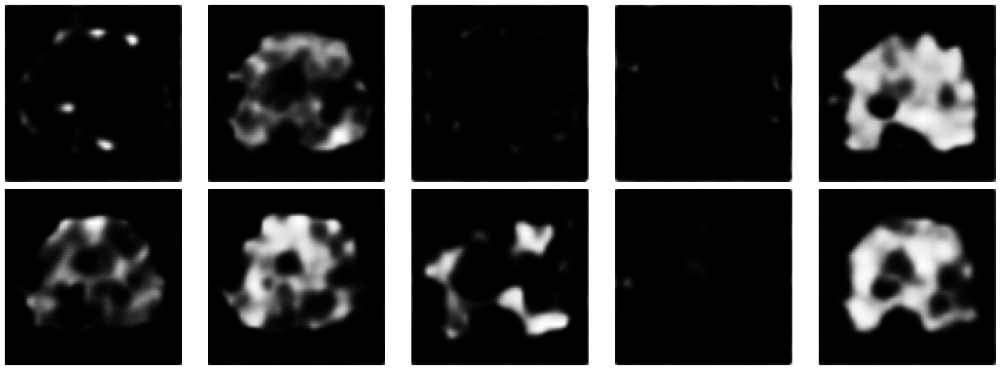

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:45,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 2/3750 [00:00<07:15,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 3/3750 [00:00<07:04,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 4/3750 [00:00<07:00,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<08:10,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<07:50,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▏                                                                                                               | 7/3750 [00:00<08:39,  7.21it/s]

1/1 [==============================] - 0s 11ms/step


  0%|▏                                                                                                               | 8/3750 [00:01<08:11,  7.61it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<07:46,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<07:29,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<07:27,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<07:22,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<07:15,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<08:21,  7.44it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 15/3750 [00:01<08:17,  7.51it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 16/3750 [00:01<07:51,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▌                                                                                                              | 17/3750 [00:02<07:36,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<07:25,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<07:14,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<07:45,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<07:40,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<07:32,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<07:21,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


  1%|▋                                                                                                              | 24/3750 [00:02<07:15,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▋                                                                                                              | 25/3750 [00:03<07:11,  8.63it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▊                                                                                                              | 26/3750 [00:03<07:25,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 27/3750 [00:03<07:22,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<07:25,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<07:22,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<07:19,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<07:15,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<07:09,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  1%|▉                                                                                                              | 33/3750 [00:03<07:07,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 34/3750 [00:04<08:02,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 35/3750 [00:04<08:15,  7.50it/s]

1/1 [==============================] - 0s 12ms/step


  1%|█                                                                                                              | 36/3750 [00:04<07:58,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 37/3750 [00:04<08:02,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 38/3750 [00:04<07:41,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<07:30,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<07:19,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 41/3750 [00:04<07:09,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 42/3750 [00:05<07:04,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 43/3750 [00:05<07:01,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 44/3750 [00:05<07:00,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 45/3750 [00:05<07:00,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<07:06,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▍                                                                                                             | 47/3750 [00:05<07:07,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▍                                                                                                             | 48/3750 [00:05<07:18,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


  1%|█▍                                                                                                             | 49/3750 [00:05<07:36,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▍                                                                                                             | 50/3750 [00:06<07:37,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 51/3750 [00:06<07:25,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


  1%|█▌                                                                                                             | 52/3750 [00:06<07:09,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▌                                                                                                             | 53/3750 [00:06<07:10,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 54/3750 [00:06<07:04,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<07:00,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 56/3750 [00:06<07:02,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 57/3750 [00:06<07:02,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 58/3750 [00:06<06:52,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 59/3750 [00:07<06:51,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 60/3750 [00:07<06:50,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 61/3750 [00:07<06:48,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 62/3750 [00:07<07:33,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 63/3750 [00:07<07:26,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 64/3750 [00:07<07:29,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 65/3750 [00:07<07:29,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 66/3750 [00:07<07:29,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 67/3750 [00:08<07:29,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 68/3750 [00:08<07:25,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██                                                                                                             | 69/3750 [00:08<07:24,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 70/3750 [00:08<07:22,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██                                                                                                             | 71/3750 [00:08<07:18,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 72/3750 [00:08<07:10,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 73/3750 [00:08<07:06,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 74/3750 [00:08<07:10,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 75/3750 [00:08<06:58,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 76/3750 [00:09<07:00,  8.74it/s]

1/1 [==============================] - 0s 16ms/step


  2%|██▎                                                                                                            | 77/3750 [00:09<08:03,  7.60it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▎                                                                                                            | 78/3750 [00:09<07:51,  7.79it/s]

1/1 [==============================] - 0s 12ms/step


  2%|██▎                                                                                                            | 79/3750 [00:09<07:43,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▎                                                                                                            | 80/3750 [00:09<07:32,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 81/3750 [00:09<07:30,  8.15it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▍                                                                                                            | 82/3750 [00:09<07:22,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▍                                                                                                            | 83/3750 [00:09<07:28,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▍                                                                                                            | 84/3750 [00:10<07:36,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 85/3750 [00:10<07:34,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 86/3750 [00:10<07:22,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 87/3750 [00:10<07:14,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 88/3750 [00:10<07:06,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 89/3750 [00:10<07:02,  8.66it/s]

1/1 [==============================] - 0s 46ms/step


  2%|██▋                                                                                                            | 90/3750 [00:10<07:43,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 91/3750 [00:10<07:36,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 92/3750 [00:11<07:32,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▊                                                                                                            | 93/3750 [00:11<07:21,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 94/3750 [00:11<07:11,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 95/3750 [00:11<07:13,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 96/3750 [00:11<07:14,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▊                                                                                                            | 97/3750 [00:11<07:08,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                            | 98/3750 [00:11<07:06,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 99/3750 [00:11<07:04,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                           | 100/3750 [00:12<07:06,  8.56it/s]

1/1 [==============================] - 0s 14ms/step


  3%|██▉                                                                                                           | 101/3750 [00:12<07:17,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▉                                                                                                           | 102/3750 [00:12<07:28,  8.14it/s]

1/1 [==============================] - 0s 14ms/step


  3%|███                                                                                                           | 103/3750 [00:12<07:33,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


  3%|███                                                                                                           | 104/3750 [00:12<08:07,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 105/3750 [00:12<07:47,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 106/3750 [00:12<07:31,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 107/3750 [00:12<07:19,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 108/3750 [00:13<07:12,  8.43it/s]

1/1 [==============================] - 0s 12ms/step


  3%|███▏                                                                                                          | 109/3750 [00:13<07:21,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 110/3750 [00:13<07:09,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 111/3750 [00:13<07:01,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▎                                                                                                          | 112/3750 [00:13<06:59,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 113/3750 [00:13<06:55,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 114/3750 [00:13<06:55,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 115/3750 [00:13<06:54,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 116/3750 [00:13<06:58,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 117/3750 [00:14<06:52,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 118/3750 [00:14<07:32,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 119/3750 [00:14<07:24,  8.17it/s]

1/1 [==============================] - 0s 12ms/step


  3%|███▌                                                                                                          | 120/3750 [00:14<07:36,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▌                                                                                                          | 121/3750 [00:14<07:33,  8.00it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▌                                                                                                          | 122/3750 [00:14<07:31,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 123/3750 [00:14<07:30,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▋                                                                                                          | 124/3750 [00:14<07:29,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▋                                                                                                          | 125/3750 [00:15<07:27,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 126/3750 [00:15<07:14,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 127/3750 [00:15<07:04,  8.53it/s]

1/1 [==============================] - 0s 12ms/step


  3%|███▊                                                                                                          | 128/3750 [00:15<07:03,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 129/3750 [00:15<06:55,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 130/3750 [00:15<07:32,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 131/3750 [00:15<07:17,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▊                                                                                                          | 132/3750 [00:15<07:04,  8.52it/s]

1/1 [==============================] - 0s 56ms/step


  4%|███▉                                                                                                          | 133/3750 [00:16<07:59,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 134/3750 [00:16<07:45,  7.78it/s]

1/1 [==============================] - 0s 12ms/step


  4%|███▉                                                                                                          | 135/3750 [00:16<07:36,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 136/3750 [00:16<07:21,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████                                                                                                          | 137/3750 [00:16<07:11,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 138/3750 [00:16<07:07,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████                                                                                                          | 139/3750 [00:16<07:06,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 140/3750 [00:16<07:02,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▏                                                                                                         | 141/3750 [00:16<07:01,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 142/3750 [00:17<06:57,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▏                                                                                                         | 143/3750 [00:17<07:00,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▏                                                                                                         | 144/3750 [00:17<06:57,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 145/3750 [00:17<06:56,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 146/3750 [00:17<07:33,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 147/3750 [00:17<07:20,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 148/3750 [00:17<07:17,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▎                                                                                                         | 149/3750 [00:17<07:20,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 150/3750 [00:18<07:29,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 151/3750 [00:18<07:27,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 152/3750 [00:18<07:27,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▍                                                                                                         | 153/3750 [00:18<07:32,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▌                                                                                                         | 154/3750 [00:18<07:34,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 155/3750 [00:18<07:23,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 156/3750 [00:18<07:28,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▌                                                                                                         | 157/3750 [00:18<07:23,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 158/3750 [00:19<07:16,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 159/3750 [00:19<07:22,  8.11it/s]

1/1 [==============================] - 0s 14ms/step


  4%|████▋                                                                                                         | 160/3750 [00:19<07:22,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 161/3750 [00:19<07:11,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 162/3750 [00:19<07:02,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 163/3750 [00:19<06:56,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 164/3750 [00:19<06:51,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 165/3750 [00:19<06:46,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 166/3750 [00:19<06:40,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 167/3750 [00:20<06:37,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 168/3750 [00:20<06:36,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  5%|████▉                                                                                                         | 169/3750 [00:20<06:35,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


  5%|████▉                                                                                                         | 170/3750 [00:20<06:39,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 171/3750 [00:20<06:48,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 172/3750 [00:20<06:43,  8.86it/s]

1/1 [==============================] - 0s 59ms/step


  5%|█████                                                                                                         | 173/3750 [00:20<07:48,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 174/3750 [00:20<07:32,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:21<07:17,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:21<07:04,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:21<06:55,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:21<07:18,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:21<07:04,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:21<06:58,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:21<06:55,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:21<06:52,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:21<06:49,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:22<06:48,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:22<06:46,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:22<07:02,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:22<07:22,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:22<07:07,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:22<06:56,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:22<06:52,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:22<06:49,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:23<06:46,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:23<06:43,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:23<06:40,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:23<06:38,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:23<06:39,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:23<06:41,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:23<06:54,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:23<07:12,  8.21it/s]

1/1 [==============================] - 0s 14ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:24<08:16,  7.15it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:24<07:53,  7.49it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:24<08:01,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:24<07:37,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:24<07:19,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 205/3750 [00:24<07:02,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


  5%|██████                                                                                                        | 206/3750 [00:24<07:03,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████                                                                                                        | 207/3750 [00:24<06:56,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████                                                                                                        | 208/3750 [00:24<06:48,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:25<06:44,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:25<06:43,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:25<06:43,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:25<06:39,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:25<06:37,  8.90it/s]

1/1 [==============================] - 0s 32ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:25<07:27,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:25<07:12,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:25<07:08,  8.25it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:26<06:53,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:26<06:40,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:26<06:34,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:26<06:33,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:26<06:32,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:26<06:27,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:26<06:32,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:26<06:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:26<06:31,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:27<06:29,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:27<06:56,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:27<07:20,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:27<07:06,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:27<06:55,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:27<06:48,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:27<06:43,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:27<06:40,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:27<06:39,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:28<06:39,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:28<06:36,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:28<06:34,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:28<06:43,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  6%|███████                                                                                                       | 239/3750 [00:28<06:38,  8.81it/s]

1/1 [==============================] - 0s 12ms/step


  6%|███████                                                                                                       | 240/3750 [00:28<06:44,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


  6%|███████                                                                                                       | 241/3750 [00:28<07:27,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 242/3750 [00:28<07:12,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:29<07:03,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:29<06:53,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:29<06:55,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:29<06:49,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:29<06:48,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:29<06:40,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:29<06:37,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:29<06:39,  8.77it/s]

1/1 [==============================] - 0s 18ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:29<07:31,  7.76it/s]

1/1 [==============================] - 0s 60ms/step


  7%|███████▍                                                                                                      | 252/3750 [00:30<09:56,  5.86it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▍                                                                                                      | 253/3750 [00:30<09:02,  6.44it/s]

1/1 [==============================] - 0s 12ms/step


  7%|███████▍                                                                                                      | 254/3750 [00:30<09:23,  6.21it/s]

1/1 [==============================] - 0s 12ms/step


  7%|███████▍                                                                                                      | 255/3750 [00:30<08:48,  6.61it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 256/3750 [00:30<08:12,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


  7%|███████▌                                                                                                      | 257/3750 [00:30<08:16,  7.03it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 258/3750 [00:31<08:01,  7.25it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▌                                                                                                      | 259/3750 [00:31<07:36,  7.64it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▋                                                                                                      | 260/3750 [00:31<07:28,  7.78it/s]

1/1 [==============================] - 0s 8ms/step


  7%|███████▋                                                                                                      | 261/3750 [00:31<07:17,  7.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|███████▋                                                                                                      | 262/3750 [00:31<07:10,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▋                                                                                                      | 263/3750 [00:31<06:58,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▋                                                                                                      | 264/3750 [00:31<06:52,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▊                                                                                                      | 265/3750 [00:31<06:48,  8.52it/s]

1/1 [==============================] - 0s 15ms/step


  7%|███████▊                                                                                                      | 266/3750 [00:32<07:07,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


  7%|███████▊                                                                                                      | 267/3750 [00:32<08:36,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


  7%|███████▊                                                                                                      | 268/3750 [00:32<08:08,  7.12it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▉                                                                                                      | 269/3750 [00:32<07:41,  7.55it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▉                                                                                                      | 270/3750 [00:32<07:25,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 271/3750 [00:32<07:10,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▉                                                                                                      | 272/3750 [00:32<07:07,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 273/3750 [00:32<07:17,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


  7%|████████                                                                                                      | 274/3750 [00:33<07:22,  7.86it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 275/3750 [00:33<07:08,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████                                                                                                      | 276/3750 [00:33<07:00,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 277/3750 [00:33<06:50,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


  7%|████████▏                                                                                                     | 278/3750 [00:33<06:43,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 279/3750 [00:33<06:49,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


  7%|████████▏                                                                                                     | 280/3750 [00:33<07:02,  8.21it/s]

1/1 [==============================] - 0s 12ms/step


  7%|████████▏                                                                                                     | 281/3750 [00:33<07:58,  7.25it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▎                                                                                                     | 282/3750 [00:34<07:44,  7.47it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▎                                                                                                     | 283/3750 [00:34<07:25,  7.78it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▎                                                                                                     | 284/3750 [00:34<07:26,  7.77it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▎                                                                                                     | 285/3750 [00:34<07:45,  7.45it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▍                                                                                                     | 286/3750 [00:34<07:41,  7.51it/s]

1/1 [==============================] - 0s 13ms/step


  8%|████████▍                                                                                                     | 287/3750 [00:34<07:39,  7.53it/s]

1/1 [==============================] - 0s 12ms/step


  8%|████████▍                                                                                                     | 288/3750 [00:34<07:43,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▍                                                                                                     | 289/3750 [00:35<07:35,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▌                                                                                                     | 290/3750 [00:35<07:26,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 291/3750 [00:35<07:04,  8.14it/s]

1/1 [==============================] - 0s 8ms/step


  8%|████████▌                                                                                                     | 292/3750 [00:35<06:54,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▌                                                                                                     | 293/3750 [00:35<06:56,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▌                                                                                                     | 294/3750 [00:35<07:17,  7.90it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 295/3750 [00:35<07:52,  7.31it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 296/3750 [00:35<07:34,  7.59it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 297/3750 [00:36<07:21,  7.81it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▋                                                                                                     | 298/3750 [00:36<07:20,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 299/3750 [00:36<07:14,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▊                                                                                                     | 300/3750 [00:36<07:00,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▊                                                                                                     | 301/3750 [00:36<07:02,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▊                                                                                                     | 302/3750 [00:36<07:03,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


  8%|████████▉                                                                                                     | 303/3750 [00:36<06:59,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 304/3750 [00:36<06:42,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  8%|████████▉                                                                                                     | 305/3750 [00:36<06:34,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


  8%|████████▉                                                                                                     | 306/3750 [00:37<06:30,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 307/3750 [00:37<06:29,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████                                                                                                     | 308/3750 [00:37<06:39,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████                                                                                                     | 309/3750 [00:37<07:03,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████                                                                                                     | 310/3750 [00:37<07:20,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████                                                                                                     | 311/3750 [00:37<06:58,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 312/3750 [00:37<06:46,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████▏                                                                                                    | 313/3750 [00:37<06:42,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▏                                                                                                    | 314/3750 [00:38<06:37,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  8%|█████████▏                                                                                                    | 315/3750 [00:38<06:35,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 316/3750 [00:38<06:36,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


  8%|█████████▎                                                                                                    | 317/3750 [00:38<06:39,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


  8%|█████████▎                                                                                                    | 318/3750 [00:38<06:35,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▎                                                                                                    | 319/3750 [00:38<06:30,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 320/3750 [00:38<06:23,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▍                                                                                                    | 321/3750 [00:38<06:18,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 322/3750 [00:38<06:49,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▍                                                                                                    | 323/3750 [00:39<06:40,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 324/3750 [00:39<06:33,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 325/3750 [00:39<06:29,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▌                                                                                                    | 326/3750 [00:39<06:27,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▌                                                                                                    | 327/3750 [00:39<06:25,  8.88it/s]

1/1 [==============================] - 0s 13ms/step


  9%|█████████▌                                                                                                    | 328/3750 [00:39<06:28,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 329/3750 [00:39<06:25,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▋                                                                                                    | 330/3750 [00:39<06:29,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▋                                                                                                    | 331/3750 [00:39<06:28,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▋                                                                                                    | 332/3750 [00:40<06:28,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▊                                                                                                    | 333/3750 [00:40<06:23,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 334/3750 [00:40<06:15,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


  9%|█████████▊                                                                                                    | 335/3750 [00:40<06:20,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


  9%|█████████▊                                                                                                    | 336/3750 [00:40<06:52,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 337/3750 [00:40<06:44,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  9%|█████████▉                                                                                                    | 338/3750 [00:40<06:38,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 339/3750 [00:40<06:31,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


  9%|█████████▉                                                                                                    | 340/3750 [00:40<06:26,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 341/3750 [00:41<06:23,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 342/3750 [00:41<06:21,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 343/3750 [00:41<06:20,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 344/3750 [00:41<06:21,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████                                                                                                    | 345/3750 [00:41<06:18,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 346/3750 [00:41<06:17,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 347/3750 [00:41<06:17,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 348/3750 [00:41<06:16,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▏                                                                                                   | 349/3750 [00:42<06:55,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▎                                                                                                   | 350/3750 [00:42<06:44,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 351/3750 [00:42<06:36,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 352/3750 [00:42<06:32,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▎                                                                                                   | 353/3750 [00:42<06:41,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


  9%|██████████▍                                                                                                   | 354/3750 [00:42<06:40,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 355/3750 [00:42<06:31,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


  9%|██████████▍                                                                                                   | 356/3750 [00:42<06:27,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▍                                                                                                   | 357/3750 [00:42<06:24,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 358/3750 [00:43<06:21,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 359/3750 [00:43<06:23,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▌                                                                                                   | 360/3750 [00:43<06:42,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 10%|██████████▌                                                                                                   | 361/3750 [00:43<06:37,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▌                                                                                                   | 362/3750 [00:43<06:31,  8.65it/s]

1/1 [==============================] - 0s 47ms/step


 10%|██████████▋                                                                                                   | 363/3750 [00:43<07:12,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 364/3750 [00:43<06:55,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▋                                                                                                   | 365/3750 [00:43<06:43,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▋                                                                                                   | 366/3750 [00:44<06:39,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 367/3750 [00:44<06:38,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 368/3750 [00:44<06:42,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 369/3750 [00:44<06:45,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▊                                                                                                   | 370/3750 [00:44<06:47,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 10%|██████████▉                                                                                                   | 371/3750 [00:44<07:09,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 372/3750 [00:44<07:06,  7.92it/s]

1/1 [==============================] - 0s 12ms/step


 10%|██████████▉                                                                                                   | 373/3750 [00:44<07:03,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 10%|██████████▉                                                                                                   | 374/3750 [00:44<06:50,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 375/3750 [00:45<06:50,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████                                                                                                   | 376/3750 [00:45<06:54,  8.15it/s]

1/1 [==============================] - 0s 12ms/step


 10%|███████████                                                                                                   | 377/3750 [00:45<07:49,  7.18it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████                                                                                                   | 378/3750 [00:45<07:29,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████                                                                                                   | 379/3750 [00:45<07:04,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▏                                                                                                  | 380/3750 [00:45<07:08,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▏                                                                                                  | 381/3750 [00:45<07:04,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 382/3750 [00:46<07:06,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▏                                                                                                  | 383/3750 [00:46<07:04,  7.93it/s]

1/1 [==============================] - 0s 11ms/step


 10%|███████████▎                                                                                                  | 384/3750 [00:46<07:01,  7.98it/s]

1/1 [==============================] - 0s 12ms/step


 10%|███████████▎                                                                                                  | 385/3750 [00:46<06:53,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▎                                                                                                  | 386/3750 [00:46<06:41,  8.39it/s]

1/1 [==============================] - 0s 14ms/step


 10%|███████████▎                                                                                                  | 387/3750 [00:46<06:44,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 388/3750 [00:46<06:35,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 389/3750 [00:46<06:36,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 390/3750 [00:47<07:13,  7.76it/s]

1/1 [==============================] - 0s 12ms/step


 10%|███████████▍                                                                                                  | 391/3750 [00:47<07:04,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 10%|███████████▍                                                                                                  | 392/3750 [00:47<06:50,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 10%|███████████▌                                                                                                  | 393/3750 [00:47<06:40,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▌                                                                                                  | 394/3750 [00:47<06:30,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▌                                                                                                  | 395/3750 [00:47<06:26,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 11%|███████████▌                                                                                                  | 396/3750 [00:47<06:19,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▋                                                                                                  | 397/3750 [00:47<06:18,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 398/3750 [00:47<06:19,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▋                                                                                                  | 399/3750 [00:48<06:15,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▋                                                                                                  | 400/3750 [00:48<06:16,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▊                                                                                                  | 401/3750 [00:48<06:16,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▊                                                                                                  | 402/3750 [00:48<06:17,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 403/3750 [00:48<06:28,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▊                                                                                                  | 404/3750 [00:48<07:23,  7.55it/s]

1/1 [==============================] - 0s 11ms/step


 11%|███████████▉                                                                                                  | 405/3750 [00:48<07:09,  7.79it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 406/3750 [00:48<06:50,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 407/3750 [00:49<06:42,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 11%|███████████▉                                                                                                  | 408/3750 [00:49<06:34,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 11%|███████████▉                                                                                                  | 409/3750 [00:49<06:26,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 410/3750 [00:49<06:21,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 411/3750 [00:49<06:17,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 412/3750 [00:49<06:15,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████                                                                                                  | 413/3750 [00:49<06:11,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▏                                                                                                 | 414/3750 [00:49<06:16,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 415/3750 [00:49<06:15,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 416/3750 [00:50<06:18,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▏                                                                                                 | 417/3750 [00:50<06:52,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▎                                                                                                 | 418/3750 [00:50<06:54,  8.04it/s]

1/1 [==============================] - 0s 12ms/step


 11%|████████████▎                                                                                                 | 419/3750 [00:50<06:54,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 420/3750 [00:50<06:42,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▎                                                                                                 | 421/3750 [00:50<06:33,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 422/3750 [00:50<06:27,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 423/3750 [00:50<06:22,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 424/3750 [00:50<06:19,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 425/3750 [00:51<06:19,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:51<06:15,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:51<06:12,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:51<06:09,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:51<06:09,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:51<06:08,  9.00it/s]

1/1 [==============================] - 0s 54ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:51<06:45,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:51<06:37,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:52<06:27,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:52<06:23,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:52<06:18,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:52<06:14,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:52<06:19,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:52<06:26,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:52<06:21,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:52<06:23,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:52<06:20,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:53<06:16,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:53<06:16,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:53<06:17,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:53<06:55,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:53<06:45,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:53<06:34,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:53<06:27,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:53<06:22,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:53<06:19,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:54<06:15,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:54<06:16,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:54<06:13,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:54<06:12,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:54<06:13,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:54<06:10,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:54<06:08,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:54<06:44,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:55<06:36,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:55<06:35,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:55<06:29,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:55<06:21,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:55<06:16,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:55<06:14,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:55<06:13,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:55<06:12,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:55<06:10,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:56<06:10,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:56<06:06,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:56<06:09,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:56<06:08,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:56<06:42,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:56<06:36,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:56<06:27,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:56<06:21,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:56<06:17,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:57<06:14,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 478/3750 [00:57<06:12,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 479/3750 [00:57<06:10,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████                                                                                                | 480/3750 [00:57<06:07,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 481/3750 [00:57<06:06,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:57<06:12,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:57<06:08,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:57<06:07,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:58<06:16,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:58<06:47,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 487/3750 [00:58<06:37,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 488/3750 [00:58<06:28,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▎                                                                                               | 489/3750 [00:58<06:23,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 490/3750 [00:58<06:21,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 491/3750 [00:58<06:16,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 492/3750 [00:58<06:12,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 493/3750 [00:58<06:11,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 494/3750 [00:59<06:06,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 495/3750 [00:59<06:04,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 496/3750 [00:59<06:02,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 497/3750 [00:59<06:04,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 498/3750 [00:59<06:01,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 499/3750 [00:59<06:40,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 500/3750 [00:59<06:30,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 501/3750 [00:59<06:24,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 502/3750 [00:59<06:16,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 503/3750 [01:00<06:12,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 504/3750 [01:00<06:08,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 505/3750 [01:00<06:03,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 506/3750 [01:00<06:03,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▊                                                                                               | 507/3750 [01:00<06:04,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 508/3750 [01:00<06:03,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 509/3750 [01:00<06:02,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 510/3750 [01:00<06:01,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 511/3750 [01:00<06:00,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 512/3750 [01:01<06:00,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 513/3750 [01:01<06:43,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 514/3750 [01:01<06:35,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████                                                                                               | 515/3750 [01:01<06:27,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 516/3750 [01:01<06:19,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 14%|███████████████▏                                                                                              | 517/3750 [01:01<06:33,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 518/3750 [01:01<06:18,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▏                                                                                              | 519/3750 [01:01<06:14,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 520/3750 [01:02<06:08,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 521/3750 [01:02<06:06,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 522/3750 [01:02<06:04,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 523/3750 [01:02<06:01,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 524/3750 [01:02<05:59,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 525/3750 [01:02<05:58,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 526/3750 [01:02<06:00,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 14%|███████████████▍                                                                                              | 527/3750 [01:02<06:48,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▍                                                                                              | 528/3750 [01:02<06:35,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 529/3750 [01:03<06:23,  8.40it/s]

1/1 [==============================] - 0s 12ms/step


 14%|███████████████▌                                                                                              | 530/3750 [01:03<06:20,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 531/3750 [01:03<06:12,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 532/3750 [01:03<06:08,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 533/3750 [01:03<06:08,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 534/3750 [01:03<06:04,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 535/3750 [01:03<06:04,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 536/3750 [01:03<06:03,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 537/3750 [01:04<06:02,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 538/3750 [01:04<05:56,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:04<05:51,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:04<06:30,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:04<06:23,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:04<06:15,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:04<06:12,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:04<06:08,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:04<06:07,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 546/3750 [01:05<06:04,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 547/3750 [01:05<06:00,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 548/3750 [01:05<05:56,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 549/3750 [01:05<05:53,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:05<05:54,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:05<05:53,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:05<05:58,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:05<05:57,  8.94it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:05<06:50,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:06<06:36,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:06<06:23,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:06<06:13,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:06<06:08,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:06<06:06,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:06<06:04,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:06<06:04,  8.75it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:07<10:16,  5.17it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:07<09:06,  5.84it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:07<08:08,  6.52it/s]

1/1 [==============================] - 0s 32ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:07<08:01,  6.61it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:07<07:28,  7.09it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:07<07:01,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:07<06:40,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:07<06:29,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:08<06:20,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:08<06:15,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:08<06:09,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:08<06:07,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:08<06:02,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:08<06:01,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:08<06:06,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:08<06:01,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:09<05:58,  8.84it/s]

1/1 [==============================] - 0s 54ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:09<06:45,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:09<06:32,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:09<06:26,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:09<06:17,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:09<06:12,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:09<06:00,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:09<06:00,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:09<05:59,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:10<05:57,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:10<05:57,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:10<05:56,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:10<05:55,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:10<05:52,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:10<05:58,  8.81it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:10<06:37,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:10<06:26,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:11<06:16,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:11<06:07,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:11<06:05,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:11<05:58,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:11<05:57,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:11<05:55,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:11<05:52,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:11<05:53,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:11<05:54,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:12<05:53,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:12<05:51,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:12<06:36,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:12<06:25,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:12<06:21,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:12<06:13,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:12<06:07,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:12<06:05,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:12<06:01,  8.68it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:13<06:02,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:13<05:58,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:13<06:00,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:13<05:59,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:13<05:56,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:13<05:54,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:13<05:57,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:13<06:38,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:14<06:29,  8.04it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:14<06:30,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:14<06:29,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:14<06:30,  8.00it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:14<06:32,  7.97it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:14<06:32,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:14<06:44,  7.71it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:14<06:56,  7.49it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:15<06:56,  7.49it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:15<06:54,  7.52it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:15<06:45,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:15<06:46,  7.67it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:15<07:27,  6.97it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:15<07:08,  7.27it/s]

1/1 [==============================] - 0s 13ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:15<06:55,  7.49it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:16<06:44,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:16<06:31,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:16<06:22,  8.13it/s]

1/1 [==============================] - 0s 24ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:16<07:23,  7.02it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:16<07:18,  7.10it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:16<07:02,  7.35it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:16<06:51,  7.55it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:16<06:47,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:17<06:53,  7.51it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:17<06:38,  7.79it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:17<06:45,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:17<06:51,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:17<06:37,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:17<08:01,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:17<07:44,  6.68it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:18<07:10,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:18<06:47,  7.61it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:18<06:31,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:18<06:21,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:18<06:15,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:18<06:12,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:18<06:08,  8.39it/s]

1/1 [==============================] - 0s 12ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:18<06:13,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:19<06:08,  8.39it/s]

1/1 [==============================] - 0s 13ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:19<07:00,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:19<06:49,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:19<06:37,  7.76it/s]

1/1 [==============================] - 0s 12ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:19<06:27,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:19<06:16,  8.19it/s]

1/1 [==============================] - 0s 13ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:19<06:12,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:19<06:00,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:20<05:59,  8.58it/s]

1/1 [==============================] - 0s 12ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:20<06:05,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:20<06:11,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:20<06:13,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:20<06:07,  8.37it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:20<06:06,  8.39it/s]

1/1 [==============================] - 0s 12ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:20<06:12,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:20<06:56,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:21<06:45,  7.58it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:21<06:34,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:21<06:25,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:21<06:17,  8.13it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:21<06:05,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:21<05:55,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:21<05:54,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:21<05:50,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:21<05:45,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:22<05:43,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:22<05:42,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:22<05:44,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:22<06:32,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:22<06:22,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:22<06:10,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:22<06:01,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:22<05:58,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:23<05:52,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:23<05:50,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:23<05:49,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:23<05:46,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:23<05:50,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:23<05:54,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:23<06:00,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:23<05:58,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:23<05:57,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:24<06:27,  7.88it/s]

1/1 [==============================] - 0s 12ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:24<06:26,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:24<06:19,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:24<06:10,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:24<06:03,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:24<06:47,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:24<06:31,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:24<06:18,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:25<06:08,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:25<05:59,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:25<05:57,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:25<05:54,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:25<05:52,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:25<05:49,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:25<06:33,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:25<06:17,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:26<06:04,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:26<05:57,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:26<05:54,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:26<05:55,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:26<05:52,  8.58it/s]

1/1 [==============================] - 0s 12ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:26<05:58,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:26<06:00,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:26<05:57,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:26<05:55,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:27<05:51,  8.60it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:27<05:58,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:27<06:35,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:27<06:17,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:27<06:05,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:27<05:57,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:27<05:52,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:27<05:47,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:28<05:43,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:28<05:40,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:28<05:40,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:28<05:39,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:28<05:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:28<05:36,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:28<05:34,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:28<05:35,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:28<06:08,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:29<06:01,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:29<05:53,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:29<05:45,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:29<05:41,  8.80it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:29<05:35,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:29<05:34,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:29<05:37,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:29<05:49,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:29<05:47,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:30<05:50,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:30<05:58,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:30<05:55,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:30<05:58,  8.35it/s]

1/1 [==============================] - 0s 12ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:30<06:16,  7.96it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:30<06:11,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:30<06:03,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:30<06:02,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:31<05:56,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:31<05:53,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:31<05:49,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:31<05:51,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:31<05:50,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:31<05:52,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:31<05:51,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:31<05:49,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:32<05:54,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:32<05:57,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:32<06:34,  7.56it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:32<06:28,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:32<06:16,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:32<06:09,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:32<06:04,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:32<05:55,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:33<05:49,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:33<05:56,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:33<05:49,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:33<05:44,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:33<05:43,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:33<05:41,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:33<05:39,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:33<05:41,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:33<06:11,  7.99it/s]

1/1 [==============================] - 0s 12ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:34<06:09,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:34<06:07,  8.06it/s]

1/1 [==============================] - 0s 12ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:34<06:03,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:34<05:53,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:34<05:46,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:34<05:39,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:34<05:37,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:34<05:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:34<05:36,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:35<05:36,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:35<05:48,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:35<05:50,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:35<05:43,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:35<06:17,  7.83it/s]

1/1 [==============================] - 0s 14ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:35<06:16,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:35<06:02,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:35<05:52,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:36<05:43,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:36<05:38,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:36<05:40,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:36<05:41,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:36<05:40,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:36<05:48,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:36<05:44,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:36<05:34,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:37<05:32,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:37<05:29,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:37<06:01,  8.12it/s]

1/1 [==============================] - 0s 12ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:37<05:58,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:37<05:57,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:37<05:47,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:37<05:39,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:37<05:35,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:37<05:32,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:38<05:37,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:38<05:35,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:38<05:32,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:38<05:28,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:38<05:32,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:38<05:28,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:38<05:28,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:38<05:58,  8.16it/s]

1/1 [==============================] - 0s 12ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:38<05:52,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:39<05:50,  8.33it/s]

1/1 [==============================] - 0s 14ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:39<05:57,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:39<05:48,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:39<05:42,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:39<05:38,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:39<05:33,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:39<05:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:39<05:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:40<05:28,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:40<05:27,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:40<05:26,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:40<05:25,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:40<05:50,  8.30it/s]

1/1 [==============================] - 0s 14ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:40<05:50,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:40<05:43,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:40<05:38,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:40<05:33,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:41<05:30,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:41<05:27,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:41<05:28,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:41<05:26,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:41<05:26,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:41<05:28,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:41<05:28,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:41<05:26,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:41<05:25,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:42<05:51,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:42<05:44,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:42<05:38,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:42<05:32,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:42<05:29,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:42<05:29,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:42<05:26,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:42<05:24,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:43<05:22,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:43<05:22,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:43<05:25,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:43<05:33,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:43<05:35,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:43<05:37,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:43<06:20,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:43<06:16,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:44<06:07,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:44<06:01,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:44<06:00,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:44<05:58,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:44<05:56,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:44<05:56,  8.07it/s]

1/1 [==============================] - 0s 12ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:44<05:57,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:44<05:57,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:44<05:56,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:45<05:52,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:45<05:52,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:45<05:51,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:45<06:26,  7.42it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:45<06:18,  7.57it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:45<06:07,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:45<06:01,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:46<06:01,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:46<05:57,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:46<05:55,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:46<05:57,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:46<05:56,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:46<05:54,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:46<05:50,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:46<05:50,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:46<05:49,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:47<05:51,  8.13it/s]

1/1 [==============================] - 0s 12ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:47<06:41,  7.11it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:47<06:26,  7.39it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:47<06:11,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:47<05:58,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:47<05:48,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:47<05:42,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:48<05:37,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:48<05:35,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:48<05:37,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:48<05:34,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:48<05:38,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:48<05:36,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:48<05:37,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:48<05:34,  8.51it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:48<06:16,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:49<06:03,  7.81it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:49<05:56,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:49<06:17,  7.52it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:49<05:58,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:49<05:46,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:49<05:36,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:49<06:01,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:49<05:53,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:50<05:46,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:50<05:40,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:50<05:41,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:50<05:37,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:50<05:50,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:50<05:56,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:50<05:48,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:50<05:43,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:51<05:37,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:51<05:36,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:51<05:32,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:51<05:29,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:51<05:30,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:51<05:30,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:51<05:35,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:51<05:29,  8.54it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:52<05:25,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:52<05:24,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:52<05:53,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:52<05:46,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:52<05:39,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:52<05:33,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:52<05:24,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:52<05:24,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:52<05:22,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:53<05:24,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:53<05:22,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:53<05:26,  8.59it/s]

1/1 [==============================] - 0s 18ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:53<05:34,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:53<05:30,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:53<05:30,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:53<05:36,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:53<06:11,  7.53it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:54<05:58,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:54<05:47,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:54<05:41,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:54<05:39,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:54<05:37,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:54<05:33,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:54<05:31,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:54<05:41,  8.17it/s]

1/1 [==============================] - 0s 14ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:55<05:53,  7.90it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:55<05:54,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:55<05:51,  7.94it/s]

1/1 [==============================] - 0s 13ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:55<05:48,  8.00it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:55<05:41,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:55<05:37,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:55<05:38,  8.22it/s]

1/1 [==============================] - 0s 12ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:55<05:49,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:56<06:07,  7.57it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:56<05:59,  7.74it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:56<05:54,  7.84it/s]

1/1 [==============================] - 0s 13ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:56<05:57,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:56<05:55,  7.81it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:56<05:54,  7.84it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:56<05:41,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:56<05:30,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:57<05:53,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:57<05:44,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:57<06:15,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:57<06:03,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:57<05:46,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:57<05:35,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:57<05:31,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:57<05:29,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:58<05:32,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:58<05:31,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [01:58<05:32,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [01:58<05:54,  7.79it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [01:58<05:42,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [01:58<05:32,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [01:58<05:34,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [01:58<05:30,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [01:58<05:23,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [01:59<05:20,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [01:59<05:19,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [01:59<05:22,  8.55it/s]

1/1 [==============================] - 0s 49ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [01:59<06:06,  7.51it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [01:59<05:51,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [01:59<05:40,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [01:59<05:30,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [01:59<05:26,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [02:00<05:19,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [02:00<05:14,  8.73it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [02:00<05:29,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [02:00<05:22,  8.52it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [02:00<06:12,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [02:00<06:01,  7.58it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [02:00<05:46,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [02:00<05:34,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [02:01<05:25,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [02:01<05:24,  8.45it/s]

1/1 [==============================] - 0s 12ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [02:01<05:39,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [02:01<05:30,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [02:01<05:21,  8.51it/s]

1/1 [==============================] - 0s 34ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [02:01<06:33,  6.96it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [02:01<06:08,  7.42it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [02:01<05:47,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [02:02<05:33,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [02:02<05:23,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [02:02<05:17,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [02:02<05:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [02:02<05:06,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [02:02<05:13,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [02:02<05:39,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [02:02<05:36,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [02:03<05:26,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [02:03<05:18,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [02:03<05:13,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [02:03<05:07,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [02:03<05:08,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [02:03<05:17,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [02:03<05:13,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [02:03<05:58,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [02:03<05:43,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [02:04<05:30,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [02:04<05:20,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [02:04<05:14,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [02:04<05:10,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [02:04<05:12,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [02:04<05:16,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [02:04<05:19,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [02:04<06:02,  7.48it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [02:05<05:44,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [02:05<05:30,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [02:05<05:20,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [02:05<05:13,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [02:05<05:09,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [02:05<05:11,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [02:05<05:17,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [02:05<06:27,  6.96it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [02:06<06:15,  7.19it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [02:06<06:09,  7.31it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [02:06<06:18,  7.14it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [02:06<06:03,  7.41it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [02:06<05:55,  7.59it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [02:06<05:43,  7.85it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [02:06<05:27,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [02:06<05:20,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [02:07<05:24,  8.31it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [02:07<05:30,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [02:07<05:23,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [02:07<05:23,  8.32it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [02:07<05:11,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [02:07<05:04,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [02:07<05:00,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [02:07<05:04,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [02:07<05:03,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [02:08<05:04,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [02:08<05:55,  7.55it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [02:08<05:41,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [02:08<05:28,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [02:08<05:19,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [02:08<05:13,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [02:08<05:09,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [02:08<05:06,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:09<05:05,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:09<05:06,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:09<05:39,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:09<05:28,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:09<05:43,  7.78it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:09<05:30,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:09<05:22,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:09<05:20,  8.33it/s]

1/1 [==============================] - 0s 18ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:10<05:32,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:10<05:26,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:10<05:28,  8.11it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:10<06:01,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:10<05:47,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:10<05:37,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:10<05:27,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:10<05:47,  7.65it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:11<06:00,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:11<05:56,  7.46it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:11<05:41,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:11<05:41,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:11<05:41,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:11<05:25,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:11<05:14,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:12<06:05,  7.26it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:12<05:44,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:12<06:03,  7.29it/s]

1/1 [==============================] - 0s 12ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:12<05:50,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:12<05:35,  7.90it/s]

1/1 [==============================] - 0s 35ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:12<06:30,  6.78it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:12<06:02,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:12<05:42,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:13<05:28,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:13<05:24,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:13<05:15,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:13<05:08,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:13<05:04,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:13<05:03,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:13<05:40,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:13<05:29,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:14<05:17,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:14<05:09,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:14<05:04,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:14<05:11,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:14<05:21,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:14<05:13,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:14<05:12,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:14<05:26,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:14<05:20,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:15<05:11,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:15<05:04,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:15<04:59,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:15<04:57,  8.82it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:15<05:04,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:15<04:59,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:15<05:00,  8.72it/s]

1/1 [==============================] - 0s 12ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:15<05:37,  7.75it/s]

1/1 [==============================] - 0s 13ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:16<05:38,  7.73it/s]

1/1 [==============================] - 0s 12ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:16<05:28,  7.98it/s]

1/1 [==============================] - 0s 12ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:16<05:27,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:16<05:18,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:16<05:09,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:16<05:10,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:16<05:15,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:16<05:48,  7.50it/s]

1/1 [==============================] - 0s 11ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:17<06:03,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:17<05:44,  7.58it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:17<05:28,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:17<05:18,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:17<05:08,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:17<05:02,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:17<04:59,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:17<04:57,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:17<04:56,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:18<05:31,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:18<05:24,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:18<05:15,  8.24it/s]

1/1 [==============================] - 0s 12ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:18<05:19,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:18<05:09,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:18<05:02,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:18<04:55,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:18<04:53,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:19<04:53,  8.84it/s]

1/1 [==============================] - 0s 12ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:19<05:41,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:19<05:26,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:19<05:19,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:19<05:10,  8.35it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:19<05:00,  8.61it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:19<04:51,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:19<04:50,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:20<04:48,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:20<04:51,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:20<05:18,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:20<05:10,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:20<05:05,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:20<04:59,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:20<04:57,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:20<04:53,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:20<04:51,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:21<04:50,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1174/3750 [02:21<04:59,  8.61it/s]

1/1 [==============================] - 0s 13ms/step


 31%|██████████████████████████████████▏                                                                          | 1175/3750 [02:21<05:18,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1176/3750 [02:21<05:09,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▏                                                                          | 1177/3750 [02:21<05:03,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▏                                                                          | 1178/3750 [02:21<04:57,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▎                                                                          | 1179/3750 [02:21<04:53,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████▎                                                                          | 1180/3750 [02:21<04:50,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████▎                                                                          | 1181/3750 [02:21<04:49,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▎                                                                          | 1182/3750 [02:22<04:48,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▍                                                                          | 1183/3750 [02:22<04:45,  8.99it/s]

1/1 [==============================] - 0s 16ms/step


 32%|██████████████████████████████████▍                                                                          | 1184/3750 [02:22<05:26,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1185/3750 [02:22<05:15,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▍                                                                          | 1186/3750 [02:22<05:08,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1187/3750 [02:22<05:00,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1188/3750 [02:22<04:55,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▌                                                                          | 1189/3750 [02:22<04:52,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▌                                                                          | 1190/3750 [02:23<04:52,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▌                                                                          | 1191/3750 [02:23<04:50,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1192/3750 [02:23<04:48,  8.87it/s]

1/1 [==============================] - 0s 13ms/step


 32%|██████████████████████████████████▋                                                                          | 1193/3750 [02:23<05:33,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1194/3750 [02:23<05:20,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▋                                                                          | 1195/3750 [02:23<05:12,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1196/3750 [02:23<05:03,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1197/3750 [02:23<04:57,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▊                                                                          | 1198/3750 [02:24<04:53,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 32%|██████████████████████████████████▊                                                                          | 1199/3750 [02:24<04:51,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1200/3750 [02:24<04:49,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 32%|██████████████████████████████████▉                                                                          | 1201/3750 [02:24<04:46,  8.88it/s]

1/1 [==============================] - 0s 13ms/step


 32%|██████████████████████████████████▉                                                                          | 1202/3750 [02:24<05:29,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1203/3750 [02:24<05:17,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 32%|██████████████████████████████████▉                                                                          | 1204/3750 [02:24<05:08,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1205/3750 [02:24<05:00,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1206/3750 [02:24<04:54,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1207/3750 [02:25<04:50,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████                                                                          | 1208/3750 [02:25<04:54,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1209/3750 [02:25<04:49,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▏                                                                         | 1210/3750 [02:25<04:53,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 32%|███████████████████████████████████▏                                                                         | 1211/3750 [02:25<05:04,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▏                                                                         | 1212/3750 [02:25<05:00,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1213/3750 [02:25<04:57,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 32%|███████████████████████████████████▎                                                                         | 1214/3750 [02:25<04:53,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1215/3750 [02:25<04:50,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1216/3750 [02:26<04:46,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 32%|███████████████████████████████████▎                                                                         | 1217/3750 [02:26<04:44,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 32%|███████████████████████████████████▍                                                                         | 1218/3750 [02:26<04:44,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▍                                                                         | 1219/3750 [02:26<05:02,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▍                                                                         | 1220/3750 [02:26<04:58,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▍                                                                         | 1221/3750 [02:26<04:52,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1222/3750 [02:26<04:51,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▌                                                                         | 1223/3750 [02:26<04:47,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▌                                                                         | 1224/3750 [02:27<04:45,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▌                                                                         | 1225/3750 [02:27<04:46,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1226/3750 [02:27<04:45,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▋                                                                         | 1227/3750 [02:27<04:43,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▋                                                                         | 1228/3750 [02:27<04:50,  8.69it/s]

1/1 [==============================] - 0s 12ms/step


 33%|███████████████████████████████████▋                                                                         | 1229/3750 [02:27<05:25,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1230/3750 [02:27<05:10,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▊                                                                         | 1231/3750 [02:27<05:02,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1232/3750 [02:27<04:56,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1233/3750 [02:28<04:52,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▊                                                                         | 1234/3750 [02:28<04:49,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 33%|███████████████████████████████████▉                                                                         | 1235/3750 [02:28<04:46,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1236/3750 [02:28<04:46,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 33%|███████████████████████████████████▉                                                                         | 1237/3750 [02:28<04:47,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 33%|███████████████████████████████████▉                                                                         | 1238/3750 [02:28<05:30,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1239/3750 [02:28<05:15,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████                                                                         | 1240/3750 [02:28<05:06,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1241/3750 [02:29<04:57,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████                                                                         | 1242/3750 [02:29<04:51,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1243/3750 [02:29<04:48,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1244/3750 [02:29<05:11,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1245/3750 [02:29<05:02,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1246/3750 [02:29<05:01,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▏                                                                        | 1247/3750 [02:29<05:06,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▎                                                                        | 1248/3750 [02:29<04:57,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1249/3750 [02:30<04:53,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1250/3750 [02:30<04:48,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▎                                                                        | 1251/3750 [02:30<04:43,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1252/3750 [02:30<04:41,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1253/3750 [02:30<04:39,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 33%|████████████████████████████████████▍                                                                        | 1254/3750 [02:30<04:38,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 33%|████████████████████████████████████▍                                                                        | 1255/3750 [02:30<04:40,  8.91it/s]

1/1 [==============================] - 0s 15ms/step


 33%|████████████████████████████████████▌                                                                        | 1256/3750 [02:30<05:15,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▌                                                                        | 1257/3750 [02:30<05:20,  7.78it/s]

1/1 [==============================] - 0s 37ms/step


 34%|████████████████████████████████████▌                                                                        | 1258/3750 [02:31<06:09,  6.75it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1259/3750 [02:31<05:44,  7.23it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▌                                                                        | 1260/3750 [02:31<05:23,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▋                                                                        | 1261/3750 [02:31<05:09,  8.04it/s]

1/1 [==============================] - 0s 8ms/step


 34%|████████████████████████████████████▋                                                                        | 1262/3750 [02:31<04:55,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1263/3750 [02:31<04:47,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▋                                                                        | 1264/3750 [02:31<05:01,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1265/3750 [02:31<04:56,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1266/3750 [02:32<04:49,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▊                                                                        | 1267/3750 [02:32<04:45,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▊                                                                        | 1268/3750 [02:32<04:43,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1269/3750 [02:32<04:39,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 34%|████████████████████████████████████▉                                                                        | 1270/3750 [02:32<04:38,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1271/3750 [02:32<04:37,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 34%|████████████████████████████████████▉                                                                        | 1272/3750 [02:32<04:35,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1273/3750 [02:32<04:38,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████                                                                        | 1274/3750 [02:33<05:12,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1275/3750 [02:33<05:01,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1276/3750 [02:33<04:54,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████                                                                        | 1277/3750 [02:33<04:49,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1278/3750 [02:33<04:45,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1279/3750 [02:33<04:41,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▏                                                                       | 1280/3750 [02:33<05:19,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▏                                                                       | 1281/3750 [02:33<05:07,  8.02it/s]

1/1 [==============================] - 0s 13ms/step


 34%|█████████████████████████████████████▎                                                                       | 1282/3750 [02:33<05:07,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 34%|█████████████████████████████████████▎                                                                       | 1283/3750 [02:34<05:26,  7.56it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1284/3750 [02:34<05:11,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▎                                                                       | 1285/3750 [02:34<05:00,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1286/3750 [02:34<04:54,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1287/3750 [02:34<04:47,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1288/3750 [02:34<04:45,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▍                                                                       | 1289/3750 [02:34<04:41,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▍                                                                       | 1290/3750 [02:34<04:38,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 34%|█████████████████████████████████████▌                                                                       | 1291/3750 [02:35<04:58,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▌                                                                       | 1292/3750 [02:35<04:53,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 34%|█████████████████████████████████████▌                                                                       | 1293/3750 [02:35<04:49,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▌                                                                       | 1294/3750 [02:35<04:45,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1295/3750 [02:35<04:44,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1296/3750 [02:35<04:43,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▋                                                                       | 1297/3750 [02:35<04:42,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 35%|█████████████████████████████████████▋                                                                       | 1298/3750 [02:35<04:43,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1299/3750 [02:35<04:38,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1300/3750 [02:36<04:32,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 35%|█████████████████████████████████████▊                                                                       | 1301/3750 [02:36<05:11,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 35%|█████████████████████████████████████▊                                                                       | 1302/3750 [02:36<05:03,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▊                                                                       | 1303/3750 [02:36<04:53,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▉                                                                       | 1304/3750 [02:36<04:47,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 35%|█████████████████████████████████████▉                                                                       | 1305/3750 [02:36<04:41,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1306/3750 [02:36<04:34,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 35%|█████████████████████████████████████▉                                                                       | 1307/3750 [02:36<04:30,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1308/3750 [02:37<04:42,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1309/3750 [02:37<04:38,  8.77it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                       | 1310/3750 [02:37<05:01,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████                                                                       | 1311/3750 [02:37<04:55,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1312/3750 [02:37<04:48,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▏                                                                      | 1313/3750 [02:37<04:43,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1314/3750 [02:37<04:41,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▏                                                                      | 1315/3750 [02:37<04:39,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1316/3750 [02:37<04:36,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 35%|██████████████████████████████████████▎                                                                      | 1317/3750 [02:38<04:34,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1318/3750 [02:38<04:35,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▎                                                                      | 1319/3750 [02:38<05:03,  8.00it/s]

1/1 [==============================] - 0s 13ms/step


 35%|██████████████████████████████████████▎                                                                      | 1320/3750 [02:38<04:59,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▍                                                                      | 1321/3750 [02:38<04:52,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 35%|██████████████████████████████████████▍                                                                      | 1322/3750 [02:38<04:49,  8.40it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1323/3750 [02:38<04:40,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 35%|██████████████████████████████████████▍                                                                      | 1324/3750 [02:38<04:31,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1325/3750 [02:39<04:33,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▌                                                                      | 1326/3750 [02:39<04:33,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1327/3750 [02:39<04:36,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▌                                                                      | 1328/3750 [02:39<04:56,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 35%|██████████████████████████████████████▋                                                                      | 1329/3750 [02:39<04:51,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 35%|██████████████████████████████████████▋                                                                      | 1330/3750 [02:39<04:46,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 35%|██████████████████████████████████████▋                                                                      | 1331/3750 [02:39<04:41,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▋                                                                      | 1332/3750 [02:39<04:39,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▋                                                                      | 1333/3750 [02:39<04:39,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1334/3750 [02:40<04:42,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1335/3750 [02:40<04:37,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▊                                                                      | 1336/3750 [02:40<04:35,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▊                                                                      | 1337/3750 [02:40<04:39,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 36%|██████████████████████████████████████▉                                                                      | 1338/3750 [02:40<04:56,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 36%|██████████████████████████████████████▉                                                                      | 1339/3750 [02:40<04:49,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1340/3750 [02:40<04:42,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 36%|██████████████████████████████████████▉                                                                      | 1341/3750 [02:40<04:39,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1342/3750 [02:40<04:35,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1343/3750 [02:41<04:33,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████                                                                      | 1344/3750 [02:41<04:28,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1345/3750 [02:41<04:26,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████                                                                      | 1346/3750 [02:41<04:25,  9.05it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███████████████████████████████████████▏                                                                     | 1347/3750 [02:41<05:07,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1348/3750 [02:41<04:56,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▏                                                                     | 1349/3750 [02:41<04:48,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▏                                                                     | 1350/3750 [02:41<04:42,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1351/3750 [02:42<04:36,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▎                                                                     | 1352/3750 [02:42<04:32,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1353/3750 [02:42<04:29,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▎                                                                     | 1354/3750 [02:42<04:28,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▍                                                                     | 1355/3750 [02:42<04:35,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▍                                                                     | 1356/3750 [02:42<04:55,  8.11it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1357/3750 [02:42<04:47,  8.32it/s]

1/1 [==============================] - 0s 8ms/step


 36%|███████████████████████████████████████▍                                                                     | 1358/3750 [02:42<04:38,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1359/3750 [02:42<04:33,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1360/3750 [02:43<04:32,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1361/3750 [02:43<04:29,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1362/3750 [02:43<04:27,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▌                                                                     | 1363/3750 [02:43<04:25,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1364/3750 [02:43<04:44,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 36%|███████████████████████████████████████▋                                                                     | 1365/3750 [02:43<04:40,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1366/3750 [02:43<04:35,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 36%|███████████████████████████████████████▋                                                                     | 1367/3750 [02:43<04:31,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 36%|███████████████████████████████████████▊                                                                     | 1368/3750 [02:44<04:31,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1369/3750 [02:44<04:31,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▊                                                                     | 1370/3750 [02:44<04:28,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▊                                                                     | 1371/3750 [02:44<04:26,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1372/3750 [02:44<04:25,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1373/3750 [02:44<04:28,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 37%|███████████████████████████████████████▉                                                                     | 1374/3750 [02:44<04:53,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 37%|███████████████████████████████████████▉                                                                     | 1375/3750 [02:44<04:46,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 37%|███████████████████████████████████████▉                                                                     | 1376/3750 [02:44<04:38,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1377/3750 [02:45<04:33,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1378/3750 [02:45<04:31,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1379/3750 [02:45<04:28,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████                                                                     | 1380/3750 [02:45<04:25,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1381/3750 [02:45<04:23,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▏                                                                    | 1382/3750 [02:45<04:23,  8.97it/s]

1/1 [==============================] - 0s 14ms/step


 37%|████████████████████████████████████████▏                                                                    | 1383/3750 [02:45<05:03,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▏                                                                    | 1384/3750 [02:45<04:51,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1385/3750 [02:45<04:42,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1386/3750 [02:46<04:36,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1387/3750 [02:46<04:35,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▎                                                                    | 1388/3750 [02:46<04:31,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▎                                                                    | 1389/3750 [02:46<04:28,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1390/3750 [02:46<04:29,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 37%|████████████████████████████████████████▍                                                                    | 1391/3750 [02:46<04:30,  8.73it/s]

1/1 [==============================] - 0s 59ms/step


 37%|████████████████████████████████████████▍                                                                    | 1392/3750 [02:46<05:05,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▍                                                                    | 1393/3750 [02:46<04:52,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1394/3750 [02:47<04:44,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▌                                                                    | 1395/3750 [02:47<04:37,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1396/3750 [02:47<04:35,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▌                                                                    | 1397/3750 [02:47<04:31,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1398/3750 [02:47<04:27,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▋                                                                    | 1399/3750 [02:47<04:25,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▋                                                                    | 1400/3750 [02:47<04:29,  8.71it/s]

1/1 [==============================] - 0s 14ms/step


 37%|████████████████████████████████████████▋                                                                    | 1401/3750 [02:47<05:04,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1402/3750 [02:48<04:51,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1403/3750 [02:48<04:41,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 37%|████████████████████████████████████████▊                                                                    | 1404/3750 [02:48<04:34,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1405/3750 [02:48<04:32,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 37%|████████████████████████████████████████▊                                                                    | 1406/3750 [02:48<04:29,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 38%|████████████████████████████████████████▉                                                                    | 1407/3750 [02:48<04:28,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 38%|████████████████████████████████████████▉                                                                    | 1408/3750 [02:48<04:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 38%|████████████████████████████████████████▉                                                                    | 1409/3750 [02:48<04:27,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 38%|████████████████████████████████████████▉                                                                    | 1410/3750 [02:48<04:33,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████                                                                    | 1411/3750 [02:49<04:34,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1412/3750 [02:49<04:28,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1413/3750 [02:49<04:24,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████                                                                    | 1414/3750 [02:49<04:22,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1415/3750 [02:49<04:24,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1416/3750 [02:49<04:24,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1417/3750 [02:49<04:24,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1418/3750 [02:49<04:24,  8.82it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████████████████████████████▏                                                                   | 1419/3750 [02:49<04:56,  7.87it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1420/3750 [02:50<04:47,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1421/3750 [02:50<04:38,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1422/3750 [02:50<04:33,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▎                                                                   | 1423/3750 [02:50<04:29,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1424/3750 [02:50<04:27,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1425/3750 [02:50<04:25,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1426/3750 [02:50<04:26,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▍                                                                   | 1427/3750 [02:50<04:26,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1428/3750 [02:51<04:45,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1429/3750 [02:51<04:41,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1430/3750 [02:51<04:35,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1431/3750 [02:51<04:30,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▌                                                                   | 1432/3750 [02:51<04:26,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1433/3750 [02:51<04:22,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1434/3750 [02:51<04:20,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1435/3750 [02:51<04:21,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▋                                                                   | 1436/3750 [02:51<04:20,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1437/3750 [02:52<04:48,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1438/3750 [02:52<04:40,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1439/3750 [02:52<04:34,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 38%|█████████████████████████████████████████▊                                                                   | 1440/3750 [02:52<04:29,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1441/3750 [02:52<04:26,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1442/3750 [02:52<04:27,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 38%|█████████████████████████████████████████▉                                                                   | 1443/3750 [02:52<04:26,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 39%|█████████████████████████████████████████▉                                                                   | 1444/3750 [02:52<04:28,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1445/3750 [02:52<04:25,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 39%|██████████████████████████████████████████                                                                   | 1446/3750 [02:53<04:18,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████                                                                   | 1447/3750 [02:53<04:55,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████                                                                   | 1448/3750 [02:53<04:44,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████                                                                   | 1449/3750 [02:53<04:34,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1450/3750 [02:53<04:28,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1451/3750 [02:53<04:25,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1452/3750 [02:53<04:25,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▏                                                                  | 1453/3750 [02:53<04:21,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1454/3750 [02:54<04:20,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1455/3750 [02:54<04:20,  8.81it/s]

1/1 [==============================] - 0s 18ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1456/3750 [02:54<04:44,  8.07it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▎                                                                  | 1457/3750 [02:54<04:38,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1458/3750 [02:54<04:37,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1459/3750 [02:54<04:29,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1460/3750 [02:54<04:25,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1461/3750 [02:54<04:22,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▍                                                                  | 1462/3750 [02:54<04:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1463/3750 [02:55<04:17,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1464/3750 [02:55<04:15,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1465/3750 [02:55<04:42,  8.08it/s]

1/1 [==============================] - 0s 11ms/step


 39%|██████████████████████████████████████████▌                                                                  | 1466/3750 [02:55<04:37,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1467/3750 [02:55<04:29,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1468/3750 [02:55<04:25,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1469/3750 [02:55<04:24,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▋                                                                  | 1470/3750 [02:55<04:21,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1471/3750 [02:56<04:19,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1472/3750 [02:56<04:16,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1473/3750 [02:56<04:13,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1474/3750 [02:56<04:15,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▊                                                                  | 1475/3750 [02:56<04:26,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1476/3750 [02:56<04:23,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1477/3750 [02:56<04:20,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1478/3750 [02:56<04:18,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 39%|██████████████████████████████████████████▉                                                                  | 1479/3750 [02:56<04:15,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1480/3750 [02:57<04:14,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 39%|███████████████████████████████████████████                                                                  | 1481/3750 [02:57<04:13,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████                                                                  | 1482/3750 [02:57<04:12,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████                                                                  | 1483/3750 [02:57<04:11,  9.02it/s]

1/1 [==============================] - 0s 12ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1484/3750 [02:57<04:47,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1485/3750 [02:57<04:37,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1486/3750 [02:57<04:25,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▏                                                                 | 1487/3750 [02:57<04:21,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1488/3750 [02:57<04:19,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1489/3750 [02:58<04:16,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1490/3750 [02:58<04:15,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1491/3750 [02:58<04:13,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▎                                                                 | 1492/3750 [02:58<04:12,  8.96it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1493/3750 [02:58<04:37,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1494/3750 [02:58<04:30,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1495/3750 [02:58<04:25,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▍                                                                 | 1496/3750 [02:58<04:21,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1497/3750 [02:59<04:18,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1498/3750 [02:59<04:15,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1499/3750 [02:59<04:12,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▌                                                                 | 1500/3750 [02:59<04:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1501/3750 [02:59<04:09,  9.01it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1502/3750 [02:59<04:33,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1503/3750 [02:59<04:26,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1504/3750 [02:59<04:21,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▋                                                                 | 1505/3750 [02:59<04:17,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1506/3750 [03:00<04:15,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1507/3750 [03:00<04:13,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1508/3750 [03:00<04:11,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 40%|███████████████████████████████████████████▊                                                                 | 1509/3750 [03:00<04:10,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1510/3750 [03:00<04:14,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1511/3750 [03:00<04:49,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1512/3750 [03:00<04:37,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 40%|███████████████████████████████████████████▉                                                                 | 1513/3750 [03:00<04:29,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1514/3750 [03:01<04:23,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 40%|████████████████████████████████████████████                                                                 | 1515/3750 [03:01<04:20,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1516/3750 [03:01<04:17,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 40%|████████████████████████████████████████████                                                                 | 1517/3750 [03:01<04:16,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 40%|████████████████████████████████████████████                                                                 | 1518/3750 [03:01<04:16,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▏                                                                | 1519/3750 [03:01<04:14,  8.77it/s]

1/1 [==============================] - 0s 97ms/step


 41%|████████████████████████████████████████████▏                                                                | 1520/3750 [03:01<05:19,  6.97it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▏                                                                | 1521/3750 [03:01<05:00,  7.41it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▏                                                                | 1522/3750 [03:02<04:45,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1523/3750 [03:02<04:35,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1524/3750 [03:02<04:29,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▎                                                                | 1525/3750 [03:02<04:27,  8.32it/s]

1/1 [==============================] - 0s 12ms/step


 41%|████████████████████████████████████████████▎                                                                | 1526/3750 [03:02<04:25,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1527/3750 [03:02<04:20,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1528/3750 [03:02<04:17,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▍                                                                | 1529/3750 [03:02<04:37,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▍                                                                | 1530/3750 [03:02<04:30,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1531/3750 [03:03<04:23,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1532/3750 [03:03<04:21,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▌                                                                | 1533/3750 [03:03<04:18,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1534/3750 [03:03<04:14,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▌                                                                | 1535/3750 [03:03<04:12,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1536/3750 [03:03<04:13,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1537/3750 [03:03<04:12,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▋                                                                | 1538/3750 [03:03<04:16,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▋                                                                | 1539/3750 [03:04<04:22,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 41%|████████████████████████████████████████████▊                                                                | 1540/3750 [03:04<04:18,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1541/3750 [03:04<04:18,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1542/3750 [03:04<04:13,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▊                                                                | 1543/3750 [03:04<04:11,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1544/3750 [03:04<04:09,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 41%|████████████████████████████████████████████▉                                                                | 1545/3750 [03:04<04:09,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1546/3750 [03:04<04:08,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1547/3750 [03:04<04:05,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 41%|████████████████████████████████████████████▉                                                                | 1548/3750 [03:05<04:52,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1549/3750 [03:05<04:38,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████                                                                | 1550/3750 [03:05<04:28,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1551/3750 [03:05<04:21,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████                                                                | 1552/3750 [03:05<04:17,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1553/3750 [03:05<04:14,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1554/3750 [03:05<04:12,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1555/3750 [03:05<04:09,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████████████████▏                                                               | 1556/3750 [03:05<04:07,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1557/3750 [03:06<04:45,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1558/3750 [03:06<04:34,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1559/3750 [03:06<04:26,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1560/3750 [03:06<04:19,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▎                                                               | 1561/3750 [03:06<04:19,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1562/3750 [03:06<04:12,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1563/3750 [03:06<04:05,  8.89it/s]

1/1 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1564/3750 [03:06<03:59,  9.12it/s]

1/1 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████████████████▍                                                               | 1565/3750 [03:07<03:55,  9.27it/s]

1/1 [==============================] - 0s 45ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1566/3750 [03:07<04:22,  8.32it/s]

1/1 [==============================] - 0s 11ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1567/3750 [03:07<04:18,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1568/3750 [03:07<04:13,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▌                                                               | 1569/3750 [03:07<04:10,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1570/3750 [03:07<04:09,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1571/3750 [03:07<04:13,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1572/3750 [03:07<04:11,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▋                                                               | 1573/3750 [03:07<04:08,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1574/3750 [03:08<04:03,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1575/3750 [03:08<04:08,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1576/3750 [03:08<04:13,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1577/3750 [03:08<04:11,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▊                                                               | 1578/3750 [03:08<04:07,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1579/3750 [03:08<04:07,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1580/3750 [03:08<04:05,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1581/3750 [03:08<04:03,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████████████████▉                                                               | 1582/3750 [03:08<04:01,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1583/3750 [03:09<04:01,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████                                                               | 1584/3750 [03:09<04:02,  8.94it/s]

1/1 [==============================] - 0s 42ms/step


 42%|██████████████████████████████████████████████                                                               | 1585/3750 [03:09<04:32,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████                                                               | 1586/3750 [03:09<04:23,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1587/3750 [03:09<04:16,  8.42it/s]

1/1 [==============================] - 0s 12ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1588/3750 [03:09<04:15,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1589/3750 [03:09<04:12,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1590/3750 [03:09<04:09,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████████████████▏                                                              | 1591/3750 [03:10<04:07,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1592/3750 [03:10<04:06,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████████████████▎                                                              | 1593/3750 [03:10<04:04,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1594/3750 [03:10<04:25,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▎                                                              | 1595/3750 [03:10<04:20,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1596/3750 [03:10<04:13,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1597/3750 [03:10<04:10,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1598/3750 [03:10<04:06,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▍                                                              | 1599/3750 [03:10<04:03,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1600/3750 [03:11<04:03,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1601/3750 [03:11<04:03,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1602/3750 [03:11<04:01,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1603/3750 [03:11<04:03,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▌                                                              | 1604/3750 [03:11<04:12,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1605/3750 [03:11<04:08,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1606/3750 [03:11<04:07,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1607/3750 [03:12<07:26,  4.80it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▋                                                              | 1608/3750 [03:12<06:24,  5.57it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1609/3750 [03:12<05:41,  6.26it/s]

1/1 [==============================] - 0s 57ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1610/3750 [03:12<05:42,  6.25it/s]

1/1 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1611/3750 [03:12<05:12,  6.84it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▊                                                              | 1612/3750 [03:12<04:50,  7.36it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1613/3750 [03:12<04:34,  7.79it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1614/3750 [03:13<04:23,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1615/3750 [03:13<04:28,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████████████████▉                                                              | 1616/3750 [03:13<04:18,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1617/3750 [03:13<04:12,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1618/3750 [03:13<04:07,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████                                                              | 1619/3750 [03:13<04:25,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████                                                              | 1620/3750 [03:13<04:19,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████                                                              | 1621/3750 [03:13<04:12,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1622/3750 [03:14<04:07,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1623/3750 [03:14<04:04,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1624/3750 [03:14<04:05,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 43%|███████████████████████████████████████████████▏                                                             | 1625/3750 [03:14<04:03,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1626/3750 [03:14<04:01,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1627/3750 [03:14<03:59,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1628/3750 [03:14<04:14,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▎                                                             | 1629/3750 [03:14<04:09,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1630/3750 [03:14<04:06,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 43%|███████████████████████████████████████████████▍                                                             | 1631/3750 [03:15<04:04,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1632/3750 [03:15<04:04,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1633/3750 [03:15<04:05,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▍                                                             | 1634/3750 [03:15<04:00,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1635/3750 [03:15<04:01,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1636/3750 [03:15<04:00,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1637/3750 [03:15<03:58,  8.85it/s]

1/1 [==============================] - 0s 40ms/step


 44%|███████████████████████████████████████████████▌                                                             | 1638/3750 [03:15<04:29,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1639/3750 [03:15<04:21,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1640/3750 [03:16<04:13,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1641/3750 [03:16<04:08,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████████████████▋                                                             | 1642/3750 [03:16<04:07,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1643/3750 [03:16<04:03,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1644/3750 [03:16<04:01,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1645/3750 [03:16<03:59,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1646/3750 [03:16<03:57,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▊                                                             | 1647/3750 [03:16<04:20,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1648/3750 [03:17<04:14,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1649/3750 [03:17<04:07,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1650/3750 [03:17<04:02,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████████████████▉                                                             | 1651/3750 [03:17<04:01,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1652/3750 [03:17<03:58,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████                                                             | 1653/3750 [03:17<03:57,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1654/3750 [03:17<03:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████                                                             | 1655/3750 [03:17<03:54,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1656/3750 [03:17<03:56,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1657/3750 [03:18<04:07,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1658/3750 [03:18<04:03,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▏                                                            | 1659/3750 [03:18<04:00,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1660/3750 [03:18<03:59,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1661/3750 [03:18<03:56,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1662/3750 [03:18<03:55,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1663/3750 [03:18<03:53,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 44%|████████████████████████████████████████████████▎                                                            | 1664/3750 [03:18<03:53,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1665/3750 [03:18<03:54,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1666/3750 [03:19<04:28,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1667/3750 [03:19<04:19,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 44%|████████████████████████████████████████████████▍                                                            | 1668/3750 [03:19<04:10,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1669/3750 [03:19<04:06,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1670/3750 [03:19<04:03,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1671/3750 [03:19<03:57,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▌                                                            | 1672/3750 [03:19<03:57,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1673/3750 [03:19<03:56,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1674/3750 [03:20<04:45,  7.27it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1675/3750 [03:20<04:49,  7.17it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1676/3750 [03:20<04:33,  7.58it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▋                                                            | 1677/3750 [03:20<04:20,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1678/3750 [03:20<04:18,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1679/3750 [03:20<04:13,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1680/3750 [03:20<04:06,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▊                                                            | 1681/3750 [03:20<04:02,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1682/3750 [03:21<03:59,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1683/3750 [03:21<03:57,  8.69it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1684/3750 [03:21<04:29,  7.66it/s]

1/1 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████████████████▉                                                            | 1685/3750 [03:21<04:17,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████                                                            | 1686/3750 [03:21<04:13,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 45%|█████████████████████████████████████████████████                                                            | 1687/3750 [03:21<04:08,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1688/3750 [03:21<04:03,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1689/3750 [03:21<04:01,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████                                                            | 1690/3750 [03:22<03:58,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1691/3750 [03:22<03:58,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1692/3750 [03:22<03:56,  8.70it/s]

1/1 [==============================] - 0s 60ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1693/3750 [03:22<04:25,  7.75it/s]

1/1 [==============================] - 0s 12ms/step


 45%|█████████████████████████████████████████████████▏                                                           | 1694/3750 [03:22<04:16,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1695/3750 [03:22<04:08,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1696/3750 [03:22<04:04,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1697/3750 [03:22<04:00,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▎                                                           | 1698/3750 [03:22<03:56,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1699/3750 [03:23<03:55,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1700/3750 [03:23<03:52,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1701/3750 [03:23<03:51,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▍                                                           | 1702/3750 [03:23<04:13,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1703/3750 [03:23<04:06,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1704/3750 [03:23<04:00,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1705/3750 [03:23<03:57,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 45%|█████████████████████████████████████████████████▌                                                           | 1706/3750 [03:23<03:54,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▌                                                           | 1707/3750 [03:24<03:52,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1708/3750 [03:24<03:50,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1709/3750 [03:24<03:48,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1710/3750 [03:24<03:47,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▋                                                           | 1711/3750 [03:24<03:49,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1712/3750 [03:24<04:20,  7.83it/s]

1/1 [==============================] - 0s 13ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1713/3750 [03:24<04:13,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1714/3750 [03:24<04:05,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 46%|█████████████████████████████████████████████████▊                                                           | 1715/3750 [03:24<03:59,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1716/3750 [03:25<03:55,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1717/3750 [03:25<03:52,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1718/3750 [03:25<03:49,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1719/3750 [03:25<03:47,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 46%|█████████████████████████████████████████████████▉                                                           | 1720/3750 [03:25<03:46,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████                                                           | 1721/3750 [03:25<04:05,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1722/3750 [03:25<04:01,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1723/3750 [03:25<03:57,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████                                                           | 1724/3750 [03:26<03:53,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1725/3750 [03:26<03:50,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1726/3750 [03:26<03:48,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1727/3750 [03:26<03:46,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▏                                                          | 1728/3750 [03:26<03:49,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1729/3750 [03:26<03:47,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1730/3750 [03:26<03:47,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1731/3750 [03:26<04:05,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1732/3750 [03:26<04:00,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▎                                                          | 1733/3750 [03:27<03:56,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1734/3750 [03:27<03:51,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1735/3750 [03:27<03:47,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1736/3750 [03:27<03:46,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▍                                                          | 1737/3750 [03:27<03:45,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1738/3750 [03:27<03:43,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1739/3750 [03:27<03:48,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1740/3750 [03:27<04:10,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▌                                                          | 1741/3750 [03:27<04:04,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1742/3750 [03:28<03:56,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 46%|██████████████████████████████████████████████████▋                                                          | 1743/3750 [03:28<03:52,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1744/3750 [03:28<03:49,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▋                                                          | 1745/3750 [03:28<03:49,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1746/3750 [03:28<03:50,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1747/3750 [03:28<03:50,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1748/3750 [03:28<03:53,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1749/3750 [03:28<03:57,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▊                                                          | 1750/3750 [03:29<03:57,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1751/3750 [03:29<03:54,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1752/3750 [03:29<03:52,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1753/3750 [03:29<03:51,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 47%|██████████████████████████████████████████████████▉                                                          | 1754/3750 [03:29<03:51,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1755/3750 [03:29<03:48,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████                                                          | 1756/3750 [03:29<03:48,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1757/3750 [03:29<03:47,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████                                                          | 1758/3750 [03:29<04:16,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1759/3750 [03:30<04:09,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1760/3750 [03:30<04:01,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1761/3750 [03:30<03:55,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1762/3750 [03:30<03:50,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▏                                                         | 1763/3750 [03:30<03:47,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1764/3750 [03:30<03:45,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1765/3750 [03:30<03:43,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1766/3750 [03:30<03:41,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▎                                                         | 1767/3750 [03:31<04:04,  8.11it/s]

1/1 [==============================] - 0s 12ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1768/3750 [03:31<04:03,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1769/3750 [03:31<03:57,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1770/3750 [03:31<03:52,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▍                                                         | 1771/3750 [03:31<03:49,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1772/3750 [03:31<03:45,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1773/3750 [03:31<03:40,  8.95it/s]

1/1 [==============================] - 0s 8ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1774/3750 [03:31<03:40,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1775/3750 [03:31<03:40,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 47%|███████████████████████████████████████████████████▌                                                         | 1776/3750 [03:32<03:42,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1777/3750 [03:32<04:18,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1778/3750 [03:32<04:09,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1779/3750 [03:32<04:00,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▋                                                         | 1780/3750 [03:32<03:54,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 47%|███████████████████████████████████████████████████▊                                                         | 1781/3750 [03:32<03:49,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1782/3750 [03:32<03:45,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1783/3750 [03:32<03:42,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 48%|███████████████████████████████████████████████████▊                                                         | 1784/3750 [03:32<03:41,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1785/3750 [03:33<03:42,  8.83it/s]

1/1 [==============================] - 0s 37ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1786/3750 [03:33<03:58,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1787/3750 [03:33<03:54,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 48%|███████████████████████████████████████████████████▉                                                         | 1788/3750 [03:33<03:49,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1789/3750 [03:33<03:45,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████                                                         | 1790/3750 [03:33<03:44,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1791/3750 [03:33<03:42,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1792/3750 [03:33<03:39,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████                                                         | 1793/3750 [03:34<03:38,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1794/3750 [03:34<03:36,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1795/3750 [03:34<03:39,  8.92it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1796/3750 [03:34<03:48,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▏                                                        | 1797/3750 [03:34<03:46,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1798/3750 [03:34<03:43,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1799/3750 [03:34<03:41,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1800/3750 [03:34<03:38,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▎                                                        | 1801/3750 [03:34<03:36,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1802/3750 [03:35<03:36,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1803/3750 [03:35<03:36,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1804/3750 [03:35<03:35,  9.04it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1805/3750 [03:35<04:12,  7.69it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▍                                                        | 1806/3750 [03:35<04:04,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1807/3750 [03:35<03:56,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1808/3750 [03:35<03:50,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1809/3750 [03:35<03:46,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▌                                                        | 1810/3750 [03:36<03:44,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1811/3750 [03:36<03:42,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1812/3750 [03:36<03:39,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1813/3750 [03:36<03:37,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████████████████████████████████████████████████████▋                                                        | 1814/3750 [03:36<04:10,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1815/3750 [03:36<04:01,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1816/3750 [03:36<03:54,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1817/3750 [03:36<03:47,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 48%|████████████████████████████████████████████████████▊                                                        | 1818/3750 [03:36<03:41,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▊                                                        | 1819/3750 [03:37<03:39,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1820/3750 [03:37<03:37,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1821/3750 [03:37<03:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1822/3750 [03:37<03:40,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 49%|████████████████████████████████████████████████████▉                                                        | 1823/3750 [03:37<03:58,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1824/3750 [03:37<03:53,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1825/3750 [03:37<03:47,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1826/3750 [03:37<03:43,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████                                                        | 1827/3750 [03:38<03:40,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1828/3750 [03:38<03:37,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1829/3750 [03:38<03:36,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1830/3750 [03:38<03:35,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 49%|█████████████████████████████████████████████████████▏                                                       | 1831/3750 [03:38<03:32,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1832/3750 [03:38<03:38,  8.78it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1833/3750 [03:38<04:00,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1834/3750 [03:38<03:53,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1835/3750 [03:38<03:46,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▎                                                       | 1836/3750 [03:39<03:42,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1837/3750 [03:39<03:38,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1838/3750 [03:39<03:37,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1839/3750 [03:39<03:36,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▍                                                       | 1840/3750 [03:39<03:39,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1841/3750 [03:39<03:36,  8.83it/s]

1/1 [==============================] - 0s 49ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1842/3750 [03:39<04:07,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1843/3750 [03:39<03:57,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▌                                                       | 1844/3750 [03:40<03:50,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1845/3750 [03:40<03:43,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1846/3750 [03:40<03:40,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1847/3750 [03:40<03:37,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1848/3750 [03:40<03:38,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▋                                                       | 1849/3750 [03:40<03:37,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1850/3750 [03:40<03:34,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1851/3750 [03:40<04:05,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1852/3750 [03:40<03:54,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▊                                                       | 1853/3750 [03:41<03:52,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1854/3750 [03:41<03:49,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1855/3750 [03:41<03:44,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 49%|█████████████████████████████████████████████████████▉                                                       | 1856/3750 [03:41<03:41,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 50%|█████████████████████████████████████████████████████▉                                                       | 1857/3750 [03:41<03:41,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1858/3750 [03:41<03:39,  8.62it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1859/3750 [03:41<03:53,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1860/3750 [03:41<04:00,  7.87it/s]

1/1 [==============================] - 0s 12ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1861/3750 [03:42<04:10,  7.55it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████                                                       | 1862/3750 [03:42<03:58,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1863/3750 [03:42<03:50,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1864/3750 [03:42<03:43,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1865/3750 [03:42<03:38,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▏                                                      | 1866/3750 [03:42<03:34,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1867/3750 [03:42<03:32,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1868/3750 [03:42<03:30,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1869/3750 [03:42<03:32,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▎                                                      | 1870/3750 [03:43<03:57,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1871/3750 [03:43<03:49,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1872/3750 [03:43<03:42,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1873/3750 [03:43<03:37,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▍                                                      | 1874/3750 [03:43<03:34,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1875/3750 [03:43<03:31,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1876/3750 [03:43<03:28,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1877/3750 [03:43<03:27,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1878/3750 [03:43<03:26,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▌                                                      | 1879/3750 [03:44<03:29,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1880/3750 [03:44<03:44,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1881/3750 [03:44<03:41,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1882/3750 [03:44<03:37,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▋                                                      | 1883/3750 [03:44<03:34,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1884/3750 [03:44<03:30,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1885/3750 [03:44<03:29,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1886/3750 [03:44<03:28,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▊                                                      | 1887/3750 [03:45<03:48,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1888/3750 [03:45<03:48,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1889/3750 [03:45<04:05,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1890/3750 [03:45<03:53,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1891/3750 [03:45<03:47,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 50%|██████████████████████████████████████████████████████▉                                                      | 1892/3750 [03:45<03:39,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████████████████████                                                      | 1893/3750 [03:45<03:35,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1894/3750 [03:45<03:33,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1895/3750 [03:46<03:30,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████                                                      | 1896/3750 [03:46<03:28,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1897/3750 [03:46<03:29,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1898/3750 [03:46<04:01,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1899/3750 [03:46<03:50,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▏                                                     | 1900/3750 [03:46<03:42,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1901/3750 [03:46<03:36,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1902/3750 [03:46<03:32,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1903/3750 [03:46<03:29,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1904/3750 [03:47<03:27,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▎                                                     | 1905/3750 [03:47<03:25,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1906/3750 [03:47<03:25,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1907/3750 [03:47<03:49,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1908/3750 [03:47<03:42,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▍                                                     | 1909/3750 [03:47<03:37,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1910/3750 [03:47<03:37,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1911/3750 [03:47<03:32,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1912/3750 [03:48<03:29,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▌                                                     | 1913/3750 [03:48<03:26,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1914/3750 [03:48<03:24,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1915/3750 [03:48<03:25,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1916/3750 [03:48<03:42,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1917/3750 [03:48<03:45,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▋                                                     | 1918/3750 [03:48<03:45,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1919/3750 [03:48<03:42,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1920/3750 [03:48<03:37,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1921/3750 [03:49<03:39,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▊                                                     | 1922/3750 [03:49<03:38,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1923/3750 [03:49<03:38,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1924/3750 [03:49<03:39,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1925/3750 [03:49<03:42,  8.20it/s]

1/1 [==============================] - 0s 37ms/step


 51%|███████████████████████████████████████████████████████▉                                                     | 1926/3750 [03:49<04:06,  7.39it/s]

1/1 [==============================] - 0s 11ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1927/3750 [03:49<04:01,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1928/3750 [03:49<03:52,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1929/3750 [03:50<03:44,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:50<03:41,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:50<03:38,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:50<03:33,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:50<03:29,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:50<03:28,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:50<03:38,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:50<03:35,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:51<03:32,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:51<03:27,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:51<03:23,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:51<03:21,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:51<03:21,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:51<03:19,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:51<03:23,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:51<03:22,  8.91it/s]

1/1 [==============================] - 0s 54ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:51<03:40,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:52<03:37,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:52<03:31,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:52<03:27,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:52<03:24,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:52<03:22,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:52<03:20,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:52<03:25,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:52<03:28,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:52<03:40,  8.14it/s]

1/1 [==============================] - 0s 14ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:53<03:50,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:53<03:49,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:53<03:45,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:53<03:40,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:53<03:34,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:53<03:33,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:53<03:30,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:53<03:26,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:54<03:24,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:54<03:31,  8.43it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:54<03:46,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:54<03:40,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:54<03:36,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:54<03:35,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:54<03:31,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:54<03:32,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:55<03:28,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:55<03:25,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:55<03:23,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:55<03:45,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:55<03:39,  8.09it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:55<03:35,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:55<03:30,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:55<03:28,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:55<03:29,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:56<03:23,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:56<03:22,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:56<03:40,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:56<03:50,  7.66it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:56<03:49,  7.71it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:56<03:39,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:56<03:30,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:56<03:25,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:57<03:24,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:57<03:22,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:57<03:27,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:57<03:27,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:57<03:27,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:57<03:38,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:57<03:37,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:57<03:31,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:58<03:27,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:58<03:25,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:58<03:30,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:58<03:30,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:58<03:25,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:58<03:22,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:58<03:22,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:58<03:43,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:59<03:34,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:59<03:28,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [03:59<03:24,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [03:59<03:20,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [03:59<03:19,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [03:59<03:18,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [03:59<03:17,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [03:59<03:15,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [03:59<03:34,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [04:00<03:28,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [04:00<03:23,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [04:00<03:21,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [04:00<03:18,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [04:00<03:16,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [04:00<03:18,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [04:00<03:15,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [04:00<03:15,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [04:00<03:33,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [04:01<03:26,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [04:01<03:22,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [04:01<03:23,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [04:01<03:19,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [04:01<03:17,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [04:01<03:18,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [04:01<03:21,  8.56it/s]

1/1 [==============================] - 0s 8ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [04:01<03:19,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [04:02<03:17,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [04:02<03:35,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [04:02<03:28,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [04:02<03:20,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [04:02<03:16,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [04:02<03:14,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [04:02<03:12,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [04:02<03:11,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [04:02<03:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [04:03<03:09,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [04:03<03:24,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [04:03<03:21,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [04:03<03:18,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [04:03<03:15,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [04:03<03:13,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [04:03<03:12,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [04:03<03:10,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [04:03<03:09,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [04:04<03:08,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [04:04<03:07,  9.05it/s]

1/1 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [04:04<03:36,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [04:04<03:29,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [04:04<03:22,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [04:04<03:21,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [04:04<03:17,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [04:04<03:14,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [04:05<03:11,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [04:05<03:10,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [04:05<03:09,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [04:05<03:25,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [04:05<03:21,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [04:05<03:17,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [04:05<03:14,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [04:05<03:11,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [04:05<03:09,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [04:06<03:08,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [04:06<03:07,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [04:06<03:07,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [04:06<03:17,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [04:06<03:14,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [04:06<03:12,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [04:06<03:10,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [04:06<03:09,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [04:06<03:07,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [04:07<03:06,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [04:07<03:05,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [04:07<03:04,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [04:07<03:25,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [04:07<03:19,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [04:07<03:16,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [04:07<03:13,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [04:07<03:10,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [04:07<03:08,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [04:08<03:06,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [04:08<03:05,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [04:08<03:04,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [04:08<03:04,  9.04it/s]

1/1 [==============================] - 0s 34ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [04:08<03:33,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [04:08<03:26,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [04:08<03:19,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [04:08<03:14,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [04:09<03:10,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [04:09<03:08,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [04:09<03:06,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [04:09<03:05,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [04:09<03:03,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [04:09<03:21,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [04:09<03:19,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [04:09<03:14,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [04:09<03:10,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [04:10<03:07,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [04:10<03:05,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [04:10<03:03,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [04:10<03:07,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [04:10<03:05,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [04:10<03:09,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [04:10<03:20,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [04:10<03:16,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [04:11<03:12,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [04:11<03:09,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [04:11<03:06,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [04:11<03:04,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [04:11<03:02,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [04:11<03:01,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [04:11<03:00,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [04:11<03:18,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [04:11<03:16,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [04:12<03:11,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [04:12<03:08,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [04:12<03:05,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [04:12<03:04,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [04:12<03:04,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [04:12<03:07,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [04:12<03:07,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [04:12<03:03,  8.85it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [04:13<03:29,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [04:13<03:24,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [04:13<03:17,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [04:13<03:12,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [04:13<03:09,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [04:13<03:08,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [04:13<03:05,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [04:13<03:04,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [04:13<03:05,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [04:14<03:24,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:14<03:19,  8.08it/s]

1/1 [==============================] - 0s 30ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:14<03:38,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:14<03:31,  7.64it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:14<03:36,  7.44it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:14<03:24,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:14<03:21,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:14<03:15,  8.21it/s]

1/1 [==============================] - 0s 12ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:15<03:17,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:15<03:17,  8.12it/s]

1/1 [==============================] - 0s 13ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:15<03:36,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:15<04:01,  6.64it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:15<03:44,  7.15it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:15<03:33,  7.49it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:15<03:21,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:16<03:12,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:16<03:04,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:16<02:59,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:16<02:56,  9.03it/s]

1/1 [==============================] - 0s 52ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:16<03:26,  7.72it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:16<03:18,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:16<03:13,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:16<03:07,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:16<03:03,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:17<03:01,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:17<02:59,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:17<02:59,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:17<03:01,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:17<03:08,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:17<03:17,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:17<03:11,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:17<03:04,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:17<02:59,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:18<02:55,  9.01it/s]

1/1 [==============================] - 0s 12ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:18<03:01,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:18<03:00,  8.75it/s]

1/1 [==============================] - 0s 16ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:18<03:13,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:18<03:10,  8.29it/s]

1/1 [==============================] - 0s 18ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:18<03:51,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:18<04:08,  6.35it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:19<03:46,  6.94it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:19<03:31,  7.46it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:19<03:22,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:19<03:14,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:19<03:08,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:19<03:04,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:19<03:03,  8.54it/s]

1/1 [==============================] - 0s 63ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:19<03:32,  7.37it/s]

1/1 [==============================] - 0s 12ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:20<03:29,  7.49it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:20<03:19,  7.84it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:20<03:11,  8.19it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:20<03:33,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:20<03:22,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:20<03:14,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:20<03:09,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:20<03:05,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:21<03:27,  7.53it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:21<03:21,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:21<03:12,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:21<03:06,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:21<03:03,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:21<02:59,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:21<02:57,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:21<02:57,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:21<02:55,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:22<02:59,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:22<03:06,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:22<03:02,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:22<02:58,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:22<02:56,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:22<02:54,  8.87it/s]

1/1 [==============================] - 0s 12ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:22<02:55,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:22<02:54,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:23<02:54,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:23<02:53,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:23<03:09,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:23<03:05,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:23<03:01,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:23<02:57,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:23<02:54,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:23<02:53,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:23<02:52,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:24<02:54,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:24<02:51,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:24<02:51,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:24<03:15,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:24<03:09,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:24<03:04,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:24<02:59,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:24<02:55,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:25<02:53,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:25<02:52,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:25<02:50,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:25<02:47,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:25<03:10,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:25<03:07,  8.12it/s]

1/1 [==============================] - 0s 13ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:25<03:05,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:25<02:59,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:25<02:54,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:26<02:52,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:26<02:53,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:26<02:52,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:26<02:51,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:26<02:55,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:26<03:13,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:26<03:09,  7.97it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:26<03:04,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:27<02:57,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:27<02:53,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:27<02:55,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:27<02:56,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:27<02:59,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:27<02:55,  8.58it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:27<03:06,  8.06it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:27<03:03,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:27<02:58,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:28<02:55,  8.57it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:28<02:55,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:28<02:53,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:28<02:50,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:28<02:55,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:28<02:54,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:28<02:51,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:28<03:01,  8.23it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:29<02:59,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:29<02:59,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:29<02:55,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:29<02:55,  8.46it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:29<03:00,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:29<02:56,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:29<02:54,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:29<02:51,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:29<02:51,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:30<02:54,  8.51it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:30<03:06,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:30<03:09,  7.82it/s]

1/1 [==============================] - 0s 12ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:30<03:10,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:30<03:02,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:30<03:00,  8.20it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:30<02:59,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:30<02:55,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:31<02:52,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:31<02:50,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:31<02:59,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:31<02:57,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:31<02:53,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:31<02:52,  8.53it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:31<02:47,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:31<02:45,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:31<02:44,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:32<02:44,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:32<02:43,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:32<02:43,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:32<03:02,  8.03it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:32<02:58,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:32<02:55,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:32<02:51,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:32<02:47,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:33<02:45,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:33<02:45,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:33<02:45,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:33<02:44,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:33<02:50,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:33<02:52,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:33<02:50,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:33<02:51,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:33<02:48,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:34<02:45,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:34<02:43,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:34<02:42,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:34<02:41,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:34<02:40,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:34<02:51,  8.44it/s]

1/1 [==============================] - 0s 13ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:34<02:52,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:34<02:48,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:34<02:45,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:35<02:43,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:35<02:42,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:35<02:40,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:35<02:39,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:35<02:39,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:35<02:43,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:35<02:59,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:35<02:54,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:36<02:49,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:36<02:46,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:36<02:43,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:36<02:41,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:36<02:39,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:36<02:38,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:36<02:37,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:36<02:54,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:36<02:52,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:37<02:48,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:37<02:47,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:37<02:43,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:37<02:40,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:37<02:39,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:37<02:40,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:37<02:39,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:37<02:39,  8.87it/s]

1/1 [==============================] - 0s 18ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:38<03:02,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:38<02:55,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:38<02:50,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:38<02:45,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:38<02:44,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:38<02:41,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:38<02:39,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:38<02:38,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:38<02:37,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:39<02:53,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:39<02:51,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:39<02:46,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:39<02:44,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:39<02:42,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:39<02:40,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:39<02:38,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:39<02:36,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:39<02:35,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:40<02:36,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:40<03:00,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:40<02:54,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:40<02:48,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:40<02:43,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:40<02:40,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:40<02:39,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:40<02:38,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:41<02:38,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:41<02:36,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:41<02:51,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:41<02:47,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:41<02:43,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:41<02:40,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:41<02:37,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:41<02:36,  8.81it/s]

1/1 [==============================] - 0s 65ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:42<03:29,  6.58it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:42<03:14,  7.09it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:42<03:01,  7.59it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:42<03:11,  7.18it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:42<03:00,  7.65it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:42<02:52,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:42<02:47,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:42<02:42,  8.46it/s]

1/1 [==============================] - 0s 12ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:43<02:41,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:43<02:40,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:43<02:38,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:43<02:33,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:43<02:31,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:43<02:45,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:43<02:42,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:43<02:38,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:43<02:36,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:44<02:36,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:44<02:35,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:44<02:32,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:44<02:28,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:44<02:27,  9.24it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:44<02:25,  9.37it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:44<02:46,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:44<02:42,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:44<02:38,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:45<02:36,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:45<02:35,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:45<02:35,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:45<02:38,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:45<02:38,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:45<02:36,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:45<02:33,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:45<02:45,  8.16it/s]

1/1 [==============================] - 0s 13ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:46<02:42,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:46<02:37,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:46<02:35,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:46<02:33,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:46<02:31,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:46<02:30,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:46<02:30,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:46<02:30,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:46<02:30,  8.93it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:47<02:47,  8.01it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:47<02:42,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:47<02:37,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:47<02:34,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:47<02:32,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:47<02:30,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:47<02:31,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:47<02:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:47<02:28,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:48<02:30,  8.83it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:48<02:46,  7.96it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:48<02:42,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:48<02:37,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:48<02:33,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:48<02:32,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:48<02:32,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:48<02:31,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:49<02:30,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:49<02:29,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:49<02:29,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:49<02:45,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:49<02:40,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:49<02:36,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:49<02:33,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:49<02:31,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:49<02:30,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:50<02:26,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:50<02:25,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:50<02:25,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:50<02:25,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:50<02:40,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:50<02:36,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:50<02:33,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:50<02:31,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:51<02:28,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:51<02:28,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:51<02:27,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:51<02:26,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:51<02:26,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:51<02:25,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:51<02:28,  8.73it/s]

1/1 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:51<02:37,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:51<02:35,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:52<02:31,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:52<02:28,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:52<02:31,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:52<02:30,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:52<02:31,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:52<02:29,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:52<02:27,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:52<02:39,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:53<02:35,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:53<02:32,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:53<02:31,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:53<02:30,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:53<02:28,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:53<02:27,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:53<02:27,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:53<02:27,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:53<02:26,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:54<02:43,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:54<02:38,  8.07it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:54<02:35,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:54<02:34,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:54<02:38,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:54<02:34,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:54<02:30,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:54<02:29,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:55<02:27,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:55<02:25,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:55<02:42,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:55<02:37,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:55<02:32,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:55<02:34,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:55<02:35,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:55<02:34,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:56<02:31,  8.34it/s]

1/1 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:56<02:30,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:56<02:28,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:56<02:29,  8.45it/s]

1/1 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:56<02:36,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:56<02:32,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:56<02:28,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:56<02:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:56<02:22,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:57<02:24,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:57<02:24,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:57<02:23,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:57<02:25,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:57<02:26,  8.50it/s]

1/1 [==============================] - 0s 17ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:57<02:37,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:57<02:33,  8.12it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:57<02:36,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:58<02:31,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:58<02:27,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:58<02:25,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:58<02:24,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:58<02:23,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [04:58<02:21,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [04:58<02:21,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [04:58<02:32,  8.11it/s]

1/1 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [04:58<02:31,  8.14it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [04:59<02:29,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [04:59<02:25,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [04:59<02:22,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [04:59<02:21,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [04:59<02:20,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [04:59<02:21,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [04:59<02:20,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [04:59<02:19,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [05:00<02:31,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [05:00<02:29,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [05:00<02:26,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [05:00<02:23,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [05:00<02:22,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [05:00<02:20,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [05:00<02:21,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [05:00<02:19,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [05:00<02:18,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [05:01<02:17,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [05:01<02:32,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [05:01<02:27,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [05:01<02:23,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [05:01<02:24,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [05:01<02:27,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [05:01<02:24,  8.40it/s]

1/1 [==============================] - 0s 12ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [05:01<02:21,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [05:02<02:18,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [05:02<02:16,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [05:02<02:13,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [05:02<02:14,  8.96it/s]

1/1 [==============================] - 0s 12ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [05:02<02:27,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [05:02<02:24,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [05:02<02:25,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [05:02<02:23,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [05:02<02:21,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [05:03<02:19,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [05:03<02:21,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [05:03<02:20,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [05:03<02:18,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [05:03<02:33,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [05:03<02:29,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [05:03<02:25,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [05:03<02:21,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [05:04<02:18,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [05:04<02:16,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [05:04<02:16,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [05:04<02:15,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [05:04<02:13,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [05:04<02:16,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [05:04<02:28,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [05:04<02:24,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [05:04<02:20,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [05:05<02:18,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [05:05<02:17,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [05:05<02:16,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [05:05<02:15,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [05:05<02:14,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [05:05<02:13,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [05:05<02:15,  8.70it/s]

1/1 [==============================] - 0s 12ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [05:05<02:20,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [05:06<02:18,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [05:06<02:16,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [05:06<02:15,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [05:06<02:14,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [05:06<02:13,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [05:06<02:11,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [05:06<02:08,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [05:06<02:08,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [05:06<02:09,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [05:07<02:22,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [05:07<02:19,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [05:07<02:17,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [05:07<02:15,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [05:07<02:13,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [05:07<02:12,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [05:07<02:12,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [05:07<02:10,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [05:07<02:10,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [05:08<02:09,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [05:08<02:13,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [05:08<02:17,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [05:08<02:15,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [05:08<02:13,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [05:08<02:12,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [05:08<02:11,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [05:08<02:10,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [05:08<02:09,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [05:09<02:09,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [05:09<02:08,  8.94it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [05:09<02:09,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [05:09<02:21,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [05:09<02:17,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [05:09<02:15,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [05:09<02:13,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [05:09<02:11,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [05:10<02:10,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [05:10<02:08,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [05:10<02:08,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [05:10<02:08,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [05:10<02:07,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [05:10<02:12,  8.55it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [05:10<02:13,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [05:10<02:11,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [05:10<02:10,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [05:11<02:10,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [05:11<02:09,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [05:11<02:07,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [05:11<02:07,  8.84it/s]

1/1 [==============================] - 0s 12ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [05:11<02:11,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [05:11<02:09,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [05:11<02:22,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [05:11<02:19,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [05:12<02:19,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [05:12<02:16,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [05:12<02:13,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [05:12<02:11,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [05:12<02:09,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [05:12<02:10,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [05:12<02:08,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [05:12<02:07,  8.79it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [05:12<02:26,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [05:13<02:20,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [05:13<02:16,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [05:13<02:12,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [05:13<02:10,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [05:13<02:26,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [05:13<02:21,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [05:13<02:15,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [05:13<02:11,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [05:14<02:20,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [05:14<02:16,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [05:14<02:14,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [05:14<03:39,  5.04it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [05:14<03:08,  5.85it/s]

1/1 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [05:14<02:47,  6.60it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [05:15<02:33,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2649/3750 [05:15<02:26,  7.53it/s]

1/1 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2650/3750 [05:15<02:30,  7.32it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2651/3750 [05:15<02:22,  7.71it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2652/3750 [05:15<02:16,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                                | 2653/3750 [05:15<02:13,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2654/3750 [05:15<02:10,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2655/3750 [05:15<02:09,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2656/3750 [05:15<02:12,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                               | 2657/3750 [05:16<02:10,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2658/3750 [05:16<02:10,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2659/3750 [05:16<02:19,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2660/3750 [05:16<02:14,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▎                               | 2661/3750 [05:16<02:12,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2662/3750 [05:16<02:09,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2663/3750 [05:16<02:07,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2664/3750 [05:16<02:06,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2665/3750 [05:17<02:05,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▍                               | 2666/3750 [05:17<02:04,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2667/3750 [05:17<02:06,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2668/3750 [05:17<02:06,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2669/3750 [05:17<02:08,  8.43it/s]

1/1 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▌                               | 2670/3750 [05:17<02:16,  7.93it/s]

1/1 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2671/3750 [05:17<02:13,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2672/3750 [05:17<02:10,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2673/3750 [05:18<02:08,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▋                               | 2674/3750 [05:18<02:06,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2675/3750 [05:18<02:06,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2676/3750 [05:18<02:04,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2677/3750 [05:18<02:03,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2678/3750 [05:18<02:02,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▊                               | 2679/3750 [05:18<02:04,  8.59it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2680/3750 [05:18<02:21,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▉                               | 2681/3750 [05:18<02:15,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2682/3750 [05:19<02:11,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                               | 2683/3750 [05:19<02:08,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2684/3750 [05:19<02:05,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2685/3750 [05:19<02:08,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2686/3750 [05:19<02:10,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                               | 2687/3750 [05:19<02:09,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2688/3750 [05:19<02:07,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2689/3750 [05:19<02:15,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2690/3750 [05:20<02:12,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2691/3750 [05:20<02:08,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                              | 2692/3750 [05:20<02:05,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2693/3750 [05:20<02:04,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2694/3750 [05:20<02:03,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2695/3750 [05:20<02:04,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                              | 2696/3750 [05:20<02:02,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2697/3750 [05:20<02:01,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2698/3750 [05:21<02:00,  8.71it/s]

1/1 [==============================] - 0s 56ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2699/3750 [05:21<02:14,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▍                              | 2700/3750 [05:21<02:10,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2701/3750 [05:21<02:06,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2702/3750 [05:21<02:04,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2703/3750 [05:21<02:01,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▌                              | 2704/3750 [05:21<01:59,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2705/3750 [05:21<01:56,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2706/3750 [05:21<01:53,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2707/3750 [05:22<01:53,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2708/3750 [05:22<01:55,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▋                              | 2709/3750 [05:22<02:17,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2710/3750 [05:22<02:11,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2711/3750 [05:22<02:08,  8.07it/s]

1/1 [==============================] - 0s 12ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2712/3750 [05:22<02:05,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▊                              | 2713/3750 [05:22<02:01,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2714/3750 [05:22<01:57,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2715/3750 [05:23<01:56,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2716/3750 [05:23<02:00,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▉                              | 2717/3750 [05:23<02:01,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 72%|███████████████████████████████████████████████████████████████████████████████                              | 2718/3750 [05:23<02:19,  7.38it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2719/3750 [05:23<02:14,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2720/3750 [05:23<02:08,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2721/3750 [05:23<02:04,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                              | 2722/3750 [05:23<02:01,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2723/3750 [05:23<01:58,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2724/3750 [05:24<01:57,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2725/3750 [05:24<01:57,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                             | 2726/3750 [05:24<01:58,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2727/3750 [05:24<01:57,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2728/3750 [05:24<01:58,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2729/3750 [05:24<02:06,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                             | 2730/3750 [05:24<02:02,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2731/3750 [05:24<01:59,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2732/3750 [05:25<01:57,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2733/3750 [05:25<01:55,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2734/3750 [05:25<01:54,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                             | 2735/3750 [05:25<01:54,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2736/3750 [05:25<01:53,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2737/3750 [05:25<01:54,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2738/3750 [05:25<01:55,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▌                             | 2739/3750 [05:25<02:03,  8.19it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2740/3750 [05:25<02:03,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2741/3750 [05:26<02:00,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2742/3750 [05:26<01:57,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▋                             | 2743/3750 [05:26<01:56,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2744/3750 [05:26<01:56,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2745/3750 [05:26<01:57,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2746/3750 [05:26<01:58,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▊                             | 2747/3750 [05:26<01:56,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2748/3750 [05:26<01:58,  8.42it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2749/3750 [05:27<02:06,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2750/3750 [05:27<02:04,  8.04it/s]

1/1 [==============================] - 0s 8ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2751/3750 [05:27<02:05,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▉                             | 2752/3750 [05:27<02:03,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2753/3750 [05:27<02:03,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2754/3750 [05:27<02:02,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2755/3750 [05:27<02:03,  8.05it/s]

1/1 [==============================] - 0s 14ms/step


 73%|████████████████████████████████████████████████████████████████████████████████                             | 2756/3750 [05:27<02:04,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2757/3750 [05:28<02:04,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2758/3750 [05:28<02:14,  7.36it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2759/3750 [05:28<02:11,  7.54it/s]

1/1 [==============================] - 0s 12ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                            | 2760/3750 [05:28<02:09,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2761/3750 [05:28<02:07,  7.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2762/3750 [05:28<02:07,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2763/3750 [05:28<02:05,  7.84it/s]

1/1 [==============================] - 0s 12ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2764/3750 [05:28<02:06,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                            | 2765/3750 [05:29<02:10,  7.52it/s]

1/1 [==============================] - 0s 14ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2766/3750 [05:29<02:11,  7.47it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2767/3750 [05:29<02:10,  7.53it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2768/3750 [05:29<02:08,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                            | 2769/3750 [05:29<02:25,  6.75it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2770/3750 [05:29<02:18,  7.08it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2771/3750 [05:29<02:14,  7.27it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2772/3750 [05:30<02:10,  7.51it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▌                            | 2773/3750 [05:30<02:07,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2774/3750 [05:30<02:06,  7.74it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2775/3750 [05:30<02:05,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2776/3750 [05:30<02:03,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2777/3750 [05:30<01:59,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▋                            | 2778/3750 [05:30<01:58,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2779/3750 [05:30<01:58,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2780/3750 [05:31<02:00,  8.07it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2781/3750 [05:31<01:59,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▊                            | 2782/3750 [05:31<01:58,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2783/3750 [05:31<01:58,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2784/3750 [05:31<01:56,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2785/3750 [05:31<01:54,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▉                            | 2786/3750 [05:31<01:53,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2787/3750 [05:31<02:08,  7.51it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2788/3750 [05:32<02:16,  7.07it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2789/3750 [05:32<02:08,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████                            | 2790/3750 [05:32<02:02,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2791/3750 [05:32<01:57,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2792/3750 [05:32<01:53,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2793/3750 [05:32<01:51,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2794/3750 [05:32<01:49,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                           | 2795/3750 [05:32<01:49,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2796/3750 [05:32<01:46,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2797/3750 [05:33<01:44,  9.14it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2798/3750 [05:33<01:45,  9.03it/s]

1/1 [==============================] - 0s 13ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                           | 2799/3750 [05:33<02:01,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2800/3750 [05:33<01:56,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2801/3750 [05:33<01:53,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2802/3750 [05:33<01:50,  8.58it/s]

1/1 [==============================] - 0s 8ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                           | 2803/3750 [05:33<01:54,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2804/3750 [05:33<01:51,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2805/3750 [05:34<01:50,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2806/3750 [05:34<01:48,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2807/3750 [05:34<01:47,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                           | 2808/3750 [05:34<01:57,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2809/3750 [05:34<01:53,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2810/3750 [05:34<01:50,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2811/3750 [05:34<01:48,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▋                           | 2812/3750 [05:34<01:46,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2813/3750 [05:34<01:45,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2814/3750 [05:35<01:44,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2815/3750 [05:35<01:43,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▊                           | 2816/3750 [05:35<01:42,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2817/3750 [05:35<01:43,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2818/3750 [05:35<01:55,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2819/3750 [05:35<01:52,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2820/3750 [05:35<01:49,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▉                           | 2821/3750 [05:35<01:47,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2822/3750 [05:36<01:45,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2823/3750 [05:36<01:44,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2824/3750 [05:36<01:43,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████                           | 2825/3750 [05:36<01:42,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2826/3750 [05:36<01:42,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2827/3750 [05:36<01:42,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2828/3750 [05:36<01:52,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▏                          | 2829/3750 [05:36<01:49,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2830/3750 [05:36<01:47,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2831/3750 [05:37<01:44,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2832/3750 [05:37<01:43,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2833/3750 [05:37<01:42,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                          | 2834/3750 [05:37<01:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2835/3750 [05:37<01:43,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2836/3750 [05:37<01:41,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2837/3750 [05:37<01:41,  8.98it/s]

1/1 [==============================] - 0s 12ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                          | 2838/3750 [05:37<01:54,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2839/3750 [05:37<01:51,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2840/3750 [05:38<01:47,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2841/3750 [05:38<01:45,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                          | 2842/3750 [05:38<01:43,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2843/3750 [05:38<01:42,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2844/3750 [05:38<01:42,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2845/3750 [05:38<01:41,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▋                          | 2846/3750 [05:38<01:40,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2847/3750 [05:38<01:39,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2848/3750 [05:39<01:47,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2849/3750 [05:39<01:45,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2850/3750 [05:39<01:43,  8.68it/s]

1/1 [==============================] - 0s 8ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▊                          | 2851/3750 [05:39<01:40,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2852/3750 [05:39<01:39,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2853/3750 [05:39<01:38,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2854/3750 [05:39<01:39,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▉                          | 2855/3750 [05:39<01:39,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2856/3750 [05:39<01:38,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2857/3750 [05:39<01:38,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2858/3750 [05:40<01:38,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████                          | 2859/3750 [05:40<01:53,  7.83it/s]

1/1 [==============================] - 0s 11ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2860/3750 [05:40<01:49,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2861/3750 [05:40<01:46,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2862/3750 [05:40<01:43,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2863/3750 [05:40<01:42,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▏                         | 2864/3750 [05:40<01:40,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2865/3750 [05:40<01:39,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2866/3750 [05:41<01:38,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2867/3750 [05:41<01:37,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████▎                         | 2868/3750 [05:41<01:37,  9.03it/s]

1/1 [==============================] - 0s 58ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2869/3750 [05:41<01:51,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2870/3750 [05:41<01:47,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2871/3750 [05:41<01:44,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                         | 2872/3750 [05:41<01:42,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2873/3750 [05:41<01:40,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2874/3750 [05:41<01:39,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2875/3750 [05:42<01:38,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2876/3750 [05:42<01:37,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                         | 2877/3750 [05:42<01:37,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2878/3750 [05:42<01:36,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2879/3750 [05:42<01:46,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2880/3750 [05:42<01:43,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                         | 2881/3750 [05:42<01:42,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2882/3750 [05:42<01:40,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2883/3750 [05:43<01:38,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2884/3750 [05:43<01:37,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▊                         | 2885/3750 [05:43<01:36,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2886/3750 [05:43<01:36,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2887/3750 [05:43<01:35,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2888/3750 [05:43<01:34,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▉                         | 2889/3750 [05:43<01:36,  8.91it/s]

1/1 [==============================] - 0s 12ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2890/3750 [05:43<01:40,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2891/3750 [05:43<01:41,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2892/3750 [05:44<01:39,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2893/3750 [05:44<01:37,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████                         | 2894/3750 [05:44<01:36,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2895/3750 [05:44<01:36,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2896/3750 [05:44<01:35,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2897/3750 [05:44<01:34,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▏                        | 2898/3750 [05:44<01:33,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2899/3750 [05:44<01:43,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2900/3750 [05:44<01:41,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2901/3750 [05:45<01:39,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▎                        | 2902/3750 [05:45<01:37,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2903/3750 [05:45<01:36,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2904/3750 [05:45<01:36,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2905/3750 [05:45<01:38,  8.61it/s]

1/1 [==============================] - 0s 13ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2906/3750 [05:45<01:38,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                        | 2907/3750 [05:45<01:41,  8.31it/s]

1/1 [==============================] - 0s 12ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2908/3750 [05:45<01:41,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2909/3750 [05:46<01:50,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2910/3750 [05:46<01:45,  7.93it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                        | 2911/3750 [05:46<01:42,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2912/3750 [05:46<01:39,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2913/3750 [05:46<01:37,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2914/3750 [05:46<01:38,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                        | 2915/3750 [05:46<01:36,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2916/3750 [05:46<01:35,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2917/3750 [05:46<01:35,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2918/3750 [05:47<01:35,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2919/3750 [05:47<01:50,  7.52it/s]

1/1 [==============================] - 0s 11ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                        | 2920/3750 [05:47<01:46,  7.80it/s]

1/1 [==============================] - 0s 8ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2921/3750 [05:47<01:42,  8.09it/s]

1/1 [==============================] - 0s 15ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2922/3750 [05:47<01:42,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2923/3750 [05:47<01:39,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▉                        | 2924/3750 [05:47<01:38,  8.37it/s]

1/1 [==============================] - 0s 16ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2925/3750 [05:47<01:42,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2926/3750 [05:48<01:40,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2927/3750 [05:48<01:39,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████                        | 2928/3750 [05:48<01:38,  8.35it/s]

1/1 [==============================] - 0s 101ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2929/3750 [05:48<02:00,  6.80it/s]

1/1 [==============================] - 0s 13ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2930/3750 [05:48<01:54,  7.17it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2931/3750 [05:48<01:46,  7.69it/s]

1/1 [==============================] - 0s 8ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▏                       | 2932/3750 [05:48<01:41,  8.07it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2933/3750 [05:49<01:45,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2934/3750 [05:49<01:41,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2935/3750 [05:49<01:38,  8.23it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2936/3750 [05:49<01:39,  8.20it/s]

1/1 [==============================] - 0s 14ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▎                       | 2937/3750 [05:49<01:42,  7.90it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2938/3750 [05:49<01:41,  7.99it/s]

1/1 [==============================] - 0s 50ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2939/3750 [05:49<02:07,  6.35it/s]

1/1 [==============================] - 0s 12ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2940/3750 [05:49<02:00,  6.72it/s]

1/1 [==============================] - 0s 11ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▍                       | 2941/3750 [05:50<01:53,  7.12it/s]

1/1 [==============================] - 0s 9ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2942/3750 [05:50<01:46,  7.58it/s]

1/1 [==============================] - 0s 16ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2943/3750 [05:50<01:43,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2944/3750 [05:50<01:40,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                       | 2945/3750 [05:50<01:37,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2946/3750 [05:50<01:35,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2947/3750 [05:50<01:33,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2948/3750 [05:50<01:32,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2949/3750 [05:51<01:42,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                       | 2950/3750 [05:51<01:39,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2951/3750 [05:51<01:37,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2952/3750 [05:51<01:35,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2953/3750 [05:51<01:33,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                       | 2954/3750 [05:51<01:32,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2955/3750 [05:51<01:32,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2956/3750 [05:51<01:32,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2957/3750 [05:51<01:31,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▉                       | 2958/3750 [05:52<01:31,  8.64it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2959/3750 [05:52<01:30,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2960/3750 [05:52<01:42,  7.69it/s]

1/1 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2961/3750 [05:52<01:38,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2962/3750 [05:52<01:35,  8.21it/s]

1/1 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████                       | 2963/3750 [05:52<01:36,  8.19it/s]

1/1 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2964/3750 [05:52<01:39,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2965/3750 [05:52<01:37,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2966/3750 [05:53<01:35,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▏                      | 2967/3750 [05:53<01:33,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2968/3750 [05:53<01:32,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2969/3750 [05:53<01:30,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2970/3750 [05:53<01:31,  8.49it/s]

1/1 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▎                      | 2971/3750 [05:53<01:34,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2972/3750 [05:53<01:51,  6.98it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2973/3750 [05:54<01:44,  7.43it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2974/3750 [05:54<01:38,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▍                      | 2975/3750 [05:54<01:36,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2976/3750 [05:54<01:35,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2977/3750 [05:54<01:36,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2978/3750 [05:54<01:33,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2979/3750 [05:54<01:32,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▌                      | 2980/3750 [05:54<01:33,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2981/3750 [05:55<01:47,  7.17it/s]

1/1 [==============================] - 0s 12ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2982/3750 [05:55<01:43,  7.44it/s]

1/1 [==============================] - 0s 11ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2983/3750 [05:55<01:39,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                      | 2984/3750 [05:55<01:35,  7.99it/s]

1/1 [==============================] - 0s 11ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2985/3750 [05:55<01:36,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2986/3750 [05:55<01:34,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2987/3750 [05:55<01:32,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                      | 2988/3750 [05:55<01:33,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2989/3750 [05:55<01:33,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2990/3750 [05:56<01:31,  8.29it/s]

1/1 [==============================] - 0s 12ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2991/3750 [05:56<01:36,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2992/3750 [05:56<01:33,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                      | 2993/3750 [05:56<01:33,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2994/3750 [05:56<01:32,  8.16it/s]

1/1 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2995/3750 [05:56<01:28,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2996/3750 [05:56<01:27,  8.66it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████                      | 2997/3750 [05:56<01:28,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2998/3750 [05:57<01:27,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 2999/3750 [05:57<01:27,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3000/3750 [05:57<01:28,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▏                     | 3001/3750 [05:57<01:41,  7.41it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3002/3750 [05:57<01:36,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3003/3750 [05:57<01:32,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3004/3750 [05:57<01:28,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3005/3750 [05:57<01:26,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▎                     | 3006/3750 [05:58<01:26,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3007/3750 [05:58<01:28,  8.44it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3008/3750 [05:58<01:30,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3009/3750 [05:58<01:31,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▍                     | 3010/3750 [05:58<01:34,  7.82it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3011/3750 [05:58<01:46,  6.91it/s]

1/1 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3012/3750 [05:58<01:40,  7.35it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3013/3750 [05:58<01:36,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▌                     | 3014/3750 [05:59<01:33,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3015/3750 [05:59<01:31,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3016/3750 [05:59<01:28,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3017/3750 [05:59<01:28,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████████████████████████████▋                     | 3018/3750 [05:59<01:28,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3019/3750 [05:59<01:30,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3020/3750 [05:59<01:29,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3021/3750 [05:59<01:28,  8.27it/s]

1/1 [==============================] - 0s 60ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3022/3750 [06:00<01:36,  7.56it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                     | 3023/3750 [06:00<01:31,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3024/3750 [06:00<01:28,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3025/3750 [06:00<01:25,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3026/3750 [06:00<01:27,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                     | 3027/3750 [06:00<01:27,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3028/3750 [06:00<01:25,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3029/3750 [06:00<01:24,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3030/3750 [06:01<01:23,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                     | 3031/3750 [06:01<01:22,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3032/3750 [06:01<01:24,  8.46it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3033/3750 [06:01<01:37,  7.32it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3034/3750 [06:01<01:38,  7.30it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3035/3750 [06:01<01:35,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▏                    | 3036/3750 [06:01<01:38,  7.25it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3037/3750 [06:01<01:35,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3038/3750 [06:02<01:31,  7.82it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3039/3750 [06:02<01:26,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▎                    | 3040/3750 [06:02<01:24,  8.37it/s]

1/1 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3041/3750 [06:02<01:23,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3042/3750 [06:02<01:22,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3043/3750 [06:02<01:32,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▍                    | 3044/3750 [06:02<01:30,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3045/3750 [06:02<01:28,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3046/3750 [06:03<01:25,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3047/3750 [06:03<01:24,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3048/3750 [06:03<01:23,  8.41it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▌                    | 3049/3750 [06:03<01:21,  8.64it/s]

1/1 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3050/3750 [06:03<01:19,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3051/3750 [06:03<01:19,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3052/3750 [06:03<01:19,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▋                    | 3053/3750 [06:03<01:20,  8.67it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3054/3750 [06:03<01:29,  7.75it/s]

1/1 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3055/3750 [06:04<01:26,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3056/3750 [06:04<01:23,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                    | 3057/3750 [06:04<01:22,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3058/3750 [06:04<01:24,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3059/3750 [06:04<01:24,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3060/3750 [06:04<01:22,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                    | 3061/3750 [06:04<01:20,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3062/3750 [06:04<01:18,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3063/3750 [06:05<01:20,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3064/3750 [06:05<01:32,  7.42it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3065/3750 [06:05<01:28,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                    | 3066/3750 [06:05<01:24,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3067/3750 [06:05<01:21,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3068/3750 [06:05<01:20,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3069/3750 [06:05<01:19,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▏                   | 3070/3750 [06:05<01:18,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3071/3750 [06:06<01:17,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3072/3750 [06:06<01:17,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3073/3750 [06:06<01:17,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▎                   | 3074/3750 [06:06<01:26,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3075/3750 [06:06<01:23,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3076/3750 [06:06<01:21,  8.32it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3077/3750 [06:06<01:23,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3078/3750 [06:06<01:20,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▍                   | 3079/3750 [06:06<01:18,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3080/3750 [06:07<01:17,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3081/3750 [06:07<01:16,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3082/3750 [06:07<01:15,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▌                   | 3083/3750 [06:07<01:17,  8.62it/s]

1/1 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3084/3750 [06:07<01:23,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3085/3750 [06:07<01:21,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3086/3750 [06:07<01:18,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▋                   | 3087/3750 [06:07<01:17,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3088/3750 [06:08<01:17,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3089/3750 [06:08<01:15,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3090/3750 [06:08<01:13,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3091/3750 [06:08<01:12,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▊                   | 3092/3750 [06:08<01:11,  9.22it/s]

1/1 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3093/3750 [06:08<01:17,  8.45it/s]

1/1 [==============================] - 0s 17ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3094/3750 [06:08<01:18,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3095/3750 [06:08<01:16,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                   | 3096/3750 [06:08<01:15,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3097/3750 [06:09<01:13,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3098/3750 [06:09<01:13,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3099/3750 [06:09<01:13,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                   | 3100/3750 [06:09<01:12,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3101/3750 [06:09<01:12,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3102/3750 [06:09<01:11,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3103/3750 [06:09<01:11,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                  | 3104/3750 [06:09<01:20,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3105/3750 [06:09<01:17,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3106/3750 [06:10<01:16,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3107/3750 [06:10<01:14,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3108/3750 [06:10<01:13,  8.74it/s]

1/1 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▎                  | 3109/3750 [06:10<01:12,  8.83it/s]

1/1 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3110/3750 [06:10<01:16,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3111/3750 [06:10<01:16,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3112/3750 [06:10<01:19,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▍                  | 3113/3750 [06:10<01:20,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3114/3750 [06:11<01:18,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3115/3750 [06:11<01:25,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3116/3750 [06:11<01:24,  7.49it/s]

1/1 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▌                  | 3117/3750 [06:11<01:28,  7.17it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3118/3750 [06:11<01:23,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3119/3750 [06:11<01:21,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3120/3750 [06:11<01:18,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3121/3750 [06:11<01:15,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▋                  | 3122/3750 [06:12<01:14,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3123/3750 [06:12<01:13,  8.52it/s]

1/1 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3124/3750 [06:12<01:15,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3125/3750 [06:12<01:17,  8.10it/s]

1/1 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▊                  | 3126/3750 [06:12<01:26,  7.18it/s]

1/1 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3127/3750 [06:12<01:29,  6.97it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3128/3750 [06:12<01:23,  7.45it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3129/3750 [06:13<01:18,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▉                  | 3130/3750 [06:13<01:15,  8.17it/s]

1/1 [==============================] - 0s 11ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3131/3750 [06:13<01:16,  8.14it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3132/3750 [06:13<01:13,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3133/3750 [06:13<01:13,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3134/3750 [06:13<01:13,  8.33it/s]

1/1 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████                  | 3135/3750 [06:13<01:23,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3136/3750 [06:13<01:19,  7.71it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3137/3750 [06:14<01:16,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3138/3750 [06:14<01:14,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                 | 3139/3750 [06:14<01:13,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3140/3750 [06:14<01:12,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3141/3750 [06:14<01:11,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3142/3750 [06:14<01:12,  8.41it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▎                 | 3143/3750 [06:14<01:11,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3144/3750 [06:14<01:10,  8.54it/s]

1/1 [==============================] - 0s 56ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3145/3750 [06:14<01:18,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3146/3750 [06:15<01:15,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▍                 | 3147/3750 [06:15<01:12,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3148/3750 [06:15<01:10,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3149/3750 [06:15<01:09,  8.67it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3150/3750 [06:15<01:07,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3151/3750 [06:15<01:06,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▌                 | 3152/3750 [06:15<01:05,  9.08it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3153/3750 [06:15<01:05,  9.06it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3154/3750 [06:15<01:06,  8.92it/s]

1/1 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3155/3750 [06:16<01:15,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▋                 | 3156/3750 [06:16<01:12,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3157/3750 [06:16<01:10,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3158/3750 [06:16<01:09,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3159/3750 [06:16<01:07,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▊                 | 3160/3750 [06:16<01:06,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3161/3750 [06:16<01:07,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3162/3750 [06:16<01:07,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3163/3750 [06:17<01:09,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3164/3750 [06:17<01:09,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████▉                 | 3165/3750 [06:17<01:17,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3166/3750 [06:17<01:16,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3167/3750 [06:17<01:15,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3168/3750 [06:17<01:14,  7.86it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                 | 3169/3750 [06:17<01:13,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3170/3750 [06:17<01:13,  7.91it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3171/3750 [06:18<01:13,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3172/3750 [06:18<01:13,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏                | 3173/3750 [06:18<01:13,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3174/3750 [06:18<01:12,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3175/3750 [06:18<01:16,  7.50it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3176/3750 [06:18<01:15,  7.56it/s]

1/1 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3177/3750 [06:18<01:15,  7.57it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎                | 3178/3750 [06:18<01:14,  7.69it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3179/3750 [06:19<01:12,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3180/3750 [06:19<01:09,  8.17it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3181/3750 [06:19<01:08,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▍                | 3182/3750 [06:19<01:06,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3183/3750 [06:19<01:05,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3184/3750 [06:19<01:03,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3185/3750 [06:19<01:02,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▌                | 3186/3750 [06:19<01:05,  8.66it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3187/3750 [06:20<01:14,  7.56it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3188/3750 [06:20<01:11,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3189/3750 [06:20<01:11,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▋                | 3190/3750 [06:20<01:11,  7.82it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3191/3750 [06:20<01:10,  7.94it/s]

1/1 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3192/3750 [06:20<01:10,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3193/3750 [06:20<01:10,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3194/3750 [06:20<01:10,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▊                | 3195/3750 [06:21<01:09,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3196/3750 [06:21<01:08,  8.12it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3197/3750 [06:21<01:17,  7.15it/s]

1/1 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3198/3750 [06:21<01:12,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████▉                | 3199/3750 [06:21<01:10,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3200/3750 [06:21<01:07,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3201/3750 [06:21<01:06,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3202/3750 [06:21<01:06,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████                | 3203/3750 [06:22<01:05,  8.38it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3204/3750 [06:22<01:03,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3205/3750 [06:22<01:02,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3206/3750 [06:22<01:01,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3207/3750 [06:22<01:02,  8.71it/s]

1/1 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏               | 3208/3750 [06:22<01:10,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3209/3750 [06:22<01:07,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3210/3750 [06:22<01:06,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3211/3750 [06:23<01:04,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎               | 3212/3750 [06:23<01:02,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3213/3750 [06:23<01:01,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3214/3750 [06:23<01:01,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3215/3750 [06:23<01:01,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍               | 3216/3750 [06:23<00:59,  8.93it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3217/3750 [06:23<00:59,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3218/3750 [06:23<01:04,  8.31it/s]

1/1 [==============================] - 0s 12ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3219/3750 [06:23<01:09,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3220/3750 [06:24<01:07,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▌               | 3221/3750 [06:24<01:05,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3222/3750 [06:24<01:04,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3223/3750 [06:24<01:02,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3224/3750 [06:24<01:03,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▋               | 3225/3750 [06:24<01:03,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3226/3750 [06:24<01:03,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3227/3750 [06:24<01:02,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3228/3750 [06:25<01:03,  8.26it/s]

1/1 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▊               | 3229/3750 [06:25<01:09,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3230/3750 [06:25<01:05,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3231/3750 [06:25<01:03,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3232/3750 [06:25<01:01,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▉               | 3233/3750 [06:25<01:00,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3234/3750 [06:25<00:58,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3235/3750 [06:25<01:00,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3236/3750 [06:26<00:59,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3237/3750 [06:26<00:58,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████               | 3238/3750 [06:26<00:58,  8.73it/s]

1/1 [==============================] - 0s 14ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3239/3750 [06:26<01:01,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3240/3750 [06:26<01:00,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3241/3750 [06:26<00:59,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▏              | 3242/3750 [06:26<00:58,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3243/3750 [06:26<00:58,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3244/3750 [06:26<00:57,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3245/3750 [06:27<00:57,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎              | 3246/3750 [06:27<00:56,  8.87it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3247/3750 [06:27<00:55,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3248/3750 [06:27<01:01,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3249/3750 [06:27<01:00,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3250/3750 [06:27<00:59,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍              | 3251/3750 [06:27<00:57,  8.66it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3252/3750 [06:27<00:56,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3253/3750 [06:27<00:55,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3254/3750 [06:28<00:56,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▌              | 3255/3750 [06:28<00:56,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3256/3750 [06:28<00:55,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3257/3750 [06:28<00:55,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3258/3750 [06:28<00:54,  8.99it/s]

1/1 [==============================] - 0s 37ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▋              | 3259/3750 [06:28<01:03,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3260/3750 [06:28<01:00,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3261/3750 [06:28<00:58,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3262/3750 [06:29<00:57,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3263/3750 [06:29<00:57,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▊              | 3264/3750 [06:29<00:57,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3265/3750 [06:29<00:56,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3266/3750 [06:29<00:56,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3267/3750 [06:29<00:55,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▉              | 3268/3750 [06:29<00:55,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3269/3750 [06:29<01:01,  7.77it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3270/3750 [06:30<01:01,  7.84it/s]

1/1 [==============================] - 0s 12ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3271/3750 [06:30<01:01,  7.84it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████              | 3272/3750 [06:30<00:59,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3273/3750 [06:30<00:58,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3274/3750 [06:30<00:57,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3275/3750 [06:30<00:56,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▏             | 3276/3750 [06:30<01:03,  7.48it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3277/3750 [06:30<01:01,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3278/3750 [06:31<01:00,  7.77it/s]

1/1 [==============================] - 0s 11ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3279/3750 [06:31<01:03,  7.39it/s]

1/1 [==============================] - 0s 10ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3280/3750 [06:31<01:00,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 87%|███████████████████████████████████████████████████████████████████████████████████████████████▎             | 3281/3750 [06:31<00:58,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3282/3750 [06:31<00:57,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3283/3750 [06:31<00:55,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3284/3750 [06:31<00:53,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍             | 3285/3750 [06:31<00:52,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3286/3750 [06:31<00:51,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3287/3750 [06:32<00:51,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3288/3750 [06:32<00:51,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 3289/3750 [06:32<00:56,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3290/3750 [06:32<00:55,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3291/3750 [06:32<00:55,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3292/3750 [06:32<00:53,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3293/3750 [06:32<00:53,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▋             | 3294/3750 [06:32<00:52,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3295/3750 [06:33<00:52,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3296/3750 [06:33<00:52,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3297/3750 [06:33<00:51,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▊             | 3298/3750 [06:33<00:51,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3299/3750 [06:33<00:51,  8.81it/s]

1/1 [==============================] - 0s 58ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3300/3750 [06:33<00:58,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3301/3750 [06:33<00:56,  7.92it/s]

1/1 [==============================] - 0s 11ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▉             | 3302/3750 [06:33<00:55,  8.03it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3303/3750 [06:33<00:53,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3304/3750 [06:34<00:59,  7.49it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3305/3750 [06:34<00:56,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3306/3750 [06:34<01:04,  6.87it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████             | 3307/3750 [06:34<01:01,  7.23it/s]

1/1 [==============================] - 0s 8ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3308/3750 [06:34<00:57,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3309/3750 [06:34<00:55,  7.97it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3310/3750 [06:34<01:01,  7.15it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▏            | 3311/3750 [06:35<00:58,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3312/3750 [06:35<00:56,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3313/3750 [06:35<00:54,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3314/3750 [06:35<00:52,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▎            | 3315/3750 [06:35<00:50,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3316/3750 [06:35<00:50,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3317/3750 [06:35<00:49,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3318/3750 [06:35<00:49,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍            | 3319/3750 [06:35<00:49,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3320/3750 [06:36<00:51,  8.42it/s]

1/1 [==============================] - 0s 13ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3321/3750 [06:36<00:53,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3322/3750 [06:36<00:51,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3323/3750 [06:36<00:50,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌            | 3324/3750 [06:36<00:49,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3325/3750 [06:36<00:48,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3326/3750 [06:36<00:48,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3327/3750 [06:36<00:47,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋            | 3328/3750 [06:37<00:47,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3329/3750 [06:37<00:47,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3330/3750 [06:37<00:47,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3331/3750 [06:37<00:52,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▊            | 3332/3750 [06:37<00:50,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3333/3750 [06:37<00:48,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3334/3750 [06:37<00:47,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3335/3750 [06:37<00:46,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3336/3750 [06:37<00:46,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▉            | 3337/3750 [06:38<00:46,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3338/3750 [06:38<00:46,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3339/3750 [06:38<00:45,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3340/3750 [06:38<00:45,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████            | 3341/3750 [06:38<00:46,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3342/3750 [06:38<00:51,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3343/3750 [06:38<00:49,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3344/3750 [06:38<00:47,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▏           | 3345/3750 [06:39<00:47,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3346/3750 [06:39<00:46,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3347/3750 [06:39<00:46,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3348/3750 [06:39<00:47,  8.54it/s]

1/1 [==============================] - 0s 15ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3349/3750 [06:39<00:49,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▎           | 3350/3750 [06:39<00:48,  8.17it/s]

1/1 [==============================] - 0s 13ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3351/3750 [06:39<00:48,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3352/3750 [06:39<00:54,  7.26it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3353/3750 [06:40<00:52,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▍           | 3354/3750 [06:40<00:49,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3355/3750 [06:40<00:48,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3356/3750 [06:40<00:46,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3357/3750 [06:40<00:45,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3358/3750 [06:40<00:45,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3359/3750 [06:40<00:44,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3360/3750 [06:40<00:44,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3361/3750 [06:40<00:43,  8.84it/s]

1/1 [==============================] - 0s 8ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋           | 3362/3750 [06:41<00:46,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3363/3750 [06:41<00:45,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3364/3750 [06:41<00:45,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3365/3750 [06:41<00:44,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3366/3750 [06:41<00:43,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▊           | 3367/3750 [06:41<00:43,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3368/3750 [06:41<00:43,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3369/3750 [06:41<00:42,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3370/3750 [06:41<00:42,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▉           | 3371/3750 [06:42<00:41,  9.05it/s]

1/1 [==============================] - 0s 12ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3372/3750 [06:42<00:42,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3373/3750 [06:42<00:47,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3374/3750 [06:42<00:46,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████           | 3375/3750 [06:42<00:44,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3376/3750 [06:42<00:43,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3377/3750 [06:42<00:42,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3378/3750 [06:42<00:41,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3379/3750 [06:42<00:41,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▏          | 3380/3750 [06:43<00:41,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3381/3750 [06:43<00:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3382/3750 [06:43<00:40,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3383/3750 [06:43<00:41,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▎          | 3384/3750 [06:43<00:45,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3385/3750 [06:43<00:44,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3386/3750 [06:43<00:43,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3387/3750 [06:43<00:42,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▍          | 3388/3750 [06:44<00:41,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3389/3750 [06:44<00:42,  8.45it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3390/3750 [06:44<00:41,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3391/3750 [06:44<00:40,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3392/3750 [06:44<00:39,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████▌          | 3393/3750 [06:44<00:39,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3394/3750 [06:44<00:43,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3395/3750 [06:44<00:42,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3396/3750 [06:44<00:41,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋          | 3397/3750 [06:45<00:41,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3398/3750 [06:45<00:40,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3399/3750 [06:45<00:39,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3400/3750 [06:45<00:39,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊          | 3401/3750 [06:45<00:39,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3402/3750 [06:45<00:39,  8.92it/s]

1/1 [==============================] - 0s 17ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3403/3750 [06:45<00:40,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3404/3750 [06:45<00:40,  8.49it/s]

1/1 [==============================] - 0s 12ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▉          | 3405/3750 [06:46<00:45,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3406/3750 [06:46<00:50,  6.80it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3407/3750 [06:46<00:47,  7.28it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3408/3750 [06:46<00:44,  7.72it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3409/3750 [06:46<00:42,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████          | 3410/3750 [06:46<00:41,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3411/3750 [06:46<00:39,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3412/3750 [06:46<00:38,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3413/3750 [06:47<00:38,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▏         | 3414/3750 [06:47<00:37,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3415/3750 [06:47<00:38,  8.81it/s]

1/1 [==============================] - 0s 14ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3416/3750 [06:47<00:41,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3417/3750 [06:47<00:39,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▎         | 3418/3750 [06:47<00:38,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3419/3750 [06:47<00:38,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3420/3750 [06:47<00:37,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3421/3750 [06:47<00:36,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3422/3750 [06:48<00:36,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▍         | 3423/3750 [06:48<00:36,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3424/3750 [06:48<00:36,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3425/3750 [06:48<00:36,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3426/3750 [06:48<00:40,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▌         | 3427/3750 [06:48<00:39,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3428/3750 [06:48<00:38,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3429/3750 [06:48<00:37,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3430/3750 [06:49<00:37,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████▋         | 3431/3750 [06:49<00:36,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3432/3750 [06:49<00:36,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3433/3750 [06:49<00:35,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3434/3750 [06:49<00:35,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3435/3750 [06:49<00:35,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊         | 3436/3750 [06:49<00:38,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3437/3750 [06:49<00:37,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3438/3750 [06:49<00:36,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3439/3750 [06:50<00:35,  8.64it/s]

1/1 [==============================] - 0s 16ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉         | 3440/3750 [06:50<00:36,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3441/3750 [06:50<00:35,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3442/3750 [06:50<00:35,  8.69it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3443/3750 [06:50<00:35,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████         | 3444/3750 [06:50<00:34,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3445/3750 [06:50<00:34,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3446/3750 [06:50<00:43,  6.92it/s]

1/1 [==============================] - 0s 11ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3447/3750 [06:51<00:41,  7.33it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 3448/3750 [06:51<00:39,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3449/3750 [06:51<00:37,  7.93it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3450/3750 [06:51<00:36,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3451/3750 [06:51<00:35,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3452/3750 [06:51<00:34,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 3453/3750 [06:51<00:34,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3454/3750 [06:51<00:33,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3455/3750 [06:51<00:32,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3456/3750 [06:52<00:33,  8.71it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 3457/3750 [06:52<00:39,  7.39it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3458/3750 [06:52<00:38,  7.63it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3459/3750 [06:52<00:36,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3460/3750 [06:52<00:35,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3461/3750 [06:52<00:34,  8.33it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3462/3750 [06:52<00:36,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3463/3750 [06:53<00:35,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3464/3750 [06:53<00:34,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3465/3750 [06:53<00:34,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 3466/3750 [06:53<00:33,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3467/3750 [06:53<00:34,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3468/3750 [06:53<00:34,  8.09it/s]

1/1 [==============================] - 0s 13ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3469/3750 [06:53<00:34,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 3470/3750 [06:53<00:33,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3471/3750 [06:53<00:32,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3472/3750 [06:54<00:31,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3473/3750 [06:54<00:31,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 3474/3750 [06:54<00:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3475/3750 [06:54<00:30,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3476/3750 [06:54<00:30,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3477/3750 [06:54<00:30,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3478/3750 [06:54<00:35,  7.72it/s]

1/1 [==============================] - 0s 13ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████        | 3479/3750 [06:54<00:34,  7.91it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3480/3750 [06:55<00:33,  8.15it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3481/3750 [06:55<00:31,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3482/3750 [06:55<00:31,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 3483/3750 [06:55<00:30,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3484/3750 [06:55<00:30,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3485/3750 [06:55<00:29,  9.06it/s]

1/1 [==============================] - 0s 8ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3486/3750 [06:55<00:28,  9.13it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3487/3750 [06:55<00:28,  9.12it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3488/3750 [06:55<00:28,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3489/3750 [06:56<00:31,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3490/3750 [06:56<00:30,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 3491/3750 [06:56<00:29,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3492/3750 [06:56<00:29,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3493/3750 [06:56<00:29,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3494/3750 [06:56<00:28,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3495/3750 [06:56<00:28,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 3496/3750 [06:56<00:28,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3497/3750 [06:56<00:28,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3498/3750 [06:57<00:28,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3499/3750 [06:57<00:28,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 3500/3750 [06:57<00:30,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3501/3750 [06:57<00:29,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3502/3750 [06:57<00:29,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3503/3750 [06:57<00:28,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 3504/3750 [06:57<00:28,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3505/3750 [06:57<00:27,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3506/3750 [06:57<00:27,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3507/3750 [06:58<00:27,  8.84it/s]

1/1 [==============================] - 0s 13ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3508/3750 [06:58<00:28,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 3509/3750 [06:58<00:30,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3510/3750 [06:58<00:35,  6.71it/s]

1/1 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3511/3750 [06:58<00:35,  6.69it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3512/3750 [06:58<00:32,  7.23it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████       | 3513/3750 [06:58<00:30,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3514/3750 [06:59<00:29,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3515/3750 [06:59<00:28,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3516/3750 [06:59<00:27,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 3517/3750 [06:59<00:27,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3518/3750 [06:59<00:26,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3519/3750 [06:59<00:26,  8.56it/s]

1/1 [==============================] - 0s 49ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3520/3750 [06:59<00:30,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3521/3750 [06:59<00:34,  6.70it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 3522/3750 [07:00<00:31,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3523/3750 [07:00<00:29,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3524/3750 [07:00<00:28,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3525/3750 [07:00<00:27,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 3526/3750 [07:00<00:26,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3527/3750 [07:00<00:25,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3528/3750 [07:00<00:25,  8.69it/s]

1/1 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3529/3750 [07:00<00:25,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 3530/3750 [07:01<00:29,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3531/3750 [07:01<00:27,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3532/3750 [07:01<00:26,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3533/3750 [07:01<00:25,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 3534/3750 [07:01<00:25,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3535/3750 [07:01<00:24,  8.67it/s]

1/1 [==============================] - 0s 33ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3536/3750 [07:01<00:26,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3537/3750 [07:01<00:25,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3538/3750 [07:01<00:25,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 3539/3750 [07:02<00:28,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3540/3750 [07:02<00:31,  6.77it/s]

1/1 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3541/3750 [07:02<00:29,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3542/3750 [07:02<00:27,  7.57it/s]

1/1 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 3543/3750 [07:02<00:26,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3544/3750 [07:02<00:25,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3545/3750 [07:02<00:24,  8.35it/s]

1/1 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3546/3750 [07:03<00:24,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████      | 3547/3750 [07:03<00:23,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3548/3750 [07:03<00:23,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3549/3750 [07:03<00:23,  8.61it/s]

1/1 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3550/3750 [07:03<00:24,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3551/3750 [07:03<00:23,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 3552/3750 [07:03<00:24,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3553/3750 [07:03<00:24,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3554/3750 [07:03<00:23,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3555/3750 [07:04<00:22,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 3556/3750 [07:04<00:22,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3557/3750 [07:04<00:22,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3558/3750 [07:04<00:21,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3559/3750 [07:04<00:24,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 3560/3750 [07:04<00:23,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3561/3750 [07:04<00:23,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3562/3750 [07:04<00:22,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3563/3750 [07:05<00:21,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3564/3750 [07:05<00:21,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 3565/3750 [07:05<00:21,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3566/3750 [07:05<00:20,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3567/3750 [07:05<00:20,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3568/3750 [07:05<00:22,  8.26it/s]

1/1 [==============================] - 0s 18ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 3569/3750 [07:05<00:25,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3570/3750 [07:05<00:24,  7.34it/s]

1/1 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3571/3750 [07:06<00:23,  7.73it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3572/3750 [07:06<00:22,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 3573/3750 [07:06<00:21,  8.26it/s]

1/1 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3574/3750 [07:06<00:21,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3575/3750 [07:06<00:20,  8.45it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3576/3750 [07:06<00:20,  8.47it/s]

1/1 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 3577/3750 [07:06<00:20,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3578/3750 [07:06<00:19,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3579/3750 [07:07<00:21,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3580/3750 [07:07<00:21,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3581/3750 [07:07<00:20,  8.20it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████     | 3582/3750 [07:07<00:19,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3583/3750 [07:07<00:19,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3584/3750 [07:07<00:18,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3585/3750 [07:07<00:18,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 3586/3750 [07:07<00:18,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3587/3750 [07:07<00:18,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3588/3750 [07:08<00:18,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3589/3750 [07:08<00:20,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 3590/3750 [07:08<00:19,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3591/3750 [07:08<00:18,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3592/3750 [07:08<00:18,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3593/3750 [07:08<00:18,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3594/3750 [07:08<00:17,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3595/3750 [07:08<00:17,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3596/3750 [07:08<00:17,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3597/3750 [07:09<00:17,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3598/3750 [07:09<00:16,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3599/3750 [07:09<00:17,  8.75it/s]

1/1 [==============================] - 0s 58ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3600/3750 [07:09<00:19,  7.81it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3601/3750 [07:09<00:18,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3602/3750 [07:09<00:17,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3603/3750 [07:09<00:17,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3604/3750 [07:09<00:16,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3605/3750 [07:10<00:16,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3606/3750 [07:10<00:16,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3607/3750 [07:10<00:15,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3608/3750 [07:10<00:15,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3609/3750 [07:10<00:15,  9.28it/s]

1/1 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3610/3750 [07:10<00:15,  9.19it/s]

1/1 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3611/3750 [07:10<00:17,  7.93it/s]

1/1 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3612/3750 [07:10<00:16,  8.18it/s]

1/1 [==============================] - 0s 11ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3613/3750 [07:10<00:16,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3614/3750 [07:11<00:16,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3615/3750 [07:11<00:16,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3616/3750 [07:11<00:15,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3617/3750 [07:11<00:15,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3618/3750 [07:11<00:15,  8.77it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3619/3750 [07:11<00:14,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3620/3750 [07:11<00:14,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3621/3750 [07:11<00:16,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3622/3750 [07:12<00:16,  7.77it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3623/3750 [07:12<00:16,  7.56it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3624/3750 [07:12<00:15,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3625/3750 [07:12<00:15,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3626/3750 [07:12<00:14,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3627/3750 [07:12<00:13,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3628/3750 [07:12<00:13,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3629/3750 [07:12<00:13,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3630/3750 [07:12<00:13,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3631/3750 [07:13<00:13,  8.99it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3632/3750 [07:13<00:15,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3633/3750 [07:13<00:14,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3634/3750 [07:13<00:13,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3635/3750 [07:13<00:13,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3636/3750 [07:13<00:13,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3637/3750 [07:13<00:13,  8.66it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3638/3750 [07:13<00:13,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3639/3750 [07:14<00:13,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3640/3750 [07:14<00:13,  8.27it/s]

1/1 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3641/3750 [07:14<00:12,  8.50it/s]

1/1 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3642/3750 [07:14<00:14,  7.71it/s]

1/1 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3643/3750 [07:14<00:13,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3644/3750 [07:14<00:12,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3645/3750 [07:14<00:12,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3646/3750 [07:14<00:12,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3647/3750 [07:14<00:11,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3648/3750 [07:15<00:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3649/3750 [07:15<00:11,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3650/3750 [07:15<00:11,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3651/3750 [07:15<00:11,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3652/3750 [07:15<00:11,  8.78it/s]

1/1 [==============================] - 0s 14ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3653/3750 [07:15<00:12,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3654/3750 [07:15<00:11,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3655/3750 [07:15<00:11,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3656/3750 [07:16<00:10,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3657/3750 [07:16<00:10,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3658/3750 [07:16<00:10,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3659/3750 [07:16<00:10,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3660/3750 [07:16<00:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3661/3750 [07:16<00:09,  8.95it/s]

1/1 [==============================] - 0s 56ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3662/3750 [07:16<00:17,  5.09it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3663/3750 [07:17<00:14,  5.86it/s]

1/1 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3664/3750 [07:17<00:12,  6.62it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3665/3750 [07:17<00:11,  7.24it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3666/3750 [07:17<00:10,  7.66it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3667/3750 [07:17<00:10,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3668/3750 [07:17<00:10,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3669/3750 [07:17<00:09,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3670/3750 [07:17<00:09,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3671/3750 [07:17<00:09,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3672/3750 [07:18<00:09,  7.81it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3673/3750 [07:18<00:09,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3674/3750 [07:18<00:09,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3675/3750 [07:18<00:08,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3676/3750 [07:18<00:08,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3677/3750 [07:18<00:08,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3678/3750 [07:18<00:08,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3679/3750 [07:18<00:07,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3680/3750 [07:19<00:07,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3681/3750 [07:19<00:07,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3682/3750 [07:19<00:07,  9.04it/s]

1/1 [==============================] - 0s 18ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3683/3750 [07:19<00:08,  7.87it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3684/3750 [07:19<00:08,  8.17it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3685/3750 [07:19<00:07,  8.30it/s]

1/1 [==============================] - 0s 8ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3686/3750 [07:19<00:07,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3687/3750 [07:19<00:07,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3688/3750 [07:19<00:07,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3689/3750 [07:20<00:06,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3690/3750 [07:20<00:06,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3691/3750 [07:20<00:06,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3692/3750 [07:20<00:06,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3693/3750 [07:20<00:06,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3694/3750 [07:20<00:06,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3695/3750 [07:20<00:06,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3696/3750 [07:20<00:06,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3697/3750 [07:21<00:06,  8.59it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3698/3750 [07:21<00:05,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3699/3750 [07:21<00:05,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3700/3750 [07:21<00:05,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3701/3750 [07:21<00:05,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3702/3750 [07:21<00:05,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3703/3750 [07:21<00:05,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3704/3750 [07:22<00:10,  4.48it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3705/3750 [07:22<00:08,  5.29it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3706/3750 [07:22<00:07,  6.03it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3707/3750 [07:22<00:06,  6.70it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3708/3750 [07:22<00:05,  7.25it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3709/3750 [07:22<00:05,  7.71it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3710/3750 [07:22<00:04,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3711/3750 [07:22<00:04,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3712/3750 [07:23<00:04,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3713/3750 [07:23<00:04,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3714/3750 [07:23<00:04,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3715/3750 [07:23<00:04,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3716/3750 [07:23<00:03,  8.54it/s]

1/1 [==============================] - 0s 12ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3717/3750 [07:23<00:03,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3718/3750 [07:23<00:03,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3719/3750 [07:23<00:03,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3720/3750 [07:23<00:03,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3721/3750 [07:24<00:03,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3722/3750 [07:24<00:03,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3723/3750 [07:24<00:03,  7.95it/s]

1/1 [==============================] - 0s 13ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3724/3750 [07:24<00:03,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3725/3750 [07:24<00:03,  8.00it/s]

1/1 [==============================] - 0s 11ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3726/3750 [07:24<00:03,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3727/3750 [07:24<00:02,  8.11it/s]

1/1 [==============================] - 0s 11ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3728/3750 [07:24<00:02,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3729/3750 [07:25<00:02,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3730/3750 [07:25<00:02,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3731/3750 [07:25<00:02,  7.72it/s]

1/1 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3732/3750 [07:25<00:02,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3733/3750 [07:25<00:02,  6.87it/s]

1/1 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3734/3750 [07:25<00:02,  7.10it/s]

1/1 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3735/3750 [07:25<00:02,  7.38it/s]

1/1 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3736/3750 [07:26<00:01,  7.25it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3737/3750 [07:26<00:01,  7.62it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3738/3750 [07:26<00:01,  7.98it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3739/3750 [07:26<00:01,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3740/3750 [07:26<00:01,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3741/3750 [07:26<00:01,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3742/3750 [07:26<00:00,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3743/3750 [07:26<00:00,  8.52it/s]

1/1 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3744/3750 [07:27<00:00,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3745/3750 [07:27<00:00,  8.10it/s]

1/1 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3746/3750 [07:27<00:00,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3747/3750 [07:27<00:00,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3748/3750 [07:27<00:00,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3749/3750 [07:27<00:00,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3750/3750 [07:27<00:00,  8.38it/s]

EPOCH: 6 Generator Loss: 0.0000 Discriminator Loss: 0.0000
1/1 [==============================] - 0s 14ms/step


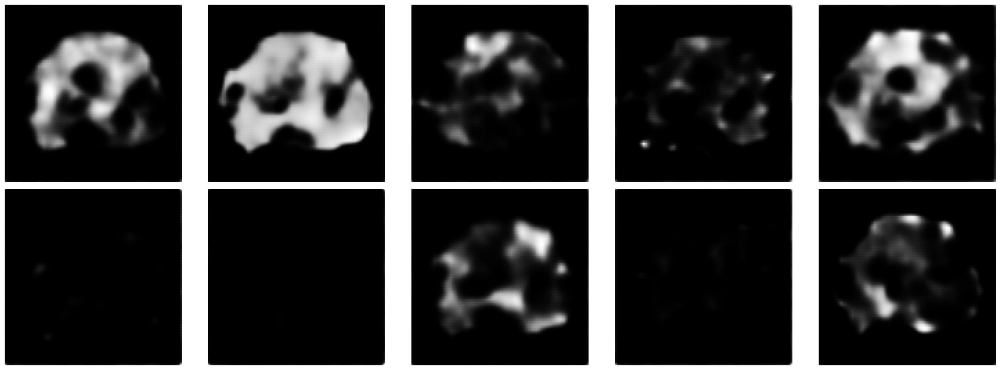

  0%|                                                                                                                        | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step


  0%|                                                                                                                | 1/3750 [00:00<07:33,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


  0%|                                                                                                                | 2/3750 [00:00<07:17,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


  0%|                                                                                                                | 3/3750 [00:00<07:18,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


  0%|                                                                                                                | 4/3750 [00:00<07:15,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 5/3750 [00:00<07:11,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


  0%|▏                                                                                                               | 6/3750 [00:00<07:13,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 7/3750 [00:00<08:00,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▏                                                                                                               | 8/3750 [00:00<07:50,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                               | 9/3750 [00:01<08:38,  7.22it/s]

1/1 [==============================] - 0s 12ms/step


  0%|▎                                                                                                              | 10/3750 [00:01<08:16,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 11/3750 [00:01<08:00,  7.79it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▎                                                                                                              | 12/3750 [00:01<07:48,  7.98it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 13/3750 [00:01<07:37,  8.17it/s]

1/1 [==============================] - 0s 9ms/step


  0%|▍                                                                                                              | 14/3750 [00:01<07:19,  8.50it/s]

1/1 [==============================] - 0s 8ms/step


  0%|▍                                                                                                              | 15/3750 [00:01<07:10,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▍                                                                                                              | 16/3750 [00:01<07:07,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  0%|▌                                                                                                              | 17/3750 [00:02<07:00,  8.87it/s]

1/1 [==============================] - 0s 15ms/step


  0%|▌                                                                                                              | 18/3750 [00:02<07:07,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 19/3750 [00:02<07:56,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 20/3750 [00:02<07:39,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▌                                                                                                              | 21/3750 [00:02<07:28,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 22/3750 [00:02<07:21,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 23/3750 [00:02<07:14,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 24/3750 [00:02<07:07,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▋                                                                                                              | 25/3750 [00:03<07:06,  8.73it/s]

1/1 [==============================] - 0s 12ms/step


  1%|▊                                                                                                              | 26/3750 [00:03<07:07,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 27/3750 [00:03<07:03,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▊                                                                                                              | 28/3750 [00:03<07:00,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


  1%|▊                                                                                                              | 29/3750 [00:03<07:06,  8.73it/s]

1/1 [==============================] - 0s 12ms/step


  1%|▉                                                                                                              | 30/3750 [00:03<07:52,  7.88it/s]

1/1 [==============================] - 0s 11ms/step


  1%|▉                                                                                                              | 31/3750 [00:03<07:39,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 32/3750 [00:03<07:25,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


  1%|▉                                                                                                              | 33/3750 [00:03<07:15,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█                                                                                                              | 34/3750 [00:04<08:49,  7.02it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 35/3750 [00:04<08:18,  7.46it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 36/3750 [00:04<07:51,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 37/3750 [00:04<07:34,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█                                                                                                              | 38/3750 [00:04<07:21,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▏                                                                                                             | 39/3750 [00:04<07:54,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 40/3750 [00:04<07:40,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▏                                                                                                             | 41/3750 [00:04<07:28,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


  1%|█▏                                                                                                             | 42/3750 [00:05<07:20,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 43/3750 [00:05<07:09,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 44/3750 [00:05<07:07,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▎                                                                                                             | 45/3750 [00:05<07:02,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▎                                                                                                             | 46/3750 [00:05<06:58,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 47/3750 [00:05<06:55,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 48/3750 [00:05<06:52,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▍                                                                                                             | 49/3750 [00:05<06:59,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▍                                                                                                             | 50/3750 [00:06<07:43,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▌                                                                                                             | 51/3750 [00:06<07:30,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▌                                                                                                             | 52/3750 [00:06<07:21,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 53/3750 [00:06<07:17,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▌                                                                                                             | 54/3750 [00:06<07:08,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  1%|█▋                                                                                                             | 55/3750 [00:06<07:00,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  1%|█▋                                                                                                             | 56/3750 [00:06<06:57,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▋                                                                                                             | 57/3750 [00:06<06:54,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 58/3750 [00:06<06:54,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▋                                                                                                             | 59/3750 [00:07<06:53,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 60/3750 [00:07<06:52,  8.94it/s]

1/1 [==============================] - 0s 13ms/step


  2%|█▊                                                                                                             | 61/3750 [00:07<08:02,  7.64it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▊                                                                                                             | 62/3750 [00:07<07:42,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▊                                                                                                             | 63/3750 [00:07<07:27,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 64/3750 [00:07<07:14,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 65/3750 [00:07<07:05,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


  2%|█▉                                                                                                             | 66/3750 [00:07<07:00,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  2%|█▉                                                                                                             | 67/3750 [00:07<06:57,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██                                                                                                             | 68/3750 [00:08<06:50,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 69/3750 [00:08<06:49,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 70/3750 [00:08<06:47,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██                                                                                                             | 71/3750 [00:08<07:20,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 72/3750 [00:08<07:11,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 73/3750 [00:08<07:06,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 74/3750 [00:08<07:00,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▏                                                                                                            | 75/3750 [00:08<06:56,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▏                                                                                                            | 76/3750 [00:09<06:56,  8.83it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▎                                                                                                            | 77/3750 [00:09<07:00,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


  2%|██▎                                                                                                            | 78/3750 [00:09<07:01,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▎                                                                                                            | 79/3750 [00:09<06:57,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▎                                                                                                            | 80/3750 [00:09<06:54,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 81/3750 [00:09<06:51,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 82/3750 [00:09<07:42,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 83/3750 [00:09<07:26,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▍                                                                                                            | 84/3750 [00:09<07:13,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▌                                                                                                            | 85/3750 [00:10<07:06,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


  2%|██▌                                                                                                            | 86/3750 [00:10<07:36,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▌                                                                                                            | 87/3750 [00:10<07:47,  7.83it/s]

1/1 [==============================] - 0s 15ms/step


  2%|██▌                                                                                                            | 88/3750 [00:10<07:57,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


  2%|██▋                                                                                                            | 89/3750 [00:10<08:06,  7.52it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 90/3750 [00:10<08:18,  7.35it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 91/3750 [00:10<08:05,  7.54it/s]

1/1 [==============================] - 0s 9ms/step


  2%|██▋                                                                                                            | 92/3750 [00:11<09:12,  6.63it/s]

1/1 [==============================] - 0s 13ms/step


  2%|██▊                                                                                                            | 93/3750 [00:11<08:41,  7.01it/s]

1/1 [==============================] - 0s 12ms/step


  3%|██▊                                                                                                            | 94/3750 [00:11<08:36,  7.08it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▊                                                                                                            | 95/3750 [00:11<08:03,  7.57it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▊                                                                                                            | 96/3750 [00:11<07:47,  7.81it/s]

1/1 [==============================] - 0s 12ms/step


  3%|██▊                                                                                                            | 97/3750 [00:11<07:39,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


  3%|██▉                                                                                                            | 98/3750 [00:11<07:25,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                            | 99/3750 [00:11<07:16,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


  3%|██▉                                                                                                           | 100/3750 [00:12<07:11,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


  3%|██▉                                                                                                           | 101/3750 [00:12<07:02,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


  3%|██▉                                                                                                           | 102/3750 [00:12<06:54,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███                                                                                                           | 103/3750 [00:12<07:40,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███                                                                                                           | 104/3750 [00:12<07:23,  8.21it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███                                                                                                           | 105/3750 [00:12<07:15,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███                                                                                                           | 106/3750 [00:12<07:28,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▏                                                                                                          | 107/3750 [00:12<07:15,  8.36it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▏                                                                                                          | 108/3750 [00:12<06:59,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 109/3750 [00:13<06:55,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▏                                                                                                          | 110/3750 [00:13<06:50,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 111/3750 [00:13<06:44,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▎                                                                                                          | 112/3750 [00:13<06:39,  9.10it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▎                                                                                                          | 113/3750 [00:13<06:39,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▎                                                                                                          | 114/3750 [00:13<07:27,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


  3%|███▎                                                                                                          | 115/3750 [00:13<07:16,  8.33it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▍                                                                                                          | 116/3750 [00:13<07:00,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▍                                                                                                          | 117/3750 [00:14<06:53,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 118/3750 [00:14<06:52,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


  3%|███▍                                                                                                          | 119/3750 [00:14<06:50,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 120/3750 [00:14<06:45,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 121/3750 [00:14<06:42,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 122/3750 [00:14<06:43,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▌                                                                                                          | 123/3750 [00:14<06:41,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 124/3750 [00:14<06:45,  8.94it/s]

1/1 [==============================] - 0s 13ms/step


  3%|███▋                                                                                                          | 125/3750 [00:14<07:21,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▋                                                                                                          | 126/3750 [00:15<07:08,  8.46it/s]

1/1 [==============================] - 0s 8ms/step


  3%|███▋                                                                                                          | 127/3750 [00:15<06:54,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 128/3750 [00:15<06:48,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 129/3750 [00:15<06:45,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 130/3750 [00:15<06:42,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  3%|███▊                                                                                                          | 131/3750 [00:15<06:43,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▊                                                                                                          | 132/3750 [00:15<06:42,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▉                                                                                                          | 133/3750 [00:15<06:40,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


  4%|███▉                                                                                                          | 134/3750 [00:15<06:43,  8.97it/s]

1/1 [==============================] - 0s 13ms/step


  4%|███▉                                                                                                          | 135/3750 [00:16<07:52,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


  4%|███▉                                                                                                          | 136/3750 [00:16<07:32,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████                                                                                                          | 137/3750 [00:16<07:16,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 138/3750 [00:16<07:04,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 139/3750 [00:16<06:57,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████                                                                                                          | 140/3750 [00:16<06:52,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 141/3750 [00:16<06:48,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 142/3750 [00:16<06:42,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 143/3750 [00:16<06:39,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▏                                                                                                         | 144/3750 [00:17<06:37,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 145/3750 [00:17<07:02,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 146/3750 [00:17<06:57,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▎                                                                                                         | 147/3750 [00:17<06:54,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 148/3750 [00:17<06:49,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▎                                                                                                         | 149/3750 [00:17<06:47,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 150/3750 [00:17<06:43,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▍                                                                                                         | 151/3750 [00:17<06:39,  9.02it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▍                                                                                                         | 152/3750 [00:18<06:31,  9.19it/s]

1/1 [==============================] - 0s 14ms/step


  4%|████▍                                                                                                         | 153/3750 [00:18<06:50,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 154/3750 [00:18<06:54,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


  4%|████▌                                                                                                         | 155/3750 [00:18<06:54,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▌                                                                                                         | 156/3750 [00:18<06:55,  8.65it/s]

1/1 [==============================] - 0s 12ms/step


  4%|████▌                                                                                                         | 157/3750 [00:18<07:29,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▋                                                                                                         | 158/3750 [00:18<08:39,  6.92it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 159/3750 [00:18<08:02,  7.44it/s]

1/1 [==============================] - 0s 8ms/step


  4%|████▋                                                                                                         | 160/3750 [00:19<07:35,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▋                                                                                                         | 161/3750 [00:19<07:15,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 162/3750 [00:19<07:08,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 163/3750 [00:19<06:58,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 164/3750 [00:19<06:55,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▊                                                                                                         | 165/3750 [00:19<07:01,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▊                                                                                                         | 166/3750 [00:19<06:56,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  4%|████▉                                                                                                         | 167/3750 [00:19<07:50,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


  4%|████▉                                                                                                         | 168/3750 [00:20<07:35,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


  5%|████▉                                                                                                         | 169/3750 [00:20<07:22,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


  5%|████▉                                                                                                         | 170/3750 [00:20<07:10,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 171/3750 [00:20<07:01,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████                                                                                                         | 172/3750 [00:20<06:56,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 173/3750 [00:20<06:54,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████                                                                                                         | 174/3750 [00:20<07:01,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


  5%|█████▏                                                                                                        | 175/3750 [00:20<07:55,  7.51it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▏                                                                                                        | 176/3750 [00:20<07:34,  7.87it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▏                                                                                                        | 177/3750 [00:21<07:28,  7.96it/s]

1/1 [==============================] - 0s 14ms/step


  5%|█████▏                                                                                                        | 178/3750 [00:21<07:49,  7.61it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▎                                                                                                        | 179/3750 [00:21<07:36,  7.82it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 180/3750 [00:21<07:23,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▎                                                                                                        | 181/3750 [00:21<07:11,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 182/3750 [00:21<07:28,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▎                                                                                                        | 183/3750 [00:21<07:22,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▍                                                                                                        | 184/3750 [00:21<07:19,  8.12it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▍                                                                                                        | 185/3750 [00:22<07:10,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 186/3750 [00:22<07:14,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▍                                                                                                        | 187/3750 [00:22<07:14,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▌                                                                                                        | 188/3750 [00:22<07:16,  8.16it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▌                                                                                                        | 189/3750 [00:22<07:59,  7.42it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▌                                                                                                        | 190/3750 [00:22<07:47,  7.61it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▌                                                                                                        | 191/3750 [00:22<07:28,  7.93it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 192/3750 [00:22<07:08,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


  5%|█████▋                                                                                                        | 193/3750 [00:23<06:52,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 194/3750 [00:23<06:45,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▋                                                                                                        | 195/3750 [00:23<06:47,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▋                                                                                                        | 196/3750 [00:23<06:47,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 197/3750 [00:23<06:45,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  5%|█████▊                                                                                                        | 198/3750 [00:23<06:41,  8.85it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▊                                                                                                        | 199/3750 [00:23<08:52,  6.67it/s]

1/1 [==============================] - 0s 12ms/step


  5%|█████▊                                                                                                        | 200/3750 [00:23<08:21,  7.08it/s]

1/1 [==============================] - 0s 10ms/step


  5%|█████▉                                                                                                        | 201/3750 [00:24<08:01,  7.37it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▉                                                                                                        | 202/3750 [00:24<07:51,  7.52it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▉                                                                                                        | 203/3750 [00:24<07:47,  7.59it/s]

1/1 [==============================] - 0s 11ms/step


  5%|█████▉                                                                                                        | 204/3750 [00:24<07:46,  7.61it/s]

1/1 [==============================] - 0s 9ms/step


  5%|██████                                                                                                        | 205/3750 [00:24<07:29,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


  5%|██████                                                                                                        | 206/3750 [00:24<07:24,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████                                                                                                        | 207/3750 [00:24<07:08,  8.27it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████                                                                                                        | 208/3750 [00:24<06:59,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 209/3750 [00:25<06:51,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 210/3750 [00:25<07:08,  8.26it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▏                                                                                                       | 211/3750 [00:25<07:02,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▏                                                                                                       | 212/3750 [00:25<06:54,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▏                                                                                                       | 213/3750 [00:25<06:50,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 214/3750 [00:25<06:43,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▎                                                                                                       | 215/3750 [00:25<06:38,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▎                                                                                                       | 216/3750 [00:25<06:39,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▎                                                                                                       | 217/3750 [00:25<06:38,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 218/3750 [00:26<06:36,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 219/3750 [00:26<06:35,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▍                                                                                                       | 220/3750 [00:26<06:40,  8.82it/s]

1/1 [==============================] - 0s 12ms/step


  6%|██████▍                                                                                                       | 221/3750 [00:26<07:19,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 222/3750 [00:26<07:12,  8.16it/s]

1/1 [==============================] - 0s 11ms/step


  6%|██████▌                                                                                                       | 223/3750 [00:26<07:05,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 224/3750 [00:26<06:56,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▌                                                                                                       | 225/3750 [00:26<06:55,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██████▋                                                                                                       | 226/3750 [00:27<07:00,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 227/3750 [00:27<06:50,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 228/3750 [00:27<06:43,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▋                                                                                                       | 229/3750 [00:27<06:40,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▋                                                                                                       | 230/3750 [00:27<06:34,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▊                                                                                                       | 231/3750 [00:27<06:34,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 232/3750 [00:27<06:39,  8.80it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██████▊                                                                                                       | 233/3750 [00:27<07:38,  7.67it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▊                                                                                                       | 234/3750 [00:28<07:18,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 235/3750 [00:28<07:05,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


  6%|██████▉                                                                                                       | 236/3750 [00:28<06:54,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 237/3750 [00:28<06:45,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


  6%|██████▉                                                                                                       | 238/3750 [00:28<06:42,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 239/3750 [00:28<06:40,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 240/3750 [00:28<06:36,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


  6%|███████                                                                                                       | 241/3750 [00:28<06:44,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████                                                                                                       | 242/3750 [00:28<06:44,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


  6%|███████▏                                                                                                      | 243/3750 [00:29<06:46,  8.62it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███████▏                                                                                                      | 244/3750 [00:29<07:35,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 245/3750 [00:29<07:22,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▏                                                                                                      | 246/3750 [00:29<07:15,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▏                                                                                                      | 247/3750 [00:29<07:14,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 248/3750 [00:29<07:09,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


  7%|███████▎                                                                                                      | 249/3750 [00:29<06:59,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


  7%|███████▎                                                                                                      | 250/3750 [00:29<08:13,  7.09it/s]

1/1 [==============================] - 0s 11ms/step


  7%|███████▎                                                                                                      | 251/3750 [00:30<07:54,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▍                                                                                                 | 426/3750 [00:52<06:26,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 11%|████████████▌                                                                                                 | 427/3750 [00:52<06:25,  8.63it/s]

1/1 [==============================] - 0s 12ms/step


 11%|████████████▌                                                                                                 | 428/3750 [00:52<06:33,  8.44it/s]

1/1 [==============================] - 0s 12ms/step


 11%|████████████▌                                                                                                 | 429/3750 [00:52<06:35,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 11%|████████████▌                                                                                                 | 430/3750 [00:53<06:40,  8.29it/s]

1/1 [==============================] - 0s 11ms/step


 11%|████████████▋                                                                                                 | 431/3750 [00:53<06:37,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 432/3750 [00:53<06:38,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▋                                                                                                 | 433/3750 [00:53<06:33,  8.44it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▋                                                                                                 | 434/3750 [00:53<06:36,  8.35it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▊                                                                                                 | 435/3750 [00:53<06:36,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▊                                                                                                 | 436/3750 [00:53<06:34,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▊                                                                                                 | 437/3750 [00:53<06:33,  8.42it/s]

1/1 [==============================] - 0s 12ms/step


 12%|████████████▊                                                                                                 | 438/3750 [00:53<06:34,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 439/3750 [00:54<06:33,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 440/3750 [00:54<06:26,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 12%|████████████▉                                                                                                 | 441/3750 [00:54<06:29,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 12%|████████████▉                                                                                                 | 442/3750 [00:54<06:27,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 12%|████████████▉                                                                                                 | 443/3750 [00:54<08:01,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█████████████                                                                                                 | 444/3750 [00:54<08:50,  6.23it/s]

1/1 [==============================] - 0s 12ms/step


 12%|█████████████                                                                                                 | 445/3750 [00:54<08:11,  6.73it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████                                                                                                 | 446/3750 [00:55<07:39,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████                                                                                                 | 447/3750 [00:55<07:20,  7.51it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 448/3750 [00:55<07:03,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▏                                                                                                | 449/3750 [00:55<06:58,  7.89it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▏                                                                                                | 450/3750 [00:55<06:52,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▏                                                                                                | 451/3750 [00:55<06:44,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 452/3750 [00:55<06:38,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 453/3750 [00:55<06:33,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▎                                                                                                | 454/3750 [00:56<06:29,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▎                                                                                                | 455/3750 [00:56<06:29,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▍                                                                                                | 456/3750 [00:56<06:29,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 457/3750 [00:56<06:32,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▍                                                                                                | 458/3750 [00:56<06:30,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▍                                                                                                | 459/3750 [00:56<07:16,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 12%|█████████████▍                                                                                                | 460/3750 [00:56<07:03,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 461/3750 [00:56<06:50,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▌                                                                                                | 462/3750 [00:57<06:38,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 463/3750 [00:57<06:25,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▌                                                                                                | 464/3750 [00:57<06:18,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 465/3750 [00:57<06:14,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 12%|█████████████▋                                                                                                | 466/3750 [00:57<06:12,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 467/3750 [00:57<06:10,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 12%|█████████████▋                                                                                                | 468/3750 [00:57<06:09,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 469/3750 [00:57<06:14,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 13%|█████████████▊                                                                                                | 470/3750 [00:57<06:34,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 471/3750 [00:58<06:25,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▊                                                                                                | 472/3750 [00:58<06:17,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▊                                                                                                | 473/3750 [00:58<06:13,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 474/3750 [00:58<08:33,  6.38it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█████████████▉                                                                                                | 475/3750 [00:58<08:13,  6.64it/s]

1/1 [==============================] - 0s 9ms/step


 13%|█████████████▉                                                                                                | 476/3750 [00:58<07:35,  7.19it/s]

1/1 [==============================] - 0s 10ms/step


 13%|█████████████▉                                                                                                | 477/3750 [00:58<07:07,  7.65it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 478/3750 [00:59<06:52,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 479/3750 [00:59<06:38,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 480/3750 [00:59<06:28,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████                                                                                                | 481/3750 [00:59<06:22,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 482/3750 [00:59<06:17,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 483/3750 [00:59<06:14,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 484/3750 [00:59<06:12,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▏                                                                                               | 485/3750 [00:59<06:11,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 486/3750 [00:59<06:11,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 487/3750 [01:00<06:12,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▎                                                                                               | 488/3750 [01:00<06:08,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▎                                                                                               | 489/3750 [01:00<06:29,  8.38it/s]

1/1 [==============================] - 0s 11ms/step


 13%|██████████████▎                                                                                               | 490/3750 [01:00<06:32,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▍                                                                                               | 491/3750 [01:00<06:23,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▍                                                                                               | 492/3750 [01:00<06:12,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▍                                                                                               | 493/3750 [01:00<06:11,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▍                                                                                               | 494/3750 [01:00<06:03,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▌                                                                                               | 495/3750 [01:00<05:57,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 496/3750 [01:01<05:55,  9.15it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▌                                                                                               | 497/3750 [01:01<06:01,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 13%|██████████████▌                                                                                               | 498/3750 [01:01<05:56,  9.12it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 499/3750 [01:01<05:57,  9.09it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▋                                                                                               | 500/3750 [01:01<05:59,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 501/3750 [01:01<05:58,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▋                                                                                               | 502/3750 [01:01<05:58,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 503/3750 [01:01<05:57,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 13%|██████████████▊                                                                                               | 504/3750 [01:01<06:37,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 505/3750 [01:02<06:31,  8.30it/s]

1/1 [==============================] - 0s 10ms/step


 13%|██████████████▊                                                                                               | 506/3750 [01:02<06:23,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▊                                                                                               | 507/3750 [01:02<06:13,  8.69it/s]

1/1 [==============================] - 0s 8ms/step


 14%|██████████████▉                                                                                               | 508/3750 [01:02<06:09,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 509/3750 [01:02<09:14,  5.85it/s]

1/1 [==============================] - 0s 9ms/step


 14%|██████████████▉                                                                                               | 510/3750 [01:02<08:12,  6.58it/s]

1/1 [==============================] - 0s 10ms/step


 14%|██████████████▉                                                                                               | 511/3750 [01:03<13:32,  3.99it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 512/3750 [01:03<11:23,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


 14%|███████████████                                                                                               | 513/3750 [01:03<10:15,  5.26it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████                                                                                               | 514/3750 [01:03<08:59,  6.00it/s]

1/1 [==============================] - 0s 51ms/step


 14%|███████████████                                                                                               | 515/3750 [01:03<09:36,  5.61it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▏                                                                                              | 516/3750 [01:04<08:44,  6.16it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▏                                                                                              | 517/3750 [01:04<07:57,  6.77it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▏                                                                                              | 518/3750 [01:04<07:23,  7.29it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▏                                                                                              | 519/3750 [01:04<06:59,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▎                                                                                              | 520/3750 [01:04<06:43,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 521/3750 [01:04<06:29,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 522/3750 [01:04<06:22,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▎                                                                                              | 523/3750 [01:04<06:16,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▎                                                                                              | 524/3750 [01:04<06:10,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 525/3750 [01:05<06:08,  8.75it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▍                                                                                              | 526/3750 [01:05<06:02,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 527/3750 [01:05<06:02,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▍                                                                                              | 528/3750 [01:05<05:59,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 529/3750 [01:05<05:57,  9.02it/s]

1/1 [==============================] - 0s 55ms/step


 14%|███████████████▌                                                                                              | 530/3750 [01:05<07:06,  7.55it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▌                                                                                              | 531/3750 [01:05<06:52,  7.80it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▌                                                                                              | 532/3750 [01:05<06:36,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 533/3750 [01:06<06:26,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 534/3750 [01:06<06:13,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▋                                                                                              | 535/3750 [01:06<06:07,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▋                                                                                              | 536/3750 [01:06<06:01,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 14%|███████████████▊                                                                                              | 537/3750 [01:06<06:13,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 14%|███████████████▊                                                                                              | 538/3750 [01:06<06:11,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 539/3750 [01:06<06:08,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▊                                                                                              | 540/3750 [01:06<06:08,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 14%|███████████████▊                                                                                              | 541/3750 [01:06<06:01,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 542/3750 [01:07<06:00,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 14%|███████████████▉                                                                                              | 543/3750 [01:07<05:59,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 544/3750 [01:07<05:58,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 15%|███████████████▉                                                                                              | 545/3750 [01:07<06:03,  8.82it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████                                                                                              | 546/3750 [01:07<06:47,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████                                                                                              | 547/3750 [01:07<06:31,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 548/3750 [01:07<06:20,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████                                                                                              | 549/3750 [01:07<06:12,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▏                                                                                             | 550/3750 [01:07<06:08,  8.68it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 551/3750 [01:08<06:08,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▏                                                                                             | 552/3750 [01:08<06:05,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▏                                                                                             | 553/3750 [01:08<06:02,  8.81it/s]

1/1 [==============================] - 0s 13ms/step


 15%|████████████████▎                                                                                             | 554/3750 [01:08<06:07,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 555/3750 [01:08<06:02,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 556/3750 [01:08<06:01,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▎                                                                                             | 557/3750 [01:08<05:59,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▎                                                                                             | 558/3750 [01:08<06:02,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▍                                                                                             | 559/3750 [01:08<06:00,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▍                                                                                             | 560/3750 [01:09<06:23,  8.32it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▍                                                                                             | 561/3750 [01:09<06:21,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▍                                                                                             | 562/3750 [01:09<07:37,  6.96it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▌                                                                                             | 563/3750 [01:09<07:22,  7.20it/s]

1/1 [==============================] - 0s 8ms/step


 15%|████████████████▌                                                                                             | 564/3750 [01:09<06:53,  7.70it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▌                                                                                             | 565/3750 [01:09<06:38,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▌                                                                                             | 566/3750 [01:09<06:27,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▋                                                                                             | 567/3750 [01:10<06:15,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▋                                                                                             | 568/3750 [01:10<06:08,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▋                                                                                             | 569/3750 [01:10<06:06,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▋                                                                                             | 570/3750 [01:10<06:01,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▋                                                                                             | 571/3750 [01:10<06:03,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 15%|████████████████▊                                                                                             | 572/3750 [01:10<06:24,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▊                                                                                             | 573/3750 [01:10<06:26,  8.22it/s]

1/1 [==============================] - 0s 14ms/step


 15%|████████████████▊                                                                                             | 574/3750 [01:10<06:31,  8.11it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▊                                                                                             | 575/3750 [01:10<06:33,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 576/3750 [01:11<07:07,  7.43it/s]

1/1 [==============================] - 0s 10ms/step


 15%|████████████████▉                                                                                             | 577/3750 [01:11<07:02,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 15%|████████████████▉                                                                                             | 578/3750 [01:11<06:53,  7.67it/s]

1/1 [==============================] - 0s 12ms/step


 15%|████████████████▉                                                                                             | 579/3750 [01:11<06:51,  7.71it/s]

1/1 [==============================] - 0s 11ms/step


 15%|█████████████████                                                                                             | 580/3750 [01:11<06:45,  7.83it/s]

1/1 [==============================] - 0s 9ms/step


 15%|█████████████████                                                                                             | 581/3750 [01:11<06:34,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████                                                                                             | 582/3750 [01:11<06:33,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████                                                                                             | 583/3750 [01:11<06:26,  8.18it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 584/3750 [01:12<06:21,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 585/3750 [01:12<06:18,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 586/3750 [01:12<06:20,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▏                                                                                            | 587/3750 [01:12<06:23,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▏                                                                                            | 588/3750 [01:12<06:23,  8.24it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▎                                                                                            | 589/3750 [01:12<06:19,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 590/3750 [01:12<06:15,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▎                                                                                            | 591/3750 [01:13<07:13,  7.29it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▎                                                                                            | 592/3750 [01:13<06:54,  7.63it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 593/3750 [01:13<06:40,  7.89it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▍                                                                                            | 594/3750 [01:13<06:31,  8.06it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▍                                                                                            | 595/3750 [01:13<06:27,  8.14it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█████████████████▍                                                                                            | 596/3750 [01:13<06:27,  8.13it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▌                                                                                            | 597/3750 [01:13<06:22,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▌                                                                                            | 598/3750 [01:13<06:14,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▌                                                                                            | 599/3750 [01:13<06:11,  8.48it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█████████████████▌                                                                                            | 600/3750 [01:14<06:13,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 601/3750 [01:14<06:10,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▋                                                                                            | 602/3750 [01:14<06:09,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▋                                                                                            | 603/3750 [01:14<06:12,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 604/3750 [01:14<06:09,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▋                                                                                            | 605/3750 [01:14<06:08,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 606/3750 [01:14<06:09,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 16%|█████████████████▊                                                                                            | 607/3750 [01:14<06:46,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 608/3750 [01:15<06:35,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 16%|█████████████████▊                                                                                            | 609/3750 [01:15<06:25,  8.15it/s]

1/1 [==============================] - 0s 8ms/step


 16%|█████████████████▉                                                                                            | 610/3750 [01:15<06:15,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 611/3750 [01:15<06:05,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 612/3750 [01:15<06:04,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 16%|█████████████████▉                                                                                            | 613/3750 [01:15<06:07,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 614/3750 [01:15<06:15,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 16%|██████████████████                                                                                            | 615/3750 [01:15<06:12,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 16%|██████████████████                                                                                            | 616/3750 [01:15<06:12,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████                                                                                            | 617/3750 [01:16<06:09,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 16%|██████████████████▏                                                                                           | 618/3750 [01:16<06:09,  8.48it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 619/3750 [01:16<06:13,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 620/3750 [01:16<06:10,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▏                                                                                           | 621/3750 [01:16<06:15,  8.33it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▏                                                                                           | 622/3750 [01:16<07:00,  7.45it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▎                                                                                           | 623/3750 [01:16<06:45,  7.72it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 624/3750 [01:16<06:30,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 625/3750 [01:17<06:21,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▎                                                                                           | 626/3750 [01:17<06:15,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 627/3750 [01:17<06:14,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▍                                                                                           | 628/3750 [01:17<06:09,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 629/3750 [01:17<06:06,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▍                                                                                           | 630/3750 [01:17<06:04,  8.57it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▌                                                                                           | 631/3750 [01:17<06:16,  8.28it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▌                                                                                           | 632/3750 [01:17<06:14,  8.33it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▌                                                                                           | 633/3750 [01:18<06:07,  8.48it/s]

1/1 [==============================] - 0s 12ms/step


 17%|██████████████████▌                                                                                           | 634/3750 [01:18<06:07,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 635/3750 [01:18<06:31,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▋                                                                                           | 636/3750 [01:18<06:25,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▋                                                                                           | 637/3750 [01:18<07:28,  6.94it/s]

1/1 [==============================] - 0s 13ms/step


 17%|██████████████████▋                                                                                           | 638/3750 [01:18<07:12,  7.19it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▋                                                                                           | 639/3750 [01:18<06:48,  7.62it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▊                                                                                           | 640/3750 [01:18<06:30,  7.95it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▊                                                                                           | 641/3750 [01:19<06:24,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▊                                                                                           | 642/3750 [01:19<06:27,  8.03it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▊                                                                                           | 643/3750 [01:19<06:19,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 17%|██████████████████▉                                                                                           | 644/3750 [01:19<06:12,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 645/3750 [01:19<06:08,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 17%|██████████████████▉                                                                                           | 646/3750 [01:19<06:04,  8.52it/s]

1/1 [==============================] - 0s 11ms/step


 17%|██████████████████▉                                                                                           | 647/3750 [01:19<06:12,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 648/3750 [01:19<06:09,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████                                                                                           | 649/3750 [01:20<06:06,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████                                                                                           | 650/3750 [01:20<06:04,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████                                                                                           | 651/3750 [01:20<06:04,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 17%|███████████████████▏                                                                                          | 652/3750 [01:20<07:16,  7.09it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 653/3750 [01:20<06:54,  7.47it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 654/3750 [01:20<06:36,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 17%|███████████████████▏                                                                                          | 655/3750 [01:20<06:25,  8.02it/s]

1/1 [==============================] - 0s 11ms/step


 17%|███████████████████▏                                                                                          | 656/3750 [01:20<06:17,  8.19it/s]

1/1 [==============================] - 0s 16ms/step


 18%|███████████████████▎                                                                                          | 657/3750 [01:21<06:14,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 658/3750 [01:21<06:10,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 659/3750 [01:21<06:04,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▎                                                                                          | 660/3750 [01:21<06:04,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 661/3750 [01:21<05:58,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 662/3750 [01:21<05:54,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 663/3750 [01:21<05:51,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▍                                                                                          | 664/3750 [01:21<05:49,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 665/3750 [01:21<05:45,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 666/3750 [01:22<05:44,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 667/3750 [01:22<06:01,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▌                                                                                          | 668/3750 [01:22<06:26,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▌                                                                                          | 669/3750 [01:22<06:12,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


 18%|███████████████████▋                                                                                          | 670/3750 [01:22<06:02,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 18%|███████████████████▋                                                                                          | 671/3750 [01:22<05:57,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 18%|███████████████████▋                                                                                          | 672/3750 [01:22<05:53,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▋                                                                                          | 673/3750 [01:22<05:47,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 674/3750 [01:22<05:44,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 675/3750 [01:23<05:42,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 676/3750 [01:23<05:42,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▊                                                                                          | 677/3750 [01:23<05:42,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 678/3750 [01:23<05:41,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 679/3750 [01:23<05:43,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 680/3750 [01:23<05:42,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 18%|███████████████████▉                                                                                          | 681/3750 [01:23<05:46,  8.86it/s]

1/1 [==============================] - 0s 13ms/step


 18%|████████████████████                                                                                          | 682/3750 [01:23<06:22,  8.03it/s]

1/1 [==============================] - 0s 13ms/step


 18%|████████████████████                                                                                          | 683/3750 [01:24<06:38,  7.69it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████                                                                                          | 684/3750 [01:24<06:26,  7.94it/s]

1/1 [==============================] - 0s 11ms/step


 18%|████████████████████                                                                                          | 685/3750 [01:24<06:13,  8.21it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████                                                                                          | 686/3750 [01:24<05:58,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 18%|████████████████████▏                                                                                         | 687/3750 [01:24<06:03,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 688/3750 [01:24<06:06,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 18%|████████████████████▏                                                                                         | 689/3750 [01:24<06:07,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▏                                                                                         | 690/3750 [01:24<05:57,  8.56it/s]

1/1 [==============================] - 0s 12ms/step


 18%|████████████████████▎                                                                                         | 691/3750 [01:25<06:35,  7.73it/s]

1/1 [==============================] - 0s 9ms/step


 18%|████████████████████▎                                                                                         | 692/3750 [01:25<06:14,  8.16it/s]

1/1 [==============================] - 0s 8ms/step


 18%|████████████████████▎                                                                                         | 693/3750 [01:25<06:33,  7.77it/s]

1/1 [==============================] - 0s 15ms/step


 19%|████████████████████▎                                                                                         | 694/3750 [01:25<06:35,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▍                                                                                         | 695/3750 [01:25<06:18,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▍                                                                                         | 696/3750 [01:25<06:18,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▍                                                                                         | 697/3750 [01:25<06:22,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▍                                                                                         | 698/3750 [01:25<06:48,  7.47it/s]

1/1 [==============================] - 0s 11ms/step


 19%|████████████████████▌                                                                                         | 699/3750 [01:26<06:39,  7.63it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 700/3750 [01:26<06:23,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 701/3750 [01:26<06:15,  8.12it/s]

1/1 [==============================] - 0s 12ms/step


 19%|████████████████████▌                                                                                         | 702/3750 [01:26<06:23,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▌                                                                                         | 703/3750 [01:26<06:23,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 704/3750 [01:26<06:25,  7.90it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▋                                                                                         | 705/3750 [01:26<06:24,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 706/3750 [01:26<06:40,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▋                                                                                         | 707/3750 [01:27<06:21,  7.97it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 708/3750 [01:27<06:08,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 19%|████████████████████▊                                                                                         | 709/3750 [01:27<06:00,  8.44it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 710/3750 [01:27<05:51,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▊                                                                                         | 711/3750 [01:27<05:44,  8.83it/s]

1/1 [==============================] - 0s 8ms/step


 19%|████████████████████▉                                                                                         | 712/3750 [01:27<05:39,  8.96it/s]

1/1 [==============================] - 0s 66ms/step


 19%|████████████████████▉                                                                                         | 713/3750 [01:27<06:35,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 19%|████████████████████▉                                                                                         | 714/3750 [01:27<06:18,  8.02it/s]

1/1 [==============================] - 0s 12ms/step


 19%|████████████████████▉                                                                                         | 715/3750 [01:28<06:13,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 716/3750 [01:28<06:05,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████                                                                                         | 717/3750 [01:28<05:55,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 718/3750 [01:28<05:50,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 19%|█████████████████████                                                                                         | 719/3750 [01:28<05:49,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████                                                                                         | 720/3750 [01:28<06:21,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 721/3750 [01:28<06:18,  8.01it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 722/3750 [01:28<06:06,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 723/3750 [01:28<05:51,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▏                                                                                        | 724/3750 [01:29<05:49,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 725/3750 [01:29<05:48,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 726/3750 [01:29<05:43,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 19%|█████████████████████▎                                                                                        | 727/3750 [01:29<05:43,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▎                                                                                        | 728/3750 [01:29<05:40,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 729/3750 [01:29<06:24,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 19%|█████████████████████▍                                                                                        | 730/3750 [01:29<06:09,  8.18it/s]

1/1 [==============================] - 0s 8ms/step


 19%|█████████████████████▍                                                                                        | 731/3750 [01:29<05:54,  8.53it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▍                                                                                        | 732/3750 [01:30<05:55,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 733/3750 [01:30<05:48,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 734/3750 [01:30<05:46,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 735/3750 [01:30<05:50,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 736/3750 [01:30<05:46,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▌                                                                                        | 737/3750 [01:30<05:41,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 738/3750 [01:30<05:39,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 739/3750 [01:30<05:38,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▋                                                                                        | 740/3750 [01:30<05:36,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 20%|█████████████████████▋                                                                                        | 741/3750 [01:31<05:35,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 742/3750 [01:31<05:34,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▊                                                                                        | 743/3750 [01:31<05:40,  8.84it/s]

1/1 [==============================] - 0s 12ms/step


 20%|█████████████████████▊                                                                                        | 744/3750 [01:31<06:32,  7.66it/s]

1/1 [==============================] - 0s 11ms/step


 20%|█████████████████████▊                                                                                        | 745/3750 [01:31<06:19,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 746/3750 [01:31<06:04,  8.24it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 747/3750 [01:31<05:55,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 20%|█████████████████████▉                                                                                        | 748/3750 [01:31<05:50,  8.57it/s]

1/1 [==============================] - 0s 8ms/step


 20%|█████████████████████▉                                                                                        | 749/3750 [01:31<05:43,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 750/3750 [01:32<05:40,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 751/3750 [01:32<05:37,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████                                                                                        | 752/3750 [01:32<05:38,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 753/3750 [01:32<05:36,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████                                                                                        | 754/3750 [01:32<05:34,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 755/3750 [01:32<05:32,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 756/3750 [01:32<05:32,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▏                                                                                       | 757/3750 [01:32<05:33,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▏                                                                                       | 758/3750 [01:32<05:33,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▎                                                                                       | 759/3750 [01:33<06:20,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 760/3750 [01:33<06:07,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▎                                                                                       | 761/3750 [01:33<05:59,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▎                                                                                       | 762/3750 [01:33<05:51,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 20%|██████████████████████▍                                                                                       | 763/3750 [01:33<05:43,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 20%|██████████████████████▍                                                                                       | 764/3750 [01:33<05:38,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 765/3750 [01:33<05:33,  8.96it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 766/3750 [01:33<05:27,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▍                                                                                       | 767/3750 [01:34<05:21,  9.27it/s]

1/1 [==============================] - 0s 8ms/step


 20%|██████████████████████▌                                                                                       | 768/3750 [01:34<05:21,  9.27it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▌                                                                                       | 769/3750 [01:34<05:24,  9.18it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▌                                                                                       | 770/3750 [01:34<05:25,  9.14it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▌                                                                                       | 771/3750 [01:34<05:28,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 772/3750 [01:34<05:27,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 21%|██████████████████████▋                                                                                       | 773/3750 [01:34<05:23,  9.22it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▋                                                                                       | 774/3750 [01:34<05:22,  9.23it/s]

1/1 [==============================] - 0s 12ms/step


 21%|██████████████████████▋                                                                                       | 775/3750 [01:34<06:01,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 776/3750 [01:35<05:47,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 777/3750 [01:35<05:45,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 778/3750 [01:35<05:40,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▊                                                                                       | 779/3750 [01:35<05:37,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 780/3750 [01:35<05:35,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 781/3750 [01:35<10:20,  4.78it/s]

1/1 [==============================] - 0s 10ms/step


 21%|██████████████████████▉                                                                                       | 782/3750 [01:36<08:54,  5.55it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 783/3750 [01:36<07:51,  6.29it/s]

1/1 [==============================] - 0s 9ms/step


 21%|██████████████████████▉                                                                                       | 784/3750 [01:36<07:07,  6.94it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 785/3750 [01:36<06:33,  7.53it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 786/3750 [01:36<06:16,  7.87it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████                                                                                       | 787/3750 [01:36<06:01,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████                                                                                       | 788/3750 [01:36<05:55,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 789/3750 [01:36<06:53,  7.16it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▏                                                                                      | 790/3750 [01:36<06:25,  7.67it/s]

1/1 [==============================] - 0s 8ms/step


 21%|███████████████████████▏                                                                                      | 791/3750 [01:37<06:03,  8.15it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▏                                                                                      | 792/3750 [01:37<05:50,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 793/3750 [01:37<05:42,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 794/3750 [01:37<05:38,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 795/3750 [01:37<05:35,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▎                                                                                      | 796/3750 [01:37<05:31,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 797/3750 [01:37<05:29,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 798/3750 [01:37<05:32,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▍                                                                                      | 799/3750 [01:37<05:29,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 800/3750 [01:38<05:28,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▍                                                                                      | 801/3750 [01:38<05:27,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 802/3750 [01:38<05:25,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 21%|███████████████████████▌                                                                                      | 803/3750 [01:38<05:32,  8.87it/s]

1/1 [==============================] - 0s 13ms/step


 21%|███████████████████████▌                                                                                      | 804/3750 [01:38<07:43,  6.36it/s]

1/1 [==============================] - 0s 12ms/step


 21%|███████████████████████▌                                                                                      | 805/3750 [01:38<07:07,  6.90it/s]

1/1 [==============================] - 0s 10ms/step


 21%|███████████████████████▋                                                                                      | 806/3750 [01:38<06:42,  7.32it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 807/3750 [01:39<06:14,  7.85it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▋                                                                                      | 808/3750 [01:39<05:55,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▋                                                                                      | 809/3750 [01:39<05:46,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▊                                                                                      | 810/3750 [01:39<05:40,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 811/3750 [01:39<05:36,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 812/3750 [01:39<05:31,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▊                                                                                      | 813/3750 [01:39<05:26,  8.99it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 814/3750 [01:39<05:20,  9.15it/s]

1/1 [==============================] - 0s 8ms/step


 22%|███████████████████████▉                                                                                      | 815/3750 [01:39<05:23,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 816/3750 [01:40<05:19,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 22%|███████████████████████▉                                                                                      | 817/3750 [01:40<05:22,  9.10it/s]

1/1 [==============================] - 0s 10ms/step


 22%|███████████████████████▉                                                                                      | 818/3750 [01:40<05:25,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████                                                                                      | 819/3750 [01:40<06:03,  8.06it/s]

1/1 [==============================] - 0s 12ms/step


 22%|████████████████████████                                                                                      | 820/3750 [01:40<05:55,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 821/3750 [01:40<05:51,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████                                                                                      | 822/3750 [01:40<05:43,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 823/3750 [01:40<05:46,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 824/3750 [01:40<05:50,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▏                                                                                     | 825/3750 [01:41<05:42,  8.55it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▏                                                                                     | 826/3750 [01:41<05:36,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 827/3750 [01:41<05:39,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 828/3750 [01:41<05:38,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▎                                                                                     | 829/3750 [01:41<05:32,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▎                                                                                     | 830/3750 [01:41<05:30,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 831/3750 [01:41<05:26,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▍                                                                                     | 832/3750 [01:41<05:25,  8.97it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 833/3750 [01:41<05:22,  9.04it/s]

1/1 [==============================] - 0s 8ms/step


 22%|████████████████████████▍                                                                                     | 834/3750 [01:42<05:39,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▍                                                                                     | 835/3750 [01:42<05:45,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▌                                                                                     | 836/3750 [01:42<05:41,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 837/3750 [01:42<05:34,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 838/3750 [01:42<05:28,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▌                                                                                     | 839/3750 [01:42<05:26,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 840/3750 [01:42<05:24,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 22%|████████████████████████▋                                                                                     | 841/3750 [01:42<05:23,  8.98it/s]

1/1 [==============================] - 0s 11ms/step


 22%|████████████████████████▋                                                                                     | 842/3750 [01:43<05:24,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 22%|████████████████████████▋                                                                                     | 843/3750 [01:43<05:27,  8.87it/s]

1/1 [==============================] - 0s 11ms/step


 23%|████████████████████████▊                                                                                     | 844/3750 [01:43<05:28,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 845/3750 [01:43<05:22,  9.01it/s]

1/1 [==============================] - 0s 8ms/step


 23%|████████████████████████▊                                                                                     | 846/3750 [01:43<05:23,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 847/3750 [01:43<05:21,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▊                                                                                     | 848/3750 [01:43<05:20,  9.05it/s]

1/1 [==============================] - 0s 10ms/step


 23%|████████████████████████▉                                                                                     | 849/3750 [01:43<05:19,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 850/3750 [01:43<05:20,  9.04it/s]

1/1 [==============================] - 0s 11ms/step


 23%|████████████████████████▉                                                                                     | 851/3750 [01:44<06:02,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 23%|████████████████████████▉                                                                                     | 852/3750 [01:44<05:51,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 853/3750 [01:44<05:41,  8.49it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 854/3750 [01:44<05:34,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 855/3750 [01:44<05:29,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████                                                                                     | 856/3750 [01:44<05:24,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 857/3750 [01:44<05:21,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 858/3750 [01:44<05:19,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 859/3750 [01:44<05:19,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▏                                                                                    | 860/3750 [01:45<05:18,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 861/3750 [01:45<05:19,  9.03it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 862/3750 [01:45<05:18,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 863/3750 [01:45<05:18,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 864/3750 [01:45<05:17,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▎                                                                                    | 865/3750 [01:45<05:40,  8.48it/s]

1/1 [==============================] - 0s 12ms/step


 23%|█████████████████████████▍                                                                                    | 866/3750 [01:45<05:40,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 867/3750 [01:45<05:32,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 868/3750 [01:45<05:27,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▍                                                                                    | 869/3750 [01:46<05:24,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 870/3750 [01:46<05:26,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▌                                                                                    | 871/3750 [01:46<06:03,  7.93it/s]

1/1 [==============================] - 0s 50ms/step


 23%|█████████████████████████▌                                                                                    | 872/3750 [01:46<07:29,  6.41it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▌                                                                                    | 873/3750 [01:46<06:51,  6.99it/s]

1/1 [==============================] - 0s 10ms/step


 23%|█████████████████████████▋                                                                                    | 874/3750 [01:46<06:22,  7.51it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 875/3750 [01:46<06:05,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 876/3750 [01:47<05:49,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▋                                                                                    | 877/3750 [01:47<05:38,  8.50it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 878/3750 [01:47<05:31,  8.66it/s]

1/1 [==============================] - 0s 9ms/step


 23%|█████████████████████████▊                                                                                    | 879/3750 [01:47<05:35,  8.55it/s]

1/1 [==============================] - 0s 13ms/step


 23%|█████████████████████████▊                                                                                    | 880/3750 [01:47<06:35,  7.25it/s]

1/1 [==============================] - 0s 12ms/step


 23%|█████████████████████████▊                                                                                    | 881/3750 [01:47<06:16,  7.61it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▊                                                                                    | 882/3750 [01:47<05:56,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 24%|█████████████████████████▉                                                                                    | 883/3750 [01:47<05:44,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 884/3750 [01:47<05:36,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 885/3750 [01:48<06:49,  6.99it/s]

1/1 [==============================] - 0s 9ms/step


 24%|█████████████████████████▉                                                                                    | 886/3750 [01:48<06:22,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██████████████████████████                                                                                    | 887/3750 [01:48<06:09,  7.74it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 888/3750 [01:48<06:00,  7.93it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████                                                                                    | 889/3750 [01:48<05:48,  8.20it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████                                                                                    | 890/3750 [01:48<05:38,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 891/3750 [01:48<05:32,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 892/3750 [01:48<05:30,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 893/3750 [01:49<05:25,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▏                                                                                   | 894/3750 [01:49<05:20,  8.90it/s]

1/1 [==============================] - 0s 12ms/step


 24%|██████████████████████████▎                                                                                   | 895/3750 [01:49<06:12,  7.67it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▎                                                                                   | 896/3750 [01:49<05:54,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▎                                                                                   | 897/3750 [01:49<05:54,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▎                                                                                   | 898/3750 [01:49<05:44,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▎                                                                                   | 899/3750 [01:49<05:35,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 900/3750 [01:49<05:31,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 901/3750 [01:50<05:27,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▍                                                                                   | 902/3750 [01:50<05:24,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▍                                                                                   | 903/3750 [01:50<05:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 904/3750 [01:50<05:21,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 905/3750 [01:50<05:19,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▌                                                                                   | 906/3750 [01:50<05:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▌                                                                                   | 907/3750 [01:50<05:18,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 908/3750 [01:50<05:44,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 24%|██████████████████████████▋                                                                                   | 909/3750 [01:50<05:38,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 910/3750 [01:51<05:31,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▋                                                                                   | 911/3750 [01:51<05:50,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 912/3750 [01:51<05:43,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 913/3750 [01:51<05:38,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 914/3750 [01:51<05:30,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▊                                                                                   | 915/3750 [01:51<05:27,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▊                                                                                   | 916/3750 [01:51<05:22,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 24%|██████████████████████████▉                                                                                   | 917/3750 [01:51<05:19,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 24%|██████████████████████████▉                                                                                   | 918/3750 [01:52<05:19,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 25%|██████████████████████████▉                                                                                   | 919/3750 [01:52<05:12,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 25%|██████████████████████████▉                                                                                   | 920/3750 [01:52<05:07,  9.21it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████                                                                                   | 921/3750 [01:52<05:02,  9.35it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████                                                                                   | 922/3750 [01:52<05:00,  9.41it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 923/3750 [01:52<05:28,  8.60it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████                                                                                   | 924/3750 [01:52<05:21,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 925/3750 [01:52<05:18,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▏                                                                                  | 926/3750 [01:52<05:40,  8.30it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▏                                                                                  | 927/3750 [01:53<05:35,  8.40it/s]

1/1 [==============================] - 0s 11ms/step


 25%|███████████████████████████▏                                                                                  | 928/3750 [01:53<05:31,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 929/3750 [01:53<05:23,  8.72it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▎                                                                                  | 930/3750 [01:53<05:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 931/3750 [01:53<05:16,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 932/3750 [01:53<05:13,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▎                                                                                  | 933/3750 [01:53<05:10,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 934/3750 [01:53<05:09,  9.09it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 935/3750 [01:53<05:10,  9.07it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▍                                                                                  | 936/3750 [01:54<05:08,  9.11it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▍                                                                                  | 937/3750 [01:54<05:05,  9.20it/s]

1/1 [==============================] - 0s 8ms/step


 25%|███████████████████████████▌                                                                                  | 938/3750 [01:54<05:03,  9.26it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▌                                                                                  | 939/3750 [01:54<05:03,  9.25it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 940/3750 [01:54<05:03,  9.26it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▌                                                                                  | 941/3750 [01:54<05:07,  9.15it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 942/3750 [01:54<05:18,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 25%|███████████████████████████▋                                                                                  | 943/3750 [01:55<09:22,  4.99it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▋                                                                                  | 944/3750 [01:55<08:12,  5.69it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 945/3750 [01:55<07:15,  6.44it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▋                                                                                  | 946/3750 [01:55<06:38,  7.04it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▊                                                                                  | 947/3750 [01:55<06:24,  7.29it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▊                                                                                  | 948/3750 [01:55<06:40,  7.00it/s]

1/1 [==============================] - 0s 12ms/step


 25%|███████████████████████████▊                                                                                  | 949/3750 [01:55<06:28,  7.21it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▊                                                                                  | 950/3750 [01:55<06:03,  7.70it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 951/3750 [01:56<05:46,  8.07it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 952/3750 [01:56<05:37,  8.30it/s]

1/1 [==============================] - 0s 9ms/step


 25%|███████████████████████████▉                                                                                  | 953/3750 [01:56<05:30,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 25%|███████████████████████████▉                                                                                  | 954/3750 [01:56<05:23,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 25%|████████████████████████████                                                                                  | 955/3750 [01:56<05:19,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 25%|████████████████████████████                                                                                  | 956/3750 [01:56<05:18,  8.76it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████████████████████                                                                                  | 957/3750 [01:56<05:59,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████                                                                                  | 958/3750 [01:56<05:47,  8.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 959/3750 [01:57<05:40,  8.20it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▏                                                                                 | 960/3750 [01:57<05:26,  8.55it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 961/3750 [01:57<05:22,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 962/3750 [01:57<05:19,  8.71it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▏                                                                                 | 963/3750 [01:57<05:16,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 964/3750 [01:57<05:14,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 965/3750 [01:57<05:12,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 966/3750 [01:57<05:10,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▎                                                                                 | 967/3750 [01:57<05:09,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▍                                                                                 | 968/3750 [01:58<05:09,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 969/3750 [01:58<05:07,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 970/3750 [01:58<05:17,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▍                                                                                 | 971/3750 [01:58<05:10,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▌                                                                                 | 972/3750 [01:58<05:09,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 26%|████████████████████████████▌                                                                                 | 973/3750 [01:58<05:52,  7.88it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 974/3750 [01:58<05:41,  8.14it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▌                                                                                 | 975/3750 [01:58<05:32,  8.35it/s]

1/1 [==============================] - 0s 8ms/step


 26%|████████████████████████████▋                                                                                 | 976/3750 [01:58<05:20,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 977/3750 [01:59<05:14,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▋                                                                                 | 978/3750 [01:59<05:08,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▋                                                                                 | 979/3750 [01:59<05:08,  8.97it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▋                                                                                 | 980/3750 [01:59<05:12,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 981/3750 [01:59<05:09,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 982/3750 [01:59<05:09,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▊                                                                                 | 983/3750 [01:59<05:08,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▊                                                                                 | 984/3750 [01:59<05:07,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 985/3750 [01:59<05:05,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 26%|████████████████████████████▉                                                                                 | 986/3750 [02:00<05:04,  9.08it/s]

1/1 [==============================] - 0s 11ms/step


 26%|████████████████████████████▉                                                                                 | 987/3750 [02:00<05:05,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 26%|████████████████████████████▉                                                                                 | 988/3750 [02:00<05:03,  9.09it/s]

1/1 [==============================] - 0s 8ms/step


 26%|█████████████████████████████                                                                                 | 989/3750 [02:00<05:49,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 26%|█████████████████████████████                                                                                 | 990/3750 [02:00<05:38,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 991/3750 [02:00<05:30,  8.36it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████                                                                                 | 992/3750 [02:00<05:24,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 26%|█████████████████████████████▏                                                                                | 993/3750 [02:00<05:19,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▏                                                                                | 994/3750 [02:01<05:12,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 995/3750 [02:01<05:08,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 996/3750 [02:01<05:06,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                                | 997/3750 [02:01<05:05,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                                | 998/3750 [02:01<05:06,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                                | 999/3750 [02:01<05:05,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1000/3750 [02:01<05:03,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1001/3750 [02:01<05:03,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████                                                                                | 1002/3750 [02:01<05:04,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1003/3750 [02:01<05:03,  9.05it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1004/3750 [02:02<05:42,  8.02it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▏                                                                               | 1005/3750 [02:02<05:29,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▏                                                                               | 1006/3750 [02:02<05:28,  8.35it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1007/3750 [02:02<05:21,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1008/3750 [02:02<05:17,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▎                                                                               | 1009/3750 [02:02<05:13,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▎                                                                               | 1010/3750 [02:02<05:11,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▍                                                                               | 1011/3750 [02:02<05:10,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1012/3750 [02:03<05:08,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1013/3750 [02:03<05:05,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▍                                                                               | 1014/3750 [02:03<05:03,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1015/3750 [02:03<05:04,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1016/3750 [02:03<05:09,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1017/3750 [02:03<05:07,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▌                                                                               | 1018/3750 [02:03<05:06,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▌                                                                               | 1019/3750 [02:03<05:05,  8.94it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▋                                                                               | 1020/3750 [02:03<05:10,  8.79it/s]

1/1 [==============================] - 0s 11ms/step


 27%|█████████████████████████████▋                                                                               | 1021/3750 [02:04<05:43,  7.95it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▋                                                                               | 1022/3750 [02:04<05:30,  8.26it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▋                                                                               | 1023/3750 [02:04<05:18,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1024/3750 [02:04<05:12,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1025/3750 [02:04<05:08,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 27%|█████████████████████████████▊                                                                               | 1026/3750 [02:04<05:14,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▊                                                                               | 1027/3750 [02:04<05:10,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1028/3750 [02:04<05:07,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1029/3750 [02:04<05:05,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 27%|█████████████████████████████▉                                                                               | 1030/3750 [02:05<05:04,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 27%|█████████████████████████████▉                                                                               | 1031/3750 [02:05<05:02,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 28%|█████████████████████████████▉                                                                               | 1032/3750 [02:05<05:00,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1033/3750 [02:05<04:59,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████                                                                               | 1034/3750 [02:05<05:00,  9.04it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████                                                                               | 1035/3750 [02:05<05:29,  8.23it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██████████████████████████████                                                                               | 1036/3750 [02:05<05:30,  8.22it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▏                                                                              | 1037/3750 [02:05<05:24,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1038/3750 [02:06<05:15,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▏                                                                              | 1039/3750 [02:06<05:08,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▏                                                                              | 1040/3750 [02:06<05:06,  8.85it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1041/3750 [02:06<05:03,  8.92it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▎                                                                              | 1042/3750 [02:06<05:03,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▎                                                                              | 1043/3750 [02:06<05:11,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▎                                                                              | 1044/3750 [02:06<05:21,  8.43it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██████████████████████████████▎                                                                              | 1045/3750 [02:06<05:22,  8.38it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▍                                                                              | 1046/3750 [02:06<05:14,  8.60it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▍                                                                              | 1047/3750 [02:07<05:10,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 28%|██████████████████████████████▍                                                                              | 1048/3750 [02:07<05:05,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▍                                                                              | 1049/3750 [02:07<05:03,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▌                                                                              | 1050/3750 [02:07<05:01,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1051/3750 [02:07<05:06,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1052/3750 [02:07<05:55,  7.59it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▌                                                                              | 1053/3750 [02:07<05:42,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██████████████████████████████▋                                                                              | 1054/3750 [02:07<05:37,  7.99it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1055/3750 [02:08<05:24,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1056/3750 [02:08<05:15,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▋                                                                              | 1057/3750 [02:08<05:09,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1058/3750 [02:08<05:05,  8.80it/s]

1/1 [==============================] - 0s 11ms/step


 28%|██████████████████████████████▊                                                                              | 1059/3750 [02:08<05:05,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▊                                                                              | 1060/3750 [02:08<05:04,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1061/3750 [02:08<05:01,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▊                                                                              | 1062/3750 [02:08<05:02,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1063/3750 [02:08<05:08,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 28%|██████████████████████████████▉                                                                              | 1064/3750 [02:09<05:04,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1065/3750 [02:09<05:04,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 28%|██████████████████████████████▉                                                                              | 1066/3750 [02:09<05:12,  8.60it/s]

1/1 [==============================] - 0s 11ms/step


 28%|███████████████████████████████                                                                              | 1067/3750 [02:09<05:47,  7.73it/s]

1/1 [==============================] - 0s 11ms/step


 28%|███████████████████████████████                                                                              | 1068/3750 [02:09<05:36,  7.97it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████                                                                              | 1069/3750 [02:09<05:23,  8.29it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████                                                                              | 1070/3750 [02:09<05:13,  8.56it/s]

1/1 [==============================] - 0s 18ms/step


 29%|███████████████████████████████▏                                                                             | 1071/3750 [02:09<05:14,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▏                                                                             | 1072/3750 [02:10<05:14,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1073/3750 [02:10<05:06,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1074/3750 [02:10<04:59,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▏                                                                             | 1075/3750 [02:10<04:57,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1076/3750 [02:10<04:58,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1077/3750 [02:10<04:57,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▎                                                                             | 1078/3750 [02:10<04:57,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▎                                                                             | 1079/3750 [02:10<04:58,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1080/3750 [02:10<05:00,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1081/3750 [02:11<05:02,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▍                                                                             | 1082/3750 [02:11<05:05,  8.72it/s]

1/1 [==============================] - 0s 12ms/step


 29%|███████████████████████████████▍                                                                             | 1083/3750 [02:11<05:54,  7.52it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1084/3750 [02:11<05:43,  7.77it/s]

1/1 [==============================] - 0s 8ms/step


 29%|███████████████████████████████▌                                                                             | 1085/3750 [02:11<05:24,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1086/3750 [02:11<05:20,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▌                                                                             | 1087/3750 [02:11<05:12,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▌                                                                             | 1088/3750 [02:11<05:08,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▋                                                                             | 1089/3750 [02:11<05:07,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▋                                                                             | 1090/3750 [02:12<05:08,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1091/3750 [02:12<05:00,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▋                                                                             | 1092/3750 [02:12<04:56,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1093/3750 [02:12<04:53,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▊                                                                             | 1094/3750 [02:12<04:54,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1095/3750 [02:12<04:56,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▊                                                                             | 1096/3750 [02:12<04:55,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 29%|███████████████████████████████▉                                                                             | 1097/3750 [02:12<04:58,  8.89it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▉                                                                             | 1098/3750 [02:13<05:41,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 29%|███████████████████████████████▉                                                                             | 1099/3750 [02:13<05:29,  8.04it/s]

1/1 [==============================] - 0s 11ms/step


 29%|███████████████████████████████▉                                                                             | 1100/3750 [02:13<05:20,  8.27it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1101/3750 [02:13<05:06,  8.63it/s]

1/1 [==============================] - 0s 8ms/step


 29%|████████████████████████████████                                                                             | 1102/3750 [02:13<05:07,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1103/3750 [02:13<05:02,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1104/3750 [02:13<04:58,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 29%|████████████████████████████████                                                                             | 1105/3750 [02:13<04:57,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 29%|████████████████████████████████▏                                                                            | 1106/3750 [02:13<04:58,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1107/3750 [02:14<04:56,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1108/3750 [02:14<04:56,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▏                                                                            | 1109/3750 [02:14<04:52,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1110/3750 [02:14<04:50,  9.10it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▎                                                                            | 1111/3750 [02:14<04:53,  9.00it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▎                                                                            | 1112/3750 [02:14<04:55,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▎                                                                            | 1113/3750 [02:14<04:58,  8.83it/s]

1/1 [==============================] - 0s 14ms/step


 30%|████████████████████████████████▍                                                                            | 1114/3750 [02:14<05:35,  7.86it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1115/3750 [02:14<05:20,  8.21it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▍                                                                            | 1116/3750 [02:15<05:08,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1117/3750 [02:15<05:02,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▍                                                                            | 1118/3750 [02:15<05:00,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▌                                                                            | 1119/3750 [02:15<04:57,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1120/3750 [02:15<04:55,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1121/3750 [02:15<04:54,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▌                                                                            | 1122/3750 [02:15<04:52,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1123/3750 [02:15<04:58,  8.80it/s]

1/1 [==============================] - 0s 13ms/step


 30%|████████████████████████████████▋                                                                            | 1124/3750 [02:16<05:52,  7.45it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▋                                                                            | 1125/3750 [02:16<06:13,  7.03it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▋                                                                            | 1126/3750 [02:16<05:52,  7.44it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1127/3750 [02:16<05:37,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1128/3750 [02:16<05:24,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▊                                                                            | 1129/3750 [02:16<05:12,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 30%|████████████████████████████████▊                                                                            | 1130/3750 [02:16<05:11,  8.42it/s]

1/1 [==============================] - 0s 8ms/step


 30%|████████████████████████████████▊                                                                            | 1131/3750 [02:16<05:03,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1132/3750 [02:17<04:59,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1133/3750 [02:17<04:55,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 30%|████████████████████████████████▉                                                                            | 1134/3750 [02:17<04:55,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 30%|████████████████████████████████▉                                                                            | 1135/3750 [02:17<04:57,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1136/3750 [02:17<05:06,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1137/3750 [02:17<05:01,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████                                                                            | 1138/3750 [02:17<04:57,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 30%|█████████████████████████████████                                                                            | 1139/3750 [02:17<04:55,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1140/3750 [02:17<05:18,  8.18it/s]

1/1 [==============================] - 0s 12ms/step


 30%|█████████████████████████████████▏                                                                           | 1141/3750 [02:18<06:07,  7.10it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1142/3750 [02:18<05:48,  7.47it/s]

1/1 [==============================] - 0s 9ms/step


 30%|█████████████████████████████████▏                                                                           | 1143/3750 [02:18<05:28,  7.94it/s]

1/1 [==============================] - 0s 8ms/step


 31%|█████████████████████████████████▎                                                                           | 1144/3750 [02:18<05:12,  8.34it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▎                                                                           | 1145/3750 [02:18<05:06,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▎                                                                           | 1146/3750 [02:18<05:00,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1147/3750 [02:18<04:57,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▎                                                                           | 1148/3750 [02:18<04:56,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1149/3750 [02:19<04:56,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▍                                                                           | 1150/3750 [02:19<04:57,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▍                                                                           | 1151/3750 [02:19<04:58,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▍                                                                           | 1152/3750 [02:19<04:52,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1153/3750 [02:19<04:51,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1154/3750 [02:19<04:51,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▌                                                                           | 1155/3750 [02:19<04:54,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▌                                                                           | 1156/3750 [02:19<05:28,  7.90it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1157/3750 [02:19<05:16,  8.19it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▋                                                                           | 1158/3750 [02:20<05:09,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1159/3750 [02:20<05:01,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1160/3750 [02:20<04:55,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▋                                                                           | 1161/3750 [02:20<04:53,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▊                                                                           | 1162/3750 [02:20<04:51,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 31%|█████████████████████████████████▊                                                                           | 1163/3750 [02:20<04:51,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1164/3750 [02:20<04:51,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▊                                                                           | 1165/3750 [02:20<04:50,  8.91it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▉                                                                           | 1166/3750 [02:20<04:51,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1167/3750 [02:21<04:48,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 31%|█████████████████████████████████▉                                                                           | 1168/3750 [02:21<04:50,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 31%|█████████████████████████████████▉                                                                           | 1169/3750 [02:21<04:47,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1170/3750 [02:21<04:48,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████                                                                           | 1171/3750 [02:21<04:47,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 31%|██████████████████████████████████                                                                           | 1172/3750 [02:21<05:14,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 31%|██████████████████████████████████                                                                           | 1173/3750 [02:21<05:13,  8.22it/s]

1/1 [==============================] - 0s 44ms/step


 51%|████████████████████████████████████████████████████████                                                     | 1930/3750 [03:50<04:20,  6.98it/s]

1/1 [==============================] - 0s 12ms/step


 51%|████████████████████████████████████████████████████████▏                                                    | 1931/3750 [03:51<04:05,  7.41it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1932/3750 [03:51<03:53,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1933/3750 [03:51<03:43,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1934/3750 [03:51<03:42,  8.16it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▏                                                    | 1935/3750 [03:51<03:39,  8.28it/s]

1/1 [==============================] - 0s 15ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1936/3750 [03:51<04:20,  6.96it/s]

1/1 [==============================] - 0s 13ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1937/3750 [03:51<04:05,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1938/3750 [03:51<03:54,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▎                                                    | 1939/3750 [03:52<03:45,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1940/3750 [03:52<03:48,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1941/3750 [03:52<03:40,  8.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1942/3750 [03:52<03:38,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▍                                                    | 1943/3750 [03:52<03:33,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1944/3750 [03:52<03:32,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1945/3750 [03:52<03:33,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1946/3750 [03:52<03:29,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1947/3750 [03:53<03:26,  8.72it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▌                                                    | 1948/3750 [03:53<03:25,  8.76it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1949/3750 [03:53<03:26,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1950/3750 [03:53<03:25,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1951/3750 [03:53<03:25,  8.77it/s]

1/1 [==============================] - 0s 18ms/step


 52%|████████████████████████████████████████████████████████▋                                                    | 1952/3750 [03:53<04:01,  7.43it/s]

1/1 [==============================] - 0s 11ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1953/3750 [03:53<03:50,  7.79it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1954/3750 [03:53<03:42,  8.06it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1955/3750 [03:54<03:36,  8.27it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▊                                                    | 1956/3750 [03:54<03:33,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1957/3750 [03:54<03:30,  8.52it/s]

1/1 [==============================] - 0s 10ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1958/3750 [03:54<03:28,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1959/3750 [03:54<03:26,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1960/3750 [03:54<03:24,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 52%|████████████████████████████████████████████████████████▉                                                    | 1961/3750 [03:54<03:22,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1962/3750 [03:54<03:22,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1963/3750 [03:54<03:22,  8.83it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1964/3750 [03:55<03:23,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████                                                    | 1965/3750 [03:55<03:19,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1966/3750 [03:55<03:15,  9.11it/s]

1/1 [==============================] - 0s 60ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1967/3750 [03:55<03:55,  7.56it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████████████████████▏                                                   | 1968/3750 [03:55<03:47,  7.83it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▏                                                   | 1969/3750 [03:55<03:37,  8.20it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1970/3750 [03:55<03:27,  8.56it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1971/3750 [03:55<03:25,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1972/3750 [03:55<03:22,  8.77it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████████████████████████████████████████████████████████▎                                                   | 1973/3750 [03:56<03:24,  8.71it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1974/3750 [03:56<03:23,  8.73it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1975/3750 [03:56<03:22,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1976/3750 [03:56<03:20,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1977/3750 [03:56<03:18,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▍                                                   | 1978/3750 [03:56<03:17,  8.96it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1979/3750 [03:56<03:17,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1980/3750 [03:56<03:17,  8.95it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1981/3750 [03:56<03:18,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▌                                                   | 1982/3750 [03:57<03:18,  8.91it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1983/3750 [03:57<03:49,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1984/3750 [03:57<03:39,  8.06it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1985/3750 [03:57<03:29,  8.44it/s]

1/1 [==============================] - 0s 8ms/step


 53%|█████████████████████████████████████████████████████████▋                                                   | 1986/3750 [03:57<03:21,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1987/3750 [03:57<03:19,  8.82it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1988/3750 [03:57<03:56,  7.45it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1989/3750 [03:58<03:47,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1990/3750 [03:58<03:36,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 53%|█████████████████████████████████████████████████████████▊                                                   | 1991/3750 [03:58<03:29,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1992/3750 [03:58<03:27,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1993/3750 [03:58<03:32,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1994/3750 [03:58<03:33,  8.23it/s]

1/1 [==============================] - 0s 11ms/step


 53%|█████████████████████████████████████████████████████████▉                                                   | 1995/3750 [03:58<03:28,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1996/3750 [03:58<03:24,  8.58it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1997/3750 [03:58<03:23,  8.62it/s]

1/1 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1998/3750 [03:59<04:02,  7.23it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████                                                   | 1999/3750 [03:59<03:50,  7.59it/s]

1/1 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2000/3750 [03:59<03:40,  7.92it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2001/3750 [03:59<03:29,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2002/3750 [03:59<03:22,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2003/3750 [03:59<03:21,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████████████████████▏                                                  | 2004/3750 [03:59<03:19,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2005/3750 [03:59<03:19,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████████████████████▎                                                  | 2006/3750 [04:00<03:19,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2007/3750 [04:00<03:18,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▎                                                  | 2008/3750 [04:00<03:18,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2009/3750 [04:00<03:16,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2010/3750 [04:00<03:16,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2011/3750 [04:00<03:15,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▍                                                  | 2012/3750 [04:00<03:14,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2013/3750 [04:00<03:15,  8.87it/s]

1/1 [==============================] - 0s 16ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2014/3750 [04:00<03:44,  7.75it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2015/3750 [04:01<03:35,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 54%|██████████████████████████████████████████████████████████▌                                                  | 2016/3750 [04:01<03:29,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2017/3750 [04:01<03:25,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2018/3750 [04:01<03:20,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2019/3750 [04:01<03:18,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2020/3750 [04:01<03:18,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▋                                                  | 2021/3750 [04:01<03:18,  8.72it/s]

1/1 [==============================] - 0s 13ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2022/3750 [04:01<03:32,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2023/3750 [04:02<03:33,  8.08it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2024/3750 [04:02<03:29,  8.24it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▊                                                  | 2025/3750 [04:02<03:24,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2026/3750 [04:02<03:26,  8.34it/s]

1/1 [==============================] - 0s 12ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2027/3750 [04:02<03:28,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2028/3750 [04:02<03:24,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 54%|██████████████████████████████████████████████████████████▉                                                  | 2029/3750 [04:02<04:11,  6.84it/s]

1/1 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2030/3750 [04:02<03:54,  7.33it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2031/3750 [04:03<03:47,  7.54it/s]

1/1 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2032/3750 [04:03<03:41,  7.74it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2033/3750 [04:03<03:33,  8.03it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████                                                  | 2034/3750 [04:03<03:27,  8.27it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2035/3750 [04:03<03:23,  8.44it/s]

1/1 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2036/3750 [04:03<03:15,  8.75it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2037/3750 [04:03<03:18,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▏                                                 | 2038/3750 [04:03<03:16,  8.73it/s]

1/1 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2039/3750 [04:03<03:14,  8.80it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2040/3750 [04:04<03:13,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2041/3750 [04:04<03:11,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████████████████████▎                                                 | 2042/3750 [04:04<03:10,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████████████████████▍                                                 | 2043/3750 [04:04<03:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2044/3750 [04:04<03:10,  8.94it/s]

1/1 [==============================] - 0s 35ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2045/3750 [04:04<03:33,  8.00it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2046/3750 [04:04<03:27,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▍                                                 | 2047/3750 [04:04<03:22,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2048/3750 [04:05<03:17,  8.61it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2049/3750 [04:05<03:14,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2050/3750 [04:05<03:12,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▌                                                 | 2051/3750 [04:05<03:10,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2052/3750 [04:05<03:08,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2053/3750 [04:05<03:07,  9.04it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2054/3750 [04:05<03:43,  7.60it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▋                                                 | 2055/3750 [04:05<03:38,  7.76it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2056/3750 [04:05<03:27,  8.15it/s]

1/1 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2057/3750 [04:06<03:29,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2058/3750 [04:06<03:28,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▊                                                 | 2059/3750 [04:06<03:20,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2060/3750 [04:06<03:15,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2061/3750 [04:06<03:39,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2062/3750 [04:06<03:32,  7.94it/s]

1/1 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2063/3750 [04:06<03:28,  8.11it/s]

1/1 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████████████████████▉                                                 | 2064/3750 [04:06<03:22,  8.31it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2065/3750 [04:07<03:17,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2066/3750 [04:07<03:13,  8.70it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2067/3750 [04:07<03:09,  8.90it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████                                                 | 2068/3750 [04:07<03:28,  8.07it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2069/3750 [04:07<03:22,  8.31it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2070/3750 [04:07<03:17,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2071/3750 [04:07<03:14,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████████████████████▏                                                | 2072/3750 [04:07<03:14,  8.64it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2073/3750 [04:07<03:09,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2074/3750 [04:08<03:04,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2075/3750 [04:08<03:04,  9.06it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2076/3750 [04:08<03:04,  9.08it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▎                                                | 2077/3750 [04:08<03:35,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2078/3750 [04:08<03:26,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2079/3750 [04:08<03:19,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2080/3750 [04:08<03:14,  8.59it/s]

1/1 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████████████████████▍                                                | 2081/3750 [04:08<03:11,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2082/3750 [04:09<03:10,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2083/3750 [04:09<03:08,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2084/3750 [04:09<03:07,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▌                                                | 2085/3750 [04:09<03:05,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2086/3750 [04:09<03:05,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2087/3750 [04:09<03:04,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2088/3750 [04:09<03:05,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2089/3750 [04:09<03:15,  8.50it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▋                                                | 2090/3750 [04:09<03:24,  8.13it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2091/3750 [04:10<03:18,  8.36it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2092/3750 [04:10<03:19,  8.30it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2093/3750 [04:10<03:38,  7.58it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▊                                                | 2094/3750 [04:10<03:32,  7.78it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2095/3750 [04:10<03:26,  8.00it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2096/3750 [04:10<03:22,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2097/3750 [04:10<03:18,  8.33it/s]

1/1 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████████████████████▉                                                | 2098/3750 [04:10<03:14,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2099/3750 [04:11<03:15,  8.42it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2100/3750 [04:11<03:16,  8.39it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2101/3750 [04:11<03:16,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████                                                | 2102/3750 [04:11<03:12,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2103/3750 [04:11<03:07,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2104/3750 [04:11<03:07,  8.78it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2105/3750 [04:11<03:27,  7.94it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2106/3750 [04:11<03:17,  8.32it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▏                                               | 2107/3750 [04:12<03:15,  8.39it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2108/3750 [04:12<03:20,  8.17it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2109/3750 [04:12<03:40,  7.44it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2110/3750 [04:12<03:31,  7.75it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▎                                               | 2111/3750 [04:12<03:22,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2112/3750 [04:12<03:18,  8.25it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2113/3750 [04:12<03:13,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2114/3750 [04:12<03:13,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▍                                               | 2115/3750 [04:12<03:11,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2116/3750 [04:13<03:10,  8.57it/s]

1/1 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2117/3750 [04:13<03:18,  8.24it/s]

1/1 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████████████████████▌                                               | 2118/3750 [04:13<03:23,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2119/3750 [04:13<03:19,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▌                                               | 2120/3750 [04:13<03:13,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2121/3750 [04:13<03:09,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2122/3750 [04:13<03:07,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2123/3750 [04:13<03:05,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▋                                               | 2124/3750 [04:14<03:03,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2125/3750 [04:14<03:20,  8.09it/s]

1/1 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2126/3750 [04:14<03:16,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2127/3750 [04:14<03:10,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████████████████████▊                                               | 2128/3750 [04:14<03:04,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2129/3750 [04:14<03:01,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2130/3750 [04:14<03:12,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2131/3750 [04:14<03:07,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2132/3750 [04:14<03:06,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████████████████████▉                                               | 2133/3750 [04:15<03:05,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2134/3750 [04:15<03:03,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2135/3750 [04:15<03:01,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2136/3750 [04:15<03:00,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████                                               | 2137/3750 [04:15<03:00,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2138/3750 [04:15<03:01,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2139/3750 [04:15<03:01,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2140/3750 [04:15<03:03,  8.79it/s]

1/1 [==============================] - 0s 19ms/step


 57%|██████████████████████████████████████████████████████████████▏                                              | 2141/3750 [04:16<03:29,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2142/3750 [04:16<03:23,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2143/3750 [04:16<03:15,  8.21it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2144/3750 [04:16<03:08,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 57%|██████████████████████████████████████████████████████████████▎                                              | 2145/3750 [04:16<03:02,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2146/3750 [04:16<03:01,  8.85it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2147/3750 [04:16<03:00,  8.88it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2148/3750 [04:16<03:07,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2149/3750 [04:16<03:09,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▍                                              | 2150/3750 [04:17<03:11,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2151/3750 [04:17<03:10,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2152/3750 [04:17<03:06,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2153/3750 [04:17<03:03,  8.72it/s]

1/1 [==============================] - 0s 10ms/step


 57%|██████████████████████████████████████████████████████████████▌                                              | 2154/3750 [04:17<03:02,  8.75it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2155/3750 [04:17<03:05,  8.59it/s]

1/1 [==============================] - 0s 11ms/step


 57%|██████████████████████████████████████████████████████████████▋                                              | 2156/3750 [04:17<03:12,  8.28it/s]

1/1 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2157/3750 [04:17<03:43,  7.12it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▋                                              | 2158/3750 [04:18<03:30,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2159/3750 [04:18<03:19,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2160/3750 [04:18<03:12,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2161/3750 [04:18<03:07,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2162/3750 [04:18<03:04,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▊                                              | 2163/3750 [04:18<03:02,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2164/3750 [04:18<03:02,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2165/3750 [04:18<03:06,  8.48it/s]

1/1 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2166/3750 [04:19<03:06,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████████████████████▉                                              | 2167/3750 [04:19<03:04,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2168/3750 [04:19<03:02,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2169/3750 [04:19<02:59,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2170/3750 [04:19<02:58,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████                                              | 2171/3750 [04:19<02:58,  8.84it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2172/3750 [04:19<02:58,  8.82it/s]

1/1 [==============================] - 0s 17ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2173/3750 [04:19<03:36,  7.30it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2174/3750 [04:19<03:28,  7.55it/s]

1/1 [==============================] - 0s 55ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2175/3750 [04:20<04:18,  6.10it/s]

1/1 [==============================] - 0s 12ms/step


 58%|███████████████████████████████████████████████████████████████▏                                             | 2176/3750 [04:20<03:55,  6.70it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2177/3750 [04:20<03:38,  7.21it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2178/3750 [04:20<03:25,  7.64it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2179/3750 [04:20<03:16,  8.01it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▎                                             | 2180/3750 [04:20<03:09,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2181/3750 [04:20<03:06,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2182/3750 [04:21<03:04,  8.52it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2183/3750 [04:21<02:59,  8.75it/s]

1/1 [==============================] - 0s 17ms/step


 58%|███████████████████████████████████████████████████████████████▍                                             | 2184/3750 [04:21<03:15,  8.02it/s]

1/1 [==============================] - 0s 8ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2185/3750 [04:21<03:06,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2186/3750 [04:21<03:02,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2187/3750 [04:21<03:00,  8.66it/s]

1/1 [==============================] - 0s 16ms/step


 58%|███████████████████████████████████████████████████████████████▌                                             | 2188/3750 [04:21<03:27,  7.54it/s]

1/1 [==============================] - 0s 9ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2189/3750 [04:21<03:18,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2190/3750 [04:22<03:12,  8.09it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2191/3750 [04:22<03:06,  8.34it/s]

1/1 [==============================] - 0s 12ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2192/3750 [04:22<03:06,  8.37it/s]

1/1 [==============================] - 0s 10ms/step


 58%|███████████████████████████████████████████████████████████████▋                                             | 2193/3750 [04:22<03:03,  8.47it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2194/3750 [04:22<03:00,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2195/3750 [04:22<03:00,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2196/3750 [04:22<02:59,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▊                                             | 2197/3750 [04:22<02:59,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2198/3750 [04:22<03:01,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2199/3750 [04:23<03:02,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2200/3750 [04:23<02:56,  8.76it/s]

1/1 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████████████████████▉                                             | 2201/3750 [04:23<02:54,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2202/3750 [04:23<03:26,  7.50it/s]

1/1 [==============================] - 0s 13ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2203/3750 [04:23<03:20,  7.73it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2204/3750 [04:23<03:42,  6.95it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2205/3750 [04:23<03:31,  7.30it/s]

1/1 [==============================] - 0s 11ms/step


 59%|████████████████████████████████████████████████████████████████                                             | 2206/3750 [04:23<03:22,  7.64it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2207/3750 [04:24<03:17,  7.80it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2208/3750 [04:24<03:10,  8.11it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2209/3750 [04:24<03:04,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▏                                            | 2210/3750 [04:24<03:02,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2211/3750 [04:24<02:58,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2212/3750 [04:24<02:54,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2213/3750 [04:24<02:50,  9.03it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▎                                            | 2214/3750 [04:24<02:47,  9.16it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2215/3750 [04:24<02:45,  9.30it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2216/3750 [04:25<02:46,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2217/3750 [04:25<02:47,  9.17it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2218/3750 [04:25<02:49,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▍                                            | 2219/3750 [04:25<02:50,  8.98it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2220/3750 [04:25<02:54,  8.74it/s]

1/1 [==============================] - 0s 13ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2221/3750 [04:25<03:06,  8.20it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2222/3750 [04:25<03:03,  8.32it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▌                                            | 2223/3750 [04:25<02:59,  8.49it/s]

1/1 [==============================] - 0s 8ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2224/3750 [04:26<02:54,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2225/3750 [04:26<02:52,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2226/3750 [04:26<02:52,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▋                                            | 2227/3750 [04:26<02:51,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2228/3750 [04:26<02:50,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2229/3750 [04:26<02:50,  8.94it/s]

1/1 [==============================] - 0s 9ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2230/3750 [04:26<02:52,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 59%|████████████████████████████████████████████████████████████████▊                                            | 2231/3750 [04:26<02:51,  8.86it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2232/3750 [04:26<02:50,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2233/3750 [04:27<02:47,  9.05it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2234/3750 [04:27<02:44,  9.22it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2235/3750 [04:27<02:42,  9.34it/s]

1/1 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████████████████████▉                                            | 2236/3750 [04:27<02:40,  9.42it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2237/3750 [04:27<03:08,  8.03it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2238/3750 [04:27<03:03,  8.23it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2239/3750 [04:27<02:59,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████                                            | 2240/3750 [04:27<02:54,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2241/3750 [04:27<02:49,  8.88it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2242/3750 [04:28<02:46,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2243/3750 [04:28<02:48,  8.93it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                           | 2244/3750 [04:28<02:47,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2245/3750 [04:28<02:45,  9.11it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2246/3750 [04:28<02:47,  9.00it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2247/3750 [04:28<02:48,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2248/3750 [04:28<02:48,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                           | 2249/3750 [04:28<02:48,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2250/3750 [04:28<02:48,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2251/3750 [04:29<02:47,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2252/3750 [04:29<02:48,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▍                                           | 2253/3750 [04:29<02:58,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2254/3750 [04:29<03:11,  7.83it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2255/3750 [04:29<03:05,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2256/3750 [04:29<03:00,  8.29it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▌                                           | 2257/3750 [04:29<02:55,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2258/3750 [04:29<02:50,  8.73it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2259/3750 [04:30<02:50,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2260/3750 [04:30<02:56,  8.43it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2261/3750 [04:30<02:55,  8.47it/s]

1/1 [==============================] - 0s 8ms/step


 60%|█████████████████████████████████████████████████████████████████▋                                           | 2262/3750 [04:30<02:50,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2263/3750 [04:30<02:47,  8.86it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2264/3750 [04:30<02:48,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2265/3750 [04:30<02:49,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 60%|█████████████████████████████████████████████████████████████████▊                                           | 2266/3750 [04:30<02:51,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2267/3750 [04:30<02:54,  8.48it/s]

1/1 [==============================] - 0s 9ms/step


 60%|█████████████████████████████████████████████████████████████████▉                                           | 2268/3750 [04:31<02:51,  8.62it/s]

1/1 [==============================] - 0s 47ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2269/3750 [04:31<03:24,  7.25it/s]

1/1 [==============================] - 0s 11ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                           | 2270/3750 [04:31<03:14,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2271/3750 [04:31<03:06,  7.95it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2272/3750 [04:31<03:00,  8.21it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2273/3750 [04:31<02:55,  8.42it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████                                           | 2274/3750 [04:31<02:53,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2275/3750 [04:31<02:51,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2276/3750 [04:32<02:50,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2277/3750 [04:32<02:45,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2278/3750 [04:32<02:44,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                          | 2279/3750 [04:32<02:45,  8.87it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2280/3750 [04:32<02:48,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2281/3750 [04:32<02:47,  8.77it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2282/3750 [04:32<02:46,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                          | 2283/3750 [04:32<02:48,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2284/3750 [04:32<02:48,  8.70it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2285/3750 [04:33<03:06,  7.85it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2286/3750 [04:33<03:03,  7.98it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                          | 2287/3750 [04:33<03:03,  7.99it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2288/3750 [04:33<03:01,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2289/3750 [04:33<02:59,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2290/3750 [04:33<02:56,  8.26it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2291/3750 [04:33<02:54,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▌                                          | 2292/3750 [04:33<02:52,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2293/3750 [04:34<02:50,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2294/3750 [04:34<02:48,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2295/3750 [04:34<02:48,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▋                                          | 2296/3750 [04:34<02:46,  8.71it/s]

1/1 [==============================] - 0s 8ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2297/3750 [04:34<02:44,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2298/3750 [04:34<02:43,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2299/3750 [04:34<02:46,  8.70it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▊                                          | 2300/3750 [04:34<02:56,  8.22it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2301/3750 [04:35<03:13,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2302/3750 [04:35<03:05,  7.80it/s]

1/1 [==============================] - 0s 11ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2303/3750 [04:35<03:01,  7.96it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2304/3750 [04:35<02:56,  8.19it/s]

1/1 [==============================] - 0s 9ms/step


 61%|██████████████████████████████████████████████████████████████████▉                                          | 2305/3750 [04:35<02:49,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 61%|███████████████████████████████████████████████████████████████████                                          | 2306/3750 [04:35<02:45,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2307/3750 [04:35<02:44,  8.79it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2308/3750 [04:35<02:40,  9.00it/s]

1/1 [==============================] - 0s 8ms/step


 62%|███████████████████████████████████████████████████████████████████                                          | 2309/3750 [04:35<02:41,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2310/3750 [04:36<02:43,  8.78it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2311/3750 [04:36<02:44,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2312/3750 [04:36<02:43,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                         | 2313/3750 [04:36<02:42,  8.85it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2314/3750 [04:36<02:42,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2315/3750 [04:36<02:42,  8.83it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2316/3750 [04:36<02:42,  8.81it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                         | 2317/3750 [04:36<02:45,  8.68it/s]

1/1 [==============================] - 0s 14ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2318/3750 [04:37<03:10,  7.50it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2319/3750 [04:37<03:09,  7.55it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2320/3750 [04:37<03:05,  7.69it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2321/3750 [04:37<02:57,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                         | 2322/3750 [04:37<02:52,  8.27it/s]

1/1 [==============================] - 0s 13ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2323/3750 [04:37<02:50,  8.36it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2324/3750 [04:37<02:46,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2325/3750 [04:37<02:43,  8.73it/s]

1/1 [==============================] - 0s 13ms/step


 62%|███████████████████████████████████████████████████████████████████▌                                         | 2326/3750 [04:37<02:51,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2327/3750 [04:38<02:47,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2328/3750 [04:38<02:46,  8.53it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2329/3750 [04:38<02:43,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▋                                         | 2330/3750 [04:38<02:44,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2331/3750 [04:38<02:42,  8.73it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2332/3750 [04:38<02:41,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2333/3750 [04:38<03:05,  7.66it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2334/3750 [04:38<03:04,  7.67it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▊                                         | 2335/3750 [04:39<02:58,  7.92it/s]

1/1 [==============================] - 0s 9ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2336/3750 [04:39<02:53,  8.15it/s]

1/1 [==============================] - 0s 14ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2337/3750 [04:39<02:54,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2338/3750 [04:39<02:51,  8.25it/s]

1/1 [==============================] - 0s 11ms/step


 62%|███████████████████████████████████████████████████████████████████▉                                         | 2339/3750 [04:39<02:50,  8.29it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2340/3750 [04:39<02:55,  8.05it/s]

1/1 [==============================] - 0s 11ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2341/3750 [04:39<02:52,  8.15it/s]

1/1 [==============================] - 0s 10ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2342/3750 [04:39<02:50,  8.28it/s]

1/1 [==============================] - 0s 9ms/step


 62%|████████████████████████████████████████████████████████████████████                                         | 2343/3750 [04:40<02:47,  8.40it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2344/3750 [04:40<02:44,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2345/3750 [04:40<02:43,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2346/3750 [04:40<02:43,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2347/3750 [04:40<02:43,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                        | 2348/3750 [04:40<02:42,  8.61it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2349/3750 [04:40<02:57,  7.91it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2350/3750 [04:40<02:53,  8.06it/s]

1/1 [==============================] - 0s 12ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2351/3750 [04:41<03:08,  7.43it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                        | 2352/3750 [04:41<03:01,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2353/3750 [04:41<03:05,  7.54it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2354/3750 [04:41<02:56,  7.89it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2355/3750 [04:41<02:50,  8.18it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                        | 2356/3750 [04:41<02:47,  8.33it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2357/3750 [04:41<02:43,  8.51it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2358/3750 [04:41<02:42,  8.55it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2359/3750 [04:41<02:38,  8.78it/s]

1/1 [==============================] - 0s 8ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                        | 2360/3750 [04:42<02:35,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2361/3750 [04:42<02:33,  9.02it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2362/3750 [04:42<02:34,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2363/3750 [04:42<02:33,  9.03it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2364/3750 [04:42<02:34,  8.99it/s]

1/1 [==============================] - 0s 11ms/step


 63%|████████████████████████████████████████████████████████████████████▋                                        | 2365/3750 [04:42<02:36,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2366/3750 [04:42<03:07,  7.37it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2367/3750 [04:42<02:58,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2368/3750 [04:43<02:50,  8.12it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▊                                        | 2369/3750 [04:43<02:43,  8.43it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2370/3750 [04:43<02:42,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2371/3750 [04:43<02:41,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2372/3750 [04:43<02:40,  8.59it/s]

1/1 [==============================] - 0s 14ms/step


 63%|████████████████████████████████████████████████████████████████████▉                                        | 2373/3750 [04:43<02:40,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2374/3750 [04:43<02:39,  8.64it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2375/3750 [04:43<02:38,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2376/3750 [04:43<02:36,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2377/3750 [04:44<02:38,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 63%|█████████████████████████████████████████████████████████████████████                                        | 2378/3750 [04:44<02:35,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2379/3750 [04:44<02:34,  8.86it/s]

1/1 [==============================] - 0s 9ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2380/3750 [04:44<02:33,  8.90it/s]

1/1 [==============================] - 0s 10ms/step


 63%|█████████████████████████████████████████████████████████████████████▏                                       | 2381/3750 [04:44<02:33,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                       | 2382/3750 [04:44<02:54,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2383/3750 [04:44<02:48,  8.10it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2384/3750 [04:44<02:46,  8.22it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2385/3750 [04:45<02:40,  8.51it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                       | 2386/3750 [04:45<02:35,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2387/3750 [04:45<02:31,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2388/3750 [04:45<02:31,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2389/3750 [04:45<02:30,  9.01it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2390/3750 [04:45<02:33,  8.86it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                       | 2391/3750 [04:45<02:36,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2392/3750 [04:45<02:34,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2393/3750 [04:45<02:37,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2394/3750 [04:46<02:42,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                       | 2395/3750 [04:46<02:41,  8.41it/s]

1/1 [==============================] - 0s 11ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2396/3750 [04:46<02:40,  8.41it/s]

1/1 [==============================] - 0s 12ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2397/3750 [04:46<02:45,  8.18it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2398/3750 [04:46<02:41,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                       | 2399/3750 [04:46<03:08,  7.18it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2400/3750 [04:46<02:57,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2401/3750 [04:46<02:48,  8.02it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2402/3750 [04:47<02:43,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▊                                       | 2403/3750 [04:47<02:40,  8.38it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2404/3750 [04:47<02:37,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2405/3750 [04:47<02:34,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2406/3750 [04:47<02:32,  8.82it/s]

1/1 [==============================] - 0s 8ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2407/3750 [04:47<02:31,  8.89it/s]

1/1 [==============================] - 0s 10ms/step


 64%|█████████████████████████████████████████████████████████████████████▉                                       | 2408/3750 [04:47<02:32,  8.81it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2409/3750 [04:47<02:32,  8.77it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2410/3750 [04:47<02:32,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2411/3750 [04:48<02:32,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████                                       | 2412/3750 [04:48<02:33,  8.74it/s]

1/1 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2413/3750 [04:48<02:34,  8.65it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2414/3750 [04:48<02:55,  7.62it/s]

1/1 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2415/3750 [04:48<02:47,  7.96it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▏                                      | 2416/3750 [04:48<02:40,  8.30it/s]

1/1 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2417/3750 [04:48<02:37,  8.46it/s]

1/1 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████████████████████████▎                                      | 2418/3750 [04:48<02:35,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2419/3750 [04:49<02:34,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2420/3750 [04:49<02:32,  8.75it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                      | 2421/3750 [04:49<02:33,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2422/3750 [04:49<02:39,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2423/3750 [04:49<02:35,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2424/3750 [04:49<02:35,  8.55it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                      | 2425/3750 [04:49<02:33,  8.63it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2426/3750 [04:49<02:36,  8.45it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2427/3750 [04:49<02:34,  8.56it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2428/3750 [04:50<02:33,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                      | 2429/3750 [04:50<02:35,  8.49it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2430/3750 [04:50<03:00,  7.32it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2431/3750 [04:50<02:53,  7.59it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2432/3750 [04:50<02:47,  7.85it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2433/3750 [04:50<02:42,  8.11it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                      | 2434/3750 [04:50<03:26,  6.38it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2435/3750 [04:51<03:10,  6.90it/s]

1/1 [==============================] - 0s 11ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2436/3750 [04:51<02:59,  7.32it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2437/3750 [04:51<02:50,  7.68it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▊                                      | 2438/3750 [04:51<02:44,  7.96it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2439/3750 [04:51<02:42,  8.05it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2440/3750 [04:51<02:38,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2441/3750 [04:51<02:49,  7.72it/s]

1/1 [==============================] - 0s 9ms/step


 65%|██████████████████████████████████████████████████████████████████████▉                                      | 2442/3750 [04:51<02:43,  7.98it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2443/3750 [04:52<02:36,  8.33it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2444/3750 [04:52<02:32,  8.58it/s]

1/1 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2445/3750 [04:52<02:30,  8.68it/s]

1/1 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████████████████████████                                      | 2446/3750 [04:52<02:37,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2447/3750 [04:52<02:56,  7.38it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2448/3750 [04:52<02:49,  7.70it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2449/3750 [04:52<02:44,  7.91it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2450/3750 [04:52<02:37,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▏                                     | 2451/3750 [04:53<02:34,  8.39it/s]

1/1 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2452/3750 [04:53<02:35,  8.35it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2453/3750 [04:53<02:33,  8.43it/s]

1/1 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2454/3750 [04:53<02:32,  8.52it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▎                                     | 2455/3750 [04:53<02:29,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████████████████████████▍                                     | 2456/3750 [04:53<02:27,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2457/3750 [04:53<02:26,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2458/3750 [04:53<02:27,  8.76it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                     | 2459/3750 [04:53<02:26,  8.80it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2460/3750 [04:54<02:25,  8.84it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2461/3750 [04:54<02:25,  8.83it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2462/3750 [04:54<02:25,  8.87it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2463/3750 [04:54<02:43,  7.86it/s]

1/1 [==============================] - 0s 11ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                     | 2464/3750 [04:54<02:38,  8.10it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2465/3750 [04:54<02:35,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2466/3750 [04:54<02:33,  8.34it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2467/3750 [04:54<02:32,  8.42it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                     | 2468/3750 [04:55<02:30,  8.54it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2469/3750 [04:55<02:28,  8.65it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2470/3750 [04:55<02:25,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2471/3750 [04:55<02:23,  8.92it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                     | 2472/3750 [04:55<02:20,  9.10it/s]

1/1 [==============================] - 0s 8ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2473/3750 [04:55<02:21,  9.00it/s]

1/1 [==============================] - 0s 12ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2474/3750 [04:55<02:58,  7.15it/s]

1/1 [==============================] - 0s 10ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2475/3750 [04:55<02:52,  7.41it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2476/3750 [04:56<02:59,  7.09it/s]

1/1 [==============================] - 0s 9ms/step


 66%|███████████████████████████████████████████████████████████████████████▉                                     | 2477/3750 [04:56<02:48,  7.58it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2478/3750 [04:56<02:42,  7.81it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2479/3750 [04:56<02:56,  7.20it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2480/3750 [04:56<02:47,  7.60it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████                                     | 2481/3750 [04:56<02:41,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2482/3750 [04:56<02:36,  8.12it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2483/3750 [04:56<02:31,  8.34it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2484/3750 [04:57<02:26,  8.62it/s]

1/1 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████████████████████████▏                                    | 2485/3750 [04:57<02:29,  8.44it/s]

1/1 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2486/3750 [04:57<02:36,  8.06it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2487/3750 [04:57<02:34,  8.19it/s]

1/1 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2488/3750 [04:57<02:30,  8.38it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▎                                    | 2489/3750 [04:57<02:28,  8.49it/s]

1/1 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2490/3750 [04:57<02:28,  8.50it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2491/3750 [04:57<02:26,  8.59it/s]

1/1 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2492/3750 [04:57<02:30,  8.34it/s]

1/1 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████████████████████████▍                                    | 2493/3750 [04:58<02:34,  8.16it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                    | 2494/3750 [04:58<02:29,  8.41it/s]

1/1 [==============================] - 0s 12ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2495/3750 [04:58<02:32,  8.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2496/3750 [04:58<02:53,  7.22it/s]

1/1 [==============================] - 0s 12ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2497/3750 [04:58<02:45,  7.56it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                    | 2498/3750 [04:58<02:38,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2499/3750 [04:58<02:34,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2500/3750 [04:58<02:29,  8.37it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2501/3750 [04:59<02:23,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                    | 2502/3750 [04:59<02:24,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2503/3750 [04:59<02:24,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2504/3750 [04:59<02:22,  8.74it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2505/3750 [04:59<02:21,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2506/3750 [04:59<02:19,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                    | 2507/3750 [04:59<02:17,  9.07it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2508/3750 [04:59<02:14,  9.21it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2509/3750 [04:59<02:13,  9.30it/s]

1/1 [==============================] - 0s 8ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2510/3750 [05:00<02:12,  9.36it/s]

1/1 [==============================] - 0s 9ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                    | 2511/3750 [05:00<02:14,  9.24it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2512/3750 [05:00<02:44,  7.54it/s]

1/1 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2513/3750 [05:00<02:39,  7.76it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2514/3750 [05:00<02:33,  8.04it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████                                    | 2515/3750 [05:00<02:29,  8.28it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2516/3750 [05:00<02:25,  8.46it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2517/3750 [05:00<02:23,  8.57it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2518/3750 [05:01<02:22,  8.62it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2519/3750 [05:01<02:25,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▏                                   | 2520/3750 [05:01<02:23,  8.54it/s]

1/1 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2521/3750 [05:01<02:21,  8.67it/s]

1/1 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2522/3750 [05:01<02:24,  8.53it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2523/3750 [05:01<02:22,  8.62it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▎                                   | 2524/3750 [05:01<02:20,  8.71it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2525/3750 [05:01<02:19,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2526/3750 [05:01<02:19,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2527/3750 [05:02<02:21,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████████████████████████▍                                   | 2528/3750 [05:02<02:28,  8.22it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2529/3750 [05:02<02:34,  7.92it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2530/3750 [05:02<02:27,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████████████████████████▌                                   | 2531/3750 [05:02<02:24,  8.44it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                   | 2532/3750 [05:02<02:21,  8.60it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2533/3750 [05:02<02:23,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2534/3750 [05:02<02:25,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2535/3750 [05:03<02:22,  8.51it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2536/3750 [05:03<02:19,  8.67it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                   | 2537/3750 [05:03<02:21,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2538/3750 [05:03<02:24,  8.39it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2539/3750 [05:03<02:21,  8.58it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2540/3750 [05:03<02:19,  8.65it/s]

1/1 [==============================] - 0s 9ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                   | 2541/3750 [05:03<02:18,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2542/3750 [05:03<02:21,  8.54it/s]

1/1 [==============================] - 0s 11ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2543/3750 [05:03<02:21,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2544/3750 [05:04<02:43,  7.40it/s]

1/1 [==============================] - 0s 10ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                   | 2545/3750 [05:04<02:35,  7.77it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2546/3750 [05:04<02:28,  8.08it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2547/3750 [05:04<02:27,  8.13it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2548/3750 [05:04<02:24,  8.34it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2549/3750 [05:04<02:21,  8.49it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████                                   | 2550/3750 [05:04<02:19,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2551/3750 [05:04<02:16,  8.81it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2552/3750 [05:05<02:15,  8.82it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2553/3750 [05:05<02:16,  8.78it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▏                                  | 2554/3750 [05:05<02:16,  8.77it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2555/3750 [05:05<02:17,  8.67it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2556/3750 [05:05<02:21,  8.46it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2557/3750 [05:05<02:22,  8.37it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▎                                  | 2558/3750 [05:05<02:22,  8.39it/s]

1/1 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2559/3750 [05:05<02:24,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2560/3750 [05:06<02:43,  7.27it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2561/3750 [05:06<02:38,  7.50it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2562/3750 [05:06<02:31,  7.85it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▍                                  | 2563/3750 [05:06<02:24,  8.23it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2564/3750 [05:06<02:20,  8.45it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2565/3750 [05:06<02:17,  8.63it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2566/3750 [05:06<02:16,  8.70it/s]

1/1 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████████████████████████▌                                  | 2567/3750 [05:06<02:14,  8.82it/s]

1/1 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████████████████████████▋                                  | 2568/3750 [05:06<02:14,  8.79it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2569/3750 [05:07<02:14,  8.81it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2570/3750 [05:07<02:11,  9.00it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                  | 2571/3750 [05:07<02:11,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2572/3750 [05:07<02:12,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2573/3750 [05:07<02:11,  8.96it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2574/3750 [05:07<02:11,  8.93it/s]

1/1 [==============================] - 0s 11ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                  | 2575/3750 [05:07<02:12,  8.88it/s]

1/1 [==============================] - 0s 9ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2576/3750 [05:07<02:13,  8.77it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2577/3750 [05:08<02:30,  7.78it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2578/3750 [05:08<02:25,  8.05it/s]

1/1 [==============================] - 0s 10ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2579/3750 [05:08<02:20,  8.31it/s]

1/1 [==============================] - 0s 8ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                  | 2580/3750 [05:08<02:15,  8.61it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2581/3750 [05:08<02:15,  8.63it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2582/3750 [05:08<02:14,  8.66it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2583/3750 [05:08<02:13,  8.74it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                  | 2584/3750 [05:08<02:11,  8.85it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2585/3750 [05:08<02:09,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2586/3750 [05:09<02:10,  8.95it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2587/3750 [05:09<02:10,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▏                                 | 2588/3750 [05:09<02:10,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2589/3750 [05:09<02:09,  8.99it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2590/3750 [05:09<02:09,  8.98it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2591/3750 [05:09<02:09,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2592/3750 [05:09<02:09,  8.97it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▎                                 | 2593/3750 [05:09<02:12,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2594/3750 [05:09<02:20,  8.25it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2595/3750 [05:10<02:17,  8.40it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2596/3750 [05:10<02:13,  8.65it/s]

1/1 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 2597/3750 [05:10<02:11,  8.76it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2598/3750 [05:10<02:10,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2599/3750 [05:10<02:09,  8.91it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2600/3750 [05:10<02:08,  8.97it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▌                                 | 2601/3750 [05:10<02:06,  9.08it/s]

1/1 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2602/3750 [05:10<02:04,  9.23it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2603/3750 [05:10<02:05,  9.17it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2604/3750 [05:11<02:05,  9.11it/s]

1/1 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2605/3750 [05:11<02:08,  8.92it/s]

1/1 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████████████████████████▋                                 | 2606/3750 [05:11<02:07,  8.99it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2607/3750 [05:11<02:06,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2608/3750 [05:11<02:07,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2609/3750 [05:11<02:07,  8.95it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                 | 2610/3750 [05:11<02:18,  8.26it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2611/3750 [05:11<02:14,  8.47it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2612/3750 [05:12<02:13,  8.51it/s]

1/1 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2613/3750 [05:12<02:10,  8.69it/s]

1/1 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                 | 2614/3750 [05:12<02:09,  8.79it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2615/3750 [05:12<02:08,  8.87it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2616/3750 [05:12<02:07,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2617/3750 [05:12<02:07,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                 | 2618/3750 [05:12<02:07,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2619/3750 [05:12<02:07,  8.89it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2620/3750 [05:12<02:06,  8.91it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2621/3750 [05:13<02:05,  9.02it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2622/3750 [05:13<02:04,  9.03it/s]

1/1 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                                | 2623/3750 [05:13<02:06,  8.91it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2624/3750 [05:13<02:06,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2625/3750 [05:13<02:06,  8.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2626/3750 [05:13<02:06,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 70%|████████████████████████████████████████████████████████████████████████████▎                                | 2627/3750 [05:13<02:22,  7.88it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2628/3750 [05:13<02:18,  8.09it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2629/3750 [05:13<02:16,  8.24it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2630/3750 [05:14<02:10,  8.56it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▍                                | 2631/3750 [05:14<02:08,  8.68it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2632/3750 [05:14<02:08,  8.72it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2633/3750 [05:14<02:06,  8.84it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2634/3750 [05:14<02:05,  8.90it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2635/3750 [05:14<02:04,  8.93it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▌                                | 2636/3750 [05:14<02:04,  8.98it/s]

1/1 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2637/3750 [05:14<02:04,  8.94it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2638/3750 [05:14<02:01,  9.14it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2639/3750 [05:15<02:01,  9.18it/s]

1/1 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████████████████████████▋                                | 2640/3750 [05:15<01:59,  9.27it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2641/3750 [05:15<02:01,  9.11it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2642/3750 [05:15<02:02,  9.01it/s]

1/1 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████████████████████████▊                                | 2643/3750 [05:15<02:07,  8.67it/s]

1/1 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                                | 2644/3750 [05:15<02:13,  8.31it/s]

1/1 [==============================] - 0s 11ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2645/3750 [05:15<02:11,  8.41it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2646/3750 [05:15<02:09,  8.54it/s]

1/1 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2647/3750 [05:15<02:06,  8.69it/s]

1/1 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                                | 2648/3750 [05:16<02:06,  8.69it/s]

In [ ]:
np.random.seed(SEED)
for epoch in range(10):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

# Let's generate some images !

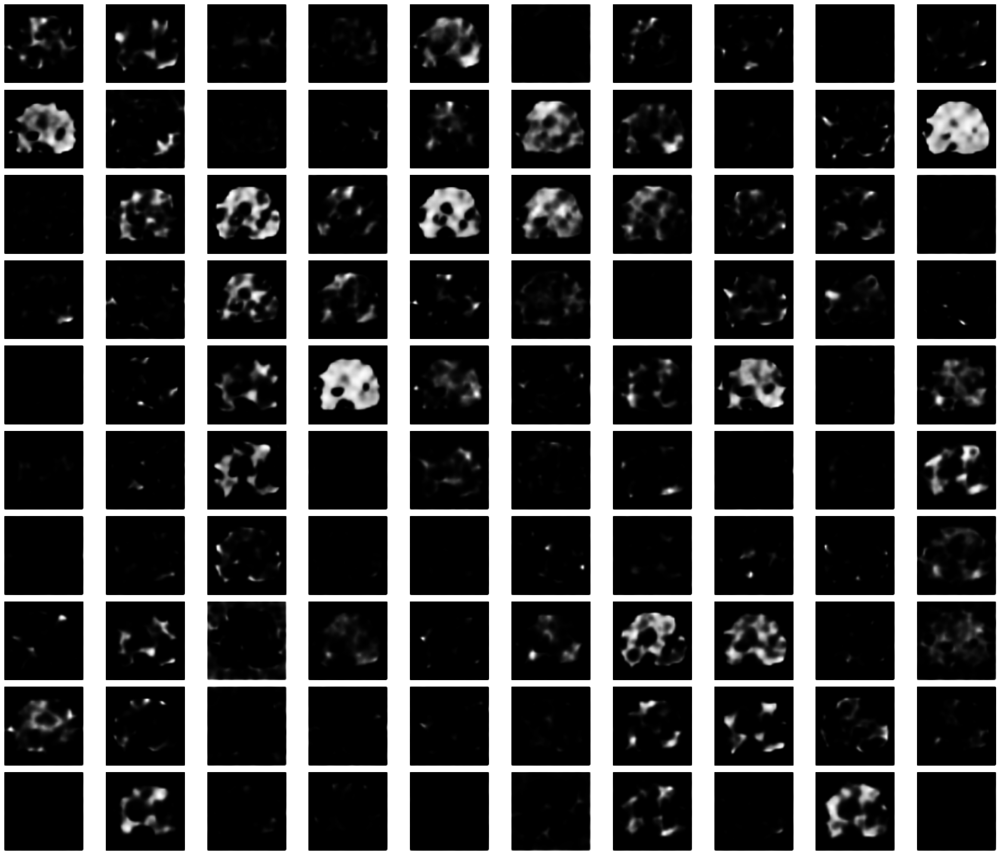

In [31]:
noise = np.random.normal(0, 1, size=(100, NOISE_DIM))
sample_images(noise, (10,10), (24,20), save=True)

# Testing the Generated sample: Plotting the Distributions

<p style="font-size:20px">In this test, we compare the generated images with the real samples by plotting their distributions. If the distributions overlap, that indicates the generated samples are very close to the real ones
</p>

In [32]:
generated_images = generator.predict(noise)
generated_images.shape

4/4 [==============================] - 1s 209ms/step


(100, 128, 128, 1)

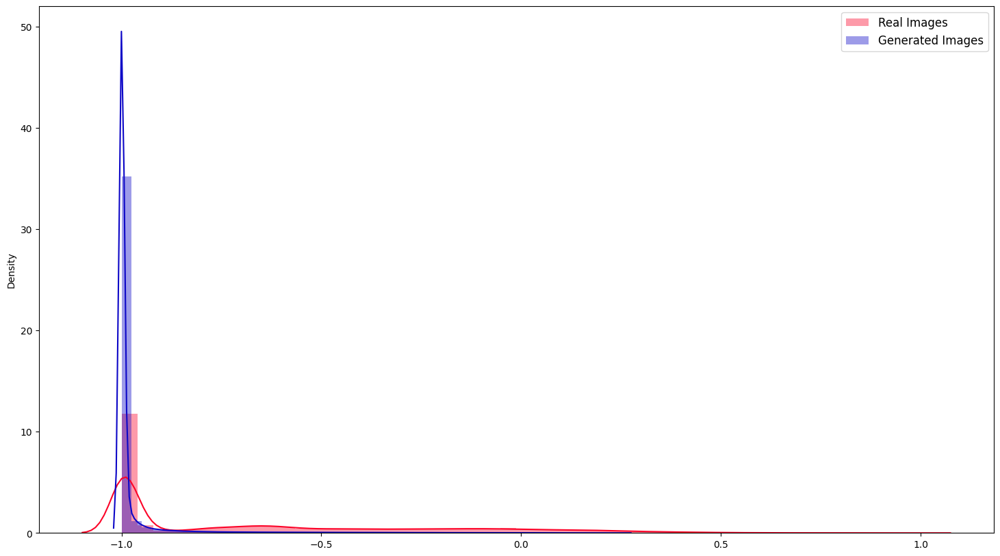

In [33]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()

# Conclusion

<p style="font-size:20px">
    As we can see from the plot, the distribution of Generated Images is approximately the same as that of the Real Images. From this we can conclude that the generated images are a true representative of the real ones, capturing most of the variations.
</p>

# References

<p style="font-size:20px">
<ul>
    <li style="font-size:20px"><a href="https://arxiv.org/abs/1406.2661">Generative Adversarial Networks</a> (2014)</li>
    <li style="font-size:20px"><a href="https://arxiv.org/abs/1606.03498">Improved Techniques for Training GANs</a> (2016)</li>
    <li style="font-size:20px"><a href="https://arxiv.org/abs/2108.03235">SMOTified-GAN for class imbalanced pattern classification problems</a> (2021)</li>
</ul>
</p>